# Library

The library section loads the required libraries required for executing the simulation.

**Note:** If any of the libraries are not present in the local system or if there is any error while importing the required library. Uncomment the library from the below cell and run the cell, later on, re-run the following import cell.

In [1]:
#! pip install matplotlib
#! pip install pulp
#! pip install math
#! pip install random
#! pip install pandas
#! pip install numpy
#! pip install simpy
#! pip install pickle

In [2]:
import matplotlib.pyplot as plt
import pulp
import math
import random
import pandas as pd
import numpy as np
import simpy
import pickle

# Utilities

The utility section contains the essential functions and formulas for generating the test data.

**Note:**  The code in the utility function must not be overwritten or modified.

## Points and Distances

In [3]:
resolution = 10000  # city of about 10km diameter

In [4]:
def dist(p1, p2):
    (x1, y1) = p1
    (x2, y2) = p2
    return int(math.sqrt((x1-x2)**2+(y1-y2)**2))

In [5]:
def nearest(X, P):
    minD = math.inf
    minP = None
    for p in P:
        d=dist(X, p)
        if d<minD:
            minP, minD = p, d
    return minP     

In [6]:
def generatePoints(n):
    
    def gen():
        x = int(random.gauss(mu=resolution/2, sigma=resolution/8))
        return min(resolution-50, max(50, x))
    
    mindist = resolution/(2*math.sqrt(n)) 
    # avoid points to neart to each other
    P = []
    while len(P)<n:
        i=len(P)
    
        x0=gen()
        y0=gen()
        
        # don't place new points near existing points
        P.append((x0,y0))
        for j in range(0,i):
            if dist(P[i],P[j])<mindist:
                P=P[:-1]
                break
    return P

## Lines

Lines are represented as pairs of Points, but there is no preferred order of points.

In [7]:
def equalLines(l1, l2):
    if l1==l2:
        return True
    else:
        return l1[0]==l2[1] and l1[1]==l2[0]

In [8]:
def rev(L):
    return L[1],L[0]

In [9]:
def solve(x11, x12, y1, x21, x22, y2):
    
    def Det(x11, x12, x21, x22):
        return x11*x22-x21*x12

    D = Det(x11, x12, x21, x22)
    Ds = Det(y1, x12, y2, x22)
    Dt = Det(x11, y1, x21, y2)
    if D==0:
        return False
    s=Ds/D
    t=Dt/D
    return 0 <= s and s <= 1 and 0 <= t and t <= 1
    
def intersecting(l1, l2):
    p1, p2 = l1
    q1, q2 = l2
    if p1==q1 or p1==q2 or p2==q1 or p2==q2:
        return False
    xp1, yp1 = p1
    xp2, yp2 = p2
    xq1, yq1 = q1
    xq2, yq2 = q2
    return solve(xp2-xp1, xq1-xq2, xq1-xp1,
                 yp2-yp1, yq1-yq2, yq1-yp1)

## Triangles

In [10]:
def equalTriangles(t1, t2):
    P1, P2, P3 = t1
    Q1, Q2, Q3 = t2
    if P1==Q1:
        if P2==Q2:
            return P3==Q3
        elif P2==Q3:
            return P3==Q2
        else:
            return False
    elif P1==Q2:
        if P2==Q1:
            return P3==Q3
        elif P2==Q3:
            return P3==Q1
        else:
            return False
    elif P1==Q3:
        if P2==Q1:
            return P3==Q2
        elif P2==Q2:
            return P3==Q1
        else:
            return False
    else:
        return False

In [11]:
def removeTriangle(t, T):
    for tt in T:
        if equalTriangles(t, tt):
            T.remove(tt)
            return True
    return False

In [12]:
def addTriangle(t, T):
    for tt in T:
        if equalTriangles(t, tt):
            return
    T.append(t)

In [13]:
def area(p1, p2, p3):
    x1, y1 = p1
    x2, y2 = p2
    x3, y3 = p3
    return abs(x1*(y2-y3)+x2*(y3-y1)+x3*(y1-y2))/2

In [14]:
def insideTriangle(x, t):
    p, q, r = t
    if x==p or x==q or x==r:
        return False
    return abs(area(p,q,x) + area(p,r,x)+ area(q,r,x) - area(p,q,r))<0.00001

In [15]:
def sides(t):
    A, B, C = t
    return [(B, C), (C, A), (A, B)]

In [16]:
def longestSide(t):
    return sorted(sides(t), key=lambda s: dist(s[0], s[1]), reverse=True)[0]

In [17]:
def commonSide(t1, t2):
    S1 = sides(t1)
    S2 = sides(t2)
    for s1 in S1:
        for s2 in S2:
            if equalLines(s1, s2):
                return s1
    return None

In [18]:
def oppositePoint(t, l):
    A, B, C = t
    P, Q = l
    if A==P:
        return C if B==Q else B
    elif A==Q:
        return C if B==P else B
    else:
        return A

In [19]:
def intersectingTriangles(c1, c2):
    c= commonSide(c1, c2)
    if c is None:
        return False
    A, B = c
    C1 = oppositePoint(c1, c)
    C2 = oppositePoint(c2, c)
    return intersecting((A, C1), (B,C2)) or \
            intersecting((A, C2), (B, C1))

def intersectingLines(c1, c2):
    c= commonSide(c1, c2)
    if c is None:
        return None
    A, B = c
    C1 = oppositePoint(c1, c)
    C2 = oppositePoint(c2, c)
    if intersecting((A, C1), (B,C2)):
        return (A, C1), (B,C2)
    elif intersecting((A, C2), (B, C1)):
        return (A, C2), (B, C1)
    else:
        return None

In [20]:
def defuse(t1, t2):
    # is only called if intersectingTriangles(t1, t2)
    l1, l2 = intersectingLines(t1, t2)
    c = commonSide(t1, t2)
    if c is None:
        return None
    A, B = c
    C1 = oppositePoint(t1, c)
    C2 = oppositePoint(t2, c)
    if intersecting((A, C1), (B,C2)):
        return [C1, C2, A]
    elif intersecting((A, C2), (B, C1)):
        return [C1, C2, B]

In [21]:
def slimTriangle(t):
    A, B, C = t
    a = dist(B,C)
    b = dist(A,C)
    c = dist(A,B)
    [a, b, c] = sorted([a, b, c])
    return a+b<1.07*c

In [22]:
def plotTriangle(t, style='r-o', lw=1, ms=3):
    p1, p2, p3 = t
    plt.plot( [ p1[0], p2[0], p3[0], p1[0] ],
              [ p1[1], p2[1], p3[1], p1[1] ], 
              style, lw=lw, ms=ms)

def plotTriangles(T, style='r-o', lw=1, ms=3):
    plt.xlim(0,resolution)
    plt.ylim(0,resolution)
    plt.axis('off')
    for t in T:
        plotTriangle(t, style, lw=lw, ms=ms)
    plt.show()

## Triangulation

The triangulation algorithm is only a slightly modified version as documented by:

Agryzkov T., Oliver J.L., Tortosa L., Vicent J.F. (2014) [A Method to Triangulate a Set of Points in the Plane](https://link.springer.com/chapter/10.1007/978-3-319-09129-7_25). In: Murgante B. et al. (eds) Computational Science and Its Applications – ICCSA 2014. ICCSA 2014. Lecture Notes in Computer Science, vol 8580. Springer, Cham
[DOI 10.1007/978-3-319-09129-7_25](https://doi.org/10.1007/978-3-319-09129-7_25)

In [23]:
def triangulation(P, show=False):
    x = [ p[0] for p in P ]
    y = [ p[1] for p in P ]
    minx = min(x)
    maxx = max(x)
    miny = min(y)
    maxy = max(y)
    nmaxx = 1.1 * maxx
    nmaxy = 1.1 * maxy
    nminx = max(0.5 * minx, 0)
    nminy = max(0.5 * miny, 0)
    distx = nmaxx-nminx
    disty = nmaxy-nminy
    d = math.sqrt(distx*disty/(2*len(P)))
    dx = math.ceil(distx/d)
    dy = math.ceil(disty/d)

        
    def kx(i):
        return nminx+i*d
    
    def ky(j):
        return nminy+j*d
    
    def k(i, j):
        return (kx(i), ky(j))
    
    # def n(i, j):
    #     return nearest( (kx(i), ky(j)), P)
    def n(i, j):
        X = (kx(i), ky(j))
        minD = math.inf
        minP = None
        for p in P:
            d=dist(X, p)
            if d<minD:
                minP, minD = p, d
        return minP  

    if show:

        plt.figure(0)
        plt.xlim(0,resolution)
        plt.ylim(0,resolution)
        plt.axis('off')
    
        plt.plot([ p[0] for p in P ], 
                 [ p[1] for p in P ], 'ro', ms=10)    
    
        for i in range(0, dx+1):
            for j in range(0, dy):
                plt.plot( [ kx(i), kx(i) ],
                          [ ky(j), ky(j+1) ], 'b:.')
            
        for j in range(0, dy+1):
            for i in range(0, dx):
                plt.plot( [ kx(i), kx(i+1) ],
                          [ ky(j), ky(j) ], 'b:.')
            
        for i in range(0, dx):
            for j in range(0, dy):
                plt.plot( [ kx(i), kx(i+1) ],
                          [ ky(j), ky(j+1) ], 'b:.')
    
        for i in range(0, dx+1):
            for j in range(0, dy+1):
                nx, ny = n(i,j)
                plt.plot( [ kx(i), nx ],
                          [ ky(j), ny ], 'g:')


    
    # set of triangles
    T = []
    for i in range(0, dx):
        for j in range(0, dy):
            p1=n(i,j)
            p2=n(i+1, j)
            p3=n(i, j+1)
            p4=n(i+1, j+1)
            if p1!=p2 and p2!=p4 and p4!=p1:
                addTriangle([p1, p2, p4], T)
            if p1!=p3 and p3!=p4 and p4!=p1:
                addTriangle([p1, p3, p4], T)
                  
    # Replace a triangle containing an inner point
    # with three triangles formed from this inner point
    C = T.copy()
    for p in P:
        for t in T:
            if insideTriangle(p, t):
                p1, p2, p3 = t
                C.remove(t)
                C.append( (p1, p2, p) )
                C.append( (p2, p3, p) )
                C.append( (p3, p1, p) )
         
    PLOT = 0
    
    def showTriangulation(T, style='r-o', check=False):
        nonlocal PLOT
        PLOT += 1
        plt.figure(PLOT)
        plt.xlim(0,resolution)
        plt.ylim(0,resolution)
        plt.axis('off')
        for t in T:
            plotTriangle(t, 'r-o', lw=0.5)
        
        if check:
            found=False
            for t1 in T:
                for t2 in T:
                    if t1!=t2 and intersectingTriangles(t1, t2):
                        plotTriangle(t1, 'b-o')
                        plotTriangle(t2, 'g-o')
                        found=True
                        break
                if found:
                    break
  
    found = True
    while found:
        
        if show:
            showTriangulation(C)
        
        D=C.copy()
        found = False
        for c1 in C:
            for c2 in C:
                if c1!=c2 and intersectingTriangles(c1, c2):
                    # print(f"replacing")
                    # print(triangle_String(c1))
                    # print(triangle_String(c2))
                    c3=defuse(c1, c2)
                    removeTriangle(c2, D)
                    # print(triangle_String(c3))
                    addTriangle(c3, D)
                    found=True
                    break
            if found:
                break
        C=D
        
    # Check for isolated points
    # This can now probably not happen anymore, 
    # but just leave it in for now
    
    def isolated(p, C):
        for c in C:
            p1, p2, p3 = c
            if p==p1 or p==p2 or p==p3:
                return False
        return True
    
    for p in P:
        if isolated(p, D):
            plt.plot( [ p[0] ], [ p[1] ], 'ko', ms=15)
                    
    return C

## Graphs

In [24]:
def element(p, S):
    for s in S:
        if s==p: # s[0]==p[0] and s[1]==p[1]:
            return True
    return False
        
def vertices(T):
    S = []
    for t in T:
        A, B, C = t
        if not element(A, S):
            S.append(A)
        if not element(B, S):
            S.append(B)
        if not element(C, S):
            S.append(C)
    return sorted(S, key=lambda p: p[0])

def edges(T):
    S = []
    for t in T:
        A, B, C = sides(t)
        if not element(A, S) and not element(rev(A), S):
            S.append(A)
        if not element(B, S) and not element(rev(B), S):
            S.append(B)
        if not element(C, S) and not element(rev(C), S):
            S.append(C)
    return sorted(S, key=lambda p: p[0][0])

def graph(T):
    return vertices(T), edges(T)

## Lists and Paths

In [25]:
def pathLength(P):
    return 0 if len(P)<=1 else \
            dist(P[0], P[1])+pathLength(P[1:])

In [26]:
def reverse(P):
    return [ P[-i] for i in range(1,len(P)+1) ]

In [27]:
def index(x, L):
    for i in range(len(L)):
        if x==L[i]: 
            return i
    return None

In [28]:
def addWithoutDuplicates(L, X):
    for i in range(len(X)):
        if X[i] not in L:
            L.append(X[i])
    return L

## Maps

The following function creates a map of the town required for the simulation.

In [29]:
def createMap(P, p=0.2):
    T = triangulation(P)
    V, E = graph(T)
    
    for t in T:
        if slimTriangle(t):
            s = longestSide(t)
            if s in E:
                E.remove(s)
            elif (s[1], s[0]) in E:
                E.remove((s[1], s[0]))
        else:
            for tt in T:
                if not equalTriangles(t, tt):
                    s = commonSide(t, tt)
                    if s is None:
                        continue
                    if random.random()<p:
                        if s in E:
                            E.remove(s)
                            break
                        elif (s[1], s[0]) in E:
                            E.remove((s[1], s[0]))
                            break
                    
    return V, E

## Place Warehouse Somewhere Inside

The following function places a warehouse somewhere in the above-created map of the town.

In [30]:
def placeWarehouse(M):
    V, _ = M
    dmin = math.inf
    pos = (random.randint(resolution/4, resolution*3/4),
            random.randint(resolution/4, resolution*3/4))
    for p in V:
        dp = dist(p, pos)
        if dp<dmin:
            w = p
            dmin = dp
    return w

## Generate Delivery Points

The following function generates delivery points on the map of the town.

In [31]:
def splitEdge(V, E, s):
    A, B = s
    p = random.uniform(0.2,0.8)
    x = int(A[0]+p*(B[0]-A[0]))
    y = int(A[1]+p*(B[1]-A[1]))
    t = (x,y)
    E.remove(s) 
    E.append((A, t))
    E.append((t, B))
    V.append(t)
    return (V, E), t

In [32]:
def addTargets(M, n=5):
    V, E = M
    V, E = V.copy(), E.copy()
    T = []
    # we want to ensure that the beginning of the 
    # sequence of points generated randomly stays
    # the same
    mindist = 0.05
    while len(T)<n:
        S = random.sample(E, 1)
        s = S[0]
        A, B = s
        if dist(A,B)>resolution/20: # avoid targets placed narrowly
            (V, E), t = splitEdge(V, E, s)
            T.append(t)
    return (V, E), T

## Plot Map with Delivery Route

The following function plots a map of the town with a delivery route to each delivery point.

In [33]:
def plotMap(G, T=[], P=[], w=None,
            style='r-o', lw=1, ms=3, 
            styleT='go', msT=5,
            styleP='b-o', lwP=3, msP=1,
            stylePT='go', msPT=7,
            styleW='bo', msW=7,
            text=None, grid=False):
    fig = plt.gcf()
    fig.set_size_inches(6, 6)
    plt.xlim(0,resolution)
    plt.ylim(0,resolution)
    if not grid:
        plt.axis('off')
    V, E = G
    for e in E:
        p1, p2 = e
        plt.plot( [ p1[0], p2[0] ],
                  [ p1[1], p2[1] ], 
                  style, lw=lw, ms=ms)
    for t in T:
        plt.plot( [ t[0] ], [ t[1] ], 
                  styleT, ms=msT)
    plt.plot( [ p[0] for p in P ],
              [ p[1] for p in P ], 
              styleP, lw=lwP, ms=msP)
    for p in P:
        if p in T:
            plt.plot( [ p[0] ], [ p[1] ], 
                      stylePT, ms=msPT)
    if w is not None:
        plt.plot( [ w[0] ], [ w[1] ], 
                      styleW, ms=msW)
    if text is not None:
        plt.text(0.8*resolution, 0, text)
    if grid:
        plt.grid()
    plt.show()

## Data Generator

The following function generates the data required for the simulation.

In [34]:
def generateData(seed=None, days=None, p=4, plot=False, log=False):

    if seed is None:

        print("Usage:  M, W, C, D = generateData(seed=None, days=None, p=None,")  
        print("                                  plot=False, log=False")
        print("")
        print("  seed  the seed value to be used for data generation. ")
        print("        To test the application use seed=0, it will create")
        print("        a small map, with a very few customer locations and")
        print("        a small set of delivery data.")
        print("        For the generating proper simulation data, use the last")
        print("        four digits of your student ID as seed value.")
        print("")
        print("  days  The number of days for which data are to be generated.")
        print("        It is set by default, but it can be overridden for test")
        print("        purposes or to generate data for larger simulation runs.")
        print("")
        print("  p     The average number of parcels to be generated for each")
        print("        customer over the period of days specified.")
        print("")
        print("  log   Controls print output during data generation.")
        print("")
        print("  plot  Controls graphical output during data generation.")
        print("")
        print("Returns:")
        print("")
        print("  M = (V, E) is the generated map given as a graph")
        print("    where V is a list of vertices, with each vertice ")
        print("    given as a pair (x, y) of integer coordinates, ")
        print("    and E is a list of edges, with each edge given")
        print("    as a pair (A, B) of vertices, with each vertex again")
        print("    given as a pair (x, y) of integer coordinates")
        print("")
        print("  W ∈ V  is the location of the distribution warehouse")
        print("    given as a pair (x, y) of integer coordinates")
        print("")
        print("  C ⊆ V  is a list of customer locations")
        print("    given as pairs (x, y) of integer coordinates")
        print("    len(C) gives the number of customers generated")
        print("") 
        print("  D is a list of delivery data, given as a list of parcels")
        print("    to be delivered, grouped by days. len(D) is the number")
        print("    of days on which parcels are to be delivered. D[i] is the")
        print("    list of parcels to be delivered on day i. Each parcel p is")
        print("    given as index into the customer list C. ")
        
        print("    This is automatically generated, but can be set explicitely")
        print("    by using the parameter ")    
        print("")
        print("")
        print(f"")
        
        seed = 0
    
    if seed==0:  # generate very simple test data 
        n = 10   # number of points in map
        N = 5    # number of  customers
        if days is None:
            days = 4
        if p is None:
            p = 4
        grid = True
            
    else:
        n = 50
        N = 100
        if days is None:
            days = 22
        if p is None:
            p = 4
        grid = False
        
    random.seed(seed)
    
    P = generatePoints(n)
    
    M = createMap(P)
    W = placeWarehouse(M)
    MT, C = addTargets(M, N)


    np.random.seed(seed)
    R = np.random.poisson(N*p/days, days)
    D = [ random.choices(range(len(C)),k=i)
             for i in np.random.poisson(N*p/days, days) ]
    if log:
        print(f"Generated map with {n:d} nodes, " 
              f"{N:d} customer locations, and")
        print(f"delivery data for {sum(R):d} deliveries "
              f"over {days:d} days.")
    if plot:
        label="" if seed==0 else f"seed={seed:4d}"
        plotMap(MT, T=C, w=W, text=label, grid=grid)
    
    return MT, W, C, D

# Generate Data

This section generates data that will be required for simulation.

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 391 deliveries over 22 days.


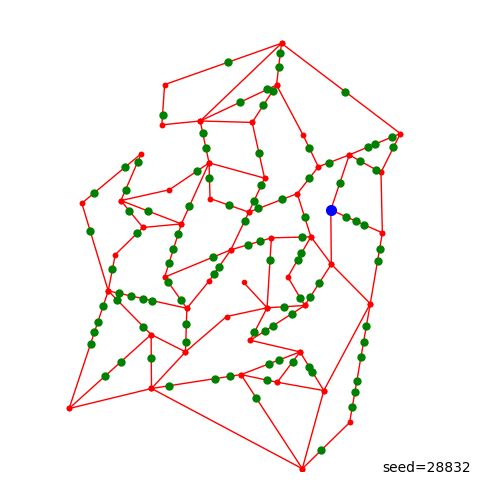

In [35]:
data = generateData(28832, plot=True, log=True)

## Storing generated data into the pickle file

The following function stores the generated data in the pickle file format.

In [36]:
with open('dataSeed28832.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

The following function loads the data from the pickle file.

In [37]:
with open('dataSeed28832.pickled', 'rb') as f:
 M, W, C, D = pickle.load(f)

# Finding the Shortest Path

## The Algorithm

The following function calculates the shortest path. The shortest path is calculated through $A^{*}$ algorithm

In [38]:
def shortestPath(M, A, B):

    def h(p): 
        return pathLength(p)+dist(p[-1],B)
    
    # candidates C are pairs of the path so far and 
    # the heuristic function of that path, 
    # sorted by the heuristic function, as maintained by
    # insert function
    def insert(C, p):
        hp = h(p)
        c = (p, hp)
        for i in range(len(C)):
            if C[i][1]>hp:
                return C[:i]+[c]+C[i:]
        return C+[c]   
        
    V, E = M
    assert(A in V and B in V)    
    C = insert([], [A])

    while len(C)>0:
        # take the first candidate out of the list of candidates
        path, _ = C[0]
        C = C[1:]
        if path[-1]==B:
            return path
        else:
            for (x, y) in E:
                if path[-1]==x and y not in path:
                    C = insert(C, path+[y])
                elif path[-1]==y and x not in path:
                    C = insert(C, path+[x])
    return None

# Finding Shortest Delivery Route

## The Algorithm

The following functions calculates the shortest path between two delivery points in the town. It utilises the algorithm defined in the above sub-section.

In [39]:
def createTables(M, T):

    def reverse(P):
        return [ P[-i] for i in range(1,len(P)+1) ]
    
    def index(x, L):
        for i in range(len(L)):
            if x==L[i]: 
                return i
        return None

    n = len(T)
    d = [ [ math.inf for t in T ] for t in T ]
    p = [ [ None for t in T ] for t in T ]
    for i in range(n):
        d[i][i] = 0
        p[i][i] = [ T[i] ]
    for i in range(n):
        for j in range(n):
            if p[i][j] is None:
                s = shortestPath(M, T[i], T[j])
                d[i][j] = d[j][i] = pathLength(s)
                p[i][j] = s
                p[j][i] = reverse(s)
                for m in range(len(s)-1):
                    smi = index(s[m], T)
                    if smi is None:
                        continue
                    for l in range(m+1, len(s)):
                        sli = index(s[l], T)
                        if sli is None:
                            continue  
                        sub = s[m:l+1]
                        if p[smi][sli] is None:
                            p[smi][sli] = sub
                            p[sli][smi] = reverse(sub)
                            d[smi][sli] = d[sli][smi] = pathLength(sub)
    return d,p               

In [40]:
def roundtrips(x, n):
    
    def isElem(x, l):
        for i in range(len(l)):
            if l[i]==x:
                return True
        return False

    def startpoint(trips):
        for i in range(n):
            for t in trips:
                if isElem(i, t):
                    break
            else:
                return i
    
    def totalLength(trips):
        s=0
        for i in range(0, len(trips)):
            s += len(trips[i])-1
        return s

    trips = []
    while totalLength(trips)<n:
        start = startpoint(trips)
        trip = [ start ]
        i = start
        while len(trip) < n-totalLength(trips):
            for j in range(0, n):
                if pulp.value(x[i][j])==1:
                    trip.append(j)
                    i=j
                    break        
            if pulp.value(x[trip[-1]][start])==1:
                trip.append(start)
                break
        trips.append(trip)
    return sorted(trips, key=lambda t: len(t), reverse=True)

def createLoop(M, T):
    D, P = createTables(M, T)
    n = len(T)
    # create variables
    x = pulp.LpVariable.dicts("x", ( range(n), range(n) ),
                            lowBound=0, upBound=1, cat=pulp.LpInteger)
    # create problem
    prob = pulp.LpProblem("Loop",pulp.LpMinimize)
    # add objective function
    prob += pulp.lpSum([ D[i][j]*x[i][j] 
                             for i in range(n) for j in range(n) ])
    # add constraints
    constraints=0
    for j in range(n):
        prob += pulp.lpSum([ x[i][j] for i in range(n) if i!=j ]) ==1
    constraints += n
    for i in range(n):
        prob += pulp.lpSum([ x[i][j] for j in range(n) if i!=j ]) ==1
    constraints += n
    for i in range(n):
        for j in range(n):
            if i!=j:
                prob += x[i][j]+x[j][i] <= 1
                constraints += 1
    # initialise solver
    solvers = pulp.listSolvers(onlyAvailable=True)
    solver = pulp.getSolver(solvers[0], msg=0)
    # print(f"{constraints:d} Constraints")
    prob.solve(solver)
    trips = roundtrips(x, n)
    while len(trips)>1:
        for t in trips:
            prob += pulp.lpSum([ x[t[i]][t[i+1]] + x[t[i+1]][t[i]]
                            for i in range(0,len(t)-1) ]) <= len(t)-2
            constraints += 1
        # print(f"{constraints:d} Constraints")
        prob.solve(solver)
        trips = roundtrips(x, n)
    trip = trips[0]
    # print(trip)
    loop = []
    for k in range(len(trip)-1):
        sub = P[trip[k]][trip[k+1]]
        loop += sub if len(loop)==0 else sub[1:]
    return loop

## Route for Delivering to all Customers

This section illustrates routes for delivering to all customers in town.

In [41]:
T = [W] + C

In [42]:
P = createLoop(M, T)

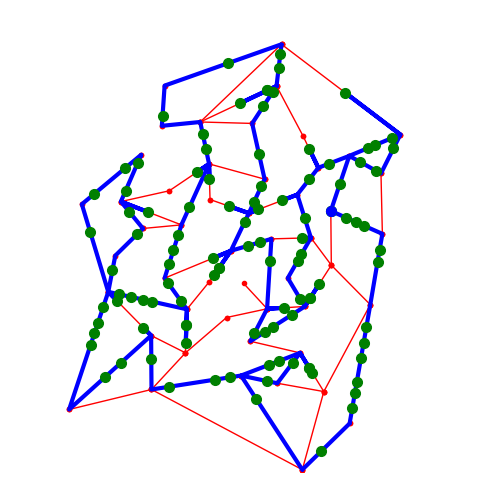

In [43]:
plotMap(M, T=T, w=W, P=P)

# Time Handling Functions

In the simulation, the time is measured in seconds. Time-related methods are summarised in this section.

`timestamp(t)` generates a timestamp string in the form `[dd] hh:mm:ss.d`

In [44]:
def timestamp(t):
    day = int(t)//(24*3600)
    t = t - day*24*3600
    hour = int(t)//3600
    t = t - hour*3600
    mins = int(t)//60
    t = t - mins*60
    secs = int(t)
    t = int(round((t - secs)*10))
    return f"[{day:2d}] {hour:02d}:{mins:02d}:{secs:02d}.{t:1d}"

In [45]:
timestamp(24*3600*3+17*3600+615.1)

'[ 3] 17:10:15.1'

In [46]:
def nextHour(env, hour):
    beginningOfDay = int(env.now//(24*3600))*24*3600
    timeOfDay = env.now-beginningOfDay
    if hour*3600 > timeOfDay:
        return hour*3600 - timeOfDay
    else:
        return hour*3600 + 24*3600 - timeOfDay

In [47]:
def day(now):
    return int(now//(24*3600))

# Class Recorder

The recorder class logs data related to different events and activities that occur in the simulation.

In [48]:
class Recorder:
    
    def __init__(self, env, M, W, C, days, 
                 log=False, plot=False):
        self.env = env
        self.M = M
        self.W = W
        self.C = C
        self.days = days
        self.log = log
        self.plot = plot
        Customer.REGISTER = []
        Parcel.REGISTER = []
        
        # create a data frame for time records per working day
        self.daily = pd.DataFrame()
        self.daily['begin'] = [None]*days
        self.daily['end'] = [None]*days
        self.daily['dist'] = [None]*days
        self.daily['time'] = [None]*days
        self.daily['left'] = [None]*days
        self.daily['delay'] = [None]*days
        
    def trace(self, event):
        if self.log:
            print(timestamp(self.env.now), event)
            
    def recordTourLength(self, length):
        self.daily.at[day(self.env.now), 'dist'] = int(length)
        
    def recordParcelsLeftOver(self, numberOfParcels):
        self.trace(f'{numberOfParcels:d} left over for next day')
        self.daily.at[day(self.env.now), 'left'] = numberOfParcels
        
    def recordDriverBeginsWork(self):
        self.trace("Driver arrives for work")
        self.daily.at[day(self.env.now), 'begin'] = int(round(self.env.now))
        
    def recordDriverEndsWork(self):
        self.trace("Driver goes home")
        self.daily.at[day(self.env.now), 'end'] = int(round(self.env.now))
        
    def recordParcelDelayTime(self, delayTime):
        self.daily.at[day(self.env.now), 'delay'] = int(round(delayTime))
        
    def finish(self):
        self.daily['time'] = self.daily['end']-self.daily['begin']

# Class Parcel

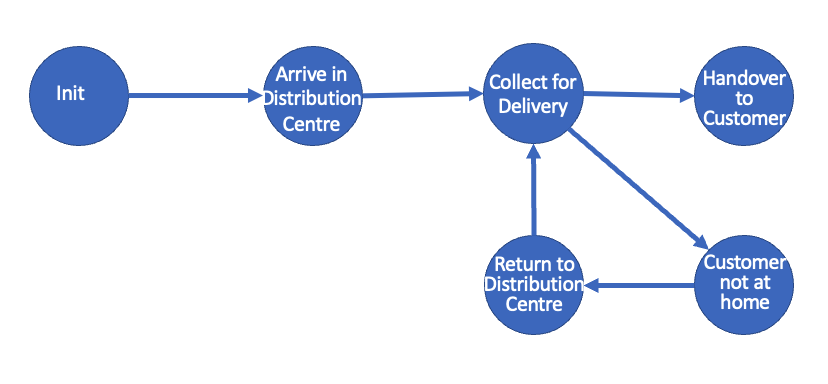

Parcels follow through a sequence of states:
- processing
- in transit (from manufacture to distribution centre)
- arrived in distribution centre
- ready for delivery 
- out for delivery
- customer not present
- returned to distribution centre
- delivered

In [49]:
class Parcel:
    
    REGISTER = []
    
    def __init__(self, rec, i, cust):
        self.rec = rec
        self.i = i  # row index in data frames of input data
        self.dest = cust.location
        self.status = [ 'processing' ] # status record and
        self.timing = [ self.rec.env.now ]      # timing
        assert(len(Parcel.REGISTER)==i)
        Parcel.REGISTER += [ self ] 
    
    # factory method ensures that there is only
    # one Parcel per location
    def getParcel(rec, i, location):
        for p in Parcel.REGISTER:
            if p.i == i:
                return p
        return Parcel(rec, i, location)

    
    def __str__(self):
        return f"Parcel: {self.i:2d}"

    def index(self):
        return self.i
    
    def destination(self):
        return self.dest
    
    def __reg(self, state):
        self.status += [ state ]
        self.timing += [ self.rec.env.now ]
        self.rec.trace(str(self)+" "+state)
        
    def arrivedAtDeliveryCentre(self):
        self.__reg('arr at delivery centre')
        self.arrival = self.rec.env.now
        self.parcelDelayTime = self.rec.env.now #####
        
    def outForDelivery(self): 
        self.__reg('out for delivery')
        
    def returnFromDelivery(self):
        self.__reg('return from delivery')

# Class Customer

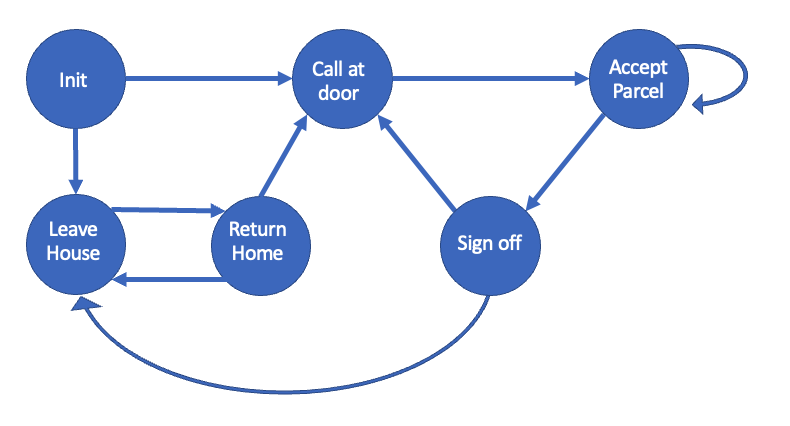

In [50]:
class Customer:
    
    REGISTER = []

    def getCustomerLocations():
        return [ c.location for c in Customer.REGISTER ]
    
    def __init__(self, rec, location):
        self.rec = rec
        self.location = location
        self.i = len(Customer.REGISTER)
        Customer.REGISTER += [ self ]
        self.atHome = True
        self.answersDoor = False
        self.parcelsReceived = []
        rec.env.process(self.process())
        
    def __str__(self):
        return f"Customer: {self.i:2d} {str(self.location):s}"
    
    # factory method ensures that there is only
    # one customer per location
    def getCustomer(rec, location):
        for c in Customer.REGISTER:
            if c.location == location:
                return c
        return Customer(rec, location)
    
    def leaveHouse(self):
        assert(self.atHome and not self.answersDoor)
        # self.rec.trace(str(self)+" leaves house")
        self.atHome = False
     
    def returnHome(self):
        assert(not self.atHome)
        # self.rec.trace(str(self)+" returns home")
        self.atHome = True
        
    def answerDoor(self):
        if self.atHome:
            yield self.rec.env.timeout(random.expovariate(1/40))
            self.rec.trace(str(self)+" answers door")
            self.answersDoor = True
        else:
            yield self.rec.env.timeout(60)
            self.rec(str(self)+" not at home")
            
    def acceptParcel(self, parcel):
        assert(self.answersDoor)
        self.parcelsReceived += [parcel]
        self.rec.trace(str(self)+" accepts "+str(parcel))
        
    def signOff(self):
        assert(self.answersDoor)
        self.rec.trace(str(self)+" signs off")
        self.answersDoor = False
        
    def process(self):
        yield self.rec.env.timeout(nextHour(self.rec.env, 8))
        while day(self.rec.env.now)<self.rec.days:
            # in a refinement we may use random times
            self.leaveHouse()
            yield self.rec.env.timeout(nextHour(self.rec.env, 18))
            self.returnHome()
            yield self.rec.env.timeout(nextHour(self.rec.env, 8))

# Class Driver

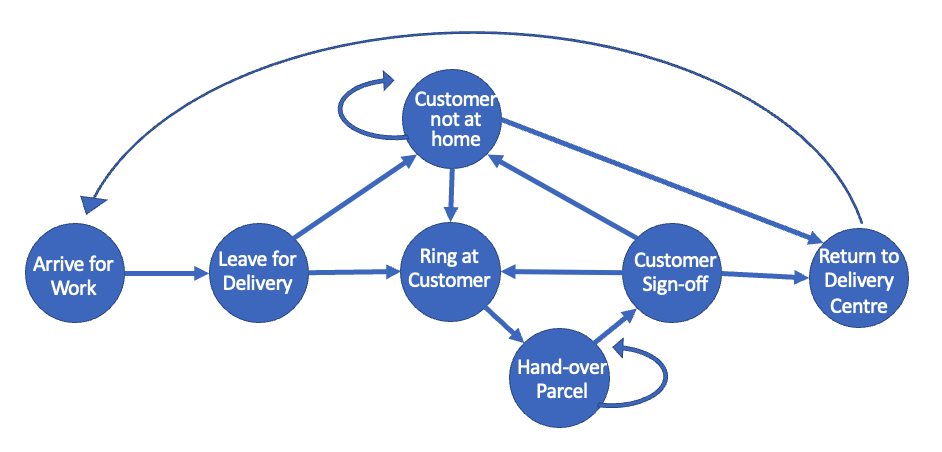

In [51]:
class Driver:
    
    def __init__(self, rec, DC):
        self.rec = rec
        self.DC = DC
        self.location = None
        self.parcels = None
        self.tour = None
        self.delay = None #####
        self.rec.env.process(self.process())
        
    # activity
    def __drive(self, target):
        assert(self.tour[0] == self.location)
        while self.location!=target:
            d = dist(self.location, self.tour[1])
            yield self.rec.env.timeout(d / AVERAGE_SPEED)
            self.location = self.tour[1]
            self.tour = self.tour[1:]
        assert(self.tour[0] == self.location == target)
    
    def arriveForWork(self):
        self.location = self.DC.W
        self.parcels = []
        self.returns = []
        self.delay = 0
        self.tour = [ self.DC.W ]
        self.rec.recordDriverBeginsWork()
        
    def leaveForDelivery(self, tour, parcels):
        self.tour, self.parcels = tour, parcels
        self.rec.trace(f"Driver leaves for delivery " \
                       f"of {len(parcels):d} parcels")
        
    def process(self):
        yield self.rec.env.timeout(nextHour(self.rec.env, 18))
        while day(self.rec.env.now)<self.rec.days:
            self.arriveForWork()
            tour, parcels = self.DC.sendForDelivery()
            yield self.rec.env.timeout(PREP_TIME_PER_PARCEL*len(parcels))
            self.rec.recordTourLength(pathLength(tour))
            self.leaveForDelivery(tour, parcels)        
            while len(self.parcels)>0:
                # drive to customer
                custLocation = self.parcels[0].dest
                cust = Customer.getCustomer(self.rec, custLocation)
                self.rec.trace("Driver drives to "+str(cust))
                yield from self.__drive(custLocation)
                self.rec.trace("Driver arrived at "+str(cust))
                # call at customer
                yield from cust.answerDoor()
                
                if cust.answersDoor:
                    while len(self.parcels)>0 and \
                            custLocation == self.parcels[0].dest:
                        cust.acceptParcel(self.parcels[0])
                        yield self.rec.env.timeout(random.expovariate(1/10))
                        if((self.rec.env.now - self.parcels[0].parcelDelayTime - 86400)>0): #####
                            self.delay += self.rec.env.now - self.parcels[0].parcelDelayTime #####
                        self.parcels = self.parcels[1:]
                    cust.signOff()
                    yield self.rec.env.timeout(random.expovariate(1/10))
                else:
                    self.parcels[0].parcelDelayTime = self.rec.env.now #####
                    while len(self.parcels)>0 and  \
                            custLocation == self.parcels[0].dest:
                        self.returns += self.parcels[0]
                        self.parcels = self.parcels[1:]

            # return to delivery centre
            self.rec.trace("Driver returns to delivery centre")
            yield from self.__drive(self.DC.W)
            self.rec.trace("Driver arrived at delivery centre")
            
            for parcel in self.returns:
                self.DC.returnFromDelivery(parcel)
                yield self.rec.env.timeout(RETURN_TIME_PER_PARCEL)
            yield self.rec.env.timeout(600)
            self.rec.recordParcelsLeftOver(len(self.DC.parcels) + len(self.DC.leftOver))
            self.rec.recordParcelDelayTime(self.delay)
            
            self.rec.recordDriverEndsWork()
            yield self.rec.env.timeout(nextHour(self.rec.env, 18))

# Class Delivery Centre

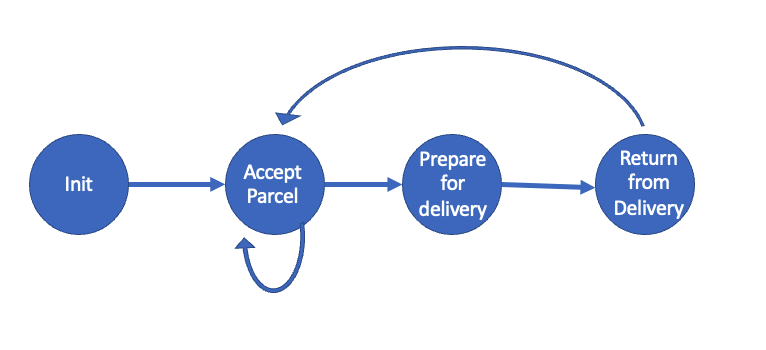

In [52]:
class DeliveryCentre:
    
    def __init__(self, rec, M, W):
        self.rec = rec
        self.M = M
        self.W = W
        self.limit = RANGE
        
        
        self.leftOver = []    # list of parcels
        self.parcels = []     # list of parcels scheduled for delivery
        self.dest = []        # list of unique customer destinations
        self.tour = [W]       # tour planned for delivery
        
    def __accept(self, parcel):
        custLoc = parcel.dest
        if custLoc not in self.dest:
            S = createLoop(self.M, [self.W] + self.dest + [custLoc])
            if pathLength(S)<self.limit:
                self.parcels.append(parcel)
                self.dest += [custLoc]
                self.tour = S
            else:
                self.leftOver.append(parcel)
        else:
            self.parcels.append(parcel)
        
    def acceptParcel(self, parcel):
        parcel.arrivedAtDeliveryCentre()
        self.__accept(parcel)
            
    def sendForDelivery(self):
        parcels = []
        tour = self.tour
        addresses = self.dest
        
        # pick parcels in sequence to be delivered
        for i in range(1, len(tour)-1):
            dest = tour[i]
            for p in self.parcels:
                if p.dest == dest:
                    parcels += [p]
                    p.outForDelivery()
         
        # arrange the left overs
        L = self.leftOver
        self.tour = [self.W]
        self.parcels = []
        self.leftOver = []
        self.dest = []
        for p in L:
            self.__accept(p)
        
        if self.rec.plot:
            plotMap(self.rec.M, T=addresses, P=tour, w=tour[0], 
                    text=f"Day {day(self.rec.env.now):2d}, {pathLength(tour):,d}m")

        return tour, parcels
                 
    def returnFromDelivery(self, parcels):
        for p in parcels:
            p.returnFromDelivery()
            yield self.rec.env.timeout(RETURN_TIME_PER_PARCEL)
            self.__accept(p)
        yield self.rec.env.timeout(600)

# Simulation

## Parameters from Specification

The time required for driving is based on the distance between way points at an average speed of 15km/h.

In [53]:
AVERAGE_SPEED = 15/3.6

The **cumulative preparation time** (route planning and 
sorting of the parcels in the delivery order and 
packing the cargo-bike) is assumed to be 50 sec per 
parcel to be delivered.

In [54]:
PREP_TIME_PER_PARCEL = 50

**Additional assumption:** The time to **process returned parcels** in the delivery centre is 30 sec per parce. 

In [55]:
RETURN_TIME_PER_PARCEL = 30

In [56]:
RANGE = 30000

## Input Data Generator

In [57]:
def generateInputData(D):

    R = [ len(d) for d in D ]
    N = sum(R)
    
    DAY_LENGTH = 24*3600    # measured in minutes
    DAY_START = 8*3600      # first delivery in the morning
    DAY_END = 17*3600     # last delivery during day time

    IARR = (DAY_END-DAY_START-2*3600)*len(D) / N  # measured in minutes

    x = pd.DataFrame()

    x['iarr'] = [None]*N
    x['time'] = [None]*N
    x['day'] = [None]*N
    x['dest'] = [None]*N

    current_day = 0
    delivered_today = 0
    time = DAY_START
    last_time = 0

    for i in range(N):
    
        iat = random.expovariate(1.0/IARR)
        new_time = time + iat
    
        if delivered_today == len(D[current_day]):
            current_day += 1
            delivered_today = 0
            new_time = current_day*DAY_LENGTH + DAY_START + iat
        else:
            new_time = time + iat
    
        iat = new_time - last_time
        last_time = time = new_time
    
        x.at[i, 'iarr'] = round(iat,1)
        x.at[i, 'time'] = round(new_time - current_day*DAY_LENGTH , 1)
        x.at[i, 'day'] = current_day
        x.at[i, 'dest'] = D[current_day][delivered_today]
    
        delivered_today += 1
    
    return x

## Simulation Routine

In [58]:
def simulation(M, W, C, D, log=False, plot=False):
    
    env = simpy.Environment()
    rec = Recorder(env, M, W, C, len(D), log=log, plot=plot)

    x = generateInputData(D)
    
    print(f"Simulating delivery of {len(x):d} parcels "
          f"over {len(D):d} days to {len(C):d} customers")

    def generatorProcess(env):
        
        for c in C:
            Customer.getCustomer(rec, c)           
        DC = DeliveryCentre(rec, M, W)
        D = Driver(rec, DC)
        
        # generate the parcels based on input data x
        for i in range(len(x)):
            yield env.timeout(x.at[i, 'iarr'])
            custLoc = C[x.at[i, 'dest']]
            cust = Customer.getCustomer(rec, custLoc)
            p = Parcel.getParcel(rec, i, cust)
            DC.acceptParcel(p)

    env.process(generatorProcess(env))
    env.run()
    
    rec.finish()
        
    return rec

# Model Verification

The simulation outcome and analytics of the simulation are represented in this section.

## Simulation Outcome

Simulating delivery of 384 parcels over 22 days to 100 customers
[ 0] 08:44:46.3 Parcel:  0 arr at delivery centre
[ 0] 09:18:54.4 Parcel:  1 arr at delivery centre
[ 0] 09:32:02.3 Parcel:  2 arr at delivery centre
[ 0] 09:39:14.9 Parcel:  3 arr at delivery centre
[ 0] 09:56:28.6 Parcel:  4 arr at delivery centre
[ 0] 10:08:58.0 Parcel:  5 arr at delivery centre
[ 0] 10:45:49.2 Parcel:  6 arr at delivery centre
[ 0] 10:54:31.0 Parcel:  7 arr at delivery centre
[ 0] 11:10:05.7 Parcel:  8 arr at delivery centre
[ 0] 11:31:09.8 Parcel:  9 arr at delivery centre
[ 0] 12:28:36.3 Parcel: 10 arr at delivery centre
[ 0] 12:45:30.6 Parcel: 11 arr at delivery centre
[ 0] 12:53:28.6 Parcel: 12 arr at delivery centre
[ 0] 13:27:24.0 Parcel: 13 arr at delivery centre
[ 0] 13:50:34.8 Parcel: 14 arr at delivery centre
[ 0] 13:57:31.1 Parcel: 15 arr at delivery centre
[ 0] 14:55:23.5 Parcel: 16 arr at delivery centre
[ 0] 16:33:08.0 Parcel: 17 arr at delivery centre
[ 0] 17:13:07.3 Parcel: 18 arr at d

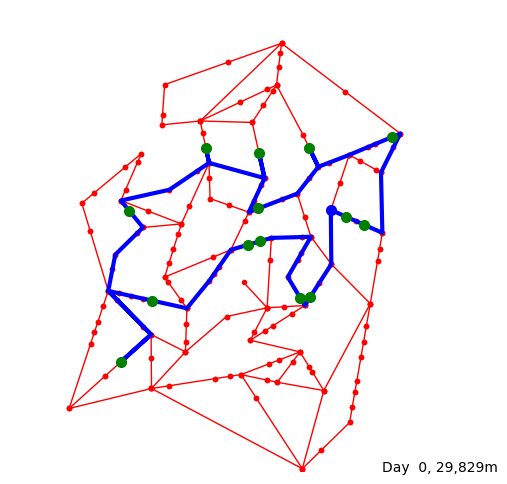

[ 0] 18:09:03.3 Parcel: 19 arr at delivery centre
[ 0] 18:12:30.0 Driver leaves for delivery of 15 parcels
[ 0] 18:12:30.0 Driver drives to Customer: 79 (7227, 5504)
[ 0] 18:13:56.2 Driver arrived at Customer: 79 (7227, 5504)
[ 0] 18:14:30.3 Customer: 79 (7227, 5504) answers door
[ 0] 18:14:30.3 Customer: 79 (7227, 5504) accepts Parcel: 17
[ 0] 18:14:41.6 Customer: 79 (7227, 5504) signs off
[ 0] 18:14:57.10 Driver drives to Customer: 93 (7622, 5327)
[ 0] 18:16:41.7 Driver arrived at Customer: 93 (7622, 5327)
[ 0] 18:17:38.4 Customer: 93 (7622, 5327) answers door
[ 0] 18:17:38.4 Customer: 93 (7622, 5327) accepts Parcel:  6
[ 0] 18:17:59.3 Parcel: 20 arr at delivery centre
[ 0] 18:18:24.10 Customer: 93 (7622, 5327) signs off
[ 0] 18:18:38.7 Driver drives to Customer: 53 (8211, 7227)
[ 0] 18:30:06.6 Driver arrived at Customer: 53 (8211, 7227)
[ 0] 18:31:41.1 Customer: 53 (8211, 7227) answers door
[ 0] 18:31:41.1 Customer: 53 (8211, 7227) accepts Parcel:  2
[ 0] 18:31:43.4 Customer: 53 (82

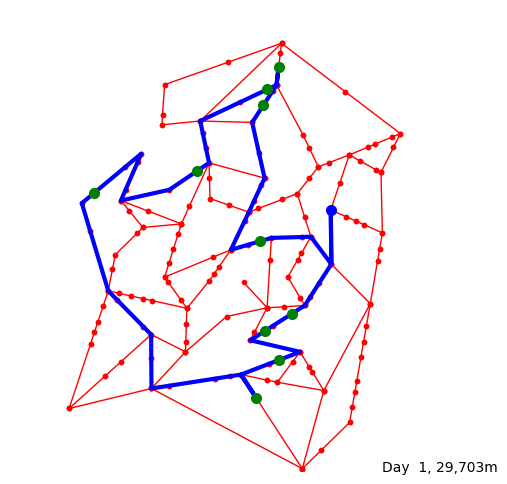

[ 1] 18:09:10.0 Driver leaves for delivery of 11 parcels
[ 1] 18:09:10.0 Driver drives to Customer: 13 (6067, 3408)
[ 1] 18:19:23.7 Driver arrived at Customer: 13 (6067, 3408)
[ 1] 18:20:01.5 Customer: 13 (6067, 3408) answers door
[ 1] 18:20:01.5 Customer: 13 (6067, 3408) accepts Parcel: 26
[ 1] 18:20:06.4 Customer: 13 (6067, 3408) signs off
[ 1] 18:20:06.9 Driver drives to Customer: 23 (5474, 3026)
[ 1] 18:22:55.9 Driver arrived at Customer: 23 (5474, 3026)
[ 1] 18:23:21.3 Customer: 23 (5474, 3026) answers door
[ 1] 18:23:21.3 Customer: 23 (5474, 3026) accepts Parcel: 12
[ 1] 18:23:22.10 Customer: 23 (5474, 3026) signs off
[ 1] 18:23:23.3 Driver drives to Customer: 54 (5791, 2405)
[ 1] 18:31:09.1 Driver arrived at Customer: 54 (5791, 2405)
[ 1] 18:31:47.6 Customer: 54 (5791, 2405) answers door
[ 1] 18:31:47.6 Customer: 54 (5791, 2405) accepts Parcel: 29
[ 1] 18:31:57.5 Customer: 54 (5791, 2405) signs off
[ 1] 18:31:58.6 Driver drives to Customer: 60 (5300, 1573)
[ 1] 18:37:56.7 Driver

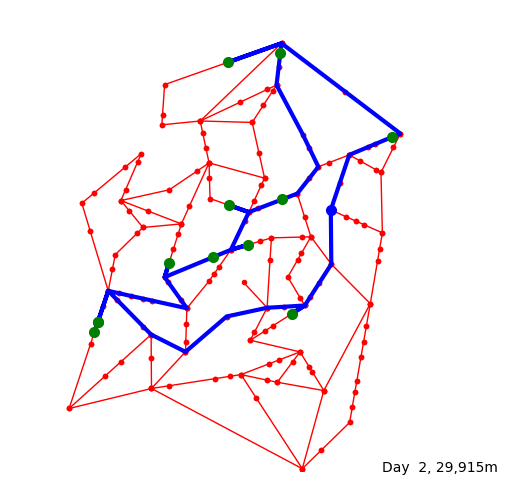

[ 2] 18:10:00.0 Driver leaves for delivery of 12 parcels
[ 2] 18:10:00.0 Driver drives to Customer: 53 (8211, 7227)
[ 2] 18:18:58.8 Driver arrived at Customer: 53 (8211, 7227)
[ 2] 18:20:00.4 Customer: 53 (8211, 7227) answers door
[ 2] 18:20:00.4 Customer: 53 (8211, 7227) accepts Parcel: 22
[ 2] 18:20:02.5 Customer: 53 (8211, 7227) signs off
[ 2] 18:20:17.7 Driver drives to Customer: 24 (4686, 8847)
[ 2] 18:38:51.1 Driver arrived at Customer: 24 (4686, 8847)
[ 2] 18:39:14.6 Customer: 24 (4686, 8847) answers door
[ 2] 18:39:14.6 Customer: 24 (4686, 8847) accepts Parcel: 25
[ 2] 18:39:28.7 Customer: 24 (4686, 8847) signs off
[ 2] 18:39:34.8 Driver drives to Customer: 15 (5813, 9044)
[ 2] 18:45:20.2 Driver arrived at Customer: 15 (5813, 9044)
[ 2] 18:46:22.5 Customer: 15 (5813, 9044) answers door
[ 2] 18:46:22.5 Customer: 15 (5813, 9044) accepts Parcel: 30
[ 2] 18:46:23.3 Customer: 15 (5813, 9044) signs off
[ 2] 18:46:23.7 Driver drives to Customer:  0 (5854, 5879)
[ 2] 19:01:26.1 Driver 

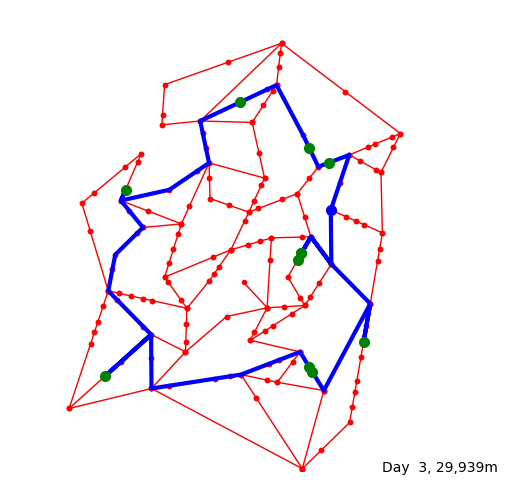

[ 3] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 3] 18:11:40.0 Driver drives to Customer: 97 (6268, 4714)
[ 3] 18:20:57.0 Driver arrived at Customer: 97 (6268, 4714)
[ 3] 18:22:37.7 Customer: 97 (6268, 4714) answers door
[ 3] 18:22:37.7 Customer: 97 (6268, 4714) accepts Parcel: 36
[ 3] 18:23:10.5 Customer: 97 (6268, 4714) signs off
[ 3] 18:23:23.3 Driver drives to Customer: 62 (6189, 4576)
[ 3] 18:24:01.5 Driver arrived at Customer: 62 (6189, 4576)
[ 3] 18:24:04.7 Customer: 62 (6189, 4576) answers door
[ 3] 18:24:04.7 Customer: 62 (6189, 4576) accepts Parcel: 45
[ 3] 18:24:05.5 Customer: 62 (6189, 4576) accepts Parcel: 47
[ 3] 18:24:09.9 Customer: 62 (6189, 4576) signs off
[ 3] 18:24:10.2 Driver drives to Customer: 97 (6268, 4714)
[ 3] 18:24:48.4 Driver arrived at Customer: 97 (6268, 4714)
[ 3] 18:25:05.5 Customer: 97 (6268, 4714) answers door
[ 3] 18:25:05.5 Customer: 97 (6268, 4714) accepts Parcel: 36
[ 3] 18:25:05.6 Customer: 97 (6268, 4714) signs off
[ 3] 18:25:42.2 Drive

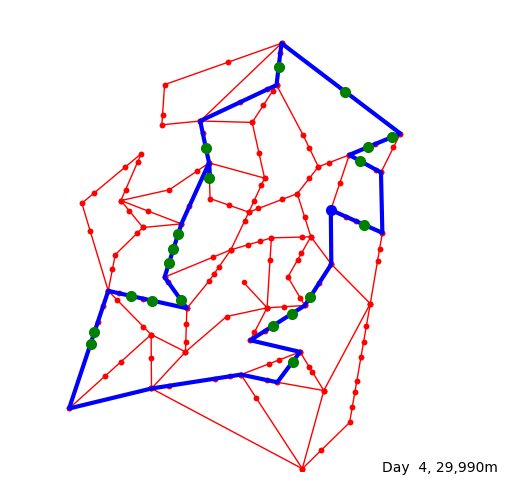

[ 4] 18:20:50.0 Driver leaves for delivery of 25 parcels
[ 4] 18:20:50.0 Driver drives to Customer: 36 (6453, 3761)
[ 4] 18:28:55.5 Driver arrived at Customer: 36 (6453, 3761)
[ 4] 18:32:13.7 Customer: 36 (6453, 3761) answers door
[ 4] 18:32:13.7 Customer: 36 (6453, 3761) accepts Parcel: 64
[ 4] 18:32:14.8 Customer: 36 (6453, 3761) signs off
[ 4] 18:32:23.5 Driver drives to Customer: 13 (6067, 3408)
[ 4] 18:34:31.7 Driver arrived at Customer: 13 (6067, 3408)
[ 4] 18:34:38.5 Customer: 13 (6067, 3408) answers door
[ 4] 18:34:38.5 Customer: 13 (6067, 3408) accepts Parcel: 68
[ 4] 18:35:01.3 Customer: 13 (6067, 3408) signs off
[ 4] 18:35:30.4 Driver drives to Customer: 29 (5661, 3147)
[ 4] 18:37:26.1 Driver arrived at Customer: 29 (5661, 3147)
[ 4] 18:38:31.3 Customer: 29 (5661, 3147) answers door
[ 4] 18:38:31.3 Customer: 29 (5661, 3147) accepts Parcel: 41
[ 4] 18:38:35.1 Customer: 29 (5661, 3147) signs off
[ 4] 18:38:37.9 Driver drives to Customer: 52 (6082, 2369)
[ 4] 18:46:24.5 Driver 

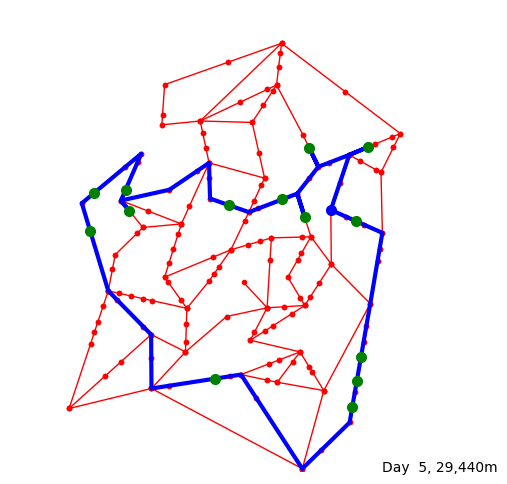

[ 5] 18:17:30.0 Driver leaves for delivery of 21 parcels
[ 5] 18:17:30.0 Driver drives to Customer: 58 (7707, 7015)
[ 5] 18:24:17.8 Driver arrived at Customer: 58 (7707, 7015)
[ 5] 18:25:14.9 Customer: 58 (7707, 7015) answers door
[ 5] 18:25:14.9 Customer: 58 (7707, 7015) accepts Parcel: 95
[ 5] 18:25:17.5 Customer: 58 (7707, 7015) signs off
[ 5] 18:25:31.9 Driver drives to Customer:  3 (6435, 6994)
[ 5] 18:31:58.3 Driver arrived at Customer:  3 (6435, 6994)
[ 5] 18:32:11.4 Customer:  3 (6435, 6994) answers door
[ 5] 18:32:11.4 Customer:  3 (6435, 6994) accepts Parcel: 88
[ 5] 18:32:52.8 Customer:  3 (6435, 6994) signs off
[ 5] 18:32:54.1 Driver drives to Customer: 27 (6339, 5488)
[ 5] 18:36:38.8 Parcel: 101 arr at delivery centre
[ 5] 18:39:49.0 Driver arrived at Customer: 27 (6339, 5488)
[ 5] 18:41:15.1 Customer: 27 (6339, 5488) answers door
[ 5] 18:41:15.1 Customer: 27 (6339, 5488) accepts Parcel: 59
[ 5] 18:41:15.5 Customer: 27 (6339, 5488) accepts Parcel: 71
[ 5] 18:41:18.5 Custom

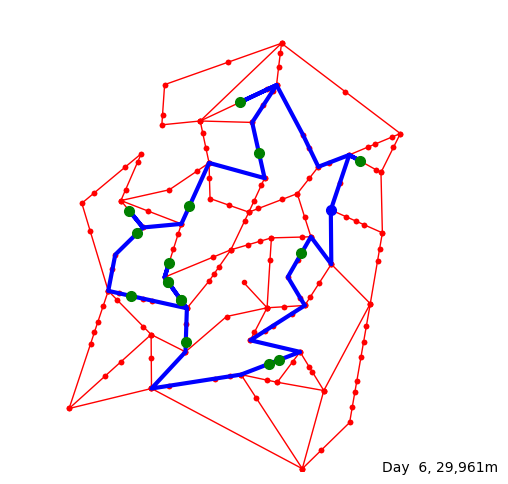

[ 6] 18:14:10.0 Driver leaves for delivery of 17 parcels
[ 6] 18:14:10.0 Driver drives to Customer: 22 (7528, 6712)
[ 6] 18:20:14.6 Driver arrived at Customer: 22 (7528, 6712)
[ 6] 18:20:40.5 Customer: 22 (7528, 6712) answers door
[ 6] 18:20:40.5 Customer: 22 (7528, 6712) accepts Parcel: 103
[ 6] 18:20:52.3 Customer: 22 (7528, 6712) signs off
[ 6] 18:20:56.2 Driver drives to Customer: 11 (4938, 7977)
[ 6] 18:36:17.3 Driver arrived at Customer: 11 (4938, 7977)
[ 6] 18:36:59.5 Customer: 11 (4938, 7977) answers door
[ 6] 18:36:59.5 Customer: 11 (4938, 7977) accepts Parcel: 92
[ 6] 18:37:00.1 Customer: 11 (4938, 7977) signs off
[ 6] 18:37:03.7 Driver drives to Customer:  5 (5352, 6892)
[ 6] 18:47:05.6 Driver arrived at Customer:  5 (5352, 6892)
[ 6] 18:48:00.3 Customer:  5 (5352, 6892) answers door
[ 6] 18:48:00.3 Customer:  5 (5352, 6892) accepts Parcel: 102
[ 6] 18:48:00.9 Customer:  5 (5352, 6892) signs off
[ 6] 18:48:10.6 Driver drives to Customer: 43 (3858, 5732)
[ 6] 18:59:30.2 Drive

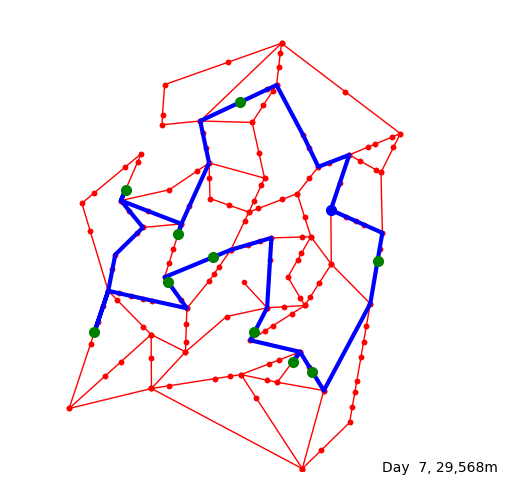

[ 7] 18:09:10.0 Driver leaves for delivery of 11 parcels
[ 7] 18:09:10.0 Driver drives to Customer: 11 (4938, 7977)
[ 7] 18:28:28.5 Driver arrived at Customer: 11 (4938, 7977)
[ 7] 18:29:03.8 Customer: 11 (4938, 7977) answers door
[ 7] 18:29:03.8 Customer: 11 (4938, 7977) accepts Parcel: 117
[ 7] 18:29:04.3 Customer: 11 (4938, 7977) signs off
[ 7] 18:29:09.2 Driver drives to Customer: 44 (3616, 5128)
[ 7] 18:43:18.8 Driver arrived at Customer: 44 (3616, 5128)
[ 7] 18:43:29.5 Customer: 44 (3616, 5128) answers door
[ 7] 18:43:29.5 Customer: 44 (3616, 5128) accepts Parcel: 121
[ 7] 18:43:30.4 Customer: 44 (3616, 5128) signs off
[ 7] 18:43:32.4 Driver drives to Customer: 49 (2484, 6084)
[ 7] 18:51:02.7 Driver arrived at Customer: 49 (2484, 6084)
[ 7] 18:51:05.0 Customer: 49 (2484, 6084) answers door
[ 7] 18:51:05.0 Customer: 49 (2484, 6084) accepts Parcel: 109
[ 7] 18:51:15.2 Customer: 49 (2484, 6084) signs off
[ 7] 18:51:17.1 Driver drives to Customer: 46 (1815, 3002)
[ 7] 19:05:35.8 Driv

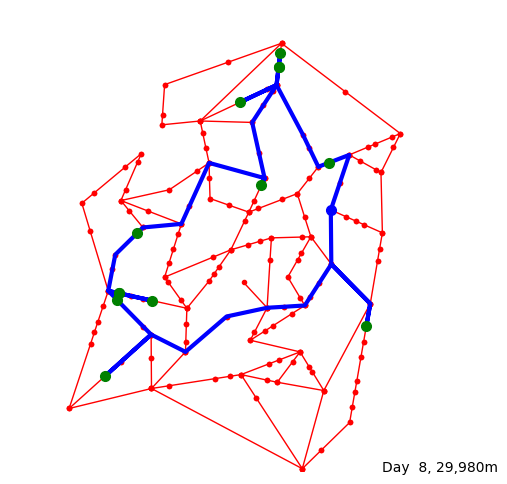

[ 8] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 8] 18:11:40.0 Driver drives to Customer: 84 (7665, 3146)
[ 8] 18:23:05.2 Driver arrived at Customer: 84 (7665, 3146)
[ 8] 18:23:47.7 Customer: 84 (7665, 3146) answers door
[ 8] 18:23:47.7 Customer: 84 (7665, 3146) accepts Parcel: 125
[ 8] 18:23:49.2 Customer: 84 (7665, 3146) signs off
[ 8] 18:24:04.7 Driver drives to Customer: 99 (2038, 2049)
[ 8] 18:55:12.4 Driver arrived at Customer: 99 (2038, 2049)
[ 8] 18:55:58.0 Customer: 99 (2038, 2049) answers door
[ 8] 18:55:58.0 Customer: 99 (2038, 2049) accepts Parcel: 122
[ 8] 18:56:33.3 Customer: 99 (2038, 2049) signs off
[ 8] 18:56:38.4 Driver drives to Customer:  4 (2311, 3695)
[ 8] 19:06:09.6 Driver arrived at Customer:  4 (2311, 3695)
[ 8] 19:07:51.3 Customer:  4 (2311, 3695) answers door
[ 8] 19:07:51.3 Customer:  4 (2311, 3695) accepts Parcel: 140
[ 8] 19:07:57.3 Customer:  4 (2311, 3695) signs off
[ 8] 19:08:01.5 Driver drives to Customer: 48 (2341, 3848)
[ 8] 19:10:05.6 Driv

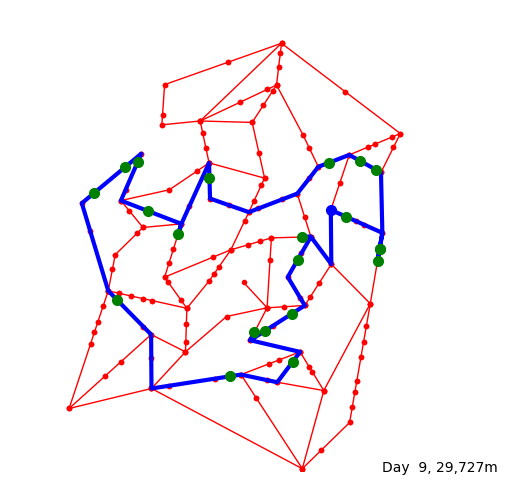

[ 9] 18:19:10.0 Driver leaves for delivery of 23 parcels
[ 9] 18:19:10.0 Driver drives to Customer: 61 (6282, 5064)
[ 9] 18:27:34.2 Driver arrived at Customer: 61 (6282, 5064)
[ 9] 18:27:38.4 Customer: 61 (6282, 5064) answers door
[ 9] 18:27:38.4 Customer: 61 (6282, 5064) accepts Parcel: 158
[ 9] 18:27:52.9 Customer: 61 (6282, 5064) signs off
[ 9] 18:27:58.2 Driver drives to Customer: 62 (6189, 4576)
[ 9] 18:30:59.9 Driver arrived at Customer: 62 (6189, 4576)
[ 9] 18:32:40.6 Customer: 62 (6189, 4576) answers door
[ 9] 18:32:40.6 Customer: 62 (6189, 4576) accepts Parcel: 138
[ 9] 18:32:46.4 Customer: 62 (6189, 4576) accepts Parcel: 157
[ 9] 18:32:47.2 Customer: 62 (6189, 4576) signs off
[ 9] 18:32:52.8 Driver drives to Customer: 13 (6067, 3408)
[ 9] 18:38:46.3 Driver arrived at Customer: 13 (6067, 3408)
[ 9] 18:39:42.5 Customer: 13 (6067, 3408) answers door
[ 9] 18:39:42.5 Customer: 13 (6067, 3408) accepts Parcel: 149
[ 9] 18:40:00.2 Customer: 13 (6067, 3408) accepts Parcel: 159
[ 9] 18

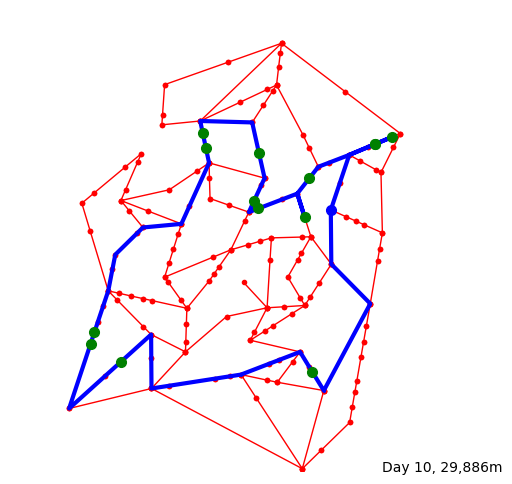

[10] 18:14:10.0 Driver leaves for delivery of 17 parcels
[10] 18:14:10.0 Driver drives to Customer: 21 (7852, 7076)
[10] 18:21:35.4 Driver arrived at Customer: 21 (7852, 7076)
[10] 18:22:33.4 Customer: 21 (7852, 7076) answers door
[10] 18:22:33.4 Customer: 21 (7852, 7076) accepts Parcel: 161
[10] 18:22:48.6 Customer: 21 (7852, 7076) signs off
[10] 18:23:03.5 Driver drives to Customer: 53 (8211, 7227)
[10] 18:24:36.8 Driver arrived at Customer: 53 (8211, 7227)
[10] 18:25:10.6 Customer: 53 (8211, 7227) answers door
[10] 18:25:10.6 Customer: 53 (8211, 7227) accepts Parcel: 145
[10] 18:25:22.5 Customer: 53 (8211, 7227) signs off
[10] 18:25:24.9 Driver drives to Customer: 21 (7852, 7076)
[10] 18:26:58.2 Driver arrived at Customer: 21 (7852, 7076)
[10] 18:27:50.10 Customer: 21 (7852, 7076) answers door
[10] 18:27:50.10 Customer: 21 (7852, 7076) accepts Parcel: 161
[10] 18:28:07.9 Customer: 21 (7852, 7076) signs off
[10] 18:28:22.2 Driver drives to Customer:  9 (6438, 6337)
[10] 18:34:52.9 Dr

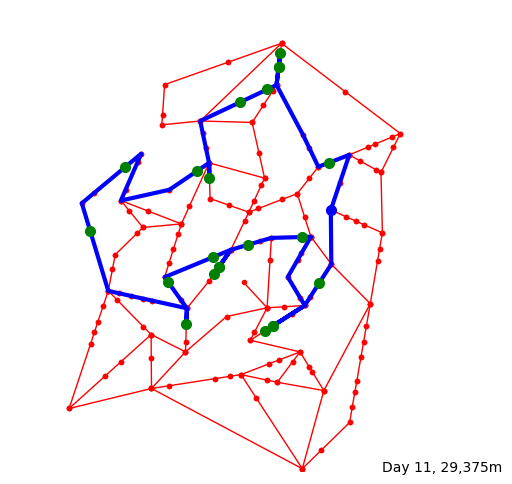

[11] 18:22:30.0 Driver leaves for delivery of 27 parcels
[11] 18:22:30.0 Driver drives to Customer: 28 (6650, 4070)
[11] 18:29:07.7 Driver arrived at Customer: 28 (6650, 4070)
[11] 18:29:38.7 Customer: 28 (6650, 4070) answers door
[11] 18:29:38.7 Customer: 28 (6650, 4070) accepts Parcel: 195
[11] 18:29:51.9 Customer: 28 (6650, 4070) signs off
[11] 18:29:53.5 Driver drives to Customer: 29 (5661, 3147)
[11] 18:35:25.2 Driver arrived at Customer: 29 (5661, 3147)
[11] 18:35:26.1 Customer: 29 (5661, 3147) answers door
[11] 18:35:26.1 Customer: 29 (5661, 3147) accepts Parcel: 183
[11] 18:35:35.10 Customer: 29 (5661, 3147) signs off
[11] 18:35:36.2 Driver drives to Customer: 23 (5474, 3026)
[11] 18:36:29.5 Driver arrived at Customer: 23 (5474, 3026)
[11] 18:36:31.3 Customer: 23 (5474, 3026) answers door
[11] 18:36:31.3 Customer: 23 (5474, 3026) accepts Parcel: 178
[11] 18:36:33.9 Customer: 23 (5474, 3026) signs off
[11] 18:36:44.5 Driver drives to Customer: 29 (5661, 3147)
[11] 18:37:37.8 Dri

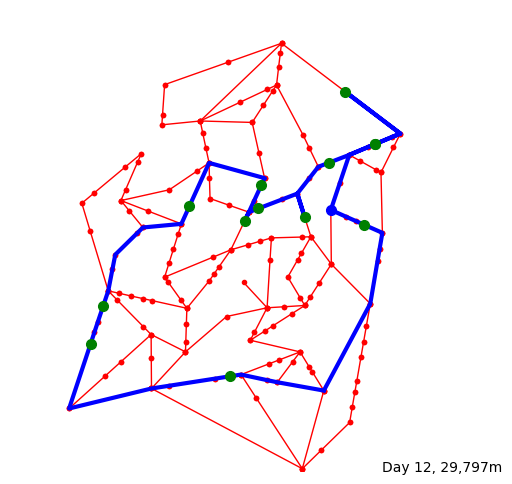

[12] 18:11:40.0 Driver leaves for delivery of 14 parcels
[12] 18:11:40.0 Driver drives to Customer: 93 (7622, 5327)
[12] 18:14:49.8 Driver arrived at Customer: 93 (7622, 5327)
[12] 18:15:04.7 Customer: 93 (7622, 5327) answers door
[12] 18:15:04.7 Customer: 93 (7622, 5327) accepts Parcel: 189
[12] 18:15:27.8 Customer: 93 (7622, 5327) signs off
[12] 18:15:35.8 Driver drives to Customer: 74 (4721, 2048)
[12] 18:40:16.1 Driver arrived at Customer: 74 (4721, 2048)
[12] 18:42:47.6 Customer: 74 (4721, 2048) answers door
[12] 18:42:47.6 Customer: 74 (4721, 2048) accepts Parcel: 199
[12] 18:43:02.4 Customer: 74 (4721, 2048) signs off
[12] 18:43:10.9 Driver drives to Customer: 31 (1734, 2755)
[12] 18:56:13.2 Parcel: 219 arr at delivery centre
[12] 19:03:09.9 Driver arrived at Customer: 31 (1734, 2755)
[12] 19:03:22.1 Customer: 31 (1734, 2755) answers door
[12] 19:03:22.1 Customer: 31 (1734, 2755) accepts Parcel: 202
[12] 19:03:33.7 Customer: 31 (1734, 2755) signs off
[12] 19:03:39.8 Driver drive

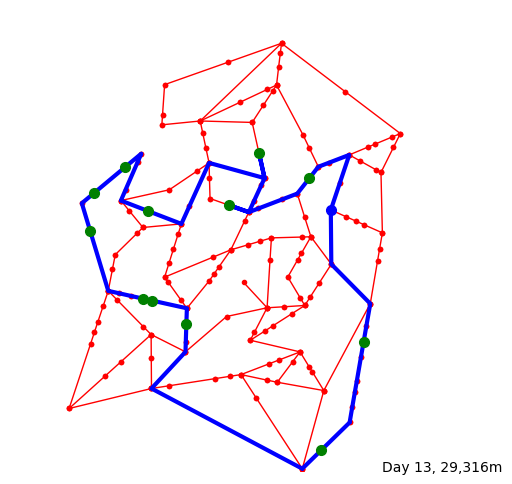

[13] 18:10:50.0 Driver leaves for delivery of 13 parcels
[13] 18:10:50.0 Driver drives to Customer:  9 (6438, 6337)
[13] 18:19:57.2 Driver arrived at Customer:  9 (6438, 6337)
[13] 18:20:30.5 Customer:  9 (6438, 6337) answers door
[13] 18:20:30.5 Customer:  9 (6438, 6337) accepts Parcel: 222
[13] 18:21:00.9 Customer:  9 (6438, 6337) signs off
[13] 18:21:05.4 Driver drives to Customer: 66 (4715, 5751)
[13] 18:29:01.3 Driver arrived at Customer: 66 (4715, 5751)
[13] 18:29:40.7 Customer: 66 (4715, 5751) answers door
[13] 18:29:40.7 Customer: 66 (4715, 5751) accepts Parcel: 209
[13] 18:29:44.6 Customer: 66 (4715, 5751) signs off
[13] 18:29:59.8 Driver drives to Customer:  5 (5352, 6892)
[13] 18:37:17.1 Driver arrived at Customer:  5 (5352, 6892)
[13] 18:37:53.8 Customer:  5 (5352, 6892) answers door
[13] 18:37:53.8 Customer:  5 (5352, 6892) accepts Parcel: 207
[13] 18:38:37.6 Customer:  5 (5352, 6892) signs off
[13] 18:38:37.6 Driver drives to Customer: 87 (2978, 5623)
[13] 18:54:40.0 Driv

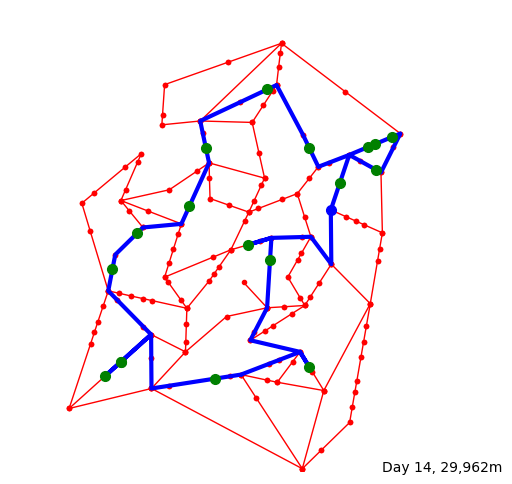

[14] 18:19:10.0 Driver leaves for delivery of 23 parcels
[14] 18:19:10.0 Driver drives to Customer: 70 (5108, 4893)
[14] 18:32:21.0 Driver arrived at Customer: 70 (5108, 4893)
[14] 18:34:17.10 Customer: 70 (5108, 4893) answers door
[14] 18:34:17.10 Customer: 70 (5108, 4893) accepts Parcel: 214
[14] 18:34:25.7 Customer: 70 (5108, 4893) accepts Parcel: 224
[14] 18:34:33.8 Customer: 70 (5108, 4893) signs off
[14] 18:35:19.9 Driver drives to Customer: 68 (5592, 4573)
[14] 18:39:21.8 Driver arrived at Customer: 68 (5592, 4573)
[14] 18:39:30.3 Customer: 68 (5592, 4573) answers door
[14] 18:39:30.3 Customer: 68 (5592, 4573) accepts Parcel: 235
[14] 18:39:45.5 Customer: 68 (5592, 4573) signs off
[14] 18:40:01.2 Driver drives to Customer: 39 (6430, 2261)
[14] 18:53:12.10 Driver arrived at Customer: 39 (6430, 2261)
[14] 18:54:27.5 Customer: 39 (6430, 2261) answers door
[14] 18:54:27.5 Customer: 39 (6430, 2261) accepts Parcel: 226
[14] 18:54:41.3 Customer: 39 (6430, 2261) signs off
[14] 18:54:43.

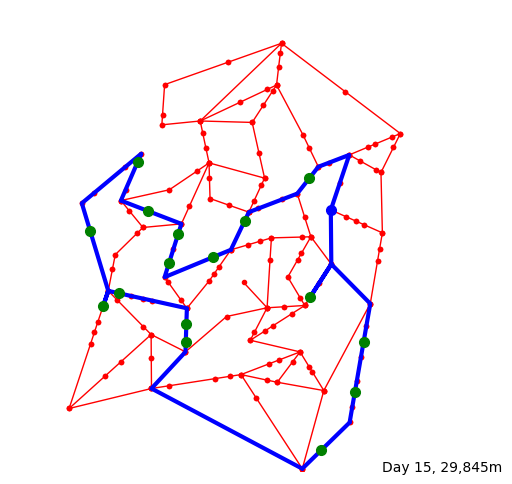

[15] 18:19:10.0 Driver leaves for delivery of 23 parcels
[15] 18:19:10.0 Driver drives to Customer: 36 (6453, 3761)
[15] 18:27:15.5 Driver arrived at Customer: 36 (6453, 3761)
[15] 18:28:40.4 Customer: 36 (6453, 3761) answers door
[15] 18:28:40.4 Customer: 36 (6453, 3761) accepts Parcel: 236
[15] 18:28:40.8 Customer: 36 (6453, 3761) accepts Parcel: 268
[15] 18:28:47.0 Customer: 36 (6453, 3761) signs off
[15] 18:29:04.7 Driver drives to Customer:  8 (7603, 2787)
[15] 18:40:38.8 Driver arrived at Customer:  8 (7603, 2787)
[15] 18:40:44.2 Customer:  8 (7603, 2787) answers door
[15] 18:40:44.2 Customer:  8 (7603, 2787) accepts Parcel: 270
[15] 18:40:56.6 Customer:  8 (7603, 2787) signs off
[15] 18:41:00.6 Driver drives to Customer: 75 (7416, 1705)
[15] 18:45:23.7 Driver arrived at Customer: 75 (7416, 1705)
[15] 18:45:24.6 Customer: 75 (7416, 1705) answers door
[15] 18:45:24.6 Customer: 75 (7416, 1705) accepts Parcel: 242
[15] 18:45:31.1 Customer: 75 (7416, 1705) accepts Parcel: 261
[15] 18

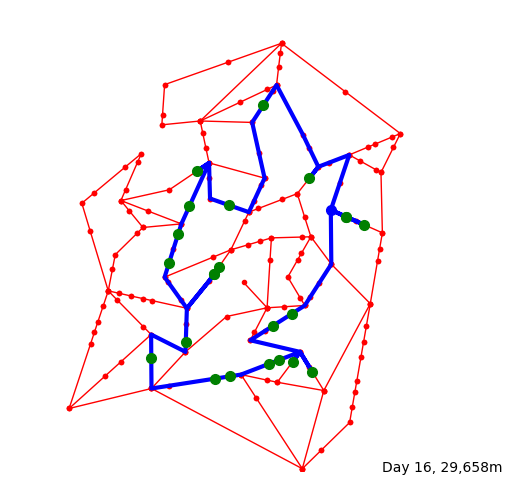

[16] 18:20:50.0 Driver leaves for delivery of 25 parcels
[16] 18:20:50.0 Driver drives to Customer: 79 (7227, 5504)
[16] 18:22:16.2 Driver arrived at Customer: 79 (7227, 5504)
[16] 18:22:22.9 Customer: 79 (7227, 5504) answers door
[16] 18:22:22.9 Customer: 79 (7227, 5504) accepts Parcel: 285
[16] 18:22:45.9 Customer: 79 (7227, 5504) signs off
[16] 18:22:53.10 Driver drives to Customer: 93 (7622, 5327)
[16] 18:24:37.7 Driver arrived at Customer: 93 (7622, 5327)
[16] 18:24:39.2 Customer: 93 (7622, 5327) answers door
[16] 18:24:39.2 Customer: 93 (7622, 5327) accepts Parcel: 255
[16] 18:24:48.1 Customer: 93 (7622, 5327) signs off
[16] 18:24:58.3 Driver drives to Customer: 79 (7227, 5504)
[16] 18:26:41.10 Driver arrived at Customer: 79 (7227, 5504)
[16] 18:26:43.4 Customer: 79 (7227, 5504) answers door
[16] 18:26:43.4 Customer: 79 (7227, 5504) accepts Parcel: 285
[16] 18:26:57.5 Customer: 79 (7227, 5504) signs off
[16] 18:27:14.6 Driver drives to Customer:  9 (6438, 6337)
[16] 18:37:47.9 Dr

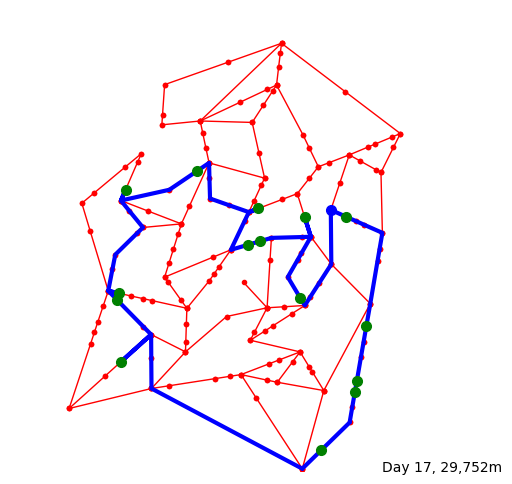

[17] 18:14:10.0 Driver leaves for delivery of 17 parcels
[17] 18:14:10.0 Driver drives to Customer: 56 (6245, 3741)
[17] 18:23:50.1 Driver arrived at Customer: 56 (6245, 3741)
[17] 18:23:53.4 Customer: 56 (6245, 3741) answers door
[17] 18:23:53.4 Customer: 56 (6245, 3741) accepts Parcel: 291
[17] 18:23:53.10 Customer: 56 (6245, 3741) signs off
[17] 18:24:13.8 Driver drives to Customer: 27 (6339, 5488)
[17] 18:32:06.8 Driver arrived at Customer: 27 (6339, 5488)
[17] 18:33:09.4 Customer: 27 (6339, 5488) answers door
[17] 18:33:09.4 Customer: 27 (6339, 5488) accepts Parcel: 281
[17] 18:33:28.9 Customer: 27 (6339, 5488) signs off
[17] 18:33:31.10 Driver drives to Customer: 35 (5376, 4973)
[17] 18:39:42.3 Driver arrived at Customer: 35 (5376, 4973)
[17] 18:40:24.1 Customer: 35 (5376, 4973) answers door
[17] 18:40:24.1 Customer: 35 (5376, 4973) accepts Parcel: 316
[17] 18:40:25.1 Customer: 35 (5376, 4973) signs off
[17] 18:40:42.6 Driver drives to Customer: 70 (5108, 4893)
[17] 18:41:49.5 Dr

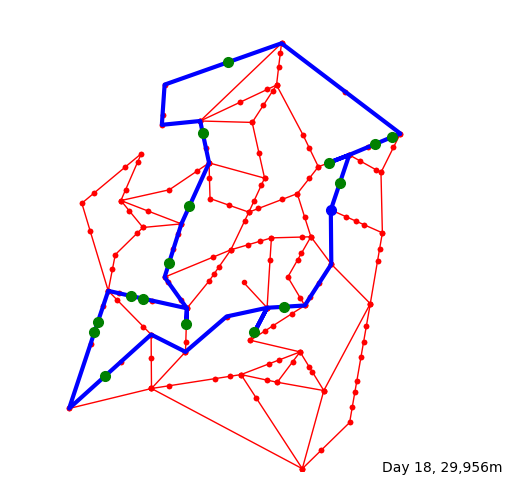

[18] 18:17:30.0 Driver leaves for delivery of 21 parcels
[18] 18:17:30.0 Driver drives to Customer:  7 (7092, 6231)
[18] 18:19:56.4 Driver arrived at Customer:  7 (7092, 6231)
[18] 18:25:58.0 Customer:  7 (7092, 6231) answers door
[18] 18:25:58.0 Customer:  7 (7092, 6231) accepts Parcel: 333
[18] 18:25:58.2 Customer:  7 (7092, 6231) signs off
[18] 18:26:15.6 Driver drives to Customer: 16 (6857, 6672)
[18] 18:30:42.10 Driver arrived at Customer: 16 (6857, 6672)
[18] 18:31:11.5 Customer: 16 (6857, 6672) answers door
[18] 18:31:11.5 Customer: 16 (6857, 6672) accepts Parcel: 307
[18] 18:31:11.9 Customer: 16 (6857, 6672) accepts Parcel: 313
[18] 18:31:26.9 Customer: 16 (6857, 6672) signs off
[18] 18:31:28.1 Driver drives to Customer: 21 (7852, 7076)
[18] 18:35:45.4 Driver arrived at Customer: 21 (7852, 7076)
[18] 18:36:23.2 Customer: 21 (7852, 7076) answers door
[18] 18:36:23.2 Customer: 21 (7852, 7076) accepts Parcel: 297
[18] 18:36:38.3 Customer: 21 (7852, 7076) signs off
[18] 18:36:49.5 

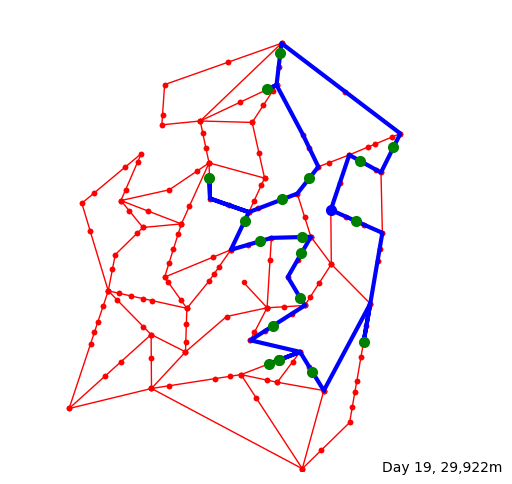

[19] 18:19:10.0 Driver leaves for delivery of 23 parcels
[19] 18:19:10.0 Driver drives to Customer: 73 (7436, 5411)
[19] 18:21:30.9 Driver arrived at Customer: 73 (7436, 5411)
[19] 18:22:07.10 Customer: 73 (7436, 5411) answers door
[19] 18:22:07.10 Customer: 73 (7436, 5411) accepts Parcel: 322
[19] 18:22:09.7 Customer: 73 (7436, 5411) accepts Parcel: 343
[19] 18:22:13.9 Customer: 73 (7436, 5411) signs off
[19] 18:22:19.2 Driver drives to Customer:  8 (7603, 2787)
[19] 18:34:25.6 Driver arrived at Customer:  8 (7603, 2787)
[19] 18:35:01.3 Customer:  8 (7603, 2787) answers door
[19] 18:35:01.3 Customer:  8 (7603, 2787) accepts Parcel: 341
[19] 18:35:56.6 Customer:  8 (7603, 2787) signs off
[19] 18:35:59.10 Driver drives to Customer: 14 (6502, 2145)
[19] 18:49:47.7 Driver arrived at Customer: 14 (6502, 2145)
[19] 18:50:15.8 Customer: 14 (6502, 2145) answers door
[19] 18:50:15.8 Customer: 14 (6502, 2145) accepts Parcel: 337
[19] 18:50:42.9 Customer: 14 (6502, 2145) signs off
[19] 18:50:47.

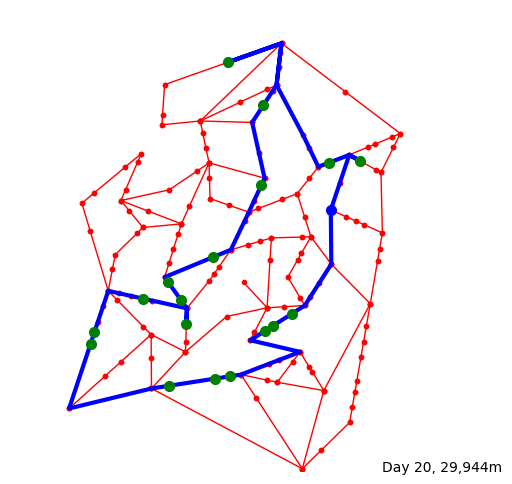

[20] 18:16:40.0 Driver leaves for delivery of 20 parcels
[20] 18:16:40.0 Driver drives to Customer: 22 (7528, 6712)
[20] 18:22:44.6 Driver arrived at Customer: 22 (7528, 6712)
[20] 18:24:09.5 Customer: 22 (7528, 6712) answers door
[20] 18:24:09.5 Customer: 22 (7528, 6712) accepts Parcel: 354
[20] 18:24:58.6 Customer: 22 (7528, 6712) signs off
[20] 18:25:02.9 Driver drives to Customer: 16 (6857, 6672)
[20] 18:27:59.3 Driver arrived at Customer: 16 (6857, 6672)
[20] 18:29:58.1 Customer: 16 (6857, 6672) answers door
[20] 18:29:58.1 Customer: 16 (6857, 6672) accepts Parcel: 352
[20] 18:30:05.3 Customer: 16 (6857, 6672) signs off
[20] 18:30:38.7 Driver drives to Customer: 24 (4686, 8847)
[20] 18:48:04.6 Driver arrived at Customer: 24 (4686, 8847)
[20] 18:51:44.0 Customer: 24 (4686, 8847) answers door
[20] 18:51:44.0 Customer: 24 (4686, 8847) accepts Parcel: 356
[20] 18:52:00.8 Customer: 24 (4686, 8847) signs off
[20] 18:52:12.3 Driver drives to Customer: 34 (5446, 7913)
[20] 19:02:49.10 Dri

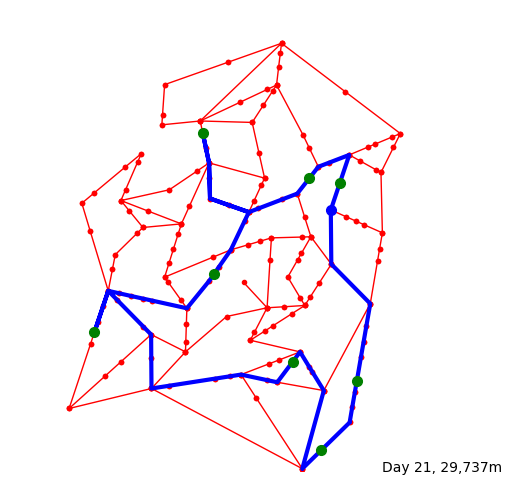

[21] 18:09:10.0 Driver leaves for delivery of 11 parcels
[21] 18:09:10.0 Driver drives to Customer: 41 (7458, 1945)
[21] 18:25:27.3 Driver arrived at Customer: 41 (7458, 1945)
[21] 18:27:13.4 Customer: 41 (7458, 1945) answers door
[21] 18:27:13.4 Customer: 41 (7458, 1945) accepts Parcel: 381
[21] 18:27:14.3 Customer: 41 (7458, 1945) signs off
[21] 18:27:23.1 Driver drives to Customer: 95 (6687, 444)
[21] 18:34:27.9 Driver arrived at Customer: 95 (6687, 444)
[21] 18:34:44.2 Customer: 95 (6687, 444) answers door
[21] 18:34:44.2 Customer: 95 (6687, 444) accepts Parcel: 368
[21] 18:34:51.3 Customer: 95 (6687, 444) signs off
[21] 18:34:57.4 Driver drives to Customer: 52 (6082, 2369)
[21] 18:49:10.3 Driver arrived at Customer: 52 (6082, 2369)
[21] 18:49:36.5 Customer: 52 (6082, 2369) answers door
[21] 18:49:36.5 Customer: 52 (6082, 2369) accepts Parcel: 366
[21] 18:49:37.6 Customer: 52 (6082, 2369) accepts Parcel: 378
[21] 18:49:55.5 Customer: 52 (6082, 2369) signs off
[21] 18:50:02.2 Driver

In [59]:
random.seed(0)
rec = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [60]:
def standardMeasureConverter(df):
    df['dist'] =  df['dist'] / 1000
    df['time'] =  df['time'] / 60
    df['delay'] =  df['delay'] / 86400
    df['delay'] =  df['delay'] / df['left'].replace(0, np.nan).shift(1) #####
    column_names = {'dist': 'Delivery Route Distance(in km)', 'time' : 'Working Time (in minutes)', 'delay': 'Delay Time(in days)', 'left' : 'Number of left over parcels'}
    df = df.rename(columns = column_names, inplace=True)

In [61]:
standardMeasureConverter(rec.daily)

### Simulation Records

In [62]:
rec.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,74139,29.829,155.65,7,NaN
1,151200,160045,29.703,147.416667,7,1.125428
2,237600,246890,29.915,154.833333,10,1.517842
3,324000,333252,29.939,154.2,15,1.079909
4,410400,420617,29.99,170.283333,11,1.341883
5,496800,506372,29.44,159.533333,10,1.497103
6,583200,592742,29.961,159.033333,6,0.88203
7,669600,678433,29.568,147.216667,1,1.478667
8,756000,765194,29.98,153.233333,11,1.39272
9,842400,852469,29.727,167.816667,14,1.353877


### Time Plot

In [63]:
np.mean(rec.daily['Working Time (in minutes)'])

160.27954545454548

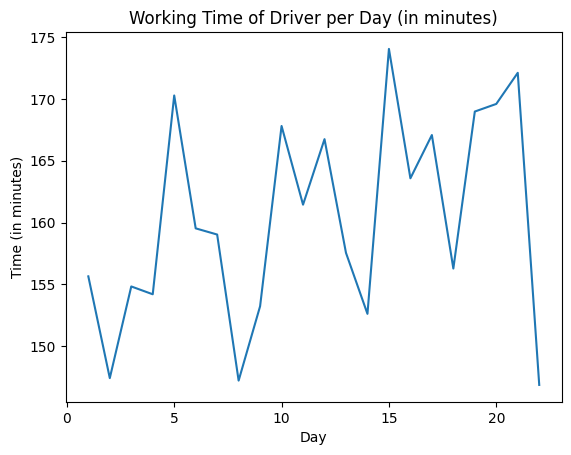

In [64]:
timePlot = plt.plot(rec.daily.index +1 ,rec.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [65]:
np.mean(rec.daily['Delivery Route Distance(in km)'])

29.781909090909085

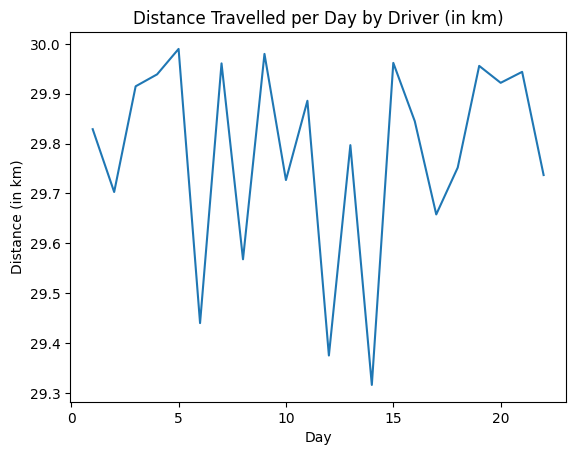

In [66]:
distancePlot = plt.plot(rec.daily.index +1 ,rec.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [67]:
np.mean(rec.daily['Number of left over parcels'])

10.318181818181818

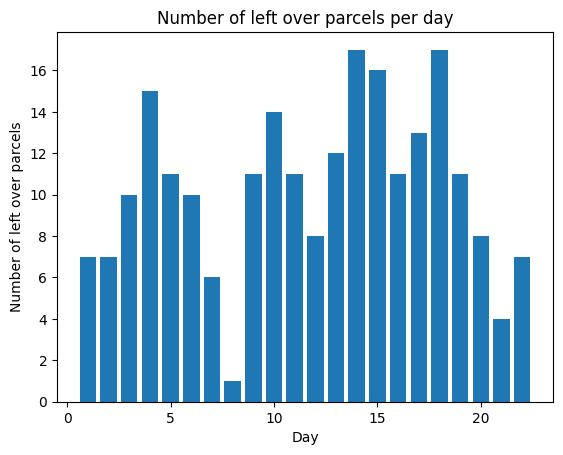

In [68]:
leftOverPlot = plt.bar(rec.daily.index +1 ,rec.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [69]:
np.mean(rec.daily['Delay Time(in days)'])

1.304035825858283

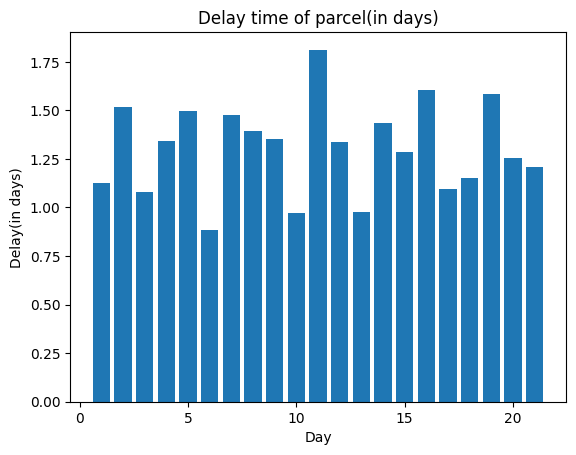

In [70]:
delayPlot = plt.bar(rec.daily.index ,rec.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

# Scenario 1

Suppose due to declines in sales the average number of parcels per customer falls to 3.

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 298 deliveries over 22 days.


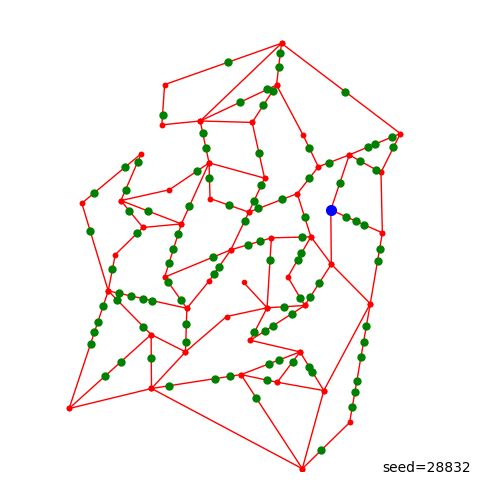

In [71]:
data = generateData(28832, p = 3, plot=True, log=True)

## Storing generated data into the pickle file

In [72]:
with open('dataSeed28832P3.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [73]:
with open('dataSeed28832P3.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 282 parcels over 22 days to 100 customers
[ 0] 09:00:57.9 Parcel:  0 arr at delivery centre
[ 0] 09:47:26.9 Parcel:  1 arr at delivery centre
[ 0] 10:05:19.7 Parcel:  2 arr at delivery centre
[ 0] 10:15:08.8 Parcel:  3 arr at delivery centre
[ 0] 10:38:36.3 Parcel:  4 arr at delivery centre
[ 0] 10:55:36.8 Parcel:  5 arr at delivery centre
[ 0] 11:45:47.8 Parcel:  6 arr at delivery centre
[ 0] 18:00:00.0 Driver arrives for work
[ 0] 18:00:00.0 Parcel:  6 out for delivery
[ 0] 18:00:00.0 Parcel:  2 out for delivery
[ 0] 18:00:00.0 Parcel:  5 out for delivery
[ 0] 18:00:00.0 Parcel:  3 out for delivery
[ 0] 18:00:00.0 Parcel:  0 out for delivery
[ 0] 18:00:00.0 Parcel:  4 out for delivery
[ 0] 18:00:00.0 Parcel:  1 out for delivery


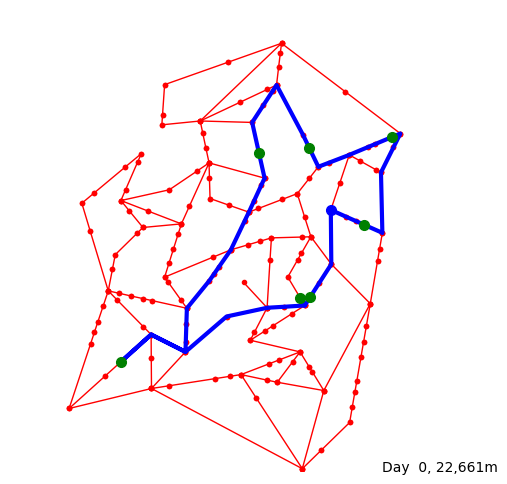

[ 0] 18:05:50.0 Driver leaves for delivery of 7 parcels
[ 0] 18:05:50.0 Driver drives to Customer: 93 (7622, 5327)
[ 0] 18:08:59.8 Driver arrived at Customer: 93 (7622, 5327)
[ 0] 18:09:01.8 Customer: 93 (7622, 5327) answers door
[ 0] 18:09:01.8 Customer: 93 (7622, 5327) accepts Parcel:  6
[ 0] 18:09:03.8 Customer: 93 (7622, 5327) signs off
[ 0] 18:09:11.2 Driver drives to Customer: 53 (8211, 7227)
[ 0] 18:20:39.0 Driver arrived at Customer: 53 (8211, 7227)
[ 0] 18:20:41.10 Customer: 53 (8211, 7227) answers door
[ 0] 18:20:41.10 Customer: 53 (8211, 7227) accepts Parcel:  2
[ 0] 18:20:47.1 Customer: 53 (8211, 7227) signs off
[ 0] 18:20:51.1 Driver drives to Customer:  3 (6435, 6994)
[ 0] 18:29:28.6 Driver arrived at Customer:  3 (6435, 6994)
[ 0] 18:29:49.10 Customer:  3 (6435, 6994) answers door
[ 0] 18:29:49.10 Customer:  3 (6435, 6994) accepts Parcel:  5
[ 0] 18:29:51.0 Customer:  3 (6435, 6994) signs off
[ 0] 18:30:14.10 Driver drives to Customer:  5 (5352, 6892)
[ 0] 18:42:53.4 Dri

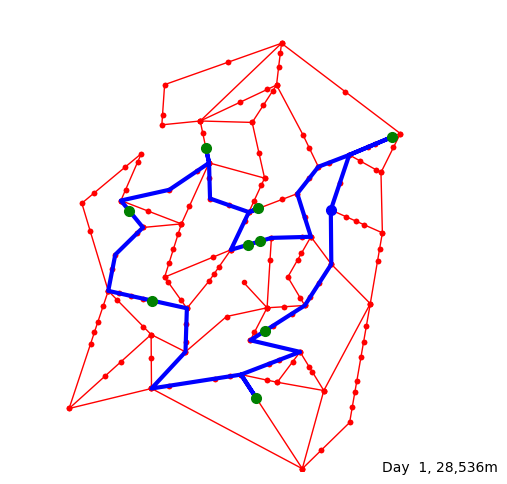

[ 1] 18:07:30.0 Driver leaves for delivery of 9 parcels
[ 1] 18:07:30.0 Driver drives to Customer: 23 (5474, 3026)
[ 1] 18:20:32.6 Driver arrived at Customer: 23 (5474, 3026)
[ 1] 18:20:51.5 Customer: 23 (5474, 3026) answers door
[ 1] 18:20:51.5 Customer: 23 (5474, 3026) accepts Parcel: 12
[ 1] 18:21:28.2 Customer: 23 (5474, 3026) signs off
[ 1] 18:21:38.4 Driver drives to Customer: 60 (5300, 1573)
[ 1] 18:35:22.3 Driver arrived at Customer: 60 (5300, 1573)
[ 1] 18:35:25.0 Customer: 60 (5300, 1573) answers door
[ 1] 18:35:25.0 Customer: 60 (5300, 1573) accepts Parcel: 14
[ 1] 18:35:25.9 Customer: 60 (5300, 1573) signs off
[ 1] 18:35:39.8 Driver drives to Customer: 32 (3049, 3690)
[ 1] 18:57:04.0 Driver arrived at Customer: 32 (3049, 3690)
[ 1] 18:57:06.5 Customer: 32 (3049, 3690) answers door
[ 1] 18:57:06.5 Customer: 32 (3049, 3690) accepts Parcel:  7
[ 1] 18:57:06.6 Customer: 32 (3049, 3690) signs off
[ 1] 18:57:11.6 Driver drives to Customer: 76 (2569, 5627)
[ 1] 19:09:23.4 Driver a

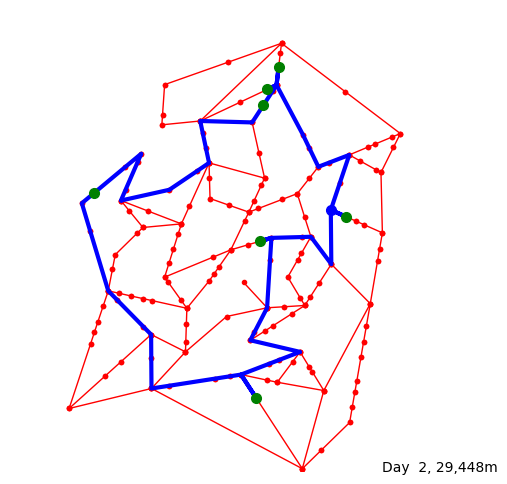

[ 2] 18:05:50.0 Driver leaves for delivery of 7 parcels
[ 2] 18:05:50.0 Driver drives to Customer: 19 (5778, 8751)
[ 2] 18:23:13.5 Driver arrived at Customer: 19 (5778, 8751)
[ 2] 18:23:18.6 Customer: 19 (5778, 8751) answers door
[ 2] 18:23:18.6 Customer: 19 (5778, 8751) accepts Parcel: 15
[ 2] 18:23:23.7 Customer: 19 (5778, 8751) signs off
[ 2] 18:23:25.10 Driver drives to Customer: 78 (5534, 8260)
[ 2] 18:25:54.3 Driver arrived at Customer: 78 (5534, 8260)
[ 2] 18:25:56.0 Customer: 78 (5534, 8260) answers door
[ 2] 18:25:56.0 Customer: 78 (5534, 8260) accepts Parcel: 19
[ 2] 18:26:25.6 Customer: 78 (5534, 8260) signs off
[ 2] 18:26:28.0 Driver drives to Customer: 34 (5446, 7913)
[ 2] 18:29:26.3 Driver arrived at Customer: 34 (5446, 7913)
[ 2] 18:29:32.7 Customer: 34 (5446, 7913) answers door
[ 2] 18:29:32.7 Customer: 34 (5446, 7913) accepts Parcel: 23
[ 2] 18:29:34.9 Customer: 34 (5446, 7913) signs off
[ 2] 18:29:39.6 Driver drives to Customer: 64 (1814, 6022)
[ 2] 18:57:39.9 Driver 

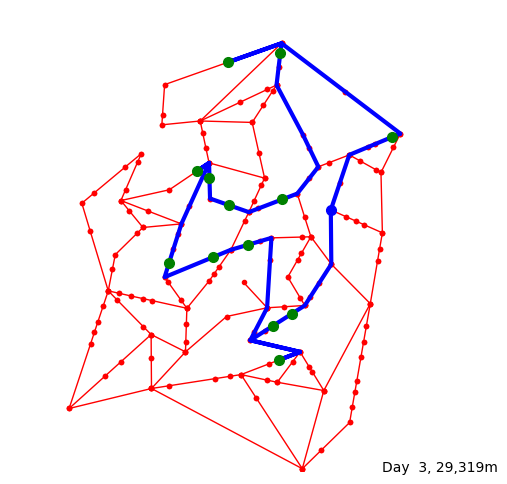

[ 3] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 3] 18:11:40.0 Driver drives to Customer: 13 (6067, 3408)
[ 3] 18:21:53.7 Driver arrived at Customer: 13 (6067, 3408)
[ 3] 18:22:21.3 Customer: 13 (6067, 3408) answers door
[ 3] 18:22:21.3 Customer: 13 (6067, 3408) accepts Parcel: 26
[ 3] 18:22:32.4 Customer: 13 (6067, 3408) accepts Parcel: 34
[ 3] 18:22:34.6 Customer: 13 (6067, 3408) signs off
[ 3] 18:22:44.1 Driver drives to Customer: 29 (5661, 3147)
[ 3] 18:24:39.7 Driver arrived at Customer: 29 (5661, 3147)
[ 3] 18:24:49.6 Customer: 29 (5661, 3147) answers door
[ 3] 18:24:49.6 Customer: 29 (5661, 3147) accepts Parcel: 41
[ 3] 18:24:53.8 Customer: 29 (5661, 3147) signs off
[ 3] 18:25:26.6 Driver drives to Customer: 54 (5791, 2405)
[ 3] 18:34:05.7 Driver arrived at Customer: 54 (5791, 2405)
[ 3] 18:35:37.4 Customer: 54 (5791, 2405) answers door
[ 3] 18:35:37.4 Customer: 54 (5791, 2405) accepts Parcel: 29
[ 3] 18:35:54.5 Customer: 54 (5791, 2405) signs off
[ 3] 18:35:54.9 Drive

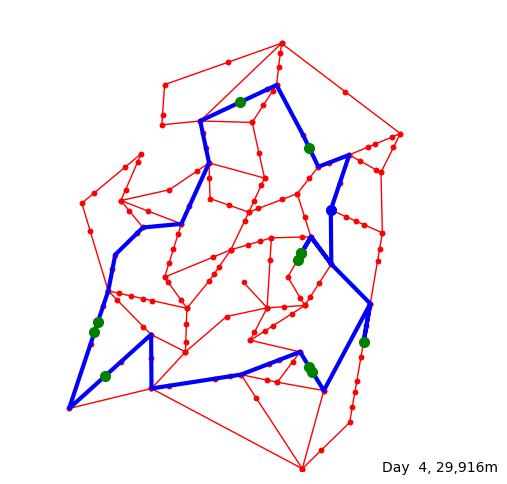

[ 4] 18:12:30.0 Driver leaves for delivery of 15 parcels
[ 4] 18:12:30.0 Driver drives to Customer: 97 (6268, 4714)
[ 4] 18:21:47.0 Driver arrived at Customer: 97 (6268, 4714)
[ 4] 18:21:56.3 Customer: 97 (6268, 4714) answers door
[ 4] 18:21:56.3 Customer: 97 (6268, 4714) accepts Parcel: 36
[ 4] 18:22:03.9 Customer: 97 (6268, 4714) signs off
[ 4] 18:22:13.1 Driver drives to Customer: 62 (6189, 4576)
[ 4] 18:22:51.2 Driver arrived at Customer: 62 (6189, 4576)
[ 4] 18:24:01.1 Customer: 62 (6189, 4576) answers door
[ 4] 18:24:01.1 Customer: 62 (6189, 4576) accepts Parcel: 45
[ 4] 18:24:07.7 Customer: 62 (6189, 4576) accepts Parcel: 47
[ 4] 18:24:23.3 Customer: 62 (6189, 4576) signs off
[ 4] 18:24:28.3 Driver drives to Customer: 97 (6268, 4714)
[ 4] 18:25:06.4 Driver arrived at Customer: 97 (6268, 4714)
[ 4] 18:25:41.7 Customer: 97 (6268, 4714) answers door
[ 4] 18:25:41.7 Customer: 97 (6268, 4714) accepts Parcel: 36
[ 4] 18:26:00.8 Customer: 97 (6268, 4714) signs off
[ 4] 18:26:16.8 Drive

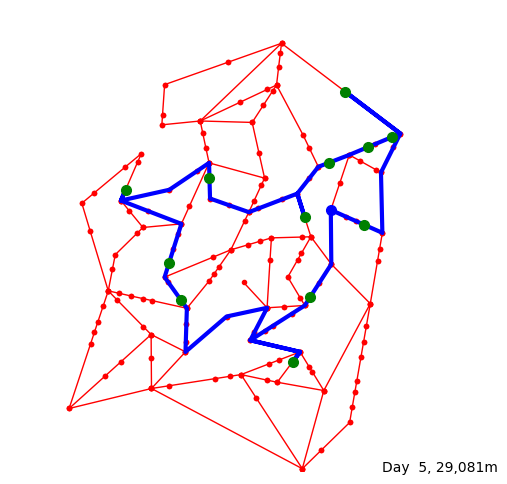

[ 5] 18:10:00.0 Driver leaves for delivery of 12 parcels
[ 5] 18:10:00.0 Driver drives to Customer: 36 (6453, 3761)
[ 5] 18:18:05.5 Driver arrived at Customer: 36 (6453, 3761)
[ 5] 18:18:25.1 Customer: 36 (6453, 3761) answers door
[ 5] 18:18:25.1 Customer: 36 (6453, 3761) accepts Parcel: 64
[ 5] 18:18:25.6 Customer: 36 (6453, 3761) signs off
[ 5] 18:18:31.9 Driver drives to Customer: 52 (6082, 2369)
[ 5] 18:30:22.3 Driver arrived at Customer: 52 (6082, 2369)
[ 5] 18:30:28.9 Customer: 52 (6082, 2369) answers door
[ 5] 18:30:28.9 Customer: 52 (6082, 2369) accepts Parcel: 46
[ 5] 18:30:29.2 Customer: 52 (6082, 2369) signs off
[ 5] 18:30:38.8 Driver drives to Customer: 25 (3671, 3708)
[ 5] 18:52:09.8 Driver arrived at Customer: 25 (3671, 3708)
[ 5] 18:52:49.6 Customer: 25 (3671, 3708) answers door
[ 5] 18:52:49.6 Customer: 25 (3671, 3708) accepts Parcel: 52
[ 5] 18:52:50.7 Customer: 25 (3671, 3708) signs off
[ 5] 18:52:58.6 Driver drives to Customer: 40 (3420, 4501)
[ 5] 18:56:38.5 Driver 

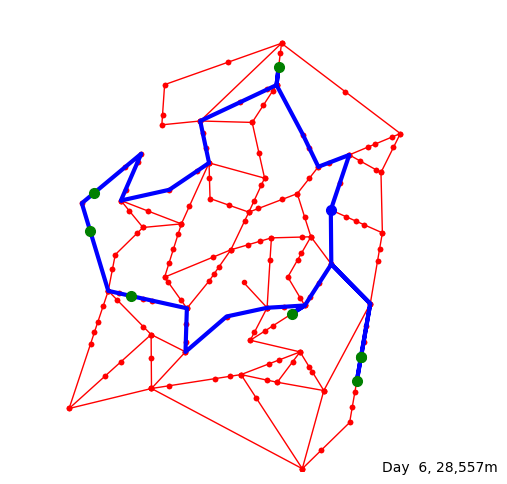

[ 6] 18:06:40.0 Driver leaves for delivery of 8 parcels
[ 6] 18:06:40.0 Driver drives to Customer: 19 (5778, 8751)
[ 6] 18:24:03.5 Driver arrived at Customer: 19 (5778, 8751)
[ 6] 18:25:05.9 Customer: 19 (5778, 8751) answers door
[ 6] 18:25:05.9 Customer: 19 (5778, 8751) accepts Parcel: 69
[ 6] 18:25:06.6 Customer: 19 (5778, 8751) signs off
[ 6] 18:25:07.1 Driver drives to Customer: 64 (1814, 6022)
[ 6] 18:55:45.5 Driver arrived at Customer: 64 (1814, 6022)
[ 6] 18:57:34.4 Customer: 64 (1814, 6022) answers door
[ 6] 18:57:34.4 Customer: 64 (1814, 6022) accepts Parcel: 66
[ 6] 18:57:41.1 Customer: 64 (1814, 6022) signs off
[ 6] 18:58:04.2 Driver drives to Customer: 83 (1723, 5199)
[ 6] 19:01:57.7 Driver arrived at Customer: 83 (1723, 5199)
[ 6] 19:03:53.6 Customer: 83 (1723, 5199) answers door
[ 6] 19:03:53.6 Customer: 83 (1723, 5199) accepts Parcel: 67
[ 6] 19:04:04.6 Customer: 83 (1723, 5199) signs off
[ 6] 19:04:13.0 Driver drives to Customer: 92 (2604, 3788)
[ 6] 19:11:39.2 Driver a

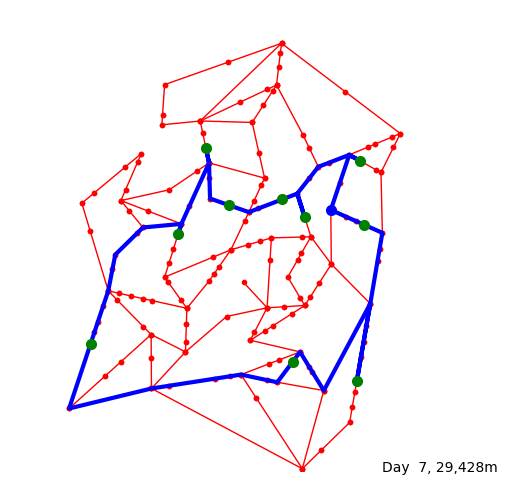

[ 7] 18:08:11.5 Parcel: 85 arr at delivery centre
[ 7] 18:08:20.0 Driver leaves for delivery of 10 parcels
[ 7] 18:08:20.0 Driver drives to Customer: 22 (7528, 6712)
[ 7] 18:14:24.6 Driver arrived at Customer: 22 (7528, 6712)
[ 7] 18:15:24.0 Customer: 22 (7528, 6712) answers door
[ 7] 18:15:24.0 Customer: 22 (7528, 6712) accepts Parcel: 75
[ 7] 18:15:37.3 Customer: 22 (7528, 6712) signs off
[ 7] 18:15:37.6 Driver drives to Customer: 27 (6339, 5488)
[ 7] 18:24:38.3 Driver arrived at Customer: 27 (6339, 5488)
[ 7] 18:25:01.10 Customer: 27 (6339, 5488) answers door
[ 7] 18:25:01.10 Customer: 27 (6339, 5488) accepts Parcel: 71
[ 7] 18:25:13.6 Customer: 27 (6339, 5488) signs off
[ 7] 18:25:13.9 Driver drives to Customer:  0 (5854, 5879)
[ 7] 18:28:46.8 Driver arrived at Customer:  0 (5854, 5879)
[ 7] 18:30:27.4 Customer:  0 (5854, 5879) answers door
[ 7] 18:30:27.4 Customer:  0 (5854, 5879) accepts Parcel: 72
[ 7] 18:31:00.2 Customer:  0 (5854, 5879) signs off
[ 7] 18:31:13.0 Driver drives 

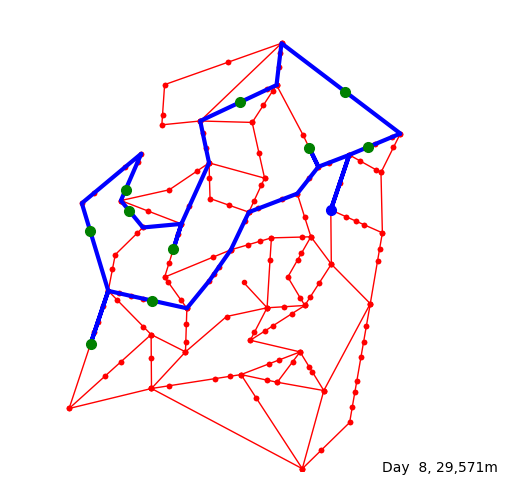

[ 8] 18:00:44.6 Parcel: 96 arr at delivery centre
[ 8] 18:03:33.6 Parcel: 97 arr at delivery centre
[ 8] 18:08:20.0 Driver leaves for delivery of 10 parcels
[ 8] 18:08:20.0 Driver drives to Customer: 58 (7707, 7015)
[ 8] 18:15:07.8 Driver arrived at Customer: 58 (7707, 7015)
[ 8] 18:15:12.5 Customer: 58 (7707, 7015) answers door
[ 8] 18:15:12.5 Customer: 58 (7707, 7015) accepts Parcel: 95
[ 8] 18:15:16.8 Customer: 58 (7707, 7015) signs off
[ 8] 18:15:48.7 Driver drives to Customer: 85 (7212, 8208)
[ 8] 18:24:44.7 Driver arrived at Customer: 85 (7212, 8208)
[ 8] 18:24:50.2 Customer: 85 (7212, 8208) answers door
[ 8] 18:24:50.2 Customer: 85 (7212, 8208) accepts Parcel: 81
[ 8] 18:25:24.2 Customer: 85 (7212, 8208) signs off
[ 8] 18:25:28.7 Driver drives to Customer: 11 (4938, 7977)
[ 8] 18:34:38.8 Parcel: 98 arr at delivery centre
[ 8] 18:39:32.3 Driver arrived at Customer: 11 (4938, 7977)
[ 8] 18:39:57.9 Customer: 11 (4938, 7977) answers door
[ 8] 18:39:57.9 Customer: 11 (4938, 7977) acc

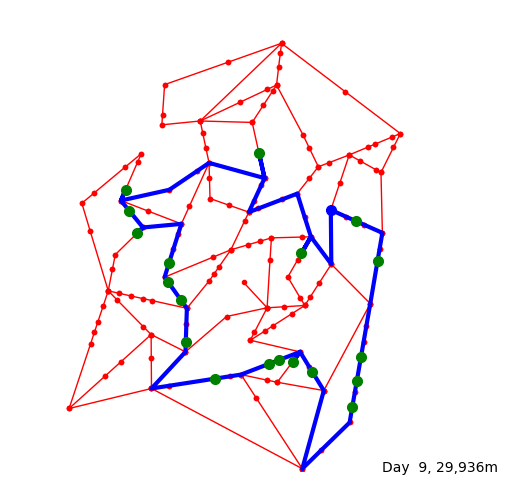

[ 9] 18:18:20.0 Driver leaves for delivery of 22 parcels
[ 9] 18:18:20.0 Driver drives to Customer: 73 (7436, 5411)
[ 9] 18:20:40.9 Driver arrived at Customer: 73 (7436, 5411)
[ 9] 18:21:12.9 Customer: 73 (7436, 5411) answers door
[ 9] 18:21:12.9 Customer: 73 (7436, 5411) accepts Parcel: 89
[ 9] 18:21:26.4 Customer: 73 (7436, 5411) signs off
[ 9] 18:21:27.9 Driver drives to Customer: 20 (7904, 4546)
[ 9] 18:26:26.2 Driver arrived at Customer: 20 (7904, 4546)
[ 9] 18:26:48.2 Customer: 20 (7904, 4546) answers door
[ 9] 18:26:48.2 Customer: 20 (7904, 4546) accepts Parcel: 116
[ 9] 18:26:58.3 Customer: 20 (7904, 4546) signs off
[ 9] 18:26:59.2 Driver drives to Customer: 77 (7546, 2458)
[ 9] 18:35:27.3 Driver arrived at Customer: 77 (7546, 2458)
[ 9] 18:35:50.8 Customer: 77 (7546, 2458) answers door
[ 9] 18:35:50.8 Customer: 77 (7546, 2458) accepts Parcel: 91
[ 9] 18:35:55.4 Customer: 77 (7546, 2458) accepts Parcel: 98
[ 9] 18:36:25.2 Customer: 77 (7546, 2458) signs off
[ 9] 18:36:25.8 Driv

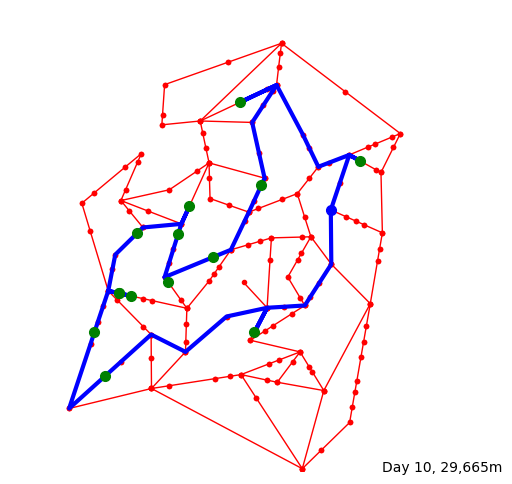

[10] 18:14:10.0 Driver leaves for delivery of 17 parcels
[10] 18:14:10.0 Driver drives to Customer: 22 (7528, 6712)
[10] 18:20:14.6 Driver arrived at Customer: 22 (7528, 6712)
[10] 18:20:26.2 Customer: 22 (7528, 6712) answers door
[10] 18:20:26.2 Customer: 22 (7528, 6712) accepts Parcel: 103
[10] 18:20:29.5 Customer: 22 (7528, 6712) signs off
[10] 18:20:43.6 Driver drives to Customer: 11 (4938, 7977)
[10] 18:36:04.7 Driver arrived at Customer: 11 (4938, 7977)
[10] 18:37:40.5 Customer: 11 (4938, 7977) answers door
[10] 18:37:40.5 Customer: 11 (4938, 7977) accepts Parcel: 117
[10] 18:37:49.6 Customer: 11 (4938, 7977) accepts Parcel: 123
[10] 18:37:49.9 Customer: 11 (4938, 7977) signs off
[10] 18:38:05.6 Driver drives to Customer: 12 (5406, 6190)
[10] 18:51:02.8 Driver arrived at Customer: 12 (5406, 6190)
[10] 18:51:17.3 Customer: 12 (5406, 6190) answers door
[10] 18:51:17.3 Customer: 12 (5406, 6190) accepts Parcel: 124
[10] 18:51:21.5 Customer: 12 (5406, 6190) signs off
[10] 18:51:29.0 D

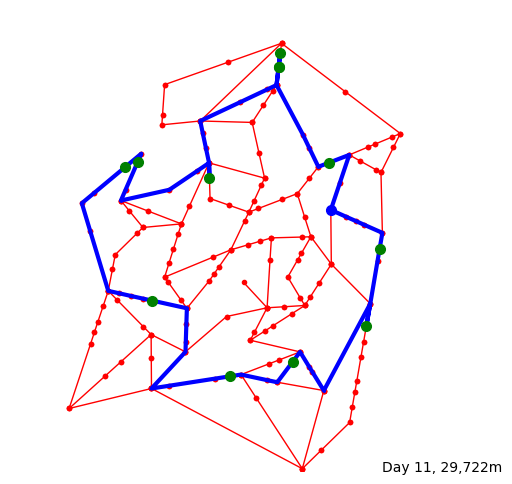

[11] 18:10:50.0 Driver leaves for delivery of 13 parcels
[11] 18:10:50.0 Driver drives to Customer: 16 (6857, 6672)
[11] 18:17:43.8 Driver arrived at Customer: 16 (6857, 6672)
[11] 18:17:44.8 Customer: 16 (6857, 6672) answers door
[11] 18:17:44.8 Customer: 16 (6857, 6672) accepts Parcel: 133
[11] 18:17:51.2 Customer: 16 (6857, 6672) signs off
[11] 18:18:13.1 Driver drives to Customer: 19 (5778, 8751)
[11] 18:28:42.9 Driver arrived at Customer: 19 (5778, 8751)
[11] 18:28:43.3 Customer: 19 (5778, 8751) answers door
[11] 18:28:43.3 Customer: 19 (5778, 8751) accepts Parcel: 141
[11] 18:28:50.8 Customer: 19 (5778, 8751) signs off
[11] 18:28:51.5 Driver drives to Customer: 15 (5813, 9044)
[11] 18:30:02.3 Driver arrived at Customer: 15 (5813, 9044)
[11] 18:31:22.10 Customer: 15 (5813, 9044) answers door
[11] 18:31:22.10 Customer: 15 (5813, 9044) accepts Parcel: 126
[11] 18:31:34.6 Customer: 15 (5813, 9044) signs off
[11] 18:31:48.1 Driver drives to Customer: 19 (5778, 8751)
[11] 18:32:58.9 Dr

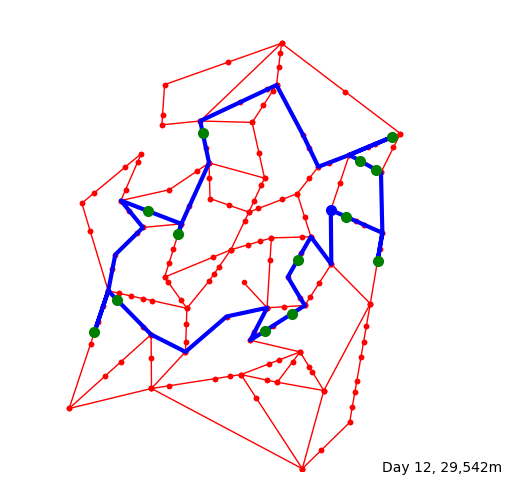

[12] 18:12:30.0 Driver leaves for delivery of 15 parcels
[12] 18:12:30.0 Driver drives to Customer: 62 (6189, 4576)
[12] 18:22:25.2 Driver arrived at Customer: 62 (6189, 4576)
[12] 18:22:35.1 Customer: 62 (6189, 4576) answers door
[12] 18:22:35.1 Customer: 62 (6189, 4576) accepts Parcel: 138
[12] 18:22:37.3 Customer: 62 (6189, 4576) signs off
[12] 18:23:05.5 Driver drives to Customer: 13 (6067, 3408)
[12] 18:28:58.10 Driver arrived at Customer: 13 (6067, 3408)
[12] 18:29:34.3 Customer: 13 (6067, 3408) answers door
[12] 18:29:34.3 Customer: 13 (6067, 3408) accepts Parcel: 149
[12] 18:29:34.8 Customer: 13 (6067, 3408) signs off
[12] 18:29:39.7 Driver drives to Customer: 23 (5474, 3026)
[12] 18:32:28.7 Driver arrived at Customer: 23 (5474, 3026)
[12] 18:32:39.4 Customer: 23 (5474, 3026) answers door
[12] 18:32:39.4 Customer: 23 (5474, 3026) accepts Parcel: 146
[12] 18:32:40.3 Customer: 23 (5474, 3026) signs off
[12] 18:32:42.3 Driver drives to Customer:  4 (2311, 3695)
[12] 18:53:00.3 Dri

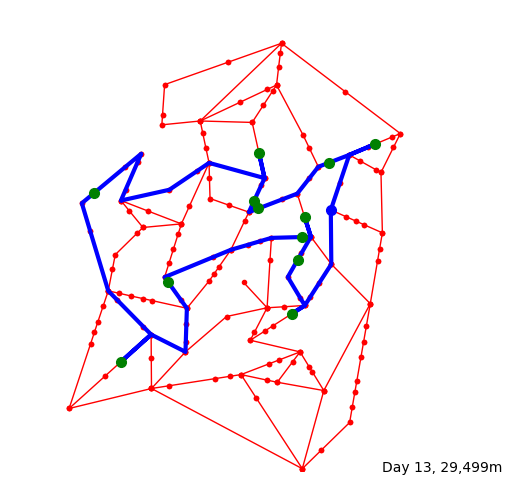

[13] 18:10:00.0 Driver leaves for delivery of 12 parcels
[13] 18:10:00.0 Driver drives to Customer: 13 (6067, 3408)
[13] 18:20:13.7 Driver arrived at Customer: 13 (6067, 3408)
[13] 18:20:37.9 Customer: 13 (6067, 3408) answers door
[13] 18:20:37.9 Customer: 13 (6067, 3408) accepts Parcel: 159
[13] 18:20:42.0 Customer: 13 (6067, 3408) signs off
[13] 18:20:43.1 Driver drives to Customer: 62 (6189, 4576)
[13] 18:26:36.6 Driver arrived at Customer: 62 (6189, 4576)
[13] 18:28:02.4 Customer: 62 (6189, 4576) answers door
[13] 18:28:02.4 Customer: 62 (6189, 4576) accepts Parcel: 157
[13] 18:28:18.2 Customer: 62 (6189, 4576) signs off
[13] 18:28:22.1 Driver drives to Customer: 27 (6339, 5488)
[13] 18:32:23.6 Driver arrived at Customer: 27 (6339, 5488)
[13] 18:32:47.9 Customer: 27 (6339, 5488) answers door
[13] 18:32:47.9 Customer: 27 (6339, 5488) accepts Parcel: 160
[13] 18:32:51.8 Customer: 27 (6339, 5488) signs off
[13] 18:32:52.1 Driver drives to Customer: 61 (6282, 5064)
[13] 18:35:22.6 Driv

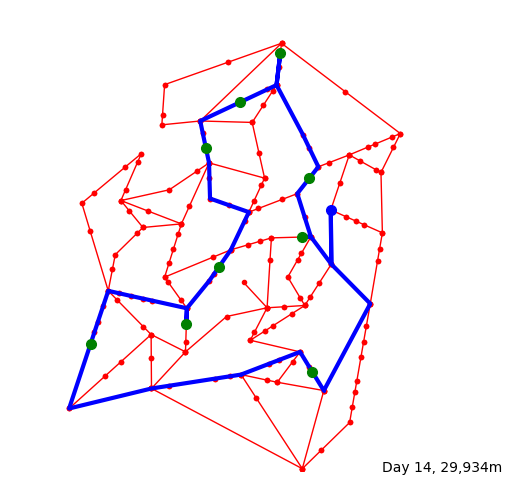

[14] 18:07:30.0 Driver leaves for delivery of 9 parcels
[14] 18:07:30.0 Driver drives to Customer: 61 (6282, 5064)
[14] 18:15:54.2 Driver arrived at Customer: 61 (6282, 5064)
[14] 18:17:34.9 Customer: 61 (6282, 5064) answers door
[14] 18:17:34.9 Customer: 61 (6282, 5064) accepts Parcel: 176
[14] 18:17:40.7 Customer: 61 (6282, 5064) signs off
[14] 18:17:41.5 Driver drives to Customer:  9 (6438, 6337)
[14] 18:24:02.9 Driver arrived at Customer:  9 (6438, 6337)
[14] 18:24:25.1 Customer:  9 (6438, 6337) answers door
[14] 18:24:25.1 Customer:  9 (6438, 6337) accepts Parcel: 172
[14] 18:24:39.2 Customer:  9 (6438, 6337) signs off
[14] 18:24:56.9 Driver drives to Customer: 15 (5813, 9044)
[14] 18:36:54.7 Driver arrived at Customer: 15 (5813, 9044)
[14] 18:36:56.3 Customer: 15 (5813, 9044) answers door
[14] 18:36:56.3 Customer: 15 (5813, 9044) accepts Parcel: 169
[14] 18:36:58.3 Customer: 15 (5813, 9044) signs off
[14] 18:37:05.0 Driver drives to Customer: 11 (4938, 7977)
[14] 18:43:22.3 Drive

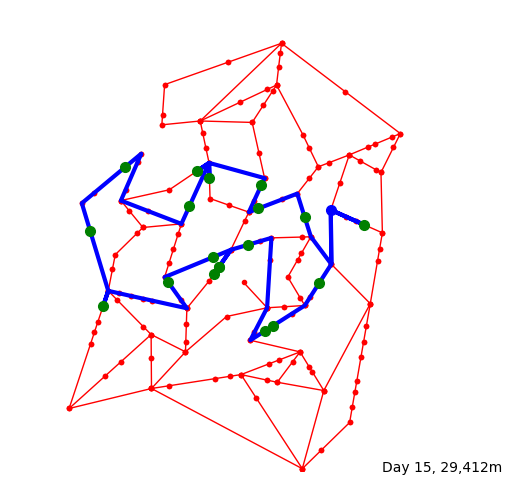

[15] 18:18:20.0 Driver leaves for delivery of 22 parcels
[15] 18:18:20.0 Driver drives to Customer: 93 (7622, 5327)
[15] 18:21:29.8 Driver arrived at Customer: 93 (7622, 5327)
[15] 18:22:22.6 Customer: 93 (7622, 5327) answers door
[15] 18:22:22.6 Customer: 93 (7622, 5327) accepts Parcel: 189
[15] 18:22:25.5 Customer: 93 (7622, 5327) signs off
[15] 18:22:28.9 Driver drives to Customer: 28 (6650, 4070)
[15] 18:32:16.4 Driver arrived at Customer: 28 (6650, 4070)
[15] 18:33:09.7 Customer: 28 (6650, 4070) answers door
[15] 18:33:09.7 Customer: 28 (6650, 4070) accepts Parcel: 195
[15] 18:33:20.4 Customer: 28 (6650, 4070) signs off
[15] 18:33:33.10 Driver drives to Customer: 29 (5661, 3147)
[15] 18:39:05.7 Driver arrived at Customer: 29 (5661, 3147)
[15] 18:39:34.6 Customer: 29 (5661, 3147) answers door
[15] 18:39:34.6 Customer: 29 (5661, 3147) accepts Parcel: 183
[15] 18:39:54.2 Customer: 29 (5661, 3147) signs off
[15] 18:39:55.5 Driver drives to Customer: 23 (5474, 3026)
[15] 18:40:48.8 Dri

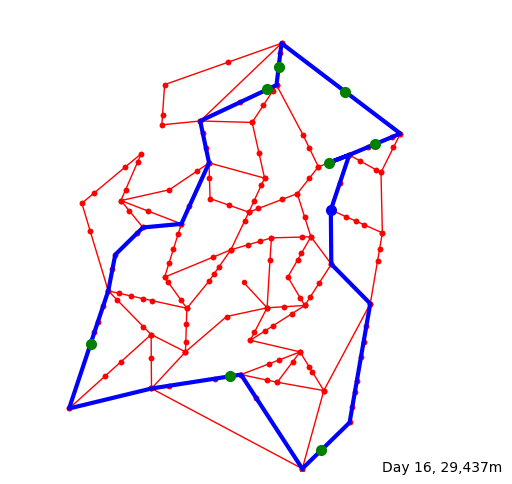

[16] 18:08:20.0 Driver leaves for delivery of 10 parcels
[16] 18:08:20.0 Driver drives to Customer: 16 (6857, 6672)
[16] 18:15:13.8 Driver arrived at Customer: 16 (6857, 6672)
[16] 18:15:28.8 Customer: 16 (6857, 6672) answers door
[16] 18:15:28.8 Customer: 16 (6857, 6672) accepts Parcel: 201
[16] 18:15:47.7 Customer: 16 (6857, 6672) accepts Parcel: 211
[16] 18:15:50.7 Customer: 16 (6857, 6672) accepts Parcel: 213
[16] 18:15:59.9 Customer: 16 (6857, 6672) signs off
[16] 18:16:12.1 Driver drives to Customer: 21 (7852, 7076)
[16] 18:20:29.4 Driver arrived at Customer: 21 (7852, 7076)
[16] 18:21:38.3 Customer: 21 (7852, 7076) answers door
[16] 18:21:38.3 Customer: 21 (7852, 7076) accepts Parcel: 210
[16] 18:21:53.7 Customer: 21 (7852, 7076) signs off
[16] 18:21:58.6 Driver drives to Customer: 85 (7212, 8208)
[16] 18:30:16.8 Driver arrived at Customer: 85 (7212, 8208)
[16] 18:30:19.2 Customer: 85 (7212, 8208) answers door
[16] 18:30:19.2 Customer: 85 (7212, 8208) accepts Parcel: 193
[16] 18

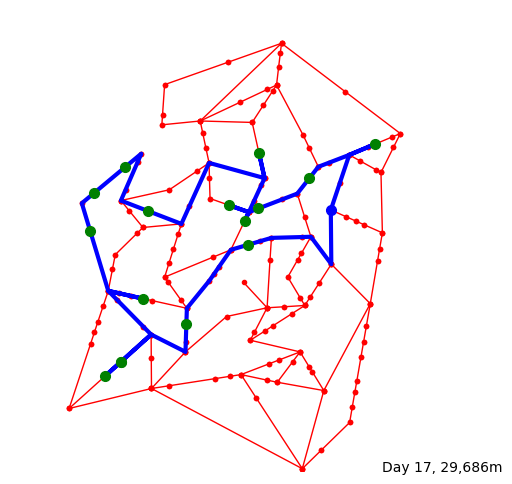

[17] 18:15:00.0 Driver leaves for delivery of 18 parcels
[17] 18:15:00.0 Driver drives to Customer: 70 (5108, 4893)
[17] 18:28:11.0 Driver arrived at Customer: 70 (5108, 4893)
[17] 18:28:12.9 Customer: 70 (5108, 4893) answers door
[17] 18:28:12.9 Customer: 70 (5108, 4893) accepts Parcel: 214
[17] 18:28:15.4 Customer: 70 (5108, 4893) accepts Parcel: 224
[17] 18:28:26.0 Customer: 70 (5108, 4893) signs off
[17] 18:28:26.7 Driver drives to Customer: 80 (3793, 3191)
[17] 18:37:34.9 Driver arrived at Customer: 80 (3793, 3191)
[17] 18:37:37.5 Customer: 80 (3793, 3191) answers door
[17] 18:37:37.5 Customer: 80 (3793, 3191) accepts Parcel: 216
[17] 18:38:13.3 Customer: 80 (3793, 3191) signs off
[17] 18:38:18.8 Driver drives to Customer: 18 (2383, 2362)
[17] 18:47:35.6 Driver arrived at Customer: 18 (2383, 2362)
[17] 18:49:04.7 Customer: 18 (2383, 2362) answers door
[17] 18:49:04.7 Customer: 18 (2383, 2362) accepts Parcel: 229
[17] 18:49:07.2 Customer: 18 (2383, 2362) signs off
[17] 18:49:12.9 D

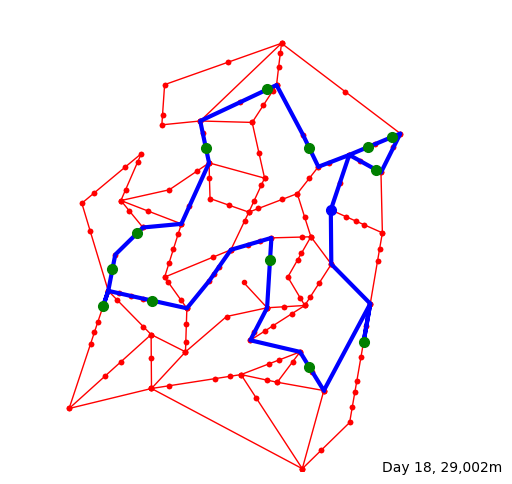

[18] 18:11:40.0 Driver leaves for delivery of 14 parcels
[18] 18:11:40.0 Driver drives to Customer: 72 (7870, 6521)
[18] 18:19:18.4 Driver arrived at Customer: 72 (7870, 6521)
[18] 18:20:23.10 Customer: 72 (7870, 6521) answers door
[18] 18:20:23.10 Customer: 72 (7870, 6521) accepts Parcel: 225
[18] 18:20:37.2 Customer: 72 (7870, 6521) accepts Parcel: 237
[18] 18:20:37.4 Customer: 72 (7870, 6521) signs off
[18] 18:21:04.4 Driver drives to Customer: 53 (8211, 7227)
[18] 18:26:06.8 Driver arrived at Customer: 53 (8211, 7227)
[18] 18:26:08.3 Customer: 53 (8211, 7227) answers door
[18] 18:26:08.3 Customer: 53 (8211, 7227) accepts Parcel: 220
[18] 18:26:09.2 Customer: 53 (8211, 7227) signs off
[18] 18:26:12.7 Driver drives to Customer: 58 (7707, 7015)
[18] 18:28:23.7 Driver arrived at Customer: 58 (7707, 7015)
[18] 18:28:30.3 Customer: 58 (7707, 7015) answers door
[18] 18:28:30.3 Customer: 58 (7707, 7015) accepts Parcel: 233
[18] 18:28:32.9 Customer: 58 (7707, 7015) signs off
[18] 18:28:37.3

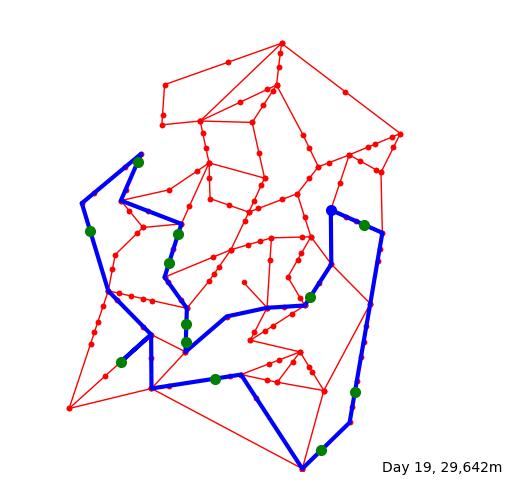

[19] 18:10:50.0 Driver leaves for delivery of 13 parcels
[19] 18:10:50.0 Driver drives to Customer: 36 (6453, 3761)
[19] 18:18:55.5 Driver arrived at Customer: 36 (6453, 3761)
[19] 18:19:04.9 Customer: 36 (6453, 3761) answers door
[19] 18:19:04.9 Customer: 36 (6453, 3761) accepts Parcel: 236
[19] 18:19:13.2 Customer: 36 (6453, 3761) signs off
[19] 18:19:17.2 Driver drives to Customer: 10 (3780, 2782)
[19] 18:32:25.4 Driver arrived at Customer: 10 (3780, 2782)
[19] 18:34:43.8 Customer: 10 (3780, 2782) answers door
[19] 18:34:43.8 Customer: 10 (3780, 2782) accepts Parcel: 238
[19] 18:35:09.6 Customer: 10 (3780, 2782) signs off
[19] 18:35:18.4 Driver drives to Customer: 80 (3793, 3191)
[19] 18:36:56.6 Driver arrived at Customer: 80 (3793, 3191)
[19] 18:37:47.5 Customer: 80 (3793, 3191) answers door
[19] 18:37:47.5 Customer: 80 (3793, 3191) accepts Parcel: 250
[19] 18:37:58.9 Customer: 80 (3793, 3191) signs off
[19] 18:38:03.3 Driver drives to Customer: 40 (3420, 4501)
[19] 18:43:57.3 Driv

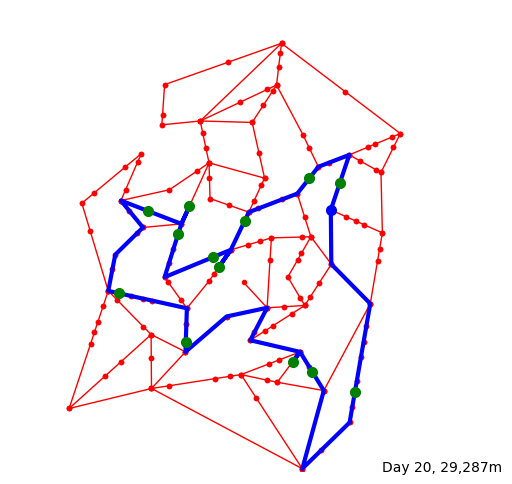

[20] 18:12:30.0 Driver leaves for delivery of 15 parcels
[20] 18:12:30.0 Driver drives to Customer:  7 (7092, 6231)
[20] 18:14:56.4 Driver arrived at Customer:  7 (7092, 6231)
[20] 18:16:56.1 Customer:  7 (7092, 6231) answers door
[20] 18:16:56.1 Customer:  7 (7092, 6231) accepts Parcel: 251
[20] 18:16:57.10 Customer:  7 (7092, 6231) signs off
[20] 18:16:59.8 Driver drives to Customer:  9 (6438, 6337)
[20] 18:23:40.6 Driver arrived at Customer:  9 (6438, 6337)
[20] 18:24:23.6 Customer:  9 (6438, 6337) answers door
[20] 18:24:23.6 Customer:  9 (6438, 6337) accepts Parcel: 249
[20] 18:24:25.4 Customer:  9 (6438, 6337) signs off
[20] 18:24:26.5 Driver drives to Customer: 65 (5044, 5409)
[20] 18:31:26.8 Driver arrived at Customer: 65 (5044, 5409)
[20] 18:31:54.8 Customer: 65 (5044, 5409) answers door
[20] 18:31:54.8 Customer: 65 (5044, 5409) accepts Parcel: 248
[20] 18:32:10.7 Customer: 65 (5044, 5409) signs off
[20] 18:32:20.0 Driver drives to Customer: 88 (4486, 4407)
[20] 18:36:56.0 Dri

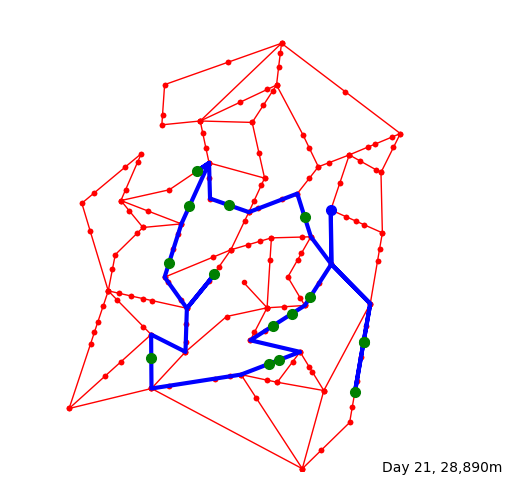

[21] 18:13:20.0 Driver leaves for delivery of 16 parcels
[21] 18:13:20.0 Driver drives to Customer:  8 (7603, 2787)
[21] 18:26:12.6 Driver arrived at Customer:  8 (7603, 2787)
[21] 18:26:40.0 Customer:  8 (7603, 2787) answers door
[21] 18:26:40.0 Customer:  8 (7603, 2787) accepts Parcel: 270
[21] 18:26:53.2 Customer:  8 (7603, 2787) signs off
[21] 18:26:56.0 Driver drives to Customer: 75 (7416, 1705)
[21] 18:31:19.1 Driver arrived at Customer: 75 (7416, 1705)
[21] 18:32:48.0 Customer: 75 (7416, 1705) answers door
[21] 18:32:48.0 Customer: 75 (7416, 1705) accepts Parcel: 272
[21] 18:32:51.2 Customer: 75 (7416, 1705) signs off
[21] 18:33:20.2 Driver drives to Customer:  8 (7603, 2787)
[21] 18:37:43.3 Driver arrived at Customer:  8 (7603, 2787)
[21] 18:39:27.7 Customer:  8 (7603, 2787) answers door
[21] 18:39:27.7 Customer:  8 (7603, 2787) accepts Parcel: 270
[21] 18:39:28.5 Customer:  8 (7603, 2787) signs off
[21] 18:39:34.4 Driver drives to Customer: 27 (6339, 5488)
[21] 18:52:26.10 Dri

In [74]:
random.seed(0)
recP3 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [75]:
standardMeasureConverter(recP3.daily)

### Simulation Records

In [76]:
recP3.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,71539,22.661,112.316667,0,NaN
1,151200,159565,28.536,139.416667,1,NaN
2,237600,246109,29.448,141.816667,7,1.251632
3,324000,333346,29.319,155.766667,9,0.980714
4,410400,419692,29.916,154.866667,10,1.27749
5,496800,505621,29.081,147.016667,5,1.400737
6,583200,591733,28.557,142.216667,1,1.626069
7,669600,678428,29.428,147.133333,8,1.452569
8,756000,764895,29.571,148.25,11,0.818582
9,842400,852259,29.936,164.316667,5,1.290303


### Time Plot

In [77]:
np.mean(recP3.daily['Working Time (in minutes)'])

149.66515151515148

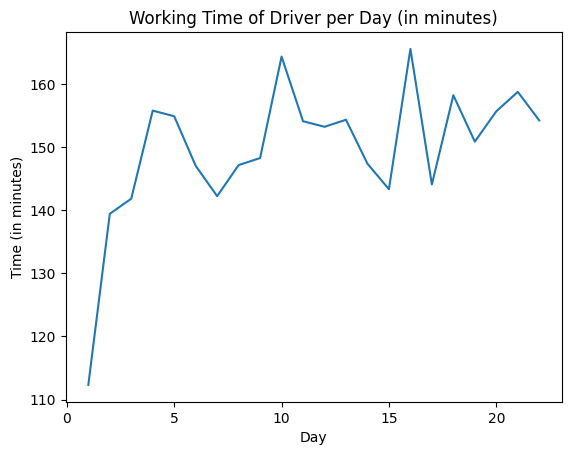

In [78]:
timePlot = plt.plot(recP3.daily.index +1 ,recP3.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [79]:
np.mean(recP3.daily['Delivery Route Distance(in km)'])

29.09868181818182

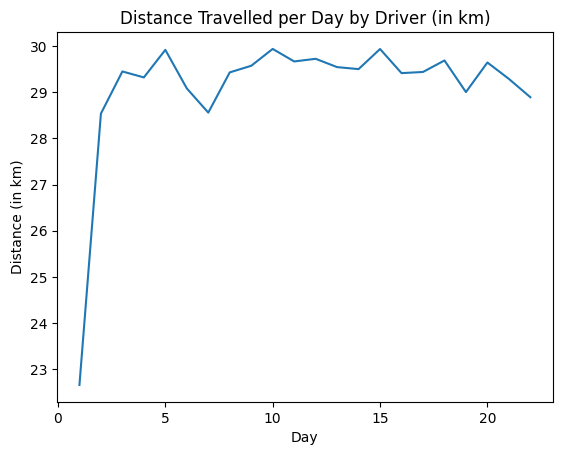

In [80]:
distancePlot = plt.plot(recP3.daily.index +1 ,recP3.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [81]:
np.mean(recP3.daily['Number of left over parcels'])

5.409090909090909

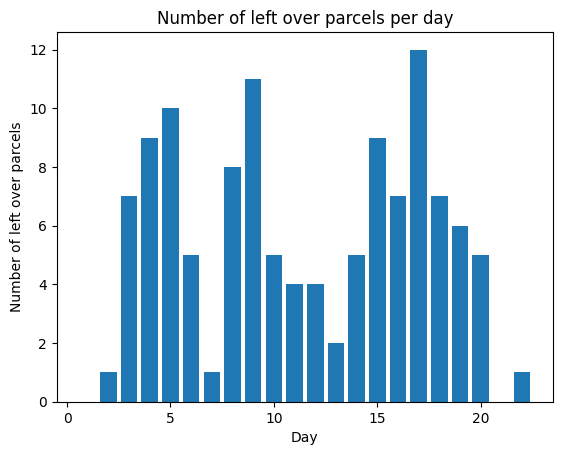

In [82]:
leftOverPlot = plt.bar(recP3.daily.index +1 ,recP3.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [83]:
np.mean(recP3.daily['Delay Time(in days)'])

1.2710686013311197

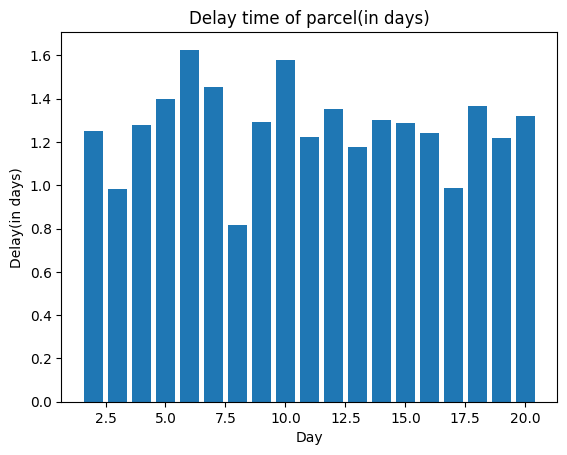

In [84]:
delayPlot = plt.bar(recP3.daily.index ,recP3.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

# Scenario 2

Suppose due to declines in sales the average number of parcels per customer falls to 2.

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 205 deliveries over 22 days.


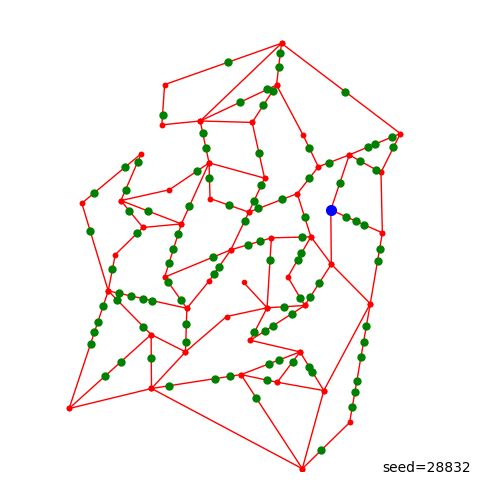

In [85]:
data = generateData(28832, p = 2, plot=True, log=True)

## Storing generated data into the pickle file

In [86]:
with open('dataSeed28832P2.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [87]:
with open('dataSeed28832P2.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 193 parcels over 22 days to 100 customers
[ 0] 09:29:04.7 Parcel:  0 arr at delivery centre
[ 0] 10:36:59.8 Parcel:  1 arr at delivery centre
[ 0] 11:03:07.4 Parcel:  2 arr at delivery centre
[ 0] 11:17:28.1 Parcel:  3 arr at delivery centre
[ 0] 11:51:44.7 Parcel:  4 arr at delivery centre
[ 0] 12:16:35.8 Parcel:  5 arr at delivery centre
[ 0] 13:29:55.2 Parcel:  6 arr at delivery centre
[ 0] 13:47:13.4 Parcel:  7 arr at delivery centre
[ 0] 14:18:13.1 Parcel:  8 arr at delivery centre
[ 0] 15:00:08.3 Parcel:  9 arr at delivery centre
[ 0] 16:54:25.6 Parcel: 10 arr at delivery centre
[ 0] 18:00:00.0 Driver arrives for work
[ 0] 18:00:00.0 Parcel:  1 out for delivery
[ 0] 18:00:00.0 Parcel:  4 out for delivery
[ 0] 18:00:00.0 Parcel:  9 out for delivery
[ 0] 18:00:00.0 Parcel:  7 out for delivery
[ 0] 18:00:00.0 Parcel:  0 out for delivery
[ 0] 18:00:00.0 Parcel: 10 out for delivery
[ 0] 18:00:00.0 Parcel:  8 out for delivery
[ 0] 18:00:00.0 Parcel:  3 out for de

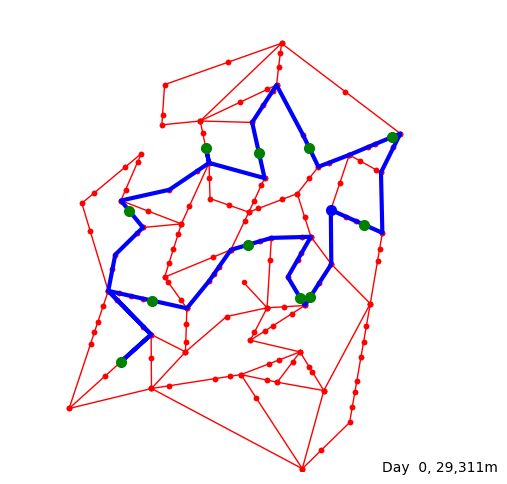

[ 0] 18:09:10.0 Driver leaves for delivery of 11 parcels
[ 0] 18:09:10.0 Driver drives to Customer: 36 (6453, 3761)
[ 0] 18:17:15.5 Driver arrived at Customer: 36 (6453, 3761)
[ 0] 18:17:49.1 Customer: 36 (6453, 3761) answers door
[ 0] 18:17:49.1 Customer: 36 (6453, 3761) accepts Parcel:  1
[ 0] 18:17:54.5 Customer: 36 (6453, 3761) signs off
[ 0] 18:17:59.6 Driver drives to Customer: 56 (6245, 3741)
[ 0] 18:19:34.2 Driver arrived at Customer: 56 (6245, 3741)
[ 0] 18:20:22.6 Customer: 56 (6245, 3741) answers door
[ 0] 18:20:22.6 Customer: 56 (6245, 3741) accepts Parcel:  4
[ 0] 18:20:27.10 Customer: 56 (6245, 3741) signs off
[ 0] 18:20:38.8 Driver drives to Customer: 70 (5108, 4893)
[ 0] 18:32:18.9 Driver arrived at Customer: 70 (5108, 4893)
[ 0] 18:32:20.8 Customer: 70 (5108, 4893) answers door
[ 0] 18:32:20.8 Customer: 70 (5108, 4893) accepts Parcel:  9
[ 0] 18:32:26.7 Customer: 70 (5108, 4893) signs off
[ 0] 18:32:29.7 Driver drives to Customer: 32 (3049, 3690)
[ 0] 18:43:23.10 Drive

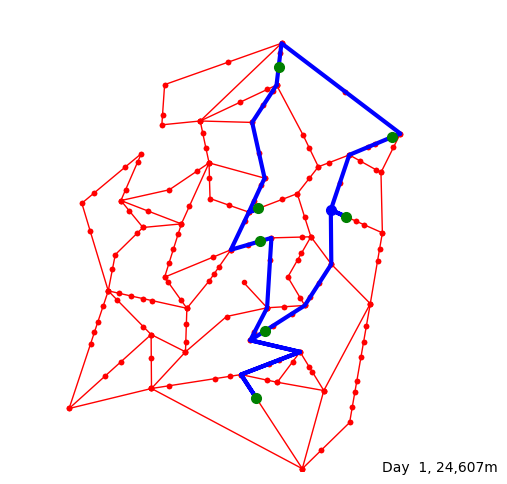

[ 1] 18:05:50.0 Driver leaves for delivery of 7 parcels
[ 1] 18:05:50.0 Driver drives to Customer: 53 (8211, 7227)
[ 1] 18:14:48.8 Driver arrived at Customer: 53 (8211, 7227)
[ 1] 18:15:58.0 Customer: 53 (8211, 7227) answers door
[ 1] 18:15:58.0 Customer: 53 (8211, 7227) accepts Parcel: 11
[ 1] 18:16:05.5 Customer: 53 (8211, 7227) signs off
[ 1] 18:16:06.5 Driver drives to Customer: 19 (5778, 8751)
[ 1] 18:31:48.5 Driver arrived at Customer: 19 (5778, 8751)
[ 1] 18:31:53.6 Customer: 19 (5778, 8751) answers door
[ 1] 18:31:53.6 Customer: 19 (5778, 8751) accepts Parcel: 15
[ 1] 18:32:04.1 Customer: 19 (5778, 8751) signs off
[ 1] 18:32:24.8 Driver drives to Customer:  2 (5342, 5682)
[ 1] 18:46:54.3 Driver arrived at Customer:  2 (5342, 5682)
[ 1] 18:47:07.4 Customer:  2 (5342, 5682) answers door
[ 1] 18:47:07.4 Customer:  2 (5342, 5682) accepts Parcel: 13
[ 1] 18:47:45.8 Customer:  2 (5342, 5682) signs off
[ 1] 18:47:46.9 Driver drives to Customer: 35 (5376, 4973)
[ 1] 18:54:52.4 Driver a

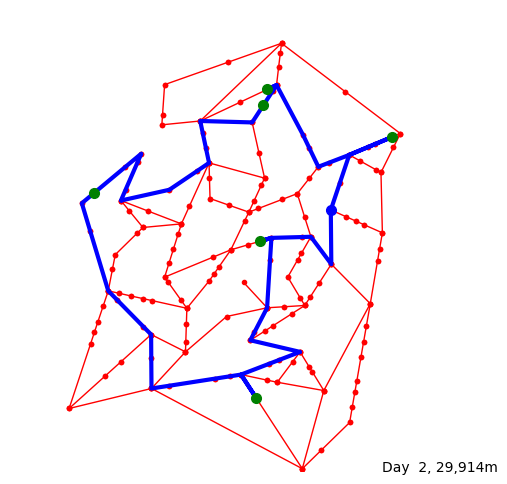

[ 2] 18:05:00.0 Driver leaves for delivery of 6 parcels
[ 2] 18:05:00.0 Driver drives to Customer: 35 (5376, 4973)
[ 2] 18:17:04.1 Driver arrived at Customer: 35 (5376, 4973)
[ 2] 18:17:17.1 Customer: 35 (5376, 4973) answers door
[ 2] 18:17:17.1 Customer: 35 (5376, 4973) accepts Parcel: 21
[ 2] 18:17:17.3 Customer: 35 (5376, 4973) signs off
[ 2] 18:17:17.7 Driver drives to Customer: 60 (5300, 1573)
[ 2] 18:39:48.7 Driver arrived at Customer: 60 (5300, 1573)
[ 2] 18:40:34.4 Customer: 60 (5300, 1573) answers door
[ 2] 18:40:34.4 Customer: 60 (5300, 1573) accepts Parcel: 20
[ 2] 18:40:42.6 Customer: 60 (5300, 1573) signs off
[ 2] 18:41:11.9 Driver drives to Customer: 64 (1814, 6022)
[ 2] 19:10:41.6 Driver arrived at Customer: 64 (1814, 6022)
[ 2] 19:12:33.1 Customer: 64 (1814, 6022) answers door
[ 2] 19:12:33.1 Customer: 64 (1814, 6022) accepts Parcel: 18
[ 2] 19:12:57.2 Customer: 64 (1814, 6022) signs off
[ 2] 19:12:57.6 Driver drives to Customer: 34 (5446, 7913)
[ 2] 19:40:57.9 Driver a

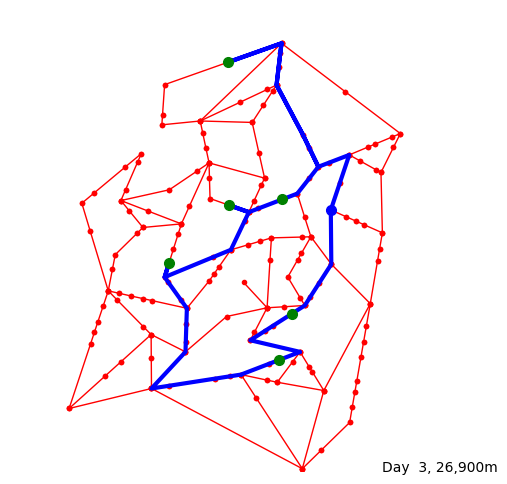

[ 3] 18:05:00.0 Driver leaves for delivery of 6 parcels
[ 3] 18:05:00.0 Driver drives to Customer: 13 (6067, 3408)
[ 3] 18:15:13.7 Driver arrived at Customer: 13 (6067, 3408)
[ 3] 18:15:49.1 Customer: 13 (6067, 3408) answers door
[ 3] 18:15:49.1 Customer: 13 (6067, 3408) accepts Parcel: 26
[ 3] 18:15:49.2 Customer: 13 (6067, 3408) signs off
[ 3] 18:15:50.8 Driver drives to Customer: 54 (5791, 2405)
[ 3] 18:26:25.6 Driver arrived at Customer: 54 (5791, 2405)
[ 3] 18:26:41.8 Customer: 54 (5791, 2405) answers door
[ 3] 18:26:41.8 Customer: 54 (5791, 2405) accepts Parcel: 29
[ 3] 18:26:57.4 Customer: 54 (5791, 2405) signs off
[ 3] 18:27:10.1 Driver drives to Customer: 40 (3420, 4501)
[ 3] 18:51:08.2 Driver arrived at Customer: 40 (3420, 4501)
[ 3] 18:51:24.7 Customer: 40 (3420, 4501) answers door
[ 3] 18:51:24.7 Customer: 40 (3420, 4501) accepts Parcel: 24
[ 3] 18:51:34.4 Customer: 40 (3420, 4501) signs off
[ 3] 18:51:34.8 Driver drives to Customer: 66 (4715, 5751)
[ 3] 19:04:25.4 Driver a

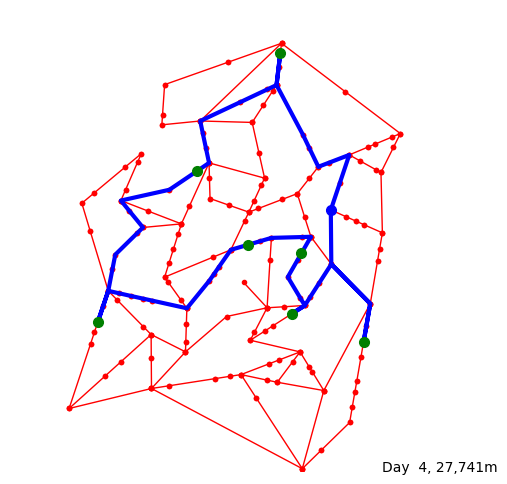

[ 4] 18:05:50.0 Driver leaves for delivery of 7 parcels
[ 4] 18:05:50.0 Driver drives to Customer: 15 (5813, 9044)
[ 4] 18:24:24.3 Driver arrived at Customer: 15 (5813, 9044)
[ 4] 18:24:32.2 Customer: 15 (5813, 9044) answers door
[ 4] 18:24:32.2 Customer: 15 (5813, 9044) accepts Parcel: 30
[ 4] 18:24:39.6 Customer: 15 (5813, 9044) signs off
[ 4] 18:24:40.4 Driver drives to Customer: 89 (4022, 6492)
[ 4] 18:39:39.7 Driver arrived at Customer: 89 (4022, 6492)
[ 4] 18:40:00.3 Customer: 89 (4022, 6492) answers door
[ 4] 18:40:00.3 Customer: 89 (4022, 6492) accepts Parcel: 32
[ 4] 18:40:04.3 Customer: 89 (4022, 6492) signs off
[ 4] 18:40:09.6 Driver drives to Customer: 91 (1887, 3221)
[ 4] 18:59:41.8 Driver arrived at Customer: 91 (1887, 3221)
[ 4] 18:59:45.10 Customer: 91 (1887, 3221) answers door
[ 4] 18:59:45.10 Customer: 91 (1887, 3221) accepts Parcel: 31
[ 4] 19:00:09.9 Customer: 91 (1887, 3221) signs off
[ 4] 19:00:16.3 Driver drives to Customer: 70 (5108, 4893)
[ 4] 19:17:51.6 Driver

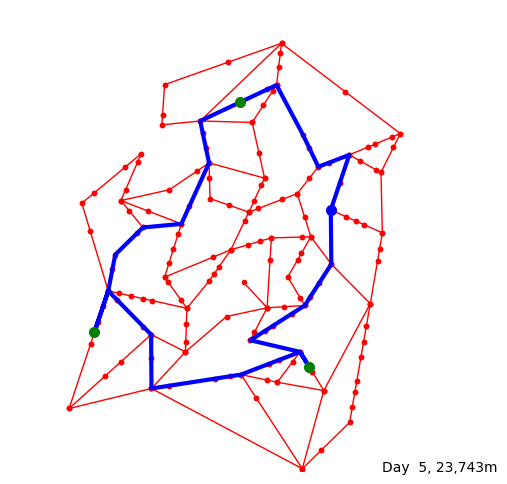

[ 5] 18:02:30.0 Driver leaves for delivery of 3 parcels
[ 5] 18:02:30.0 Driver drives to Customer: 39 (6430, 2261)
[ 5] 18:22:52.3 Driver arrived at Customer: 39 (6430, 2261)
[ 5] 18:25:19.2 Customer: 39 (6430, 2261) answers door
[ 5] 18:25:19.2 Customer: 39 (6430, 2261) accepts Parcel: 39
[ 5] 18:25:29.4 Customer: 39 (6430, 2261) signs off
[ 5] 18:25:30.0 Driver drives to Customer: 46 (1815, 3002)
[ 5] 18:53:55.7 Driver arrived at Customer: 46 (1815, 3002)
[ 5] 18:53:59.3 Customer: 46 (1815, 3002) answers door
[ 5] 18:53:59.3 Customer: 46 (1815, 3002) accepts Parcel: 37
[ 5] 18:54:13.1 Customer: 46 (1815, 3002) signs off
[ 5] 18:54:13.8 Driver drives to Customer: 11 (4938, 7977)
[ 5] 19:21:05.6 Driver arrived at Customer: 11 (4938, 7977)
[ 5] 19:21:05.9 Customer: 11 (4938, 7977) answers door
[ 5] 19:21:05.9 Customer: 11 (4938, 7977) accepts Parcel: 38
[ 5] 19:21:10.9 Customer: 11 (4938, 7977) signs off
[ 5] 19:21:18.2 Driver returns to delivery centre
[ 5] 19:40:36.7 Driver arrived at

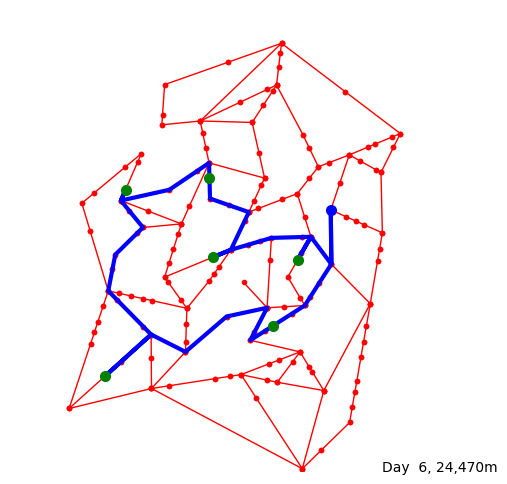

[ 6] 18:05:00.0 Driver leaves for delivery of 6 parcels
[ 6] 18:05:00.0 Driver drives to Customer: 62 (6189, 4576)
[ 6] 18:14:55.2 Driver arrived at Customer: 62 (6189, 4576)
[ 6] 18:15:19.0 Customer: 62 (6189, 4576) answers door
[ 6] 18:15:19.0 Customer: 62 (6189, 4576) accepts Parcel: 45
[ 6] 18:15:25.7 Customer: 62 (6189, 4576) signs off
[ 6] 18:15:34.5 Driver drives to Customer: 30 (4374, 4632)
[ 6] 18:26:30.2 Driver arrived at Customer: 30 (4374, 4632)
[ 6] 18:27:15.7 Customer: 30 (4374, 4632) answers door
[ 6] 18:27:15.7 Customer: 30 (4374, 4632) accepts Parcel: 42
[ 6] 18:27:21.2 Customer: 30 (4374, 4632) signs off
[ 6] 18:27:25.8 Driver drives to Customer: 82 (4289, 6348)
[ 6] 18:38:00.3 Driver arrived at Customer: 82 (4289, 6348)
[ 6] 18:40:58.8 Customer: 82 (4289, 6348) answers door
[ 6] 18:40:58.8 Customer: 82 (4289, 6348) accepts Parcel: 44
[ 6] 18:41:01.8 Customer: 82 (4289, 6348) signs off
[ 6] 18:41:16.8 Driver drives to Customer: 49 (2484, 6084)
[ 6] 18:51:57.6 Driver a

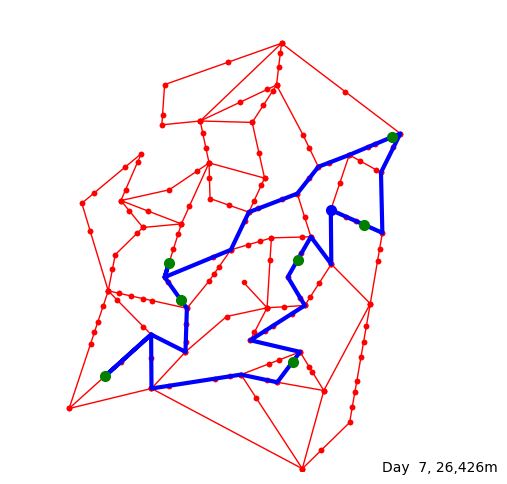

[ 7] 18:05:50.0 Driver leaves for delivery of 7 parcels
[ 7] 18:05:50.0 Driver drives to Customer: 62 (6189, 4576)
[ 7] 18:15:45.2 Driver arrived at Customer: 62 (6189, 4576)
[ 7] 18:16:05.5 Customer: 62 (6189, 4576) answers door
[ 7] 18:16:05.5 Customer: 62 (6189, 4576) accepts Parcel: 47
[ 7] 18:16:07.8 Customer: 62 (6189, 4576) signs off
[ 7] 18:16:08.2 Driver drives to Customer: 52 (6082, 2369)
[ 7] 18:31:44.0 Driver arrived at Customer: 52 (6082, 2369)
[ 7] 18:33:42.2 Customer: 52 (6082, 2369) answers door
[ 7] 18:33:42.2 Customer: 52 (6082, 2369) accepts Parcel: 46
[ 7] 18:33:44.7 Customer: 52 (6082, 2369) signs off
[ 7] 18:33:46.3 Driver drives to Customer: 99 (2038, 2049)
[ 7] 18:57:01.4 Driver arrived at Customer: 99 (2038, 2049)
[ 7] 18:57:10.2 Customer: 99 (2038, 2049) answers door
[ 7] 18:57:10.2 Customer: 99 (2038, 2049) accepts Parcel: 51
[ 7] 18:57:14.9 Customer: 99 (2038, 2049) signs off
[ 7] 18:57:22.9 Driver drives to Customer: 25 (3671, 3708)
[ 7] 19:10:45.4 Driver a

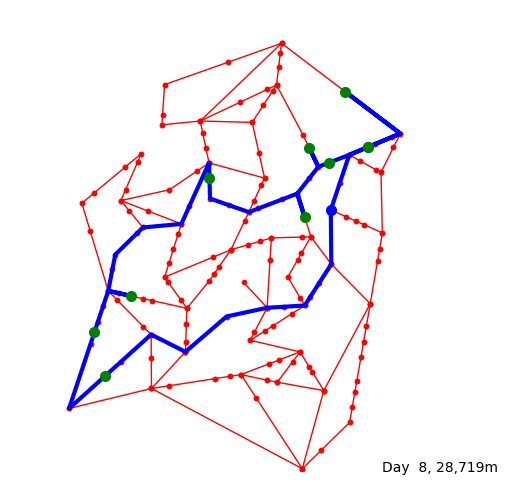

[ 8] 18:08:20.0 Driver leaves for delivery of 10 parcels
[ 8] 18:08:20.0 Driver drives to Customer: 58 (7707, 7015)
[ 8] 18:15:07.8 Driver arrived at Customer: 58 (7707, 7015)
[ 8] 18:15:52.1 Customer: 58 (7707, 7015) answers door
[ 8] 18:15:52.1 Customer: 58 (7707, 7015) accepts Parcel: 56
[ 8] 18:15:54.4 Customer: 58 (7707, 7015) signs off
[ 8] 18:16:03.8 Driver drives to Customer: 85 (7212, 8208)
[ 8] 18:24:59.7 Driver arrived at Customer: 85 (7212, 8208)
[ 8] 18:25:09.6 Customer: 85 (7212, 8208) answers door
[ 8] 18:25:09.6 Customer: 85 (7212, 8208) accepts Parcel: 53
[ 8] 18:25:13.7 Customer: 85 (7212, 8208) signs off
[ 8] 18:25:46.6 Driver drives to Customer: 58 (7707, 7015)
[ 8] 18:34:42.5 Driver arrived at Customer: 58 (7707, 7015)
[ 8] 18:36:14.2 Customer: 58 (7707, 7015) answers door
[ 8] 18:36:14.2 Customer: 58 (7707, 7015) accepts Parcel: 56
[ 8] 18:36:31.3 Customer: 58 (7707, 7015) signs off
[ 8] 18:36:31.6 Driver drives to Customer: 16 (6857, 6672)
[ 8] 18:40:11.2 Driver 

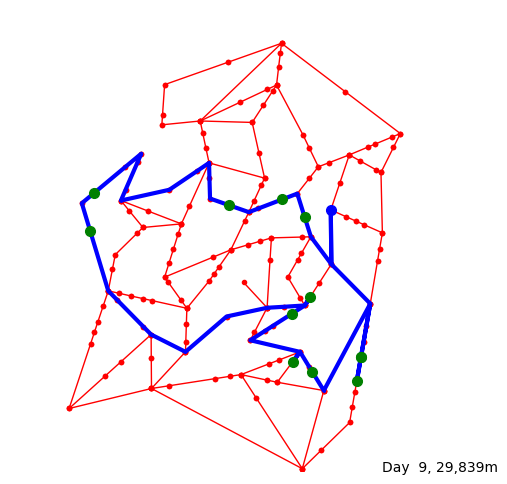

[ 9] 18:10:00.0 Driver leaves for delivery of 12 parcels
[ 9] 18:10:00.0 Driver drives to Customer: 27 (6339, 5488)
[ 9] 18:19:24.0 Driver arrived at Customer: 27 (6339, 5488)
[ 9] 18:20:56.5 Customer: 27 (6339, 5488) answers door
[ 9] 18:20:56.5 Customer: 27 (6339, 5488) accepts Parcel: 71
[ 9] 18:21:03.5 Customer: 27 (6339, 5488) signs off
[ 9] 18:21:12.1 Driver drives to Customer:  0 (5854, 5879)
[ 9] 18:24:44.9 Driver arrived at Customer:  0 (5854, 5879)
[ 9] 18:25:30.3 Customer:  0 (5854, 5879) answers door
[ 9] 18:25:30.3 Customer:  0 (5854, 5879) accepts Parcel: 72
[ 9] 18:25:46.7 Customer:  0 (5854, 5879) signs off
[ 9] 18:26:00.9 Driver drives to Customer: 66 (4715, 5751)
[ 9] 18:30:52.2 Driver arrived at Customer: 66 (4715, 5751)
[ 9] 18:33:58.6 Customer: 66 (4715, 5751) answers door
[ 9] 18:33:58.6 Customer: 66 (4715, 5751) accepts Parcel: 73
[ 9] 18:34:12.4 Customer: 66 (4715, 5751) signs off
[ 9] 18:34:35.10 Driver drives to Customer: 64 (1814, 6022)
[ 9] 18:57:31.2 Driver

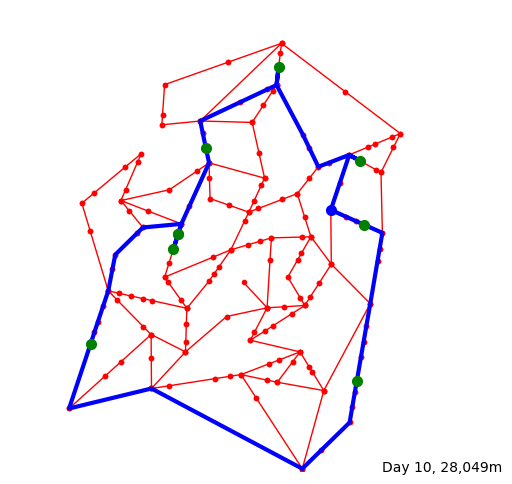

[10] 18:07:30.0 Driver leaves for delivery of 9 parcels
[10] 18:07:30.0 Driver drives to Customer: 93 (7622, 5327)
[10] 18:10:39.8 Driver arrived at Customer: 93 (7622, 5327)
[10] 18:10:41.3 Customer: 93 (7622, 5327) answers door
[10] 18:10:41.3 Customer: 93 (7622, 5327) accepts Parcel: 76
[10] 18:10:46.7 Customer: 93 (7622, 5327) signs off
[10] 18:10:53.5 Driver drives to Customer: 41 (7458, 1945)
[10] 18:11:43.5 Parcel: 81 arr at delivery centre
[10] 18:25:35.7 Driver arrived at Customer: 41 (7458, 1945)
[10] 18:26:55.3 Customer: 41 (7458, 1945) answers door
[10] 18:26:55.3 Customer: 41 (7458, 1945) accepts Parcel: 77
[10] 18:27:07.10 Customer: 41 (7458, 1945) signs off
[10] 18:27:19.2 Driver drives to Customer: 31 (1734, 2755)
[10] 18:48:57.9 Parcel: 82 arr at delivery centre
[10] 19:04:33.6 Driver arrived at Customer: 31 (1734, 2755)
[10] 19:04:40.1 Customer: 31 (1734, 2755) answers door
[10] 19:04:40.1 Customer: 31 (1734, 2755) accepts Parcel: 74
[10] 19:05:23.3 Customer: 31 (1734

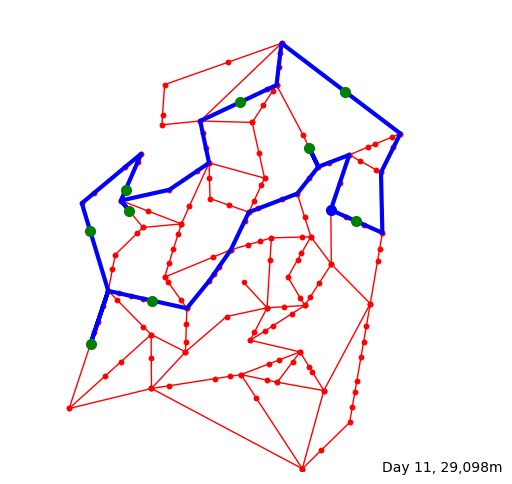

[11] 18:07:30.0 Driver leaves for delivery of 9 parcels
[11] 18:07:30.0 Driver drives to Customer:  3 (6435, 6994)
[11] 18:17:10.6 Driver arrived at Customer:  3 (6435, 6994)
[11] 18:17:27.1 Customer:  3 (6435, 6994) answers door
[11] 18:17:27.1 Customer:  3 (6435, 6994) accepts Parcel: 88
[11] 18:17:28.4 Customer:  3 (6435, 6994) signs off
[11] 18:17:39.9 Driver drives to Customer: 32 (3049, 3690)
[11] 18:39:53.8 Driver arrived at Customer: 32 (3049, 3690)
[11] 18:40:32.7 Customer: 32 (3049, 3690) answers door
[11] 18:40:32.7 Customer: 32 (3049, 3690) accepts Parcel: 82
[11] 18:40:48.2 Customer: 32 (3049, 3690) signs off
[11] 18:40:49.6 Driver drives to Customer: 31 (1734, 2755)
[11] 18:49:27.10 Driver arrived at Customer: 31 (1734, 2755)
[11] 18:51:05.1 Customer: 31 (1734, 2755) answers door
[11] 18:51:05.1 Customer: 31 (1734, 2755) accepts Parcel: 85
[11] 18:51:21.2 Customer: 31 (1734, 2755) signs off
[11] 18:51:46.0 Driver drives to Customer: 83 (1723, 5199)
[11] 19:02:00.4 Driver 

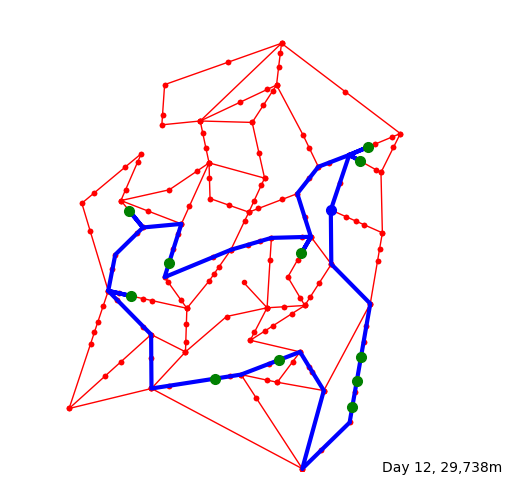

[12] 18:11:40.0 Driver leaves for delivery of 14 parcels
[12] 18:11:40.0 Driver drives to Customer: 77 (7546, 2458)
[12] 18:25:52.5 Driver arrived at Customer: 77 (7546, 2458)
[12] 18:26:26.4 Customer: 77 (7546, 2458) answers door
[12] 18:26:26.4 Customer: 77 (7546, 2458) accepts Parcel: 91
[12] 18:26:28.8 Customer: 77 (7546, 2458) accepts Parcel: 98
[12] 18:26:29.8 Customer: 77 (7546, 2458) signs off
[12] 18:26:46.9 Driver drives to Customer: 41 (7458, 1945)
[12] 18:28:51.7 Driver arrived at Customer: 41 (7458, 1945)
[12] 18:30:19.6 Customer: 41 (7458, 1945) answers door
[12] 18:30:19.6 Customer: 41 (7458, 1945) accepts Parcel: 96
[12] 18:30:34.7 Customer: 41 (7458, 1945) signs off
[12] 18:30:46.7 Driver drives to Customer: 81 (7362, 1393)
[12] 18:33:00.8 Driver arrived at Customer: 81 (7362, 1393)
[12] 18:33:22.6 Customer: 81 (7362, 1393) answers door
[12] 18:33:22.6 Customer: 81 (7362, 1393) accepts Parcel: 93
[12] 18:33:26.3 Customer: 81 (7362, 1393) signs off
[12] 18:33:27.5 Drive

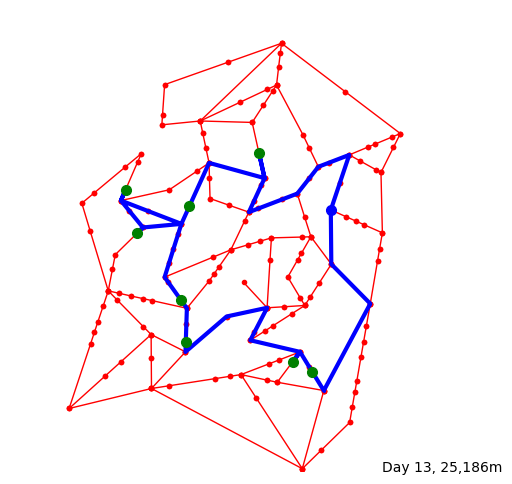

[13] 18:06:40.0 Driver leaves for delivery of 8 parcels
[13] 18:06:40.0 Driver drives to Customer: 14 (6502, 2145)
[13] 18:26:33.8 Driver arrived at Customer: 14 (6502, 2145)
[13] 18:26:42.9 Customer: 14 (6502, 2145) answers door
[13] 18:26:42.9 Customer: 14 (6502, 2145) accepts Parcel: 105
[13] 18:26:54.1 Customer: 14 (6502, 2145) signs off
[13] 18:27:21.10 Driver drives to Customer: 52 (6082, 2369)
[13] 18:30:25.8 Driver arrived at Customer: 52 (6082, 2369)
[13] 18:30:31.1 Customer: 52 (6082, 2369) answers door
[13] 18:30:31.1 Customer: 52 (6082, 2369) accepts Parcel: 110
[13] 18:30:31.1 Customer: 52 (6082, 2369) signs off
[13] 18:30:35.8 Driver drives to Customer: 10 (3780, 2782)
[13] 18:48:14.4 Driver arrived at Customer: 10 (3780, 2782)
[13] 18:48:15.4 Customer: 10 (3780, 2782) answers door
[13] 18:48:15.4 Customer: 10 (3780, 2782) accepts Parcel: 108
[13] 18:48:24.7 Customer: 10 (3780, 2782) signs off
[13] 18:48:44.3 Driver drives to Customer: 25 (3671, 3708)
[13] 18:52:36.6 Driv

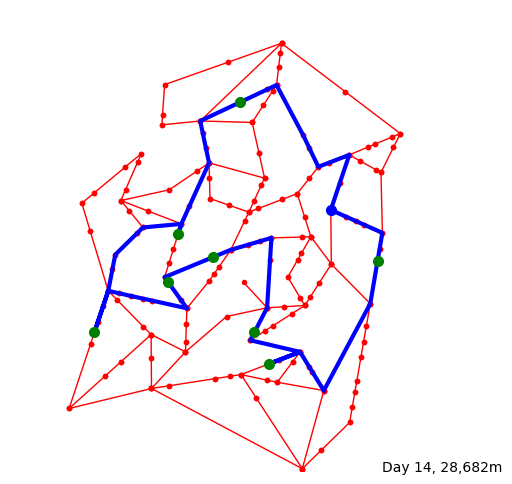

[14] 18:08:20.0 Driver leaves for delivery of 10 parcels
[14] 18:08:20.0 Driver drives to Customer: 20 (7904, 4546)
[14] 18:15:39.2 Driver arrived at Customer: 20 (7904, 4546)
[14] 18:16:13.10 Customer: 20 (7904, 4546) answers door
[14] 18:16:13.10 Customer: 20 (7904, 4546) accepts Parcel: 116
[14] 18:16:15.7 Customer: 20 (7904, 4546) signs off
[14] 18:16:38.5 Driver drives to Customer: 71 (5561, 2316)
[14] 18:35:43.3 Driver arrived at Customer: 71 (5561, 2316)
[14] 18:37:39.8 Customer: 71 (5561, 2316) answers door
[14] 18:37:39.8 Customer: 71 (5561, 2316) accepts Parcel: 113
[14] 18:37:56.1 Customer: 71 (5561, 2316) signs off
[14] 18:37:59.9 Driver drives to Customer: 37 (5254, 2998)
[14] 18:46:02.8 Driver arrived at Customer: 37 (5254, 2998)
[14] 18:46:13.9 Customer: 37 (5254, 2998) answers door
[14] 18:46:13.9 Customer: 37 (5254, 2998) accepts Parcel: 119
[14] 18:46:27.10 Customer: 37 (5254, 2998) signs off
[14] 18:46:31.4 Driver drives to Customer: 30 (4374, 4632)
[14] 19:00:14.6 D

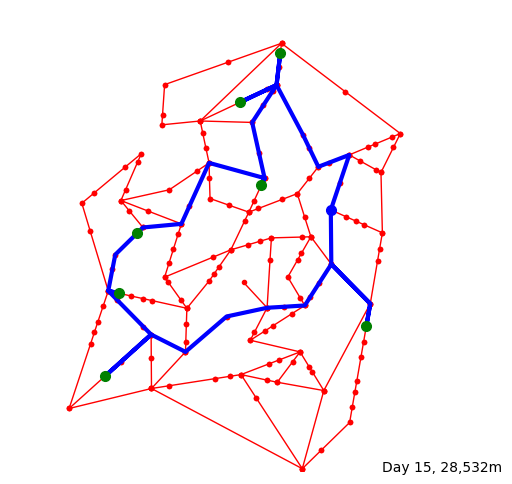

[15] 18:05:50.0 Driver leaves for delivery of 7 parcels
[15] 18:05:50.0 Driver drives to Customer: 11 (4938, 7977)
[15] 18:25:08.5 Driver arrived at Customer: 11 (4938, 7977)
[15] 18:25:29.5 Customer: 11 (4938, 7977) answers door
[15] 18:25:29.5 Customer: 11 (4938, 7977) accepts Parcel: 123
[15] 18:25:34.9 Customer: 11 (4938, 7977) signs off
[15] 18:25:47.9 Driver drives to Customer: 15 (5813, 9044)
[15] 18:32:05.2 Driver arrived at Customer: 15 (5813, 9044)
[15] 18:32:20.7 Customer: 15 (5813, 9044) answers door
[15] 18:32:20.7 Customer: 15 (5813, 9044) accepts Parcel: 126
[15] 18:32:22.9 Customer: 15 (5813, 9044) signs off
[15] 18:32:26.4 Driver drives to Customer: 12 (5406, 6190)
[15] 18:44:39.4 Driver arrived at Customer: 12 (5406, 6190)
[15] 18:45:04.8 Customer: 12 (5406, 6190) answers door
[15] 18:45:04.8 Customer: 12 (5406, 6190) accepts Parcel: 124
[15] 18:45:34.9 Customer: 12 (5406, 6190) signs off
[15] 18:45:50.8 Driver drives to Customer:  1 (2736, 5149)
[15] 19:01:15.3 Drive

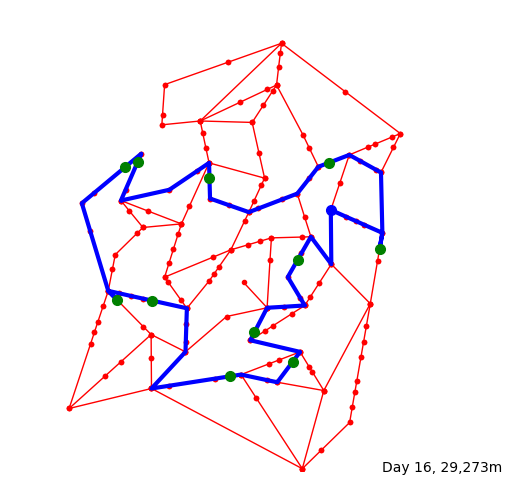

[16] 18:10:00.0 Driver leaves for delivery of 12 parcels
[16] 18:10:00.0 Driver drives to Customer: 62 (6189, 4576)
[16] 18:19:55.2 Driver arrived at Customer: 62 (6189, 4576)
[16] 18:20:20.0 Customer: 62 (6189, 4576) answers door
[16] 18:20:20.0 Customer: 62 (6189, 4576) accepts Parcel: 138
[16] 18:20:30.2 Customer: 62 (6189, 4576) signs off
[16] 18:20:36.8 Driver drives to Customer: 37 (5254, 2998)
[16] 18:30:51.4 Driver arrived at Customer: 37 (5254, 2998)
[16] 18:31:00.5 Customer: 37 (5254, 2998) answers door
[16] 18:31:00.5 Customer: 37 (5254, 2998) accepts Parcel: 131
[16] 18:31:00.5 Customer: 37 (5254, 2998) signs off
[16] 18:31:12.5 Driver drives to Customer: 52 (6082, 2369)
[16] 18:37:23.8 Driver arrived at Customer: 52 (6082, 2369)
[16] 18:38:02.4 Customer: 52 (6082, 2369) answers door
[16] 18:38:02.4 Customer: 52 (6082, 2369) accepts Parcel: 135
[16] 18:38:02.5 Customer: 52 (6082, 2369) signs off
[16] 18:38:06.0 Driver drives to Customer: 74 (4721, 2048)
[16] 18:44:30.10 Dri

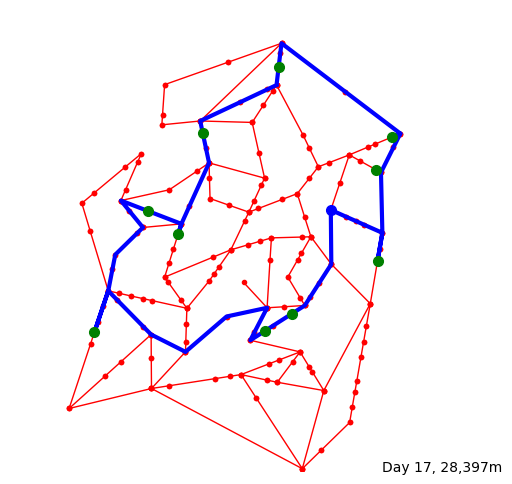

[17] 18:08:20.0 Driver leaves for delivery of 10 parcels
[17] 18:08:20.0 Driver drives to Customer: 13 (6067, 3408)
[17] 18:18:33.7 Driver arrived at Customer: 13 (6067, 3408)
[17] 18:18:35.1 Customer: 13 (6067, 3408) answers door
[17] 18:18:35.1 Customer: 13 (6067, 3408) accepts Parcel: 149
[17] 18:18:50.8 Customer: 13 (6067, 3408) signs off
[17] 18:18:54.5 Driver drives to Customer: 23 (5474, 3026)
[17] 18:21:43.4 Driver arrived at Customer: 23 (5474, 3026)
[17] 18:22:00.1 Customer: 23 (5474, 3026) answers door
[17] 18:22:00.1 Customer: 23 (5474, 3026) accepts Parcel: 146
[17] 18:22:07.6 Customer: 23 (5474, 3026) signs off
[17] 18:22:10.5 Driver drives to Customer: 46 (1815, 3002)
[17] 18:47:23.2 Driver arrived at Customer: 46 (1815, 3002)
[17] 18:49:04.2 Customer: 46 (1815, 3002) answers door
[17] 18:49:04.2 Customer: 46 (1815, 3002) accepts Parcel: 147
[17] 18:49:06.0 Customer: 46 (1815, 3002) signs off
[17] 18:49:11.4 Driver drives to Customer: 87 (2978, 5623)
[17] 19:05:02.7 Driv

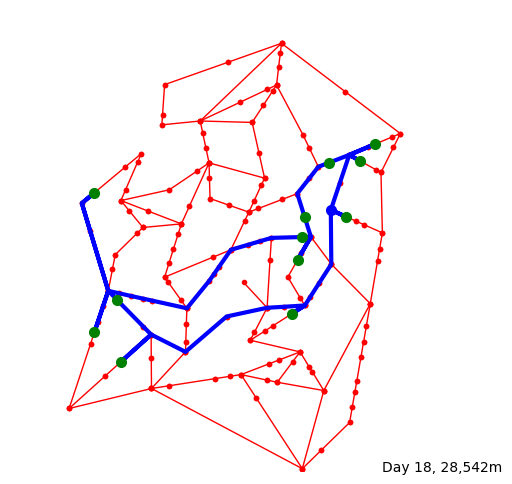

[18] 18:10:00.0 Driver leaves for delivery of 12 parcels
[18] 18:10:00.0 Driver drives to Customer: 22 (7528, 6712)
[18] 18:16:04.6 Driver arrived at Customer: 22 (7528, 6712)
[18] 18:16:26.0 Customer: 22 (7528, 6712) answers door
[18] 18:16:26.0 Customer: 22 (7528, 6712) accepts Parcel: 152
[18] 18:16:32.5 Customer: 22 (7528, 6712) signs off
[18] 18:16:44.4 Driver drives to Customer: 21 (7852, 7076)
[18] 18:20:12.4 Driver arrived at Customer: 21 (7852, 7076)
[18] 18:20:27.8 Customer: 21 (7852, 7076) answers door
[18] 18:20:27.8 Customer: 21 (7852, 7076) accepts Parcel: 161
[18] 18:20:38.3 Customer: 21 (7852, 7076) signs off
[18] 18:20:38.9 Driver drives to Customer: 16 (6857, 6672)
[18] 18:24:56.2 Driver arrived at Customer: 16 (6857, 6672)
[18] 18:25:10.5 Customer: 16 (6857, 6672) answers door
[18] 18:25:10.5 Customer: 16 (6857, 6672) accepts Parcel: 164
[18] 18:25:24.2 Customer: 16 (6857, 6672) signs off
[18] 18:25:24.7 Driver drives to Customer: 27 (6339, 5488)
[18] 18:31:29.0 Driv

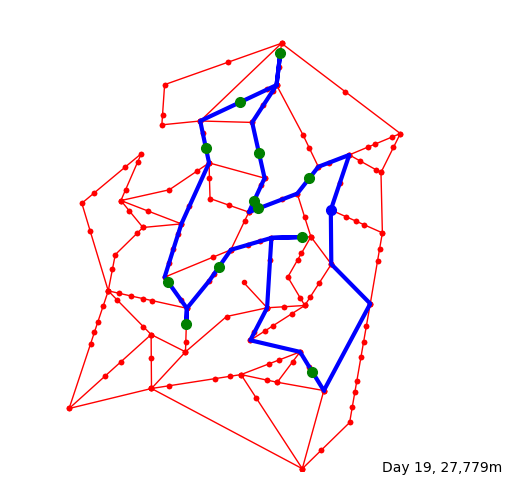

[19] 18:10:00.0 Driver leaves for delivery of 12 parcels
[19] 18:10:00.0 Driver drives to Customer: 14 (6502, 2145)
[19] 18:29:53.8 Driver arrived at Customer: 14 (6502, 2145)
[19] 18:30:16.6 Customer: 14 (6502, 2145) answers door
[19] 18:30:16.6 Customer: 14 (6502, 2145) accepts Parcel: 163
[19] 18:30:22.5 Customer: 14 (6502, 2145) signs off
[19] 18:30:34.9 Driver drives to Customer: 61 (6282, 5064)
[19] 18:48:51.2 Driver arrived at Customer: 61 (6282, 5064)
[19] 18:49:20.9 Customer: 61 (6282, 5064) answers door
[19] 18:49:20.9 Customer: 61 (6282, 5064) accepts Parcel: 176
[19] 18:49:22.3 Customer: 61 (6282, 5064) signs off
[19] 18:49:46.4 Driver drives to Customer: 88 (4486, 4407)
[19] 18:57:53.9 Driver arrived at Customer: 88 (4486, 4407)
[19] 18:58:17.3 Customer: 88 (4486, 4407) answers door
[19] 18:58:17.3 Customer: 88 (4486, 4407) accepts Parcel: 166
[19] 18:58:32.9 Customer: 88 (4486, 4407) signs off
[19] 18:58:37.8 Driver drives to Customer: 80 (3793, 3191)
[19] 19:04:25.4 Driv

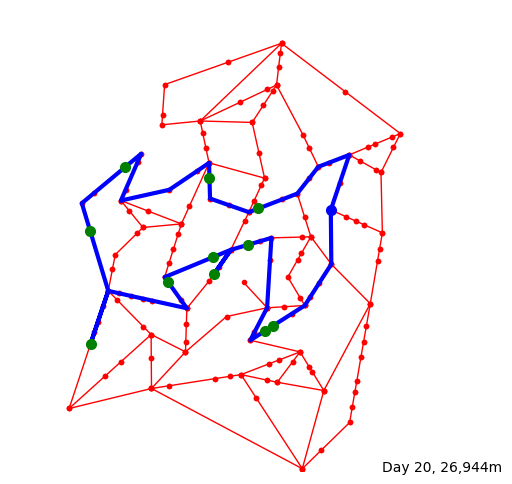

[20] 18:10:00.0 Driver leaves for delivery of 12 parcels
[20] 18:10:00.0 Driver drives to Customer: 29 (5661, 3147)
[20] 18:22:09.4 Driver arrived at Customer: 29 (5661, 3147)
[20] 18:23:58.1 Customer: 29 (5661, 3147) answers door
[20] 18:23:58.1 Customer: 29 (5661, 3147) accepts Parcel: 183
[20] 18:24:06.8 Customer: 29 (5661, 3147) signs off
[20] 18:24:13.6 Driver drives to Customer: 23 (5474, 3026)
[20] 18:25:06.8 Driver arrived at Customer: 23 (5474, 3026)
[20] 18:25:55.6 Customer: 23 (5474, 3026) answers door
[20] 18:25:55.6 Customer: 23 (5474, 3026) accepts Parcel: 178
[20] 18:25:57.10 Customer: 23 (5474, 3026) signs off
[20] 18:26:01.1 Driver drives to Customer: 70 (5108, 4893)
[20] 18:38:49.3 Driver arrived at Customer: 70 (5108, 4893)
[20] 18:38:51.1 Customer: 70 (5108, 4893) answers door
[20] 18:38:51.1 Customer: 70 (5108, 4893) accepts Parcel: 179
[20] 18:38:52.9 Customer: 70 (5108, 4893) signs off
[20] 18:38:52.9 Driver drives to Customer: 47 (4385, 4260)
[20] 18:42:56.3 Dri

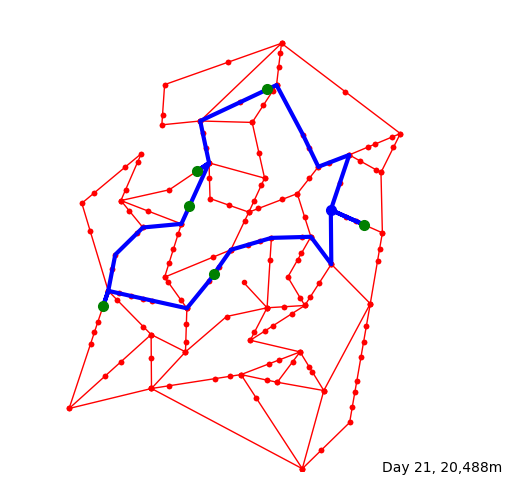

[21] 18:05:00.0 Driver leaves for delivery of 6 parcels
[21] 18:05:00.0 Driver drives to Customer: 78 (5534, 8260)
[21] 18:21:40.3 Driver arrived at Customer: 78 (5534, 8260)
[21] 18:22:58.10 Customer: 78 (5534, 8260) answers door
[21] 18:22:58.10 Customer: 78 (5534, 8260) accepts Parcel: 192
[21] 18:23:01.9 Customer: 78 (5534, 8260) signs off
[21] 18:23:06.1 Driver drives to Customer: 89 (4022, 6492)
[21] 18:34:26.3 Driver arrived at Customer: 89 (4022, 6492)
[21] 18:35:16.1 Customer: 89 (4022, 6492) answers door
[21] 18:35:16.1 Customer: 89 (4022, 6492) accepts Parcel: 190
[21] 18:35:16.6 Customer: 89 (4022, 6492) signs off
[21] 18:35:43.8 Driver drives to Customer: 43 (3858, 5732)
[21] 18:41:05.6 Driver arrived at Customer: 43 (3858, 5732)
[21] 18:41:08.6 Customer: 43 (3858, 5732) answers door
[21] 18:41:08.6 Customer: 43 (3858, 5732) accepts Parcel: 187
[21] 18:41:14.8 Customer: 43 (3858, 5732) signs off
[21] 18:41:27.7 Driver drives to Customer: 57 (2002, 3566)
[21] 18:54:23.6 Dri

In [88]:
random.seed(0)
recP2 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [89]:
standardMeasureConverter(recP2.daily)

### Simulation Records

In [90]:
recP2.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,73545,29.311,145.75,0,NaN
1,151200,158494,24.607,121.566667,2,NaN
2,237600,246102,29.914,141.7,2,1.047205
3,324000,331576,26.9,126.266667,0,1.27316
4,410400,418413,27.741,133.55,0,NaN
5,496800,503437,23.743,110.616667,0,NaN
6,583200,590444,24.47,120.733333,0,NaN
7,669600,677319,26.426,128.65,0,NaN
8,756000,764600,28.719,143.333333,4,NaN
9,842400,851561,29.839,152.683333,3,1.334372


### Time Plot

In [91]:
np.mean(recP2.daily['Working Time (in minutes)'])

135.23257575757577

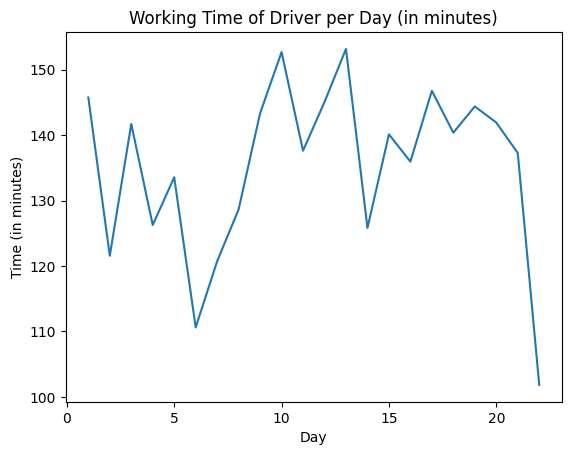

In [92]:
timePlot = plt.plot(recP2.daily.index +1 ,recP2.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [93]:
np.mean(recP2.daily['Delivery Route Distance(in km)'])

27.380818181818178

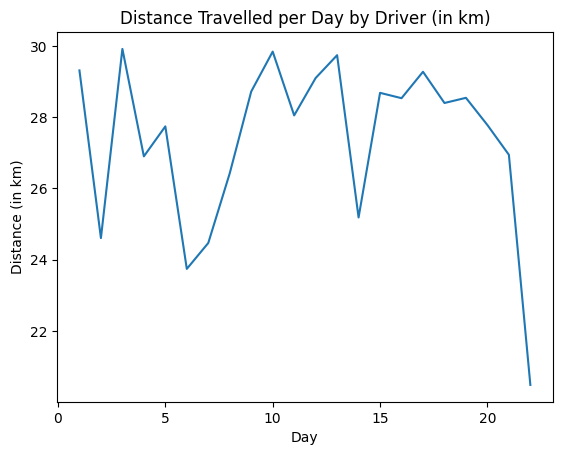

In [94]:
distancePlot = plt.plot(recP2.daily.index +1 ,recP2.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [95]:
np.mean(recP2.daily['Number of left over parcels'])

1.3181818181818181

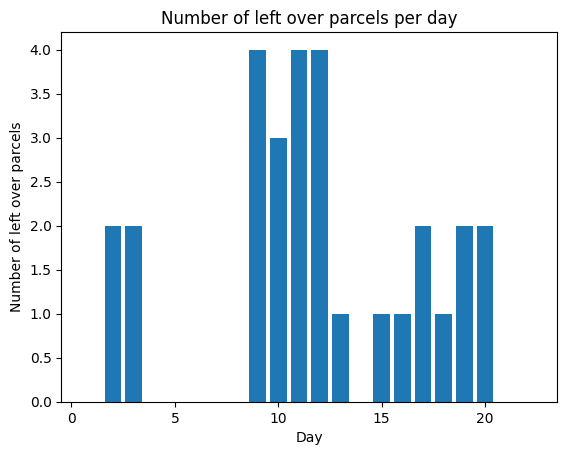

In [96]:
leftOverPlot = plt.bar(recP2.daily.index +1 ,recP2.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [97]:
np.mean(recP2.daily['Delay Time(in days)'])

1.088155715811966

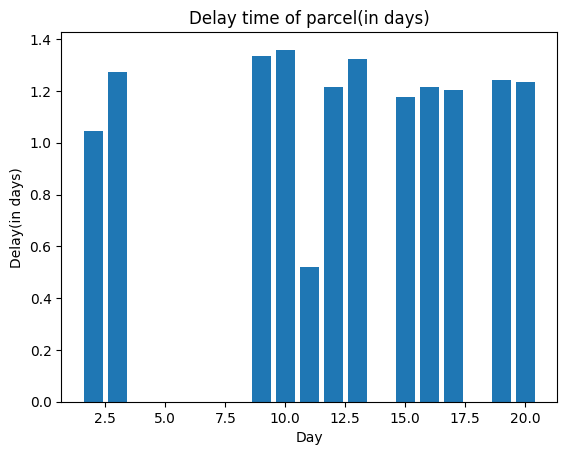

In [98]:
delayPlot = plt.bar(recP2.daily.index ,recP2.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

# Scenario 3

Suppose due to high demand in sales the average number of parcels per customer inclines to 5.

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 494 deliveries over 22 days.


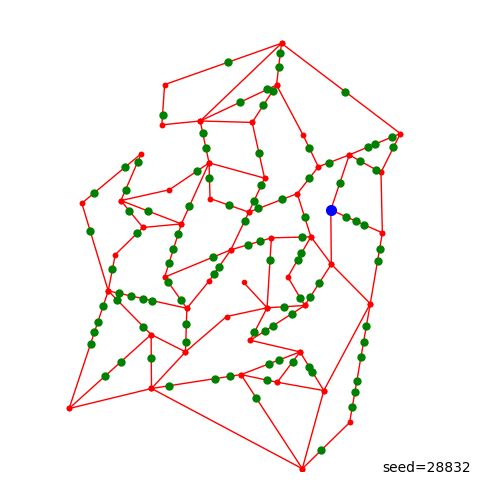

In [99]:
data = generateData(28832, p = 5, plot=True, log=True)

## Storing generated data into the pickle file

In [100]:
with open('dataSeed28832P5.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [101]:
with open('dataSeed28832P5.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 500 parcels over 22 days to 100 customers
[ 0] 08:34:23.0 Parcel:  0 arr at delivery centre
[ 0] 09:00:36.0 Parcel:  1 arr at delivery centre
[ 0] 09:10:41.1 Parcel:  2 arr at delivery centre
[ 0] 09:16:13.3 Parcel:  3 arr at delivery centre
[ 0] 09:29:27.2 Parcel:  4 arr at delivery centre
[ 0] 09:39:02.8 Parcel:  5 arr at delivery centre
[ 0] 10:07:20.10 Parcel:  6 arr at delivery centre
[ 0] 10:14:01.7 Parcel:  7 arr at delivery centre
[ 0] 10:25:59.5 Parcel:  8 arr at delivery centre
[ 0] 10:42:10.3 Parcel:  9 arr at delivery centre
[ 0] 11:26:17.2 Parcel: 10 arr at delivery centre
[ 0] 11:39:16.2 Parcel: 11 arr at delivery centre
[ 0] 11:45:23.3 Parcel: 12 arr at delivery centre
[ 0] 12:11:26.5 Parcel: 13 arr at delivery centre
[ 0] 12:29:14.6 Parcel: 14 arr at delivery centre
[ 0] 12:34:34.3 Parcel: 15 arr at delivery centre
[ 0] 13:19:01.1 Parcel: 16 arr at delivery centre
[ 0] 14:34:04.10 Parcel: 17 arr at delivery centre
[ 0] 15:04:47.7 Parcel: 18 arr at

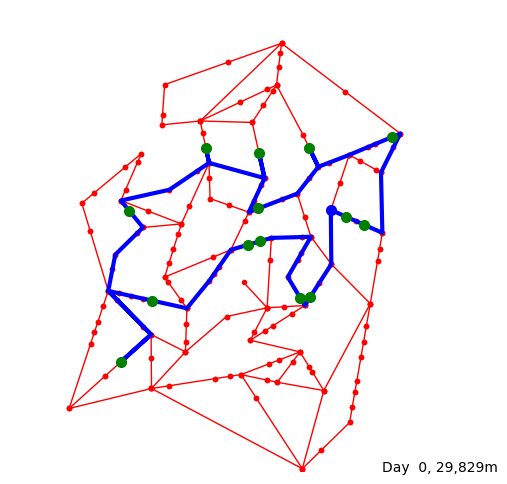

[ 0] 18:14:10.0 Driver leaves for delivery of 17 parcels
[ 0] 18:14:10.0 Driver drives to Customer: 79 (7227, 5504)
[ 0] 18:15:36.2 Driver arrived at Customer: 79 (7227, 5504)
[ 0] 18:15:37.4 Customer: 79 (7227, 5504) answers door
[ 0] 18:15:37.4 Customer: 79 (7227, 5504) accepts Parcel: 17
[ 0] 18:15:41.6 Customer: 79 (7227, 5504) signs off
[ 0] 18:15:41.7 Driver drives to Customer: 93 (7622, 5327)
[ 0] 18:17:25.4 Driver arrived at Customer: 93 (7622, 5327)
[ 0] 18:19:51.9 Customer: 93 (7622, 5327) answers door
[ 0] 18:19:51.9 Customer: 93 (7622, 5327) accepts Parcel:  6
[ 0] 18:20:08.10 Customer: 93 (7622, 5327) signs off
[ 0] 18:20:09.7 Driver drives to Customer: 53 (8211, 7227)
[ 0] 18:31:37.6 Driver arrived at Customer: 53 (8211, 7227)
[ 0] 18:33:07.1 Customer: 53 (8211, 7227) answers door
[ 0] 18:33:07.1 Customer: 53 (8211, 7227) accepts Parcel:  2
[ 0] 18:33:09.5 Customer: 53 (8211, 7227) accepts Parcel: 11
[ 0] 18:33:11.7 Customer: 53 (8211, 7227) accepts Parcel: 22
[ 0] 18:33:

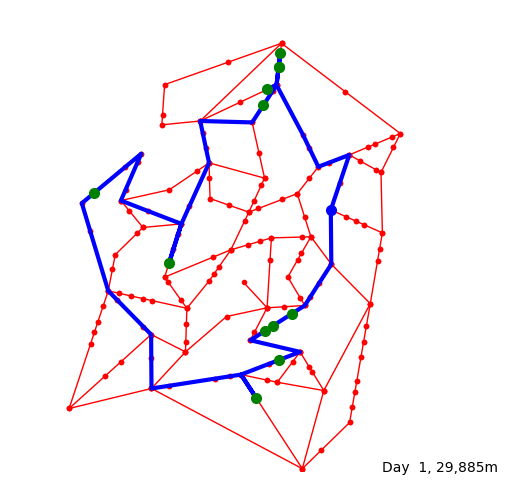

[ 1] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 1] 18:11:40.0 Driver drives to Customer: 19 (5778, 8751)
[ 1] 18:29:03.5 Driver arrived at Customer: 19 (5778, 8751)
[ 1] 18:29:06.8 Customer: 19 (5778, 8751) answers door
[ 1] 18:29:06.8 Customer: 19 (5778, 8751) accepts Parcel: 15
[ 1] 18:29:07.5 Customer: 19 (5778, 8751) signs off
[ 1] 18:29:12.10 Driver drives to Customer: 15 (5813, 9044)
[ 1] 18:30:23.8 Driver arrived at Customer: 15 (5813, 9044)
[ 1] 18:30:55.8 Customer: 15 (5813, 9044) answers door
[ 1] 18:30:55.8 Customer: 15 (5813, 9044) accepts Parcel: 30
[ 1] 18:31:09.3 Customer: 15 (5813, 9044) signs off
[ 1] 18:31:10.8 Driver drives to Customer: 19 (5778, 8751)
[ 1] 18:32:21.6 Driver arrived at Customer: 19 (5778, 8751)
[ 1] 18:32:43.6 Customer: 19 (5778, 8751) answers door
[ 1] 18:32:43.6 Customer: 19 (5778, 8751) accepts Parcel: 15
[ 1] 18:32:53.7 Customer: 19 (5778, 8751) signs off
[ 1] 18:32:54.6 Driver drives to Customer: 78 (5534, 8260)
[ 1] 18:35:22.9 Driver

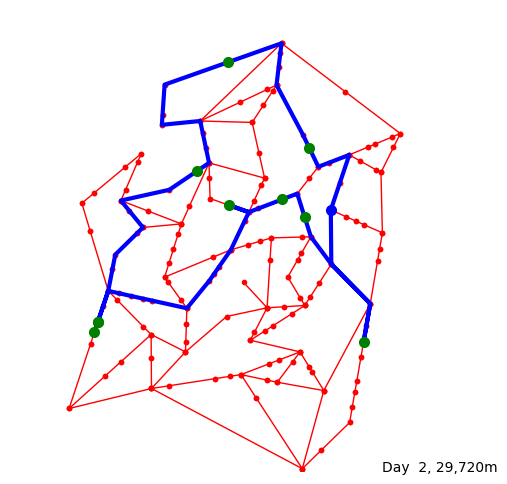

[ 2] 18:09:10.0 Driver leaves for delivery of 11 parcels
[ 2] 18:09:10.0 Driver drives to Customer:  3 (6435, 6994)
[ 2] 18:18:50.6 Driver arrived at Customer:  3 (6435, 6994)
[ 2] 18:18:50.6 Customer:  3 (6435, 6994) answers door
[ 2] 18:18:50.6 Customer:  3 (6435, 6994) accepts Parcel: 54
[ 2] 18:19:02.6 Customer:  3 (6435, 6994) signs off
[ 2] 18:19:12.3 Driver drives to Customer: 24 (4686, 8847)
[ 2] 18:33:51.4 Driver arrived at Customer: 24 (4686, 8847)
[ 2] 18:33:51.7 Customer: 24 (4686, 8847) answers door
[ 2] 18:33:51.7 Customer: 24 (4686, 8847) accepts Parcel: 25
[ 2] 18:33:55.3 Customer: 24 (4686, 8847) signs off
[ 2] 18:34:09.9 Driver drives to Customer: 89 (4022, 6492)
[ 2] 18:51:41.6 Driver arrived at Customer: 89 (4022, 6492)
[ 2] 18:52:21.2 Customer: 89 (4022, 6492) answers door
[ 2] 18:52:21.2 Customer: 89 (4022, 6492) accepts Parcel: 32
[ 2] 18:52:29.1 Customer: 89 (4022, 6492) signs off
[ 2] 18:52:30.8 Driver drives to Customer: 91 (1887, 3221)
[ 2] 19:12:02.10 Driver

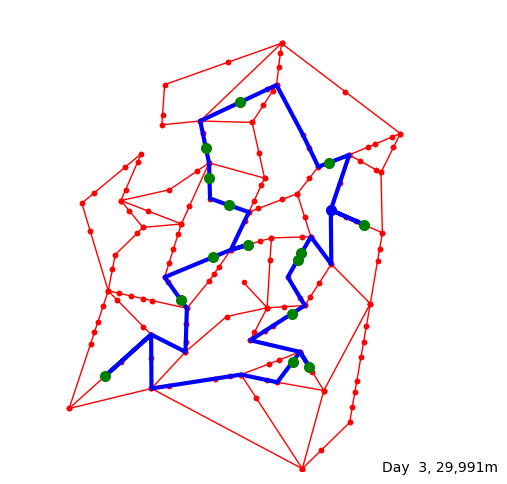

[ 3] 18:17:30.0 Driver leaves for delivery of 21 parcels
[ 3] 18:17:30.0 Driver drives to Customer: 16 (6857, 6672)
[ 3] 18:24:23.8 Driver arrived at Customer: 16 (6857, 6672)
[ 3] 18:25:26.6 Customer: 16 (6857, 6672) answers door
[ 3] 18:25:26.6 Customer: 16 (6857, 6672) accepts Parcel: 62
[ 3] 18:25:30.3 Customer: 16 (6857, 6672) signs off
[ 3] 18:25:34.4 Driver drives to Customer: 11 (4938, 7977)
[ 3] 18:37:59.1 Driver arrived at Customer: 11 (4938, 7977)
[ 3] 18:38:29.4 Customer: 11 (4938, 7977) answers door
[ 3] 18:38:29.4 Customer: 11 (4938, 7977) accepts Parcel: 38
[ 3] 18:38:32.2 Customer: 11 (4938, 7977) signs off
[ 3] 18:38:57.5 Driver drives to Customer: 59 (4215, 6981)
[ 3] 18:45:08.0 Driver arrived at Customer: 59 (4215, 6981)
[ 3] 18:45:15.2 Customer: 59 (4215, 6981) answers door
[ 3] 18:45:15.2 Customer: 59 (4215, 6981) accepts Parcel: 79
[ 3] 18:45:20.5 Customer: 59 (4215, 6981) signs off
[ 3] 18:45:23.10 Driver drives to Customer: 82 (4289, 6348)
[ 3] 18:47:57.3 Driver

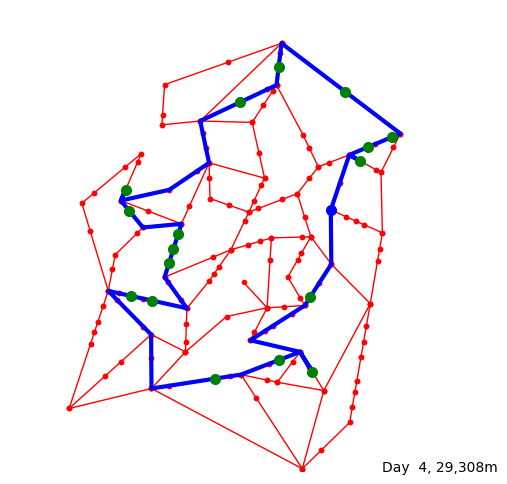

[ 4] 18:06:37.2 Parcel: 106 arr at delivery centre
[ 4] 18:14:05.5 Parcel: 107 arr at delivery centre
[ 4] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 4] 18:21:40.0 Driver drives to Customer: 22 (7528, 6712)
[ 4] 18:27:44.6 Driver arrived at Customer: 22 (7528, 6712)
[ 4] 18:28:23.4 Customer: 22 (7528, 6712) answers door
[ 4] 18:28:23.4 Customer: 22 (7528, 6712) accepts Parcel: 75
[ 4] 18:29:43.10 Customer: 22 (7528, 6712) accepts Parcel: 103
[ 4] 18:30:04.6 Customer: 22 (7528, 6712) signs off
[ 4] 18:30:16.7 Driver drives to Customer: 58 (7707, 7015)
[ 4] 18:33:07.1 Driver arrived at Customer: 58 (7707, 7015)
[ 4] 18:33:59.0 Customer: 58 (7707, 7015) answers door
[ 4] 18:33:59.0 Customer: 58 (7707, 7015) accepts Parcel: 56
[ 4] 18:34:01.6 Customer: 58 (7707, 7015) accepts Parcel: 95
[ 4] 18:34:15.5 Customer: 58 (7707, 7015) signs off
[ 4] 18:34:18.9 Driver drives to Customer: 53 (8211, 7227)
[ 4] 18:36:29.9 Driver arrived at Customer: 53 (8211, 7227)
[ 4] 18:36:34.4 Customer

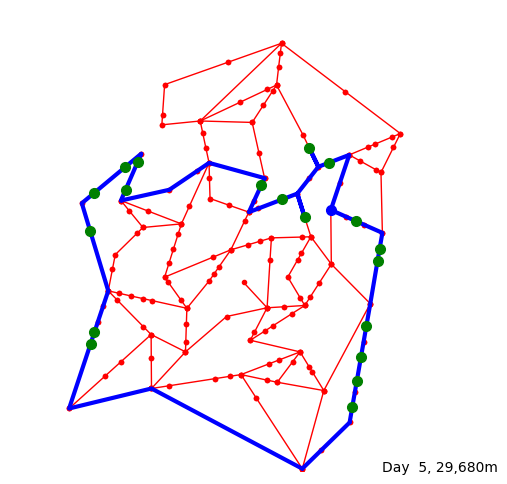

[ 5] 18:20:50.0 Driver leaves for delivery of 25 parcels
[ 5] 18:20:50.0 Driver drives to Customer: 16 (6857, 6672)
[ 5] 18:27:43.8 Driver arrived at Customer: 16 (6857, 6672)
[ 5] 18:27:49.8 Customer: 16 (6857, 6672) answers door
[ 5] 18:27:49.8 Customer: 16 (6857, 6672) accepts Parcel: 133
[ 5] 18:28:05.3 Customer: 16 (6857, 6672) signs off
[ 5] 18:28:16.7 Driver drives to Customer:  3 (6435, 6994)
[ 5] 18:31:03.5 Driver arrived at Customer:  3 (6435, 6994)
[ 5] 18:33:24.6 Customer:  3 (6435, 6994) answers door
[ 5] 18:33:24.6 Customer:  3 (6435, 6994) accepts Parcel: 88
[ 5] 18:33:29.7 Customer:  3 (6435, 6994) signs off
[ 5] 18:33:55.1 Driver drives to Customer: 27 (6339, 5488)
[ 5] 18:40:50.1 Driver arrived at Customer: 27 (6339, 5488)
[ 5] 18:41:14.3 Customer: 27 (6339, 5488) answers door
[ 5] 18:41:14.3 Customer: 27 (6339, 5488) accepts Parcel: 71
[ 5] 18:41:18.4 Customer: 27 (6339, 5488) signs off
[ 5] 18:41:19.5 Driver drives to Customer:  0 (5854, 5879)
[ 5] 18:44:52.4 Driver

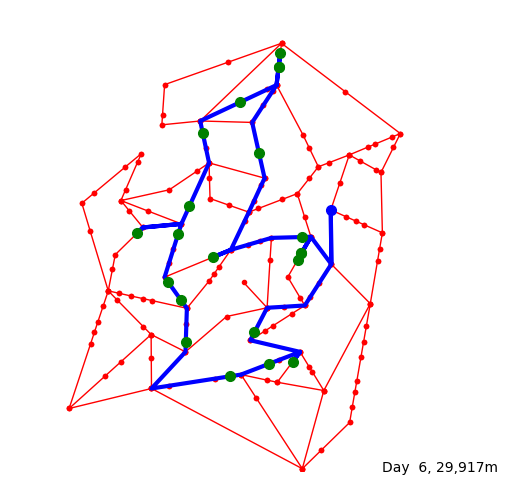

[ 6] 18:27:30.0 Driver leaves for delivery of 33 parcels
[ 6] 18:27:30.0 Driver drives to Customer: 97 (6268, 4714)
[ 6] 18:36:47.0 Driver arrived at Customer: 97 (6268, 4714)
[ 6] 18:37:17.8 Customer: 97 (6268, 4714) answers door
[ 6] 18:37:17.8 Customer: 97 (6268, 4714) accepts Parcel: 97
[ 6] 18:37:20.8 Customer: 97 (6268, 4714) accepts Parcel: 99
[ 6] 18:37:23.4 Customer: 97 (6268, 4714) signs off
[ 6] 18:37:24.7 Driver drives to Customer: 62 (6189, 4576)
[ 6] 18:38:02.9 Driver arrived at Customer: 62 (6189, 4576)
[ 6] 18:39:04.1 Customer: 62 (6189, 4576) answers door
[ 6] 18:39:04.1 Customer: 62 (6189, 4576) accepts Parcel: 138
[ 6] 18:39:05.1 Customer: 62 (6189, 4576) accepts Parcel: 157
[ 6] 18:39:18.3 Customer: 62 (6189, 4576) signs off
[ 6] 18:39:21.2 Driver drives to Customer: 97 (6268, 4714)
[ 6] 18:39:59.3 Driver arrived at Customer: 97 (6268, 4714)
[ 6] 18:40:12.7 Customer: 97 (6268, 4714) answers door
[ 6] 18:40:12.7 Customer: 97 (6268, 4714) accepts Parcel: 97
[ 6] 18:40

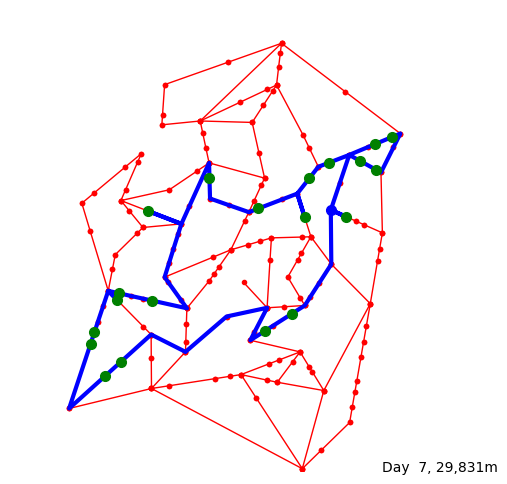

[ 7] 18:22:30.0 Driver leaves for delivery of 27 parcels
[ 7] 18:22:30.0 Driver drives to Customer: 13 (6067, 3408)
[ 7] 18:32:43.7 Driver arrived at Customer: 13 (6067, 3408)
[ 7] 18:32:45.2 Customer: 13 (6067, 3408) answers door
[ 7] 18:32:45.2 Customer: 13 (6067, 3408) accepts Parcel: 149
[ 7] 18:32:58.2 Customer: 13 (6067, 3408) accepts Parcel: 159
[ 7] 18:33:30.8 Customer: 13 (6067, 3408) signs off
[ 7] 18:33:35.0 Driver drives to Customer: 23 (5474, 3026)
[ 7] 18:36:23.10 Driver arrived at Customer: 23 (5474, 3026)
[ 7] 18:36:47.3 Customer: 23 (5474, 3026) answers door
[ 7] 18:36:47.3 Customer: 23 (5474, 3026) accepts Parcel: 146
[ 7] 18:37:00.2 Customer: 23 (5474, 3026) accepts Parcel: 178
[ 7] 18:37:10.9 Customer: 23 (5474, 3026) signs off
[ 7] 18:37:13.9 Driver drives to Customer: 18 (2383, 2362)
[ 7] 18:56:54.7 Driver arrived at Customer: 18 (2383, 2362)
[ 7] 18:57:39.3 Customer: 18 (2383, 2362) answers door
[ 7] 18:57:39.3 Customer: 18 (2383, 2362) accepts Parcel: 155
[ 7] 1

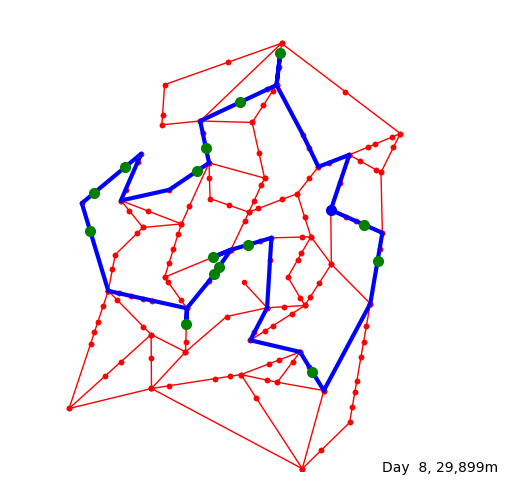

[ 8] 18:13:20.0 Driver leaves for delivery of 16 parcels
[ 8] 18:13:20.0 Driver drives to Customer: 15 (5813, 9044)
[ 8] 18:31:54.3 Driver arrived at Customer: 15 (5813, 9044)
[ 8] 18:32:59.9 Customer: 15 (5813, 9044) answers door
[ 8] 18:32:59.9 Customer: 15 (5813, 9044) accepts Parcel: 169
[ 8] 18:33:13.1 Customer: 15 (5813, 9044) signs off
[ 8] 18:33:13.4 Driver drives to Customer: 11 (4938, 7977)
[ 8] 18:39:30.6 Driver arrived at Customer: 11 (4938, 7977)
[ 8] 18:41:18.4 Customer: 11 (4938, 7977) answers door
[ 8] 18:41:18.4 Customer: 11 (4938, 7977) accepts Parcel: 168
[ 8] 18:41:18.8 Customer: 11 (4938, 7977) signs off
[ 8] 18:41:19.7 Driver drives to Customer: 59 (4215, 6981)
[ 8] 18:47:30.3 Driver arrived at Customer: 59 (4215, 6981)
[ 8] 18:47:44.1 Customer: 59 (4215, 6981) answers door
[ 8] 18:47:44.1 Customer: 59 (4215, 6981) accepts Parcel: 167
[ 8] 18:47:45.8 Customer: 59 (4215, 6981) signs off
[ 8] 18:47:48.5 Driver drives to Customer: 89 (4022, 6492)
[ 8] 18:50:19.9 Driv

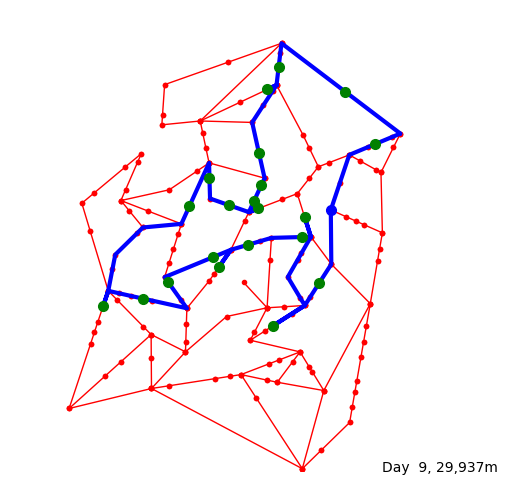

[ 9] 18:18:20.0 Driver leaves for delivery of 22 parcels
[ 9] 18:18:20.0 Driver drives to Customer: 28 (6650, 4070)
[ 9] 18:24:57.7 Driver arrived at Customer: 28 (6650, 4070)
[ 9] 18:25:48.6 Customer: 28 (6650, 4070) answers door
[ 9] 18:25:48.6 Customer: 28 (6650, 4070) accepts Parcel: 195
[ 9] 18:26:00.0 Customer: 28 (6650, 4070) signs off
[ 9] 18:26:04.4 Driver drives to Customer: 29 (5661, 3147)
[ 9] 18:31:36.1 Driver arrived at Customer: 29 (5661, 3147)
[ 9] 18:33:15.3 Customer: 29 (5661, 3147) answers door
[ 9] 18:33:15.3 Customer: 29 (5661, 3147) accepts Parcel: 183
[ 9] 18:33:38.3 Customer: 29 (5661, 3147) signs off
[ 9] 18:33:42.3 Driver drives to Customer: 27 (6339, 5488)
[ 9] 18:45:32.10 Driver arrived at Customer: 27 (6339, 5488)
[ 9] 18:46:27.10 Customer: 27 (6339, 5488) answers door
[ 9] 18:46:27.10 Customer: 27 (6339, 5488) accepts Parcel: 200
[ 9] 18:46:28.1 Customer: 27 (6339, 5488) signs off
[ 9] 18:46:45.0 Driver drives to Customer: 61 (6282, 5064)
[ 9] 18:49:15.5 D

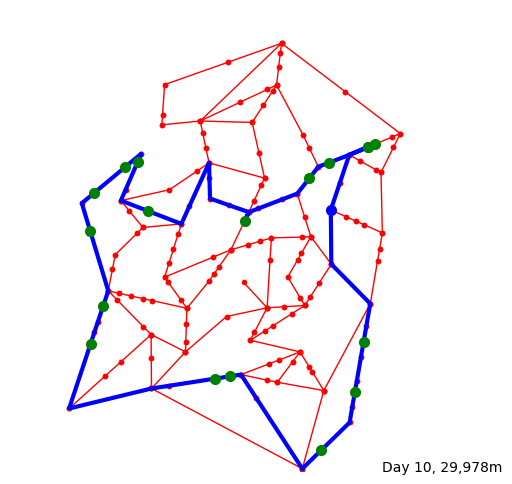

[10] 18:19:10.0 Driver leaves for delivery of 23 parcels
[10] 18:19:10.0 Driver drives to Customer:  8 (7603, 2787)
[10] 18:32:02.6 Driver arrived at Customer:  8 (7603, 2787)
[10] 18:33:07.8 Customer:  8 (7603, 2787) answers door
[10] 18:33:07.8 Customer:  8 (7603, 2787) accepts Parcel: 234
[10] 18:33:10.4 Customer:  8 (7603, 2787) signs off
[10] 18:33:10.5 Driver drives to Customer: 75 (7416, 1705)
[10] 18:37:33.6 Driver arrived at Customer: 75 (7416, 1705)
[10] 18:38:03.7 Customer: 75 (7416, 1705) answers door
[10] 18:38:03.7 Customer: 75 (7416, 1705) accepts Parcel: 242
[10] 18:38:32.0 Customer: 75 (7416, 1705) signs off
[10] 18:38:43.5 Driver drives to Customer: 95 (6687, 444)
[10] 18:44:49.9 Driver arrived at Customer: 95 (6687, 444)
[10] 18:45:29.8 Customer: 95 (6687, 444) answers door
[10] 18:45:29.8 Customer: 95 (6687, 444) accepts Parcel: 203
[10] 18:45:39.7 Customer: 95 (6687, 444) accepts Parcel: 240
[10] 18:45:46.6 Customer: 95 (6687, 444) signs off
[10] 18:45:59.7 Driver 

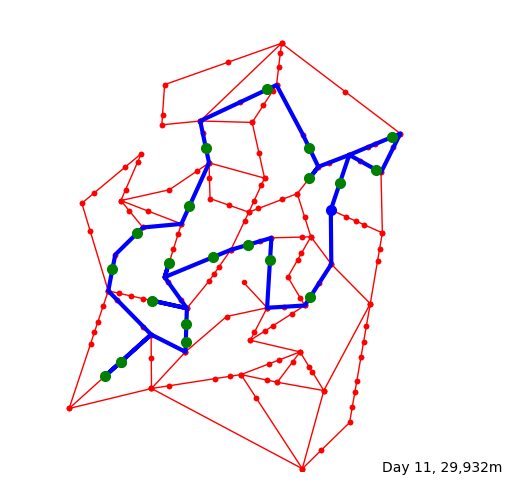

[11] 18:21:40.0 Driver leaves for delivery of 26 parcels
[11] 18:21:40.0 Driver drives to Customer:  7 (7092, 6231)
[11] 18:24:06.4 Driver arrived at Customer:  7 (7092, 6231)
[11] 18:25:51.7 Customer:  7 (7092, 6231) answers door
[11] 18:25:51.7 Customer:  7 (7092, 6231) accepts Parcel: 251
[11] 18:26:10.4 Customer:  7 (7092, 6231) signs off
[11] 18:26:39.4 Driver drives to Customer: 53 (8211, 7227)
[11] 18:33:11.8 Driver arrived at Customer: 53 (8211, 7227)
[11] 18:33:26.9 Customer: 53 (8211, 7227) answers door
[11] 18:33:26.9 Customer: 53 (8211, 7227) accepts Parcel: 220
[11] 18:33:50.5 Customer: 53 (8211, 7227) signs off
[11] 18:34:32.1 Driver drives to Customer: 72 (7870, 6521)
[11] 18:39:34.5 Driver arrived at Customer: 72 (7870, 6521)
[11] 18:40:32.3 Customer: 72 (7870, 6521) answers door
[11] 18:40:32.3 Customer: 72 (7870, 6521) accepts Parcel: 225
[11] 18:40:35.6 Customer: 72 (7870, 6521) accepts Parcel: 237
[11] 18:40:46.7 Customer: 72 (7870, 6521) signs off
[11] 18:40:55.7 D

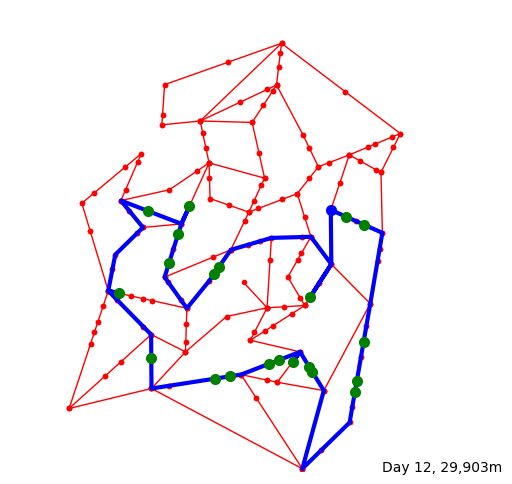

[12] 18:24:10.0 Driver leaves for delivery of 29 parcels
[12] 18:24:10.0 Driver drives to Customer: 79 (7227, 5504)
[12] 18:25:36.2 Driver arrived at Customer: 79 (7227, 5504)
[12] 18:25:41.2 Customer: 79 (7227, 5504) answers door
[12] 18:25:41.2 Customer: 79 (7227, 5504) accepts Parcel: 285
[12] 18:25:45.0 Customer: 79 (7227, 5504) signs off
[12] 18:25:45.3 Driver drives to Customer: 93 (7622, 5327)
[12] 18:27:28.9 Driver arrived at Customer: 93 (7622, 5327)
[12] 18:28:21.9 Customer: 93 (7622, 5327) answers door
[12] 18:28:21.9 Customer: 93 (7622, 5327) accepts Parcel: 255
[12] 18:28:22.1 Customer: 93 (7622, 5327) signs off
[12] 18:28:43.8 Driver drives to Customer:  8 (7603, 2787)
[12] 18:40:01.3 Driver arrived at Customer:  8 (7603, 2787)
[12] 18:40:09.9 Customer:  8 (7603, 2787) answers door
[12] 18:40:09.9 Customer:  8 (7603, 2787) accepts Parcel: 270
[12] 18:40:15.2 Customer:  8 (7603, 2787) signs off
[12] 18:40:15.9 Driver drives to Customer: 41 (7458, 1945)
[12] 18:43:40.6 Driv

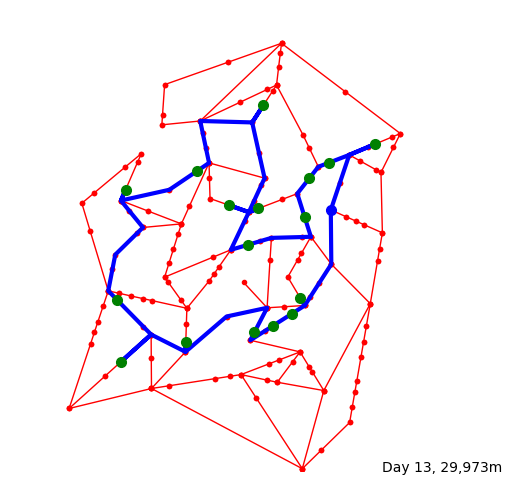

[13] 18:15:50.0 Driver leaves for delivery of 19 parcels
[13] 18:15:50.0 Driver drives to Customer: 21 (7852, 7076)
[13] 18:23:15.4 Driver arrived at Customer: 21 (7852, 7076)
[13] 18:23:17.2 Customer: 21 (7852, 7076) answers door
[13] 18:23:17.2 Customer: 21 (7852, 7076) accepts Parcel: 297
[13] 18:23:19.10 Customer: 21 (7852, 7076) signs off
[13] 18:23:23.3 Driver drives to Customer: 16 (6857, 6672)
[13] 18:27:40.6 Driver arrived at Customer: 16 (6857, 6672)
[13] 18:27:48.0 Customer: 16 (6857, 6672) answers door
[13] 18:27:48.0 Customer: 16 (6857, 6672) accepts Parcel: 307
[13] 18:27:50.8 Customer: 16 (6857, 6672) signs off
[13] 18:27:53.3 Driver drives to Customer:  9 (6438, 6337)
[13] 18:30:06.8 Driver arrived at Customer:  9 (6438, 6337)
[13] 18:31:31.0 Customer:  9 (6438, 6337) answers door
[13] 18:31:31.0 Customer:  9 (6438, 6337) accepts Parcel: 284
[13] 18:31:37.2 Customer:  9 (6438, 6337) signs off
[13] 18:31:58.2 Driver drives to Customer: 27 (6339, 5488)
[13] 18:35:49.0 Dri

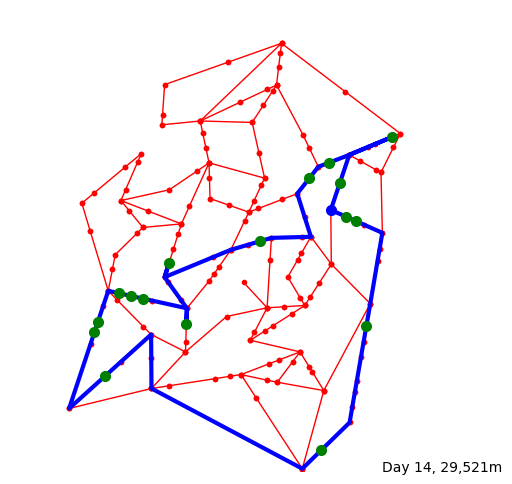

[14] 18:17:30.0 Driver leaves for delivery of 21 parcels
[14] 18:17:30.0 Driver drives to Customer: 79 (7227, 5504)
[14] 18:18:56.2 Driver arrived at Customer: 79 (7227, 5504)
[14] 18:19:21.9 Customer: 79 (7227, 5504) answers door
[14] 18:19:21.9 Customer: 79 (7227, 5504) accepts Parcel: 312
[14] 18:19:24.6 Customer: 79 (7227, 5504) signs off
[14] 18:19:25.0 Driver drives to Customer: 73 (7436, 5411)
[14] 18:20:19.7 Driver arrived at Customer: 73 (7436, 5411)
[14] 18:20:35.3 Customer: 73 (7436, 5411) answers door
[14] 18:20:35.3 Customer: 73 (7436, 5411) accepts Parcel: 322
[14] 18:20:51.3 Customer: 73 (7436, 5411) signs off
[14] 18:21:24.5 Driver drives to Customer: 84 (7665, 3146)
[14] 18:32:03.6 Driver arrived at Customer: 84 (7665, 3146)
[14] 18:32:08.2 Customer: 84 (7665, 3146) answers door
[14] 18:32:08.2 Customer: 84 (7665, 3146) accepts Parcel: 302
[14] 18:32:29.2 Customer: 84 (7665, 3146) accepts Parcel: 306
[14] 18:32:29.7 Customer: 84 (7665, 3146) signs off
[14] 18:32:42.2 D

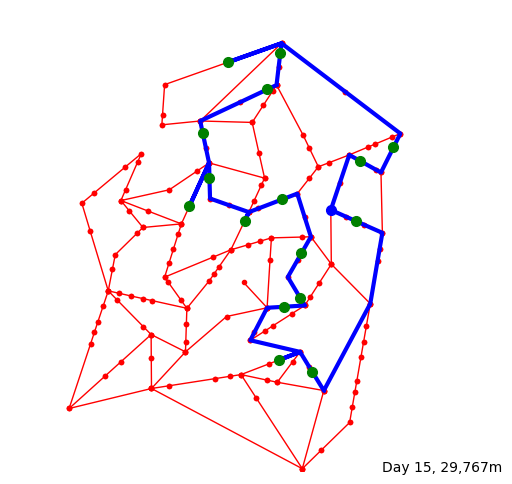

[15] 18:18:20.0 Driver leaves for delivery of 22 parcels
[15] 18:18:20.0 Driver drives to Customer: 73 (7436, 5411)
[15] 18:20:40.9 Driver arrived at Customer: 73 (7436, 5411)
[15] 18:20:51.2 Customer: 73 (7436, 5411) answers door
[15] 18:20:51.2 Customer: 73 (7436, 5411) accepts Parcel: 343
[15] 18:20:58.7 Customer: 73 (7436, 5411) signs off
[15] 18:21:15.8 Driver drives to Customer: 14 (6502, 2145)
[15] 18:40:23.5 Driver arrived at Customer: 14 (6502, 2145)
[15] 18:40:41.1 Customer: 14 (6502, 2145) answers door
[15] 18:40:41.1 Customer: 14 (6502, 2145) accepts Parcel: 337
[15] 18:41:02.5 Customer: 14 (6502, 2145) signs off
[15] 18:41:15.8 Driver drives to Customer: 54 (5791, 2405)
[15] 18:45:12.2 Driver arrived at Customer: 54 (5791, 2405)
[15] 18:46:02.6 Customer: 54 (5791, 2405) answers door
[15] 18:46:02.6 Customer: 54 (5791, 2405) accepts Parcel: 336
[15] 18:46:06.7 Customer: 54 (5791, 2405) accepts Parcel: 349
[15] 18:46:07.10 Customer: 54 (5791, 2405) signs off
[15] 18:46:40.9 

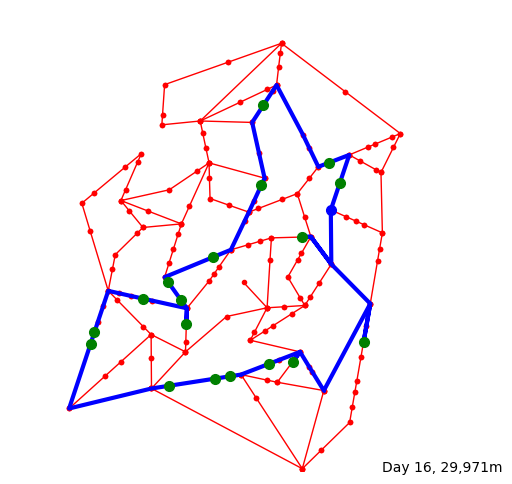

[16] 18:17:30.0 Driver leaves for delivery of 21 parcels
[16] 18:17:30.0 Driver drives to Customer:  7 (7092, 6231)
[16] 18:19:56.4 Driver arrived at Customer:  7 (7092, 6231)
[16] 18:20:08.1 Customer:  7 (7092, 6231) answers door
[16] 18:20:08.1 Customer:  7 (7092, 6231) accepts Parcel: 377
[16] 18:20:14.8 Customer:  7 (7092, 6231) signs off
[16] 18:20:29.7 Driver drives to Customer: 16 (6857, 6672)
[16] 18:24:57.1 Driver arrived at Customer: 16 (6857, 6672)
[16] 18:26:39.5 Customer: 16 (6857, 6672) answers door
[16] 18:26:39.5 Customer: 16 (6857, 6672) accepts Parcel: 352
[16] 18:26:47.8 Customer: 16 (6857, 6672) signs off
[16] 18:27:05.3 Driver drives to Customer: 34 (5446, 7913)
[16] 18:38:05.1 Driver arrived at Customer: 34 (5446, 7913)
[16] 18:38:08.3 Customer: 34 (5446, 7913) answers door
[16] 18:38:08.3 Customer: 34 (5446, 7913) accepts Parcel: 345
[16] 18:38:27.7 Customer: 34 (5446, 7913) signs off
[16] 18:38:53.1 Driver drives to Customer: 12 (5406, 6190)
[16] 18:46:13.7 Driv

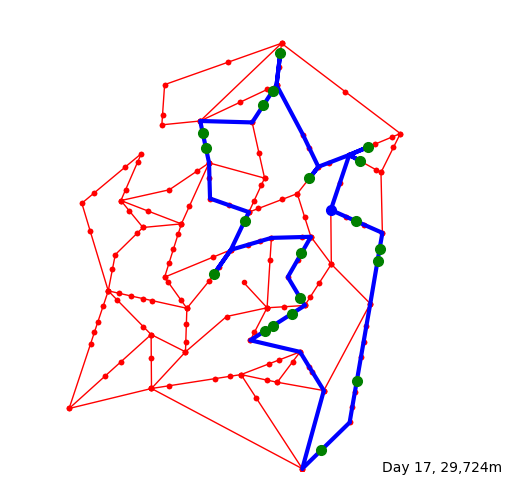

[17] 18:22:30.0 Driver leaves for delivery of 27 parcels
[17] 18:22:30.0 Driver drives to Customer: 73 (7436, 5411)
[17] 18:24:50.9 Driver arrived at Customer: 73 (7436, 5411)
[17] 18:24:51.2 Customer: 73 (7436, 5411) answers door
[17] 18:24:51.2 Customer: 73 (7436, 5411) accepts Parcel: 399
[17] 18:25:10.10 Customer: 73 (7436, 5411) signs off
[17] 18:25:19.1 Driver drives to Customer: 45 (7949, 4811)
[17] 18:29:13.1 Driver arrived at Customer: 45 (7949, 4811)
[17] 18:30:09.5 Customer: 45 (7949, 4811) answers door
[17] 18:30:09.5 Customer: 45 (7949, 4811) accepts Parcel: 385
[17] 18:30:16.2 Customer: 45 (7949, 4811) signs off
[17] 18:30:27.9 Driver drives to Customer: 20 (7904, 4546)
[17] 18:31:32.2 Driver arrived at Customer: 20 (7904, 4546)
[17] 18:33:19.3 Customer: 20 (7904, 4546) answers door
[17] 18:33:19.3 Customer: 20 (7904, 4546) accepts Parcel: 394
[17] 18:33:27.5 Customer: 20 (7904, 4546) signs off
[17] 18:33:48.3 Driver drives to Customer: 41 (7458, 1945)
[17] 18:35:20.1 Par

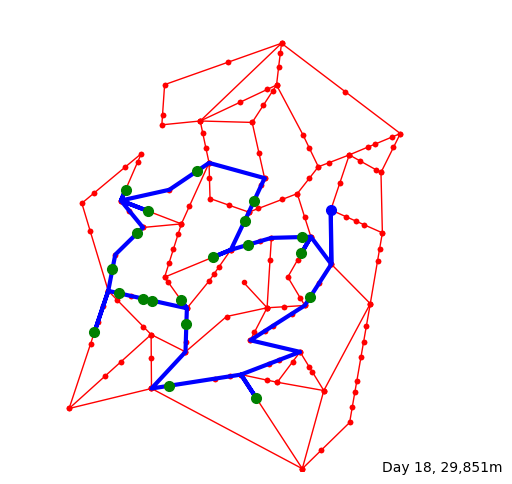

[18] 18:20:00.0 Driver leaves for delivery of 24 parcels
[18] 18:20:00.0 Driver drives to Customer: 36 (6453, 3761)
[18] 18:28:05.5 Driver arrived at Customer: 36 (6453, 3761)
[18] 18:28:51.6 Customer: 36 (6453, 3761) answers door
[18] 18:28:51.6 Customer: 36 (6453, 3761) accepts Parcel: 386
[18] 18:28:52.6 Customer: 36 (6453, 3761) signs off
[18] 18:28:56.4 Driver drives to Customer: 60 (5300, 1573)
[18] 18:47:37.4 Driver arrived at Customer: 60 (5300, 1573)
[18] 18:49:06.1 Customer: 60 (5300, 1573) answers door
[18] 18:49:06.1 Customer: 60 (5300, 1573) accepts Parcel: 400
[18] 18:49:08.6 Customer: 60 (5300, 1573) signs off
[18] 18:49:42.9 Driver drives to Customer: 86 (3428, 1846)
[18] 18:58:23.2 Driver arrived at Customer: 86 (3428, 1846)
[18] 19:01:09.1 Customer: 86 (3428, 1846) answers door
[18] 19:01:09.1 Customer: 86 (3428, 1846) accepts Parcel: 403
[18] 19:01:17.6 Customer: 86 (3428, 1846) accepts Parcel: 419
[18] 19:01:18.1 Customer: 86 (3428, 1846) signs off
[18] 19:01:19.0 D

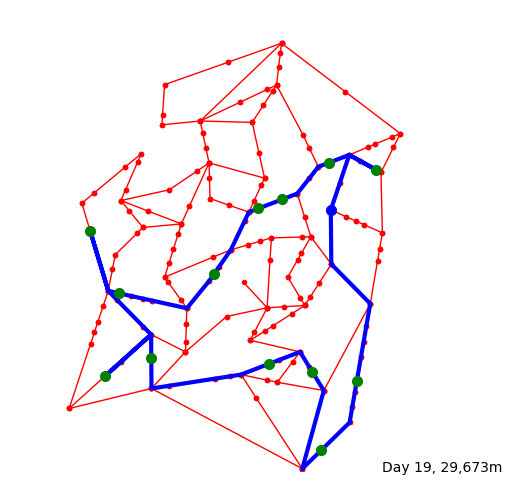

[19] 18:16:40.0 Driver leaves for delivery of 20 parcels
[19] 18:16:40.0 Driver drives to Customer: 41 (7458, 1945)
[19] 18:32:57.3 Driver arrived at Customer: 41 (7458, 1945)
[19] 18:33:13.9 Customer: 41 (7458, 1945) answers door
[19] 18:33:13.9 Customer: 41 (7458, 1945) accepts Parcel: 428
[19] 18:33:19.3 Customer: 41 (7458, 1945) accepts Parcel: 439
[19] 18:33:24.0 Customer: 41 (7458, 1945) signs off
[19] 18:33:32.3 Driver drives to Customer: 95 (6687, 444)
[19] 18:40:37.1 Driver arrived at Customer: 95 (6687, 444)
[19] 18:40:53.5 Customer: 95 (6687, 444) answers door
[19] 18:40:53.5 Customer: 95 (6687, 444) accepts Parcel: 409
[19] 18:41:10.7 Customer: 95 (6687, 444) accepts Parcel: 456
[19] 18:41:13.4 Customer: 95 (6687, 444) signs off
[19] 18:41:16.3 Driver drives to Customer: 14 (6502, 2145)
[19] 18:52:25.4 Driver arrived at Customer: 14 (6502, 2145)
[19] 18:52:51.6 Customer: 14 (6502, 2145) answers door
[19] 18:52:51.6 Customer: 14 (6502, 2145) accepts Parcel: 412
[19] 18:53:18

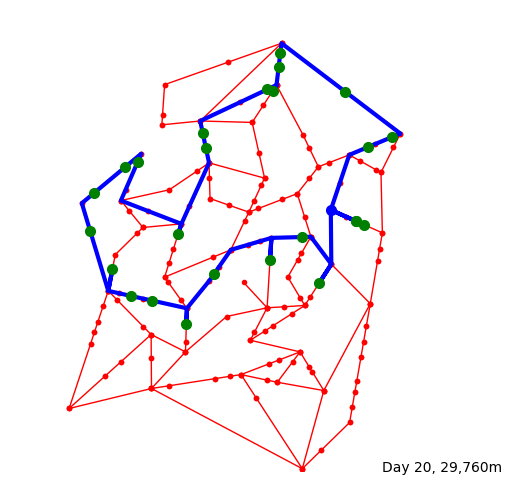

[20] 18:25:00.0 Driver leaves for delivery of 30 parcels
[20] 18:25:00.0 Driver drives to Customer: 73 (7436, 5411)
[20] 18:27:20.9 Driver arrived at Customer: 73 (7436, 5411)
[20] 18:27:50.3 Customer: 73 (7436, 5411) answers door
[20] 18:27:50.3 Customer: 73 (7436, 5411) accepts Parcel: 432
[20] 18:28:03.2 Customer: 73 (7436, 5411) accepts Parcel: 435
[20] 18:28:05.2 Customer: 73 (7436, 5411) signs off
[20] 18:28:30.9 Driver drives to Customer: 93 (7622, 5327)
[20] 18:29:19.8 Driver arrived at Customer: 93 (7622, 5327)
[20] 18:30:09.7 Customer: 93 (7622, 5327) answers door
[20] 18:30:09.7 Customer: 93 (7622, 5327) accepts Parcel: 455
[20] 18:30:18.7 Customer: 93 (7622, 5327) signs off
[20] 18:30:24.4 Driver drives to Customer: 73 (7436, 5411)
[20] 18:31:13.4 Driver arrived at Customer: 73 (7436, 5411)
[20] 18:31:53.5 Customer: 73 (7436, 5411) answers door
[20] 18:31:53.5 Customer: 73 (7436, 5411) accepts Parcel: 432
[20] 18:32:03.1 Customer: 73 (7436, 5411) accepts Parcel: 435
[20] 18

[21] 11:02:07.4 Parcel: 488 arr at delivery centre
[21] 11:26:36.9 Parcel: 489 arr at delivery centre
[21] 11:27:11.5 Parcel: 490 arr at delivery centre
[21] 11:38:07.8 Parcel: 491 arr at delivery centre
[21] 11:59:33.7 Parcel: 492 arr at delivery centre
[21] 12:00:07.6 Parcel: 493 arr at delivery centre
[21] 12:46:38.2 Parcel: 494 arr at delivery centre
[21] 13:47:11.3 Parcel: 495 arr at delivery centre
[21] 14:10:52.9 Parcel: 496 arr at delivery centre
[21] 14:12:23.6 Parcel: 497 arr at delivery centre
[21] 14:13:44.5 Parcel: 498 arr at delivery centre
[21] 14:21:58.1 Parcel: 499 arr at delivery centre
[21] 18:00:00.0 Driver arrives for work
[21] 18:00:00.0 Parcel: 482 out for delivery
[21] 18:00:00.0 Parcel: 496 out for delivery
[21] 18:00:00.0 Parcel: 459 out for delivery
[21] 18:00:00.0 Parcel: 460 out for delivery
[21] 18:00:00.0 Parcel: 459 out for delivery
[21] 18:00:00.0 Parcel: 496 out for delivery
[21] 18:00:00.0 Parcel: 482 out for delivery
[21] 18:00:00.0 Parcel: 489 out f

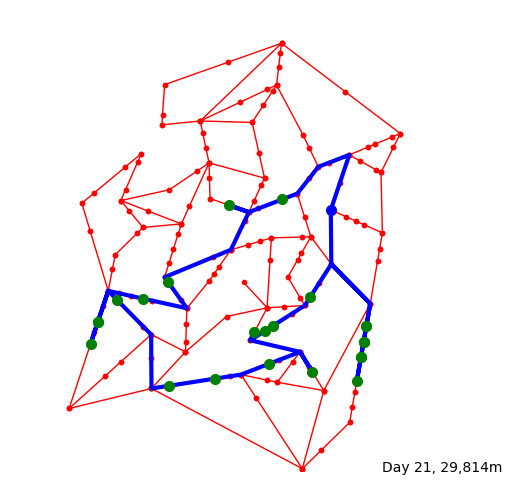

[21] 18:20:50.0 Driver leaves for delivery of 25 parcels
[21] 18:20:50.0 Driver drives to Customer: 84 (7665, 3146)
[21] 18:32:15.2 Driver arrived at Customer: 84 (7665, 3146)
[21] 18:32:28.3 Customer: 84 (7665, 3146) answers door
[21] 18:32:28.3 Customer: 84 (7665, 3146) accepts Parcel: 482
[21] 18:32:46.5 Customer: 84 (7665, 3146) signs off
[21] 18:32:48.10 Driver drives to Customer:  8 (7603, 2787)
[21] 18:34:16.3 Driver arrived at Customer:  8 (7603, 2787)
[21] 18:34:35.7 Customer:  8 (7603, 2787) answers door
[21] 18:34:35.7 Customer:  8 (7603, 2787) accepts Parcel: 496
[21] 18:34:42.8 Customer:  8 (7603, 2787) signs off
[21] 18:34:46.9 Driver drives to Customer: 77 (7546, 2458)
[21] 18:36:06.8 Driver arrived at Customer: 77 (7546, 2458)
[21] 18:37:16.4 Customer: 77 (7546, 2458) answers door
[21] 18:37:16.4 Customer: 77 (7546, 2458) accepts Parcel: 459
[21] 18:37:19.4 Customer: 77 (7546, 2458) signs off
[21] 18:37:20.4 Driver drives to Customer: 41 (7458, 1945)
[21] 18:39:25.2 Dri

In [102]:
random.seed(0)
recP5 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [103]:
standardMeasureConverter(recP5.daily)

### Simulation Records

In [104]:
random.seed(0)
recP5.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,74435,29.829,160.583333,10,NaN
1,151200,160267,29.885,151.116667,12,1.181874
2,237600,246492,29.72,148.2,20,0.969512
3,324000,333528,29.991,158.8,21,1.259006
4,410400,420386,29.308,166.433333,21,1.050559
5,496800,506856,29.68,167.6,30,1.399373
6,583200,593989,29.917,179.816667,25,1.359599
7,669600,679519,29.831,165.316667,13,1.304602
8,756000,765617,29.899,160.283333,6,1.443845
9,842400,853048,29.937,177.466667,11,1.763457


### Time Plot

In [105]:
np.mean(recP5.daily['Working Time (in minutes)'])

166.93939393939397

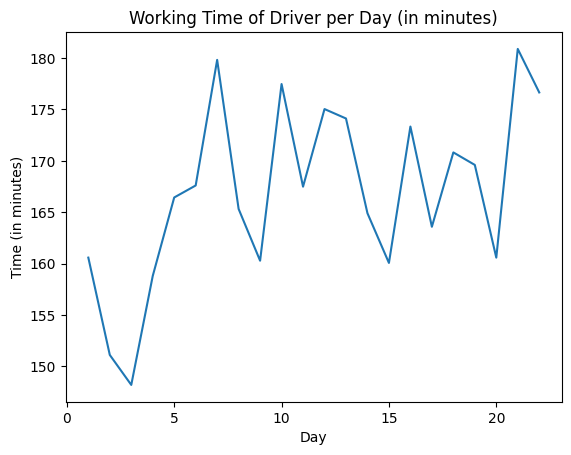

In [106]:
timePlot = plt.plot(recP5.daily.index +1 ,recP5.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [107]:
np.mean(recP5.daily['Delivery Route Distance(in km)'])

29.812

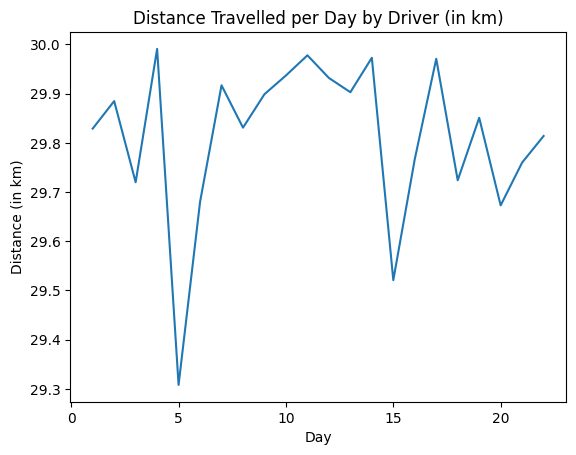

In [108]:
distancePlot = plt.plot(recP5.daily.index +1 ,recP5.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [109]:
np.mean(recP5.daily['Number of left over parcels'])

16.40909090909091

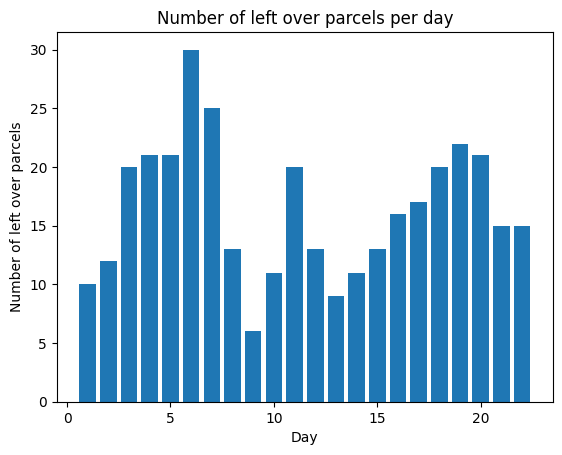

In [110]:
leftOverPlot = plt.bar(recP5.daily.index +1 ,recP5.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [111]:
np.mean(recP5.daily['Delay Time(in days)'])

1.2957371713306696

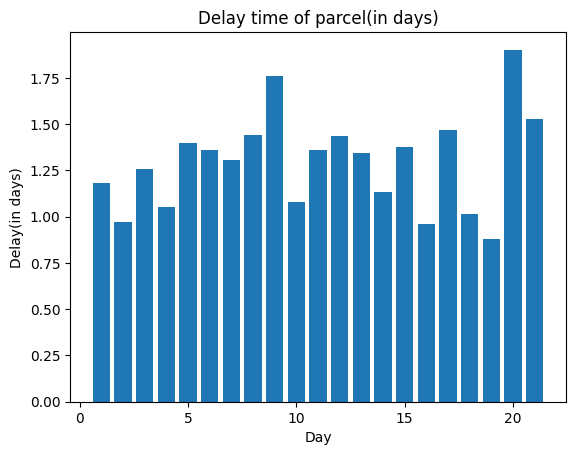

In [112]:
delayPlot = plt.bar(recP5.daily.index ,recP5.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

# Scenario 4

Suppose due to high demand in sales the average number of parcels per customer inclines to 6.

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 594 deliveries over 22 days.


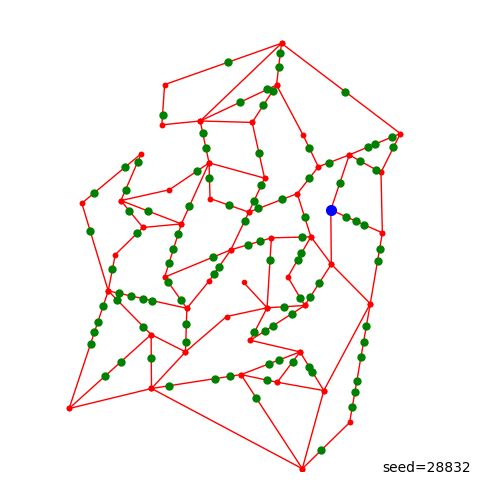

In [113]:
data = generateData(28832, p = 6, plot=True, log=True)

## Storing generated data into the pickle file

In [114]:
with open('dataSeed28832P6.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [115]:
with open('dataSeed28832P6.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 596 parcels over 22 days to 100 customers
[ 0] 08:28:50.7 Parcel:  0 arr at delivery centre
[ 0] 08:50:50.3 Parcel:  1 arr at delivery centre
[ 0] 08:59:17.9 Parcel:  2 arr at delivery centre
[ 0] 09:03:56.6 Parcel:  3 arr at delivery centre
[ 0] 09:15:02.6 Parcel:  4 arr at delivery centre
[ 0] 09:23:05.5 Parcel:  5 arr at delivery centre
[ 0] 09:46:50.1 Parcel:  6 arr at delivery centre
[ 0] 09:52:26.3 Parcel:  7 arr at delivery centre
[ 0] 10:02:28.5 Parcel:  8 arr at delivery centre
[ 0] 10:16:02.10 Parcel:  9 arr at delivery centre
[ 0] 10:53:03.6 Parcel: 10 arr at delivery centre
[ 0] 11:03:57.1 Parcel: 11 arr at delivery centre
[ 0] 11:09:05.1 Parcel: 12 arr at delivery centre
[ 0] 11:30:56.5 Parcel: 13 arr at delivery centre
[ 0] 11:45:52.6 Parcel: 14 arr at delivery centre
[ 0] 11:50:20.8 Parcel: 15 arr at delivery centre
[ 0] 12:27:38.1 Parcel: 16 arr at delivery centre
[ 0] 13:30:36.6 Parcel: 17 arr at delivery centre
[ 0] 13:56:22.5 Parcel: 18 arr at 

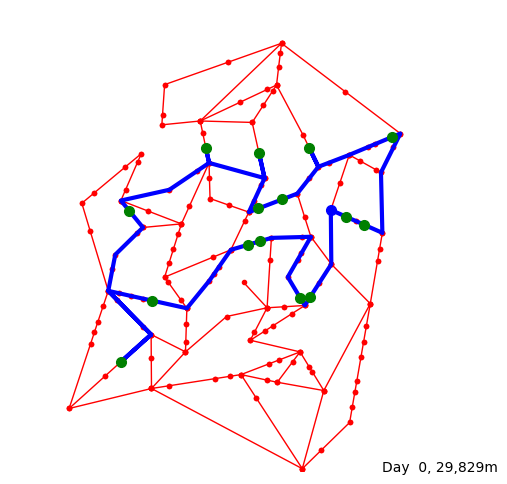

[ 0] 18:07:27.4 Parcel: 30 arr at delivery centre
[ 0] 18:15:00.0 Driver leaves for delivery of 18 parcels
[ 0] 18:15:00.0 Driver drives to Customer: 36 (6453, 3761)
[ 0] 18:23:05.5 Driver arrived at Customer: 36 (6453, 3761)
[ 0] 18:23:16.1 Customer: 36 (6453, 3761) answers door
[ 0] 18:23:16.1 Customer: 36 (6453, 3761) accepts Parcel:  1
[ 0] 18:23:30.5 Customer: 36 (6453, 3761) signs off
[ 0] 18:23:33.7 Driver drives to Customer: 56 (6245, 3741)
[ 0] 18:25:08.3 Driver arrived at Customer: 56 (6245, 3741)
[ 0] 18:27:53.7 Customer: 56 (6245, 3741) answers door
[ 0] 18:27:53.7 Customer: 56 (6245, 3741) accepts Parcel:  4
[ 0] 18:27:55.0 Customer: 56 (6245, 3741) signs off
[ 0] 18:28:16.5 Driver drives to Customer: 35 (5376, 4973)
[ 0] 18:38:49.7 Driver arrived at Customer: 35 (5376, 4973)
[ 0] 18:38:51.3 Customer: 35 (5376, 4973) answers door
[ 0] 18:38:51.3 Customer: 35 (5376, 4973) accepts Parcel: 16
[ 0] 18:38:54.3 Customer: 35 (5376, 4973) accepts Parcel: 21
[ 0] 18:39:01.8 Custome

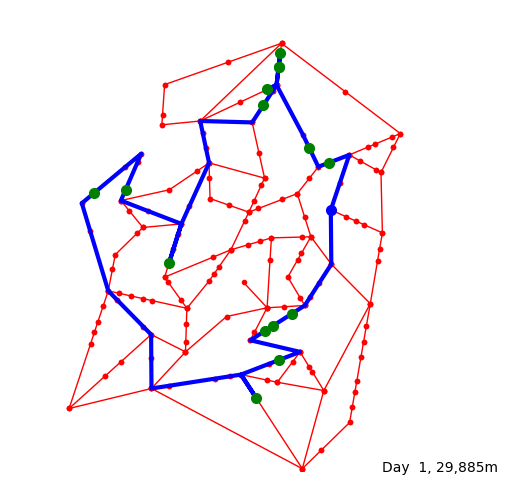

[ 1] 18:15:00.0 Driver leaves for delivery of 18 parcels
[ 1] 18:15:00.0 Driver drives to Customer: 16 (6857, 6672)
[ 1] 18:21:53.8 Driver arrived at Customer: 16 (6857, 6672)
[ 1] 18:22:19.7 Customer: 16 (6857, 6672) answers door
[ 1] 18:22:19.7 Customer: 16 (6857, 6672) accepts Parcel: 62
[ 1] 18:22:31.5 Customer: 16 (6857, 6672) signs off
[ 1] 18:22:35.4 Driver drives to Customer:  3 (6435, 6994)
[ 1] 18:25:22.2 Driver arrived at Customer:  3 (6435, 6994)
[ 1] 18:26:04.4 Customer:  3 (6435, 6994) answers door
[ 1] 18:26:04.4 Customer:  3 (6435, 6994) accepts Parcel: 54
[ 1] 18:26:05.0 Customer:  3 (6435, 6994) signs off
[ 1] 18:26:08.6 Driver drives to Customer: 19 (5778, 8751)
[ 1] 18:33:51.5 Driver arrived at Customer: 19 (5778, 8751)
[ 1] 18:34:46.2 Customer: 19 (5778, 8751) answers door
[ 1] 18:34:46.2 Customer: 19 (5778, 8751) accepts Parcel: 15
[ 1] 18:34:46.8 Customer: 19 (5778, 8751) signs off
[ 1] 18:34:56.5 Driver drives to Customer: 15 (5813, 9044)
[ 1] 18:36:07.3 Driver 

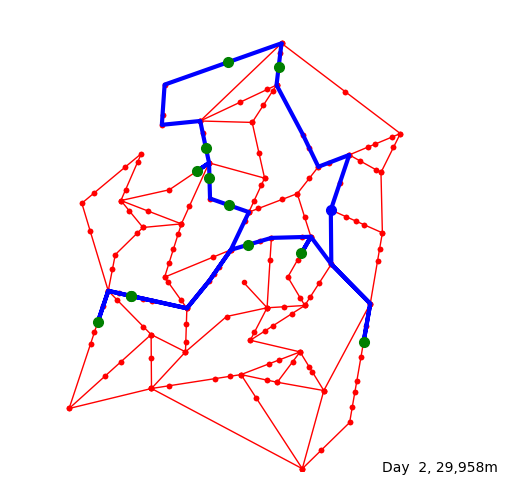

[ 2] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 2] 18:11:40.0 Driver drives to Customer:  8 (7603, 2787)
[ 2] 18:24:32.6 Driver arrived at Customer:  8 (7603, 2787)
[ 2] 18:26:25.1 Customer:  8 (7603, 2787) answers door
[ 2] 18:26:25.1 Customer:  8 (7603, 2787) accepts Parcel: 33
[ 2] 18:26:33.10 Customer:  8 (7603, 2787) signs off
[ 2] 18:26:34.5 Driver drives to Customer: 97 (6268, 4714)
[ 2] 18:39:20.1 Driver arrived at Customer: 97 (6268, 4714)
[ 2] 18:39:39.7 Customer: 97 (6268, 4714) answers door
[ 2] 18:39:39.7 Customer: 97 (6268, 4714) accepts Parcel: 36
[ 2] 18:39:42.4 Customer: 97 (6268, 4714) signs off
[ 2] 18:39:43.3 Driver drives to Customer: 70 (5108, 4893)
[ 2] 18:46:53.6 Driver arrived at Customer: 70 (5108, 4893)
[ 2] 18:47:01.9 Customer: 70 (5108, 4893) answers door
[ 2] 18:47:01.9 Customer: 70 (5108, 4893) accepts Parcel: 35
[ 2] 18:47:02.5 Customer: 70 (5108, 4893) signs off
[ 2] 18:47:12.6 Driver drives to Customer: 92 (2604, 3788)
[ 2] 18:59:56.1 Driver

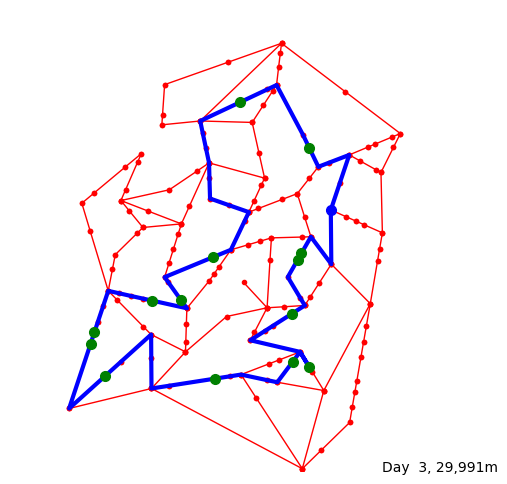

[ 3] 18:19:10.0 Driver leaves for delivery of 23 parcels
[ 3] 18:19:10.0 Driver drives to Customer: 97 (6268, 4714)
[ 3] 18:28:27.0 Driver arrived at Customer: 97 (6268, 4714)
[ 3] 18:30:08.8 Customer: 97 (6268, 4714) answers door
[ 3] 18:30:08.8 Customer: 97 (6268, 4714) accepts Parcel: 97
[ 3] 18:30:14.8 Customer: 97 (6268, 4714) accepts Parcel: 99
[ 3] 18:30:18.10 Customer: 97 (6268, 4714) signs off
[ 3] 18:30:20.0 Driver drives to Customer: 62 (6189, 4576)
[ 3] 18:30:58.2 Driver arrived at Customer: 62 (6189, 4576)
[ 3] 18:32:23.10 Customer: 62 (6189, 4576) answers door
[ 3] 18:32:23.10 Customer: 62 (6189, 4576) accepts Parcel: 45
[ 3] 18:32:39.8 Customer: 62 (6189, 4576) accepts Parcel: 47
[ 3] 18:32:43.7 Customer: 62 (6189, 4576) signs off
[ 3] 18:32:49.8 Driver drives to Customer: 13 (6067, 3408)
[ 3] 18:38:43.3 Driver arrived at Customer: 13 (6067, 3408)
[ 3] 18:38:59.0 Customer: 13 (6067, 3408) answers door
[ 3] 18:38:59.0 Customer: 13 (6067, 3408) accepts Parcel: 68
[ 3] 18:3

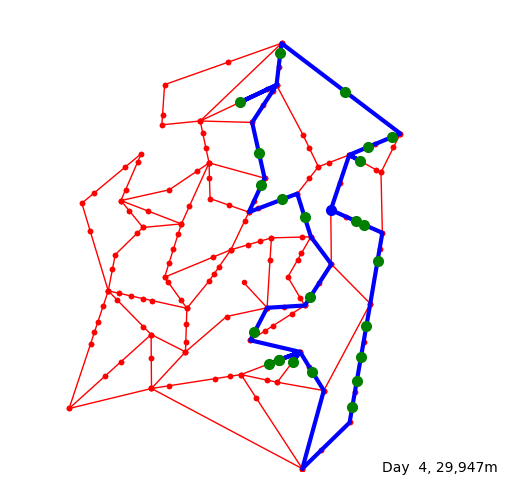

[ 4] 18:30:00.0 Driver leaves for delivery of 36 parcels
[ 4] 18:30:00.0 Driver drives to Customer: 73 (7436, 5411)
[ 4] 18:32:20.9 Driver arrived at Customer: 73 (7436, 5411)
[ 4] 18:32:53.5 Customer: 73 (7436, 5411) answers door
[ 4] 18:32:53.5 Customer: 73 (7436, 5411) accepts Parcel: 89
[ 4] 18:32:56.8 Customer: 73 (7436, 5411) signs off
[ 4] 18:33:04.6 Driver drives to Customer: 93 (7622, 5327)
[ 4] 18:33:53.6 Driver arrived at Customer: 93 (7622, 5327)
[ 4] 18:34:02.5 Customer: 93 (7622, 5327) answers door
[ 4] 18:34:02.5 Customer: 93 (7622, 5327) accepts Parcel: 48
[ 4] 18:34:06.1 Customer: 93 (7622, 5327) accepts Parcel: 76
[ 4] 18:34:11.9 Customer: 93 (7622, 5327) signs off
[ 4] 18:34:21.2 Driver drives to Customer: 20 (7904, 4546)
[ 4] 18:38:30.5 Driver arrived at Customer: 20 (7904, 4546)
[ 4] 18:39:01.3 Customer: 20 (7904, 4546) answers door
[ 4] 18:39:01.3 Customer: 20 (7904, 4546) accepts Parcel: 116
[ 4] 18:39:04.3 Customer: 20 (7904, 4546) signs off
[ 4] 18:39:06.9 Driv

[ 5] 08:47:35.3 Parcel: 141 arr at delivery centre
[ 5] 08:49:14.3 Parcel: 142 arr at delivery centre
[ 5] 09:58:06.8 Parcel: 143 arr at delivery centre
[ 5] 10:01:33.6 Parcel: 144 arr at delivery centre
[ 5] 10:08:26.6 Parcel: 145 arr at delivery centre
[ 5] 10:28:50.1 Parcel: 146 arr at delivery centre
[ 5] 10:57:05.1 Parcel: 147 arr at delivery centre
[ 5] 11:35:57.1 Parcel: 148 arr at delivery centre
[ 5] 11:38:49.8 Parcel: 149 arr at delivery centre
[ 5] 11:56:08.6 Parcel: 150 arr at delivery centre
[ 5] 12:48:49.1 Parcel: 151 arr at delivery centre
[ 5] 12:49:44.7 Parcel: 152 arr at delivery centre
[ 5] 13:07:13.6 Parcel: 153 arr at delivery centre
[ 5] 13:36:10.4 Parcel: 154 arr at delivery centre
[ 5] 13:42:40.2 Parcel: 155 arr at delivery centre
[ 5] 13:47:08.7 Parcel: 156 arr at delivery centre
[ 5] 14:01:13.6 Parcel: 157 arr at delivery centre
[ 5] 14:10:16.8 Parcel: 158 arr at delivery centre
[ 5] 14:13:15.5 Parcel: 159 arr at delivery centre
[ 5] 14:23:08.9 Parcel: 160 arr

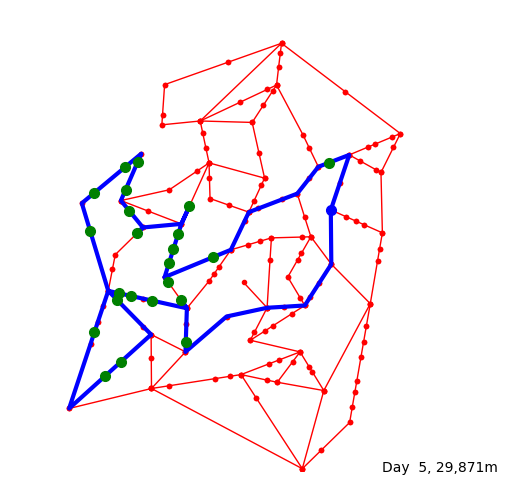

[ 5] 18:30:00.0 Driver leaves for delivery of 36 parcels
[ 5] 18:30:00.0 Driver drives to Customer: 16 (6857, 6672)
[ 5] 18:36:53.8 Driver arrived at Customer: 16 (6857, 6672)
[ 5] 18:39:04.2 Customer: 16 (6857, 6672) answers door
[ 5] 18:39:04.2 Customer: 16 (6857, 6672) accepts Parcel: 133
[ 5] 18:39:08.4 Customer: 16 (6857, 6672) signs off
[ 5] 18:39:14.3 Driver drives to Customer: 30 (4374, 4632)
[ 5] 18:52:50.5 Driver arrived at Customer: 30 (4374, 4632)
[ 5] 18:53:42.3 Customer: 30 (4374, 4632) answers door
[ 5] 18:53:42.3 Customer: 30 (4374, 4632) accepts Parcel: 112
[ 5] 18:53:52.10 Customer: 30 (4374, 4632) accepts Parcel: 118
[ 5] 18:53:55.10 Customer: 30 (4374, 4632) signs off
[ 5] 18:54:07.1 Driver drives to Customer: 90 (3405, 4083)
[ 5] 18:59:12.9 Driver arrived at Customer: 90 (3405, 4083)
[ 5] 18:59:27.4 Customer: 90 (3405, 4083) answers door
[ 5] 18:59:27.4 Customer: 90 (3405, 4083) accepts Parcel: 114
[ 5] 18:59:31.8 Customer: 90 (3405, 4083) accepts Parcel: 120
[ 5] 

[ 6] 09:58:32.5 Parcel: 172 arr at delivery centre
[ 6] 10:03:39.2 Parcel: 173 arr at delivery centre
[ 6] 10:07:54.6 Parcel: 174 arr at delivery centre
[ 6] 10:55:21.4 Parcel: 175 arr at delivery centre
[ 6] 11:02:05.3 Parcel: 176 arr at delivery centre
[ 6] 11:07:21.1 Parcel: 177 arr at delivery centre
[ 6] 11:14:15.1 Parcel: 178 arr at delivery centre
[ 6] 11:59:45.9 Parcel: 179 arr at delivery centre
[ 6] 12:15:20.2 Parcel: 180 arr at delivery centre
[ 6] 12:30:22.9 Parcel: 181 arr at delivery centre
[ 6] 12:49:52.6 Parcel: 182 arr at delivery centre
[ 6] 12:57:29.4 Parcel: 183 arr at delivery centre
[ 6] 13:05:47.2 Parcel: 184 arr at delivery centre
[ 6] 13:22:06.0 Parcel: 185 arr at delivery centre
[ 6] 13:22:07.4 Parcel: 186 arr at delivery centre
[ 6] 13:25:26.1 Parcel: 187 arr at delivery centre
[ 6] 13:31:44.8 Parcel: 188 arr at delivery centre
[ 6] 13:35:59.4 Parcel: 189 arr at delivery centre
[ 6] 13:51:43.0 Parcel: 190 arr at delivery centre
[ 6] 13:59:05.6 Parcel: 191 arr

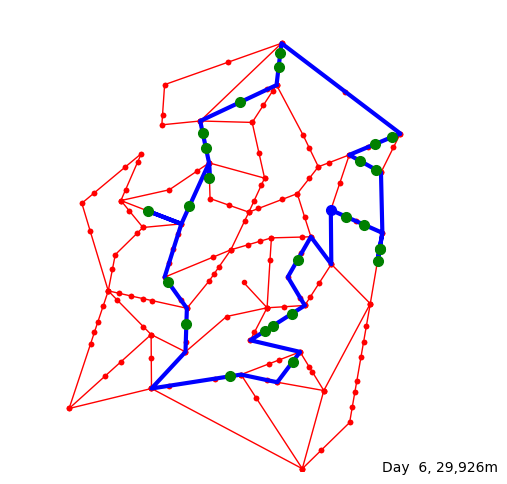

[ 6] 18:25:00.0 Driver leaves for delivery of 30 parcels
[ 6] 18:25:00.0 Driver drives to Customer: 79 (7227, 5504)
[ 6] 18:26:26.2 Driver arrived at Customer: 79 (7227, 5504)
[ 6] 18:26:58.1 Customer: 79 (7227, 5504) answers door
[ 6] 18:26:58.1 Customer: 79 (7227, 5504) accepts Parcel: 154
[ 6] 18:27:36.0 Customer: 79 (7227, 5504) signs off
[ 6] 18:27:50.8 Driver drives to Customer: 93 (7622, 5327)
[ 6] 18:29:34.5 Driver arrived at Customer: 93 (7622, 5327)
[ 6] 18:30:08.3 Customer: 93 (7622, 5327) answers door
[ 6] 18:30:08.3 Customer: 93 (7622, 5327) accepts Parcel: 189
[ 6] 18:30:11.4 Customer: 93 (7622, 5327) signs off
[ 6] 18:30:22.10 Driver drives to Customer: 45 (7949, 4811)
[ 6] 18:33:28.0 Driver arrived at Customer: 45 (7949, 4811)
[ 6] 18:33:52.4 Customer: 45 (7949, 4811) answers door
[ 6] 18:33:52.4 Customer: 45 (7949, 4811) accepts Parcel: 136
[ 6] 18:34:05.1 Customer: 45 (7949, 4811) signs off
[ 6] 18:34:10.3 Driver drives to Customer: 20 (7904, 4546)
[ 6] 18:35:14.6 Dri

[ 7] 10:24:44.8 Parcel: 204 arr at delivery centre
[ 7] 10:37:31.5 Parcel: 205 arr at delivery centre
[ 7] 10:59:21.7 Parcel: 206 arr at delivery centre
[ 7] 11:32:44.5 Parcel: 207 arr at delivery centre
[ 7] 11:43:19.2 Parcel: 208 arr at delivery centre
[ 7] 11:49:07.1 Parcel: 209 arr at delivery centre
[ 7] 11:58:52.2 Parcel: 210 arr at delivery centre
[ 7] 12:24:32.4 Parcel: 211 arr at delivery centre
[ 7] 12:56:46.8 Parcel: 212 arr at delivery centre
[ 7] 13:22:43.5 Parcel: 213 arr at delivery centre
[ 7] 13:25:57.2 Parcel: 214 arr at delivery centre
[ 7] 15:21:30.1 Parcel: 215 arr at delivery centre
[ 7] 15:37:02.8 Parcel: 216 arr at delivery centre
[ 7] 15:38:23.9 Parcel: 217 arr at delivery centre
[ 7] 15:58:26.7 Parcel: 218 arr at delivery centre
[ 7] 17:05:33.7 Parcel: 219 arr at delivery centre
[ 7] 17:13:31.7 Parcel: 220 arr at delivery centre
[ 7] 18:00:00.0 Driver arrives for work
[ 7] 18:00:00.0 Parcel: 164 out for delivery
[ 7] 18:00:00.0 Parcel: 201 out for delivery
[ 7

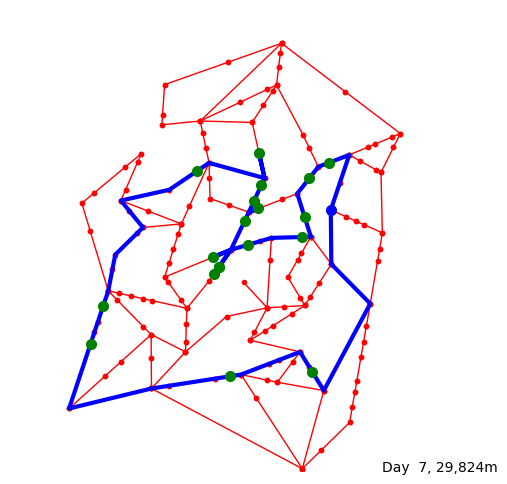

[ 7] 18:28:20.0 Driver leaves for delivery of 34 parcels
[ 7] 18:28:20.0 Driver drives to Customer: 16 (6857, 6672)
[ 7] 18:35:13.8 Driver arrived at Customer: 16 (6857, 6672)
[ 7] 18:36:14.8 Customer: 16 (6857, 6672) answers door
[ 7] 18:36:14.8 Customer: 16 (6857, 6672) accepts Parcel: 164
[ 7] 18:36:30.5 Customer: 16 (6857, 6672) accepts Parcel: 201
[ 7] 18:36:49.1 Customer: 16 (6857, 6672) accepts Parcel: 211
[ 7] 18:37:02.10 Customer: 16 (6857, 6672) accepts Parcel: 213
[ 7] 18:37:04.7 Customer: 16 (6857, 6672) signs off
[ 7] 18:37:15.5 Driver drives to Customer:  9 (6438, 6337)
[ 7] 18:39:28.9 Driver arrived at Customer:  9 (6438, 6337)
[ 7] 18:41:11.8 Customer:  9 (6438, 6337) answers door
[ 7] 18:41:11.8 Customer:  9 (6438, 6337) accepts Parcel: 172
[ 7] 18:41:20.1 Customer:  9 (6438, 6337) signs off
[ 7] 18:41:24.6 Driver drives to Customer: 27 (6339, 5488)
[ 7] 18:45:15.5 Driver arrived at Customer: 27 (6339, 5488)
[ 7] 18:47:14.9 Customer: 27 (6339, 5488) answers door
[ 7] 1

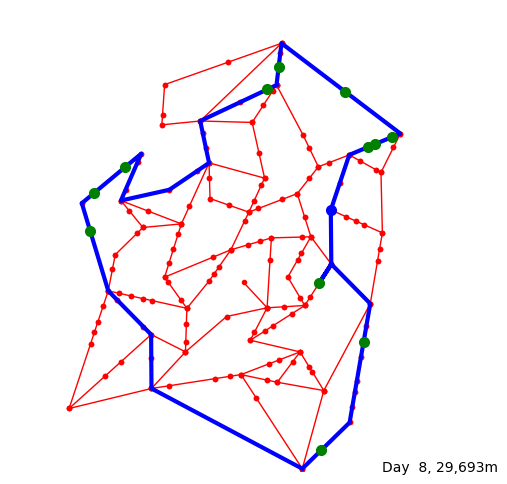

[ 8] 18:13:20.0 Driver leaves for delivery of 16 parcels
[ 8] 18:13:20.0 Driver drives to Customer: 28 (6650, 4070)
[ 8] 18:19:57.7 Driver arrived at Customer: 28 (6650, 4070)
[ 8] 18:21:42.10 Customer: 28 (6650, 4070) answers door
[ 8] 18:21:42.10 Customer: 28 (6650, 4070) accepts Parcel: 195
[ 8] 18:22:01.6 Customer: 28 (6650, 4070) signs off
[ 8] 18:22:30.7 Driver drives to Customer:  8 (7603, 2787)
[ 8] 18:32:36.9 Driver arrived at Customer:  8 (7603, 2787)
[ 8] 18:32:52.1 Customer:  8 (7603, 2787) answers door
[ 8] 18:32:52.1 Customer:  8 (7603, 2787) accepts Parcel: 234
[ 8] 18:33:15.6 Customer:  8 (7603, 2787) signs off
[ 8] 18:33:57.2 Driver drives to Customer: 95 (6687, 444)
[ 8] 18:44:26.7 Driver arrived at Customer: 95 (6687, 444)
[ 8] 18:45:24.6 Customer: 95 (6687, 444) answers door
[ 8] 18:45:24.6 Customer: 95 (6687, 444) accepts Parcel: 203
[ 8] 18:45:27.8 Customer: 95 (6687, 444) signs off
[ 8] 18:45:38.9 Driver drives to Customer: 83 (1723, 5199)
[ 8] 19:17:59.1 Driver 

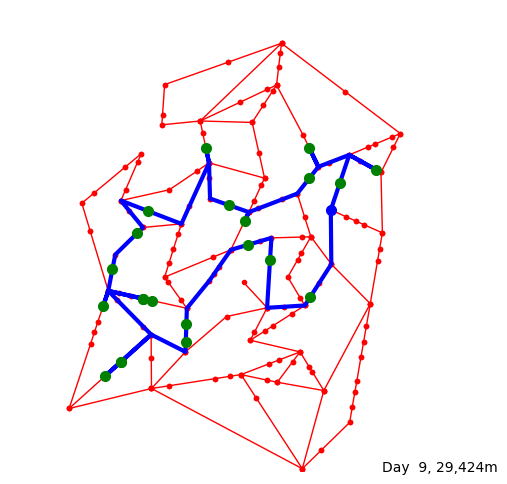

[ 9] 18:24:10.0 Driver leaves for delivery of 29 parcels
[ 9] 18:24:10.0 Driver drives to Customer: 36 (6453, 3761)
[ 9] 18:32:15.5 Driver arrived at Customer: 36 (6453, 3761)
[ 9] 18:32:17.1 Customer: 36 (6453, 3761) answers door
[ 9] 18:32:17.1 Customer: 36 (6453, 3761) accepts Parcel: 236
[ 9] 18:32:25.9 Customer: 36 (6453, 3761) signs off
[ 9] 18:32:36.2 Driver drives to Customer: 68 (5592, 4573)
[ 9] 18:40:51.0 Driver arrived at Customer: 68 (5592, 4573)
[ 9] 18:40:52.4 Customer: 68 (5592, 4573) answers door
[ 9] 18:40:52.4 Customer: 68 (5592, 4573) accepts Parcel: 235
[ 9] 18:41:06.6 Customer: 68 (5592, 4573) signs off
[ 9] 18:41:23.6 Driver drives to Customer: 70 (5108, 4893)
[ 9] 18:45:25.5 Driver arrived at Customer: 70 (5108, 4893)
[ 9] 18:45:28.5 Customer: 70 (5108, 4893) answers door
[ 9] 18:45:28.5 Customer: 70 (5108, 4893) accepts Parcel: 224
[ 9] 18:45:38.10 Customer: 70 (5108, 4893) signs off
[ 9] 18:45:45.1 Driver drives to Customer: 80 (3793, 3191)
[ 9] 18:54:53.2 Dri

[10] 15:16:13.6 Parcel: 276 arr at delivery centre
[10] 15:24:00.7 Parcel: 277 arr at delivery centre
[10] 15:36:20.3 Parcel: 278 arr at delivery centre
[10] 15:41:43.4 Parcel: 279 arr at delivery centre
[10] 15:51:48.2 Parcel: 280 arr at delivery centre
[10] 15:56:03.1 Parcel: 281 arr at delivery centre
[10] 15:56:49.1 Parcel: 282 arr at delivery centre
[10] 15:59:53.2 Parcel: 283 arr at delivery centre
[10] 18:00:00.0 Driver arrives for work
[10] 18:00:00.0 Parcel: 262 out for delivery
[10] 18:00:00.0 Parcel: 244 out for delivery
[10] 18:00:00.0 Parcel: 280 out for delivery
[10] 18:00:00.0 Parcel: 252 out for delivery
[10] 18:00:00.0 Parcel: 265 out for delivery
[10] 18:00:00.0 Parcel: 253 out for delivery
[10] 18:00:00.0 Parcel: 267 out for delivery
[10] 18:00:00.0 Parcel: 257 out for delivery
[10] 18:00:00.0 Parcel: 245 out for delivery
[10] 18:00:00.0 Parcel: 239 out for delivery
[10] 18:00:00.0 Parcel: 256 out for delivery
[10] 18:00:00.0 Parcel: 258 out for delivery
[10] 18:00:0

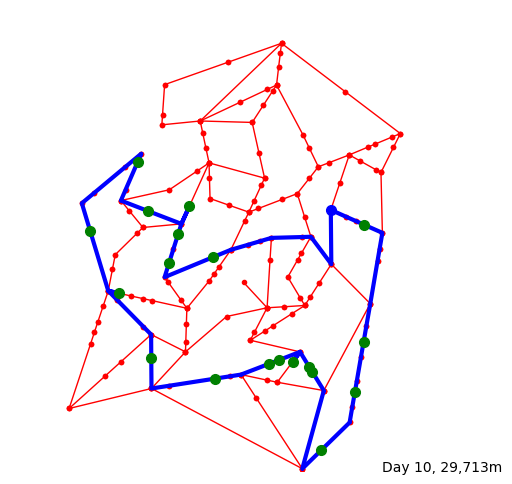

[10] 18:24:10.0 Driver leaves for delivery of 29 parcels
[10] 18:24:10.0 Driver drives to Customer: 30 (4374, 4632)
[10] 18:40:28.2 Driver arrived at Customer: 30 (4374, 4632)
[10] 18:40:40.4 Customer: 30 (4374, 4632) answers door
[10] 18:40:40.4 Customer: 30 (4374, 4632) accepts Parcel: 262
[10] 18:40:50.8 Customer: 30 (4374, 4632) signs off
[10] 18:40:51.9 Driver drives to Customer: 40 (3420, 4501)
[10] 18:46:41.1 Driver arrived at Customer: 40 (3420, 4501)
[10] 18:47:51.1 Customer: 40 (3420, 4501) answers door
[10] 18:47:51.1 Customer: 40 (3420, 4501) accepts Parcel: 244
[10] 18:47:55.2 Customer: 40 (3420, 4501) accepts Parcel: 280
[10] 18:48:26.2 Customer: 40 (3420, 4501) signs off
[10] 18:48:32.6 Driver drives to Customer: 44 (3616, 5128)
[10] 18:51:10.1 Driver arrived at Customer: 44 (3616, 5128)
[10] 18:51:11.4 Customer: 44 (3616, 5128) answers door
[10] 18:51:11.4 Customer: 44 (3616, 5128) accepts Parcel: 252
[10] 18:51:35.4 Customer: 44 (3616, 5128) accepts Parcel: 265
[10] 18

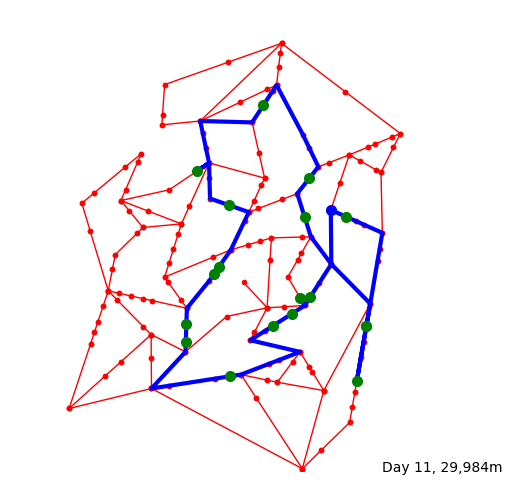

[11] 18:20:50.0 Driver leaves for delivery of 25 parcels
[11] 18:20:50.0 Driver drives to Customer: 79 (7227, 5504)
[11] 18:22:16.2 Driver arrived at Customer: 79 (7227, 5504)
[11] 18:22:41.6 Customer: 79 (7227, 5504) answers door
[11] 18:22:41.6 Customer: 79 (7227, 5504) accepts Parcel: 285
[11] 18:22:44.2 Customer: 79 (7227, 5504) accepts Parcel: 312
[11] 18:22:49.2 Customer: 79 (7227, 5504) signs off
[11] 18:22:59.6 Driver drives to Customer: 84 (7665, 3146)
[11] 18:34:33.4 Driver arrived at Customer: 84 (7665, 3146)
[11] 18:34:53.7 Customer: 84 (7665, 3146) answers door
[11] 18:34:53.7 Customer: 84 (7665, 3146) accepts Parcel: 302
[11] 18:35:02.4 Customer: 84 (7665, 3146) accepts Parcel: 306
[11] 18:35:20.4 Customer: 84 (7665, 3146) signs off
[11] 18:36:22.4 Driver drives to Customer: 41 (7458, 1945)
[11] 18:41:14.5 Driver arrived at Customer: 41 (7458, 1945)
[11] 18:42:41.0 Customer: 41 (7458, 1945) answers door
[11] 18:42:41.0 Customer: 41 (7458, 1945) accepts Parcel: 286
[11] 18

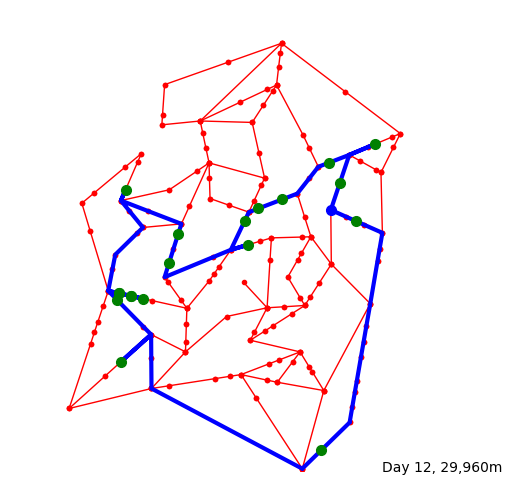

[12] 18:19:10.0 Driver leaves for delivery of 23 parcels
[12] 18:19:10.0 Driver drives to Customer:  7 (7092, 6231)
[12] 18:21:36.4 Driver arrived at Customer:  7 (7092, 6231)
[12] 18:22:22.1 Customer:  7 (7092, 6231) answers door
[12] 18:22:22.1 Customer:  7 (7092, 6231) accepts Parcel: 333
[12] 18:22:37.1 Customer:  7 (7092, 6231) signs off
[12] 18:22:44.10 Driver drives to Customer: 21 (7852, 7076)
[12] 18:27:44.0 Driver arrived at Customer: 21 (7852, 7076)
[12] 18:28:16.3 Customer: 21 (7852, 7076) answers door
[12] 18:28:16.3 Customer: 21 (7852, 7076) accepts Parcel: 297
[12] 18:28:18.2 Customer: 21 (7852, 7076) signs off
[12] 18:28:20.5 Driver drives to Customer: 16 (6857, 6672)
[12] 18:32:37.8 Driver arrived at Customer: 16 (6857, 6672)
[12] 18:32:48.1 Customer: 16 (6857, 6672) answers door
[12] 18:32:48.1 Customer: 16 (6857, 6672) accepts Parcel: 307
[12] 18:32:55.6 Customer: 16 (6857, 6672) accepts Parcel: 313
[12] 18:33:12.7 Customer: 16 (6857, 6672) signs off
[12] 18:33:17.1 

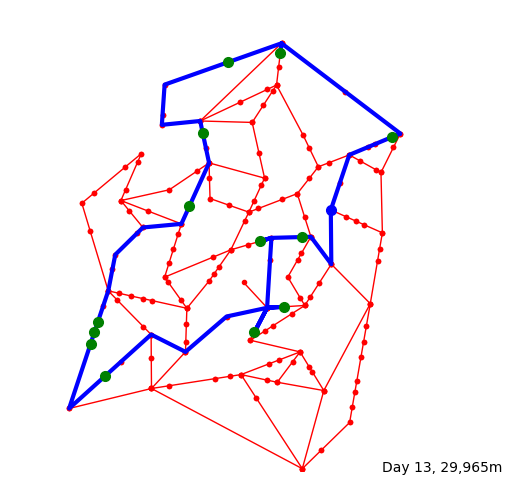

[13] 18:17:30.0 Driver leaves for delivery of 21 parcels
[13] 18:17:30.0 Driver drives to Customer: 53 (8211, 7227)
[13] 18:26:28.8 Driver arrived at Customer: 53 (8211, 7227)
[13] 18:26:55.5 Customer: 53 (8211, 7227) answers door
[13] 18:26:55.5 Customer: 53 (8211, 7227) accepts Parcel: 314
[13] 18:27:10.4 Customer: 53 (8211, 7227) signs off
[13] 18:27:36.0 Driver drives to Customer: 15 (5813, 9044)
[13] 18:42:07.2 Driver arrived at Customer: 15 (5813, 9044)
[13] 18:42:40.2 Customer: 15 (5813, 9044) answers door
[13] 18:42:40.2 Customer: 15 (5813, 9044) accepts Parcel: 338
[13] 18:42:57.8 Customer: 15 (5813, 9044) signs off
[13] 18:42:58.6 Driver drives to Customer: 24 (4686, 8847)
[13] 18:48:43.9 Driver arrived at Customer: 24 (4686, 8847)
[13] 18:50:01.6 Customer: 24 (4686, 8847) answers door
[13] 18:50:01.6 Customer: 24 (4686, 8847) accepts Parcel: 305
[13] 18:50:26.9 Customer: 24 (4686, 8847) accepts Parcel: 324
[13] 18:50:28.8 Customer: 24 (4686, 8847) accepts Parcel: 331
[13] 18

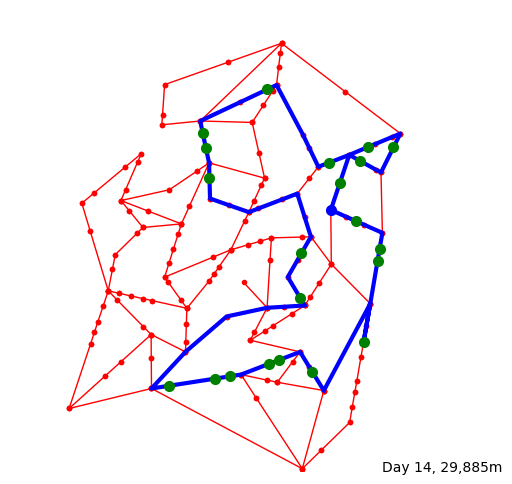

[14] 18:22:30.0 Driver leaves for delivery of 27 parcels
[14] 18:22:30.0 Driver drives to Customer: 73 (7436, 5411)
[14] 18:24:50.9 Driver arrived at Customer: 73 (7436, 5411)
[14] 18:25:01.3 Customer: 73 (7436, 5411) answers door
[14] 18:25:01.3 Customer: 73 (7436, 5411) accepts Parcel: 343
[14] 18:25:02.5 Customer: 73 (7436, 5411) signs off
[14] 18:25:04.0 Driver drives to Customer: 45 (7949, 4811)
[14] 18:28:58.0 Driver arrived at Customer: 45 (7949, 4811)
[14] 18:30:04.8 Customer: 45 (7949, 4811) answers door
[14] 18:30:04.8 Customer: 45 (7949, 4811) accepts Parcel: 385
[14] 18:30:06.3 Customer: 45 (7949, 4811) signs off
[14] 18:30:26.3 Driver drives to Customer: 20 (7904, 4546)
[14] 18:31:30.6 Driver arrived at Customer: 20 (7904, 4546)
[14] 18:32:39.9 Customer: 20 (7904, 4546) answers door
[14] 18:32:39.9 Customer: 20 (7904, 4546) accepts Parcel: 394
[14] 18:32:41.3 Customer: 20 (7904, 4546) signs off
[14] 18:32:49.5 Driver drives to Customer:  8 (7603, 2787)
[14] 18:39:57.7 Driv

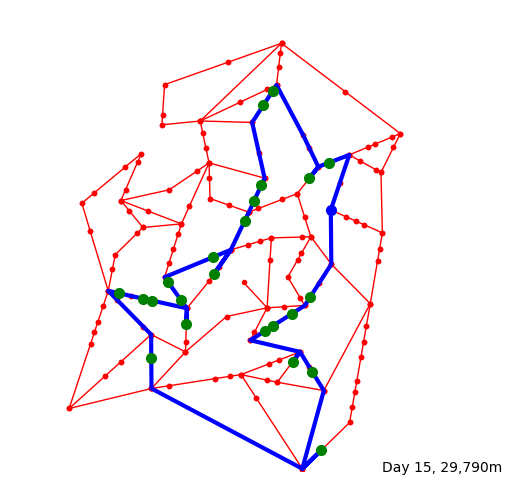

[15] 18:31:40.0 Driver leaves for delivery of 38 parcels
[15] 18:31:40.0 Driver drives to Customer: 36 (6453, 3761)
[15] 18:39:45.5 Driver arrived at Customer: 36 (6453, 3761)
[15] 18:42:15.8 Customer: 36 (6453, 3761) answers door
[15] 18:42:15.8 Customer: 36 (6453, 3761) accepts Parcel: 386
[15] 18:42:24.1 Customer: 36 (6453, 3761) signs off
[15] 18:42:33.7 Driver drives to Customer: 13 (6067, 3408)
[15] 18:44:41.9 Driver arrived at Customer: 13 (6067, 3408)
[15] 18:45:26.9 Customer: 13 (6067, 3408) answers door
[15] 18:45:26.9 Customer: 13 (6067, 3408) accepts Parcel: 357
[15] 18:45:33.9 Customer: 13 (6067, 3408) accepts Parcel: 363
[15] 18:45:40.6 Customer: 13 (6067, 3408) signs off
[15] 18:45:44.4 Driver drives to Customer: 29 (5661, 3147)
[15] 18:47:40.0 Driver arrived at Customer: 29 (5661, 3147)
[15] 18:48:26.1 Customer: 29 (5661, 3147) answers door
[15] 18:48:26.1 Customer: 29 (5661, 3147) accepts Parcel: 353
[15] 18:48:27.1 Customer: 29 (5661, 3147) accepts Parcel: 358
[15] 18

[16] 09:53:39.4 Parcel: 432 arr at delivery centre
[16] 10:08:33.1 Parcel: 433 arr at delivery centre
[16] 10:23:57.9 Parcel: 434 arr at delivery centre
[16] 10:25:41.4 Parcel: 435 arr at delivery centre
[16] 10:38:02.4 Parcel: 436 arr at delivery centre
[16] 10:44:38.4 Parcel: 437 arr at delivery centre
[16] 10:52:08.2 Parcel: 438 arr at delivery centre
[16] 11:15:21.6 Parcel: 439 arr at delivery centre
[16] 11:25:48.5 Parcel: 440 arr at delivery centre
[16] 11:58:50.7 Parcel: 441 arr at delivery centre
[16] 12:13:26.9 Parcel: 442 arr at delivery centre
[16] 12:23:12.5 Parcel: 443 arr at delivery centre
[16] 12:38:43.2 Parcel: 444 arr at delivery centre
[16] 12:45:06.7 Parcel: 445 arr at delivery centre
[16] 12:47:10.2 Parcel: 446 arr at delivery centre
[16] 13:04:57.5 Parcel: 447 arr at delivery centre
[16] 13:20:02.5 Parcel: 448 arr at delivery centre
[16] 13:44:07.9 Parcel: 449 arr at delivery centre
[16] 13:46:14.4 Parcel: 450 arr at delivery centre
[16] 14:23:52.9 Parcel: 451 arr

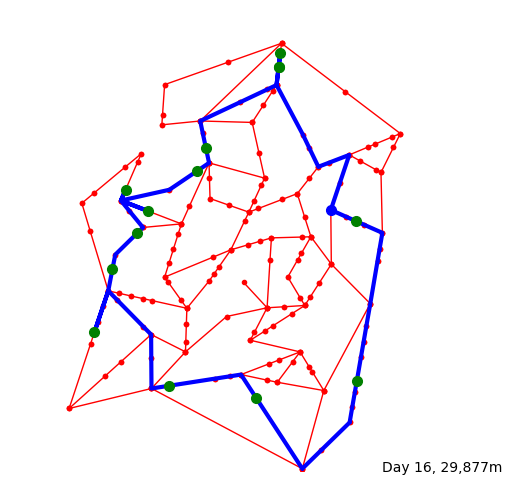

[16] 18:19:10.0 Driver leaves for delivery of 23 parcels
[16] 18:19:10.0 Driver drives to Customer: 73 (7436, 5411)
[16] 18:21:30.9 Driver arrived at Customer: 73 (7436, 5411)
[16] 18:21:51.6 Customer: 73 (7436, 5411) answers door
[16] 18:21:51.6 Customer: 73 (7436, 5411) accepts Parcel: 399
[16] 18:22:06.1 Customer: 73 (7436, 5411) accepts Parcel: 432
[16] 18:22:11.10 Customer: 73 (7436, 5411) accepts Parcel: 435
[16] 18:22:17.6 Customer: 73 (7436, 5411) signs off
[16] 18:22:20.5 Driver drives to Customer: 41 (7458, 1945)
[16] 18:37:51.7 Driver arrived at Customer: 41 (7458, 1945)
[16] 18:38:17.5 Customer: 41 (7458, 1945) answers door
[16] 18:38:17.5 Customer: 41 (7458, 1945) accepts Parcel: 381
[16] 18:38:20.1 Customer: 41 (7458, 1945) accepts Parcel: 428
[16] 18:38:23.4 Customer: 41 (7458, 1945) accepts Parcel: 439
[16] 18:38:34.0 Customer: 41 (7458, 1945) signs off
[16] 18:38:43.2 Driver drives to Customer: 60 (5300, 1573)
[16] 18:55:18.2 Driver arrived at Customer: 60 (5300, 1573)

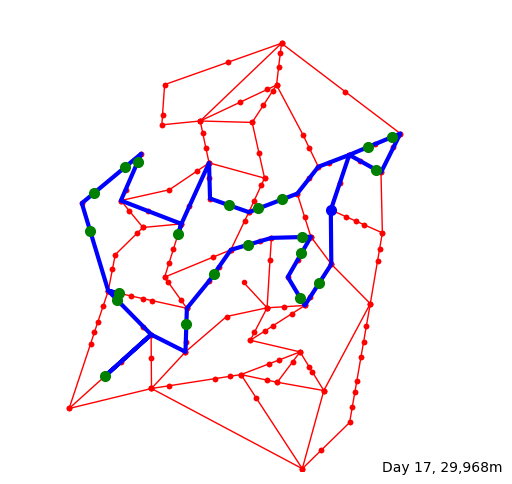

[17] 18:24:10.0 Driver leaves for delivery of 29 parcels
[17] 18:24:10.0 Driver drives to Customer: 72 (7870, 6521)
[17] 18:31:48.4 Driver arrived at Customer: 72 (7870, 6521)
[17] 18:31:50.2 Customer: 72 (7870, 6521) answers door
[17] 18:31:50.2 Customer: 72 (7870, 6521) accepts Parcel: 413
[17] 18:31:51.6 Customer: 72 (7870, 6521) accepts Parcel: 437
[17] 18:31:57.5 Customer: 72 (7870, 6521) accepts Parcel: 443
[17] 18:32:08.7 Customer: 72 (7870, 6521) accepts Parcel: 451
[17] 18:32:11.2 Customer: 72 (7870, 6521) signs off
[17] 18:32:22.8 Driver drives to Customer: 53 (8211, 7227)
[17] 18:37:25.2 Driver arrived at Customer: 53 (8211, 7227)
[17] 18:38:44.4 Customer: 53 (8211, 7227) answers door
[17] 18:38:44.4 Customer: 53 (8211, 7227) accepts Parcel: 421
[17] 18:38:58.5 Customer: 53 (8211, 7227) accepts Parcel: 438
[17] 18:39:04.1 Customer: 53 (8211, 7227) signs off
[17] 18:39:14.4 Driver drives to Customer: 58 (7707, 7015)
[17] 18:41:25.5 Driver arrived at Customer: 58 (7707, 7015)


[18] 15:25:31.6 Parcel: 508 arr at delivery centre
[18] 15:42:53.5 Parcel: 509 arr at delivery centre
[18] 16:26:03.10 Parcel: 510 arr at delivery centre
[18] 16:28:06.3 Parcel: 511 arr at delivery centre
[18] 16:28:12.10 Parcel: 512 arr at delivery centre
[18] 16:35:21.5 Parcel: 513 arr at delivery centre
[18] 16:35:44.7 Parcel: 514 arr at delivery centre
[18] 18:00:00.0 Driver arrives for work
[18] 18:00:00.0 Parcel: 480 out for delivery
[18] 18:00:00.0 Parcel: 455 out for delivery
[18] 18:00:00.0 Parcel: 482 out for delivery
[18] 18:00:00.0 Parcel: 502 out for delivery
[18] 18:00:00.0 Parcel: 496 out for delivery
[18] 18:00:00.0 Parcel: 459 out for delivery
[18] 18:00:00.0 Parcel: 460 out for delivery
[18] 18:00:00.0 Parcel: 456 out for delivery
[18] 18:00:00.0 Parcel: 458 out for delivery
[18] 18:00:00.0 Parcel: 476 out for delivery
[18] 18:00:00.0 Parcel: 509 out for delivery
[18] 18:00:00.0 Parcel: 446 out for delivery
[18] 18:00:00.0 Parcel: 452 out for delivery
[18] 18:00:00.0 

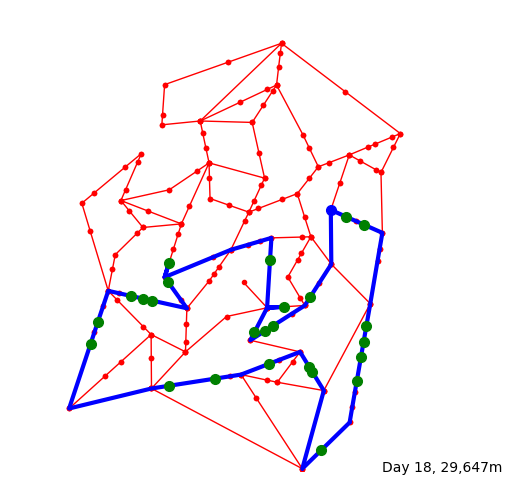

[18] 18:27:30.0 Driver leaves for delivery of 33 parcels
[18] 18:27:30.0 Driver drives to Customer: 79 (7227, 5504)
[18] 18:28:56.2 Driver arrived at Customer: 79 (7227, 5504)
[18] 18:29:02.9 Customer: 79 (7227, 5504) answers door
[18] 18:29:02.9 Customer: 79 (7227, 5504) accepts Parcel: 480
[18] 18:29:12.7 Customer: 79 (7227, 5504) signs off
[18] 18:29:21.0 Driver drives to Customer: 93 (7622, 5327)
[18] 18:31:04.7 Driver arrived at Customer: 93 (7622, 5327)
[18] 18:31:07.3 Customer: 93 (7622, 5327) answers door
[18] 18:31:07.3 Customer: 93 (7622, 5327) accepts Parcel: 455
[18] 18:31:57.0 Customer: 93 (7622, 5327) signs off
[18] 18:32:03.6 Driver drives to Customer: 84 (7665, 3146)
[18] 18:41:53.7 Driver arrived at Customer: 84 (7665, 3146)
[18] 18:42:09.1 Customer: 84 (7665, 3146) answers door
[18] 18:42:09.1 Customer: 84 (7665, 3146) accepts Parcel: 482
[18] 18:42:22.2 Customer: 84 (7665, 3146) accepts Parcel: 502
[18] 18:42:22.4 Customer: 84 (7665, 3146) signs off
[18] 18:42:28.1 D

[19] 09:48:08.2 Parcel: 521 arr at delivery centre
[19] 10:40:47.9 Parcel: 522 arr at delivery centre
[19] 10:47:46.3 Parcel: 523 arr at delivery centre
[19] 10:57:42.8 Parcel: 524 arr at delivery centre
[19] 11:03:04.8 Parcel: 525 arr at delivery centre
[19] 11:45:58.3 Parcel: 526 arr at delivery centre
[19] 12:35:10.4 Parcel: 527 arr at delivery centre
[19] 12:50:50.2 Parcel: 528 arr at delivery centre
[19] 12:53:59.4 Parcel: 529 arr at delivery centre
[19] 14:10:48.5 Parcel: 530 arr at delivery centre
[19] 14:12:29.2 Parcel: 531 arr at delivery centre
[19] 14:25:57.10 Parcel: 532 arr at delivery centre
[19] 14:28:36.2 Parcel: 533 arr at delivery centre
[19] 15:03:56.7 Parcel: 534 arr at delivery centre
[19] 15:49:06.2 Parcel: 535 arr at delivery centre
[19] 16:14:23.9 Parcel: 536 arr at delivery centre
[19] 16:20:16.10 Parcel: 537 arr at delivery centre
[19] 16:24:35.8 Parcel: 538 arr at delivery centre
[19] 16:46:23.6 Parcel: 539 arr at delivery centre
[19] 16:51:43.6 Parcel: 540 a

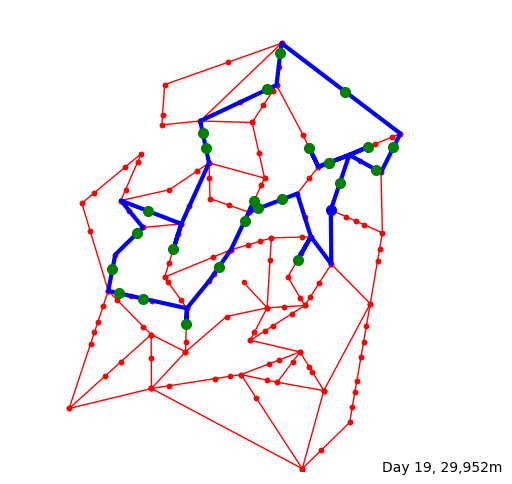

[19] 18:28:20.0 Driver leaves for delivery of 34 parcels
[19] 18:28:20.0 Driver drives to Customer: 62 (6189, 4576)
[19] 18:38:15.2 Driver arrived at Customer: 62 (6189, 4576)
[19] 18:38:18.6 Customer: 62 (6189, 4576) answers door
[19] 18:38:18.6 Customer: 62 (6189, 4576) accepts Parcel: 483
[19] 18:38:57.4 Customer: 62 (6189, 4576) signs off
[19] 18:39:54.5 Driver drives to Customer:  0 (5854, 5879)
[19] 18:47:28.9 Driver arrived at Customer:  0 (5854, 5879)
[19] 18:47:36.5 Customer:  0 (5854, 5879) answers door
[19] 18:47:36.5 Customer:  0 (5854, 5879) accepts Parcel: 495
[19] 18:47:39.3 Customer:  0 (5854, 5879) signs off
[19] 18:47:45.0 Driver drives to Customer:  2 (5342, 5682)
[19] 18:49:56.5 Driver arrived at Customer:  2 (5342, 5682)
[19] 18:50:44.5 Customer:  2 (5342, 5682) answers door
[19] 18:50:44.5 Customer:  2 (5342, 5682) accepts Parcel: 501
[19] 18:50:44.9 Customer:  2 (5342, 5682) accepts Parcel: 539
[19] 18:51:02.9 Customer:  2 (5342, 5682) signs off
[19] 18:51:13.1 D

[20] 08:45:21.1 Parcel: 550 arr at delivery centre
[20] 08:53:51.3 Parcel: 551 arr at delivery centre
[20] 09:09:33.8 Parcel: 552 arr at delivery centre
[20] 09:10:55.10 Parcel: 553 arr at delivery centre
[20] 09:20:03.4 Parcel: 554 arr at delivery centre
[20] 09:27:12.1 Parcel: 555 arr at delivery centre
[20] 10:13:19.1 Parcel: 556 arr at delivery centre
[20] 10:14:14.5 Parcel: 557 arr at delivery centre
[20] 10:22:23.1 Parcel: 558 arr at delivery centre
[20] 10:30:45.4 Parcel: 559 arr at delivery centre
[20] 10:50:57.1 Parcel: 560 arr at delivery centre
[20] 10:56:56.8 Parcel: 561 arr at delivery centre
[20] 11:00:28.10 Parcel: 562 arr at delivery centre
[20] 11:05:51.9 Parcel: 563 arr at delivery centre
[20] 11:15:43.10 Parcel: 564 arr at delivery centre
[20] 12:02:15.6 Parcel: 565 arr at delivery centre
[20] 12:26:56.6 Parcel: 566 arr at delivery centre
[20] 12:31:58.3 Parcel: 567 arr at delivery centre
[20] 12:44:38.1 Parcel: 568 arr at delivery centre
[20] 18:00:00.0 Driver arriv

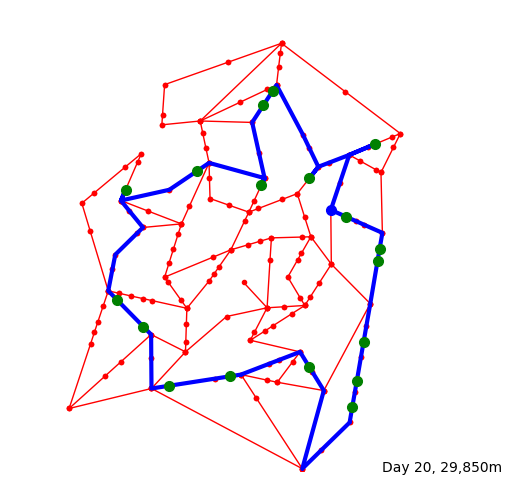

[20] 18:21:40.0 Driver leaves for delivery of 26 parcels
[20] 18:21:40.0 Driver drives to Customer: 21 (7852, 7076)
[20] 18:29:05.4 Driver arrived at Customer: 21 (7852, 7076)
[20] 18:29:35.9 Customer: 21 (7852, 7076) answers door
[20] 18:29:35.9 Customer: 21 (7852, 7076) accepts Parcel: 506
[20] 18:29:42.7 Customer: 21 (7852, 7076) accepts Parcel: 540
[20] 18:29:44.1 Customer: 21 (7852, 7076) signs off
[20] 18:29:44.10 Driver drives to Customer:  9 (6438, 6337)
[20] 18:36:15.7 Driver arrived at Customer:  9 (6438, 6337)
[20] 18:36:16.2 Customer:  9 (6438, 6337) answers door
[20] 18:36:16.2 Customer:  9 (6438, 6337) accepts Parcel: 508
[20] 18:36:33.6 Customer:  9 (6438, 6337) signs off
[20] 18:36:34.4 Driver drives to Customer: 42 (5648, 8224)
[20] 18:46:22.7 Driver arrived at Customer: 42 (5648, 8224)
[20] 18:48:33.0 Customer: 42 (5648, 8224) answers door
[20] 18:48:33.0 Customer: 42 (5648, 8224) accepts Parcel: 507
[20] 18:49:14.3 Customer: 42 (5648, 8224) signs off
[20] 18:49:27.10

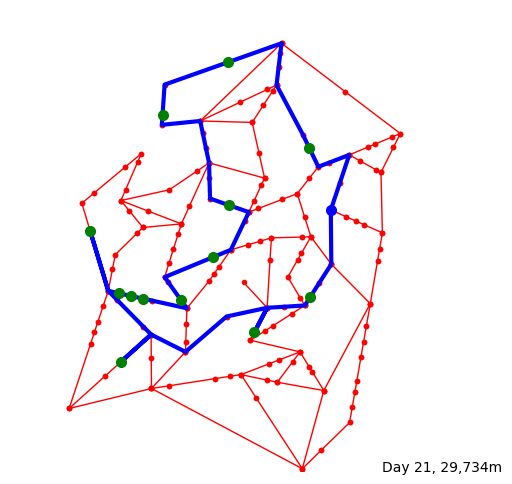

[21] 18:13:20.0 Driver leaves for delivery of 16 parcels
[21] 18:13:20.0 Driver drives to Customer: 36 (6453, 3761)
[21] 18:21:25.5 Driver arrived at Customer: 36 (6453, 3761)
[21] 18:21:54.0 Customer: 36 (6453, 3761) answers door
[21] 18:21:54.0 Customer: 36 (6453, 3761) accepts Parcel: 558
[21] 18:22:10.5 Customer: 36 (6453, 3761) signs off
[21] 18:22:17.8 Driver drives to Customer: 37 (5254, 2998)
[21] 18:28:47.1 Driver arrived at Customer: 37 (5254, 2998)
[21] 18:30:19.2 Customer: 37 (5254, 2998) answers door
[21] 18:30:19.2 Customer: 37 (5254, 2998) accepts Parcel: 532
[21] 18:30:34.2 Customer: 37 (5254, 2998) signs off
[21] 18:30:41.3 Driver drives to Customer: 18 (2383, 2362)
[21] 18:48:09.9 Driver arrived at Customer: 18 (2383, 2362)
[21] 18:49:19.9 Customer: 18 (2383, 2362) answers door
[21] 18:49:19.9 Customer: 18 (2383, 2362) accepts Parcel: 541
[21] 18:49:26.3 Customer: 18 (2383, 2362) signs off
[21] 18:49:30.5 Driver drives to Customer: 83 (1723, 5199)
[21] 19:03:43.10 Dri

In [116]:
random.seed(0)
recP6 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [117]:
standardMeasureConverter(recP6.daily)

### Simulation Records

In [118]:
recP6.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,74213,29.829,156.883333,13,NaN
1,151200,160717,29.885,158.616667,28,1.110596
2,237600,246896,29.958,154.933333,34,0.577341
3,324000,333861,29.991,164.35,33,0.935387
4,410400,421303,29.947,181.716667,28,1.62086
5,496800,507595,29.871,179.916667,19,1.764268
6,583200,594223,29.926,183.716667,21,1.343998
7,669600,680575,29.824,182.916667,18,1.364241
8,756000,765328,29.693,155.466667,20,0.990861
9,842400,852567,29.424,169.45,8,1.879733


### Time Plot

In [119]:
np.mean(recP6.daily['Working Time (in minutes)'])

170.73712121212125

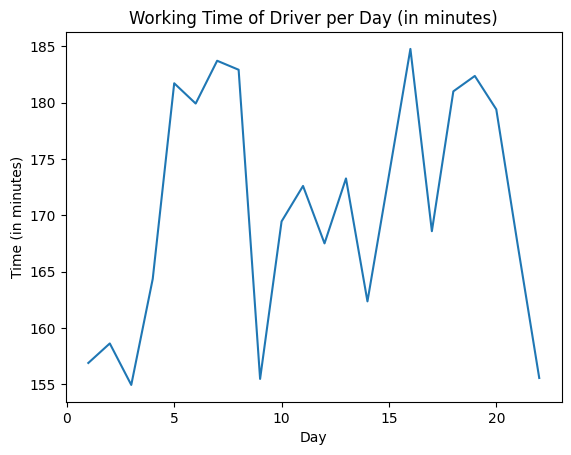

In [120]:
timePlot = plt.plot(recP6.daily.index +1 ,recP6.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [121]:
np.mean(recP6.daily['Delivery Route Distance(in km)'])

29.848772727272728

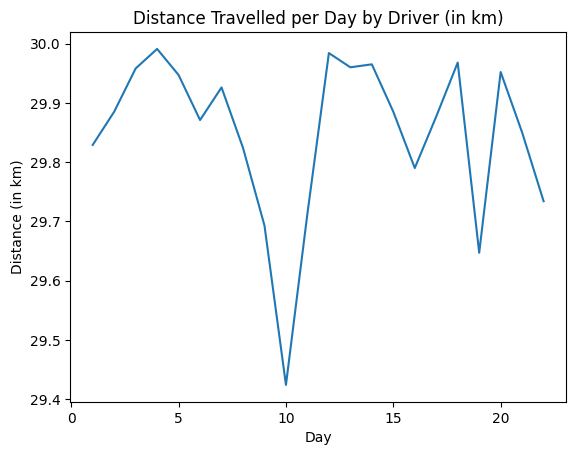

In [122]:
distancePlot = plt.plot(recP6.daily.index +1 ,recP6.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [123]:
np.mean(recP6.daily['Number of left over parcels'])

24.181818181818183

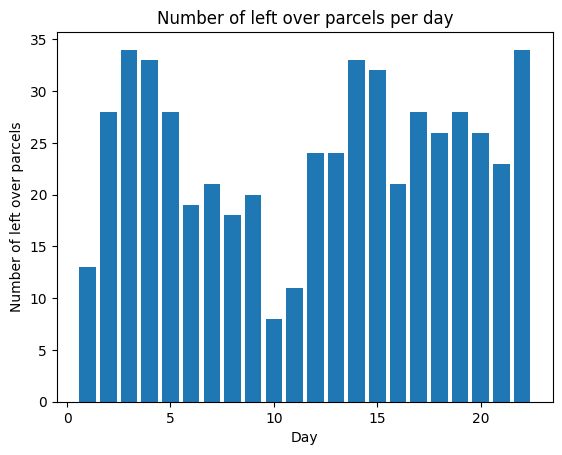

In [124]:
leftOverPlot = plt.bar(recP6.daily.index +1 ,recP6.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [125]:
np.mean(recP6.daily['Delay Time(in days)'])

1.2415935119820565

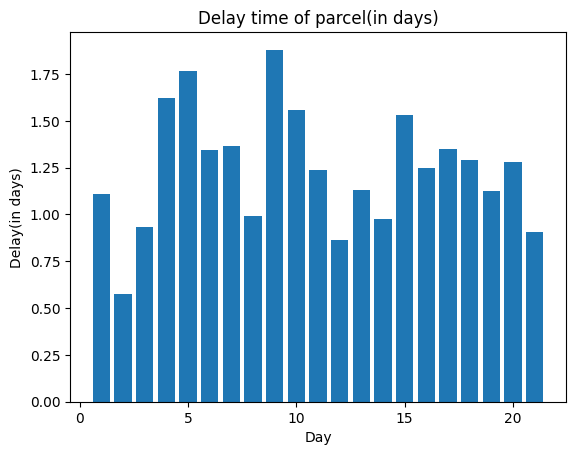

In [126]:
delayPlot = plt.bar(recP6.daily.index ,recP6.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

Range 35Km

In [127]:
RANGE = 35000

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 594 deliveries over 22 days.


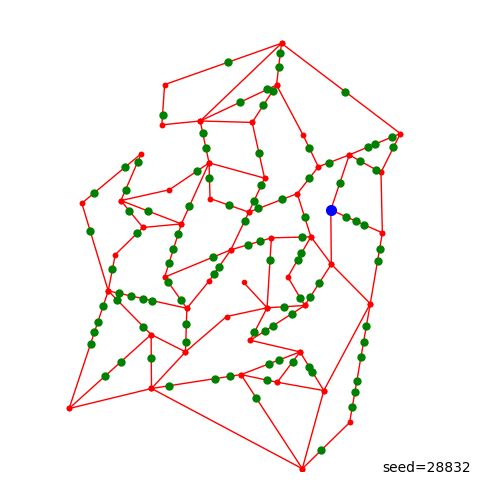

In [128]:
data = generateData(28832, p = 6, plot=True, log=True)

## Storing generated data into the pickle file

In [129]:
with open('dataSeed28832P6R35.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [130]:
with open('dataSeed28832P6R35.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 596 parcels over 22 days to 100 customers
[ 0] 08:28:50.7 Parcel:  0 arr at delivery centre
[ 0] 08:50:50.3 Parcel:  1 arr at delivery centre
[ 0] 08:59:17.9 Parcel:  2 arr at delivery centre
[ 0] 09:03:56.6 Parcel:  3 arr at delivery centre
[ 0] 09:15:02.6 Parcel:  4 arr at delivery centre
[ 0] 09:23:05.5 Parcel:  5 arr at delivery centre
[ 0] 09:46:50.1 Parcel:  6 arr at delivery centre
[ 0] 09:52:26.3 Parcel:  7 arr at delivery centre
[ 0] 10:02:28.5 Parcel:  8 arr at delivery centre
[ 0] 10:16:02.10 Parcel:  9 arr at delivery centre
[ 0] 10:53:03.6 Parcel: 10 arr at delivery centre
[ 0] 11:03:57.1 Parcel: 11 arr at delivery centre
[ 0] 11:09:05.1 Parcel: 12 arr at delivery centre
[ 0] 11:30:56.5 Parcel: 13 arr at delivery centre
[ 0] 11:45:52.6 Parcel: 14 arr at delivery centre
[ 0] 11:50:20.8 Parcel: 15 arr at delivery centre
[ 0] 12:27:38.1 Parcel: 16 arr at delivery centre
[ 0] 13:30:36.6 Parcel: 17 arr at delivery centre
[ 0] 13:56:22.5 Parcel: 18 arr at 

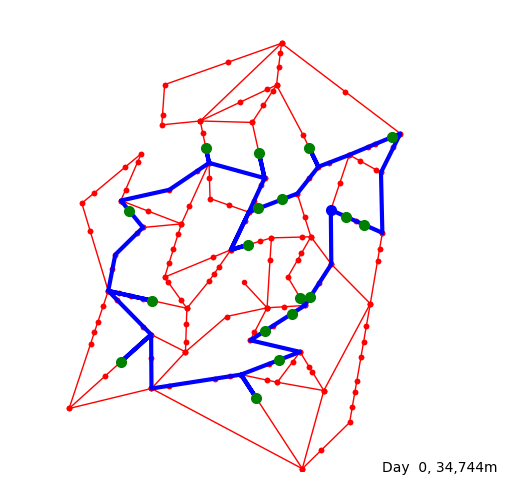

[ 0] 18:07:27.4 Parcel: 30 arr at delivery centre
[ 0] 18:17:30.0 Driver leaves for delivery of 21 parcels
[ 0] 18:17:30.0 Driver drives to Customer: 36 (6453, 3761)
[ 0] 18:25:35.5 Driver arrived at Customer: 36 (6453, 3761)
[ 0] 18:25:46.1 Customer: 36 (6453, 3761) answers door
[ 0] 18:25:46.1 Customer: 36 (6453, 3761) accepts Parcel:  1
[ 0] 18:26:00.5 Customer: 36 (6453, 3761) signs off
[ 0] 18:26:03.7 Driver drives to Customer: 56 (6245, 3741)
[ 0] 18:27:38.3 Driver arrived at Customer: 56 (6245, 3741)
[ 0] 18:30:23.7 Customer: 56 (6245, 3741) answers door
[ 0] 18:30:23.7 Customer: 56 (6245, 3741) accepts Parcel:  4
[ 0] 18:30:25.0 Customer: 56 (6245, 3741) signs off
[ 0] 18:30:46.5 Driver drives to Customer: 13 (6067, 3408)
[ 0] 18:32:48.5 Driver arrived at Customer: 13 (6067, 3408)
[ 0] 18:32:50.1 Customer: 13 (6067, 3408) answers door
[ 0] 18:32:50.1 Customer: 13 (6067, 3408) accepts Parcel: 26
[ 0] 18:32:53.1 Customer: 13 (6067, 3408) signs off
[ 0] 18:33:00.6 Driver drives to

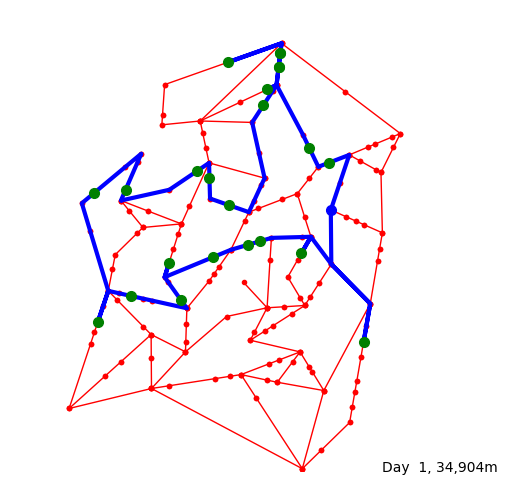

[ 1] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 1] 18:21:40.0 Driver drives to Customer: 16 (6857, 6672)
[ 1] 18:28:33.8 Driver arrived at Customer: 16 (6857, 6672)
[ 1] 18:28:34.8 Customer: 16 (6857, 6672) answers door
[ 1] 18:28:34.8 Customer: 16 (6857, 6672) accepts Parcel: 62
[ 1] 18:28:41.2 Customer: 16 (6857, 6672) signs off
[ 1] 18:29:03.1 Driver drives to Customer:  3 (6435, 6994)
[ 1] 18:31:49.9 Driver arrived at Customer:  3 (6435, 6994)
[ 1] 18:31:50.3 Customer:  3 (6435, 6994) answers door
[ 1] 18:31:50.3 Customer:  3 (6435, 6994) accepts Parcel: 54
[ 1] 18:31:57.8 Customer:  3 (6435, 6994) signs off
[ 1] 18:31:58.5 Driver drives to Customer: 19 (5778, 8751)
[ 1] 18:39:41.5 Driver arrived at Customer: 19 (5778, 8751)
[ 1] 18:41:02.2 Customer: 19 (5778, 8751) answers door
[ 1] 18:41:02.2 Customer: 19 (5778, 8751) accepts Parcel: 15
[ 1] 18:41:13.8 Customer: 19 (5778, 8751) signs off
[ 1] 18:41:27.3 Driver drives to Customer: 15 (5813, 9044)
[ 1] 18:42:38.1 Driver 

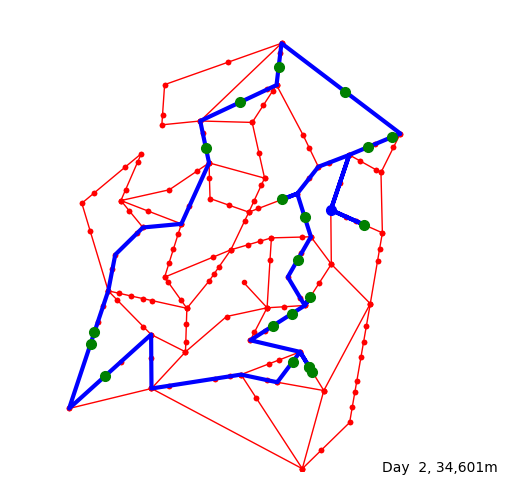

[ 2] 18:24:10.0 Driver leaves for delivery of 29 parcels
[ 2] 18:24:10.0 Driver drives to Customer: 93 (7622, 5327)
[ 2] 18:27:19.8 Driver arrived at Customer: 93 (7622, 5327)
[ 2] 18:27:25.9 Customer: 93 (7622, 5327) answers door
[ 2] 18:27:25.9 Customer: 93 (7622, 5327) accepts Parcel: 48
[ 2] 18:27:41.3 Customer: 93 (7622, 5327) accepts Parcel: 76
[ 2] 18:27:52.8 Customer: 93 (7622, 5327) signs off
[ 2] 18:28:28.0 Driver drives to Customer: 58 (7707, 7015)
[ 2] 18:38:25.6 Driver arrived at Customer: 58 (7707, 7015)
[ 2] 18:38:45.8 Customer: 58 (7707, 7015) answers door
[ 2] 18:38:45.8 Customer: 58 (7707, 7015) accepts Parcel: 56
[ 2] 18:39:11.3 Customer: 58 (7707, 7015) signs off
[ 2] 18:39:17.3 Driver drives to Customer: 53 (8211, 7227)
[ 2] 18:41:28.4 Driver arrived at Customer: 53 (8211, 7227)
[ 2] 18:41:44.10 Customer: 53 (8211, 7227) answers door
[ 2] 18:41:44.10 Customer: 53 (8211, 7227) accepts Parcel: 50
[ 2] 18:41:46.0 Customer: 53 (8211, 7227) signs off
[ 2] 18:42:07.5 Dri

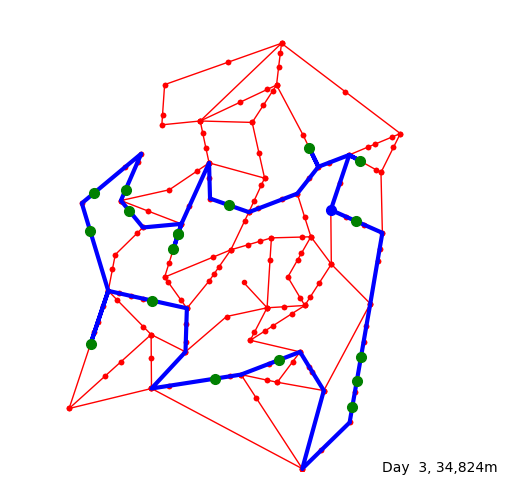

[ 3] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 3] 18:21:40.0 Driver drives to Customer: 22 (7528, 6712)
[ 3] 18:27:44.6 Driver arrived at Customer: 22 (7528, 6712)
[ 3] 18:28:37.4 Customer: 22 (7528, 6712) answers door
[ 3] 18:28:37.4 Customer: 22 (7528, 6712) accepts Parcel: 75
[ 3] 18:28:40.2 Customer: 22 (7528, 6712) accepts Parcel: 103
[ 3] 18:28:43.6 Customer: 22 (7528, 6712) signs off
[ 3] 18:28:56.9 Driver drives to Customer:  3 (6435, 6994)
[ 3] 18:34:40.1 Driver arrived at Customer:  3 (6435, 6994)
[ 3] 18:35:23.2 Customer:  3 (6435, 6994) answers door
[ 3] 18:35:23.2 Customer:  3 (6435, 6994) accepts Parcel: 88
[ 3] 18:35:36.7 Customer:  3 (6435, 6994) signs off
[ 3] 18:35:43.10 Driver drives to Customer: 66 (4715, 5751)
[ 3] 18:46:43.10 Driver arrived at Customer: 66 (4715, 5751)
[ 3] 18:48:02.4 Customer: 66 (4715, 5751) answers door
[ 3] 18:48:02.4 Customer: 66 (4715, 5751) accepts Parcel: 73
[ 3] 18:48:03.7 Customer: 66 (4715, 5751) signs off
[ 3] 18:48:14.0 Dr

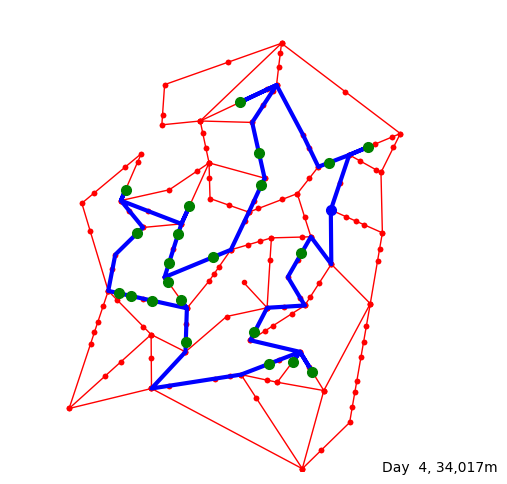

[ 4] 18:24:10.0 Driver leaves for delivery of 29 parcels
[ 4] 18:24:10.0 Driver drives to Customer: 58 (7707, 7015)
[ 4] 18:30:57.8 Driver arrived at Customer: 58 (7707, 7015)
[ 4] 18:31:09.8 Customer: 58 (7707, 7015) answers door
[ 4] 18:31:09.8 Customer: 58 (7707, 7015) accepts Parcel: 95
[ 4] 18:31:19.0 Customer: 58 (7707, 7015) signs off
[ 4] 18:31:31.2 Driver drives to Customer: 16 (6857, 6672)
[ 4] 18:35:10.8 Driver arrived at Customer: 16 (6857, 6672)
[ 4] 18:36:19.8 Customer: 16 (6857, 6672) answers door
[ 4] 18:36:19.8 Customer: 16 (6857, 6672) accepts Parcel: 133
[ 4] 18:36:35.1 Customer: 16 (6857, 6672) signs off
[ 4] 18:36:39.10 Driver drives to Customer: 11 (4938, 7977)
[ 4] 18:49:04.7 Driver arrived at Customer: 11 (4938, 7977)
[ 4] 18:49:07.1 Customer: 11 (4938, 7977) answers door
[ 4] 18:49:07.1 Customer: 11 (4938, 7977) accepts Parcel: 92
[ 4] 18:49:07.5 Customer: 11 (4938, 7977) accepts Parcel: 117
[ 4] 18:49:20.5 Customer: 11 (4938, 7977) accepts Parcel: 123
[ 4] 18:

[ 5] 14:10:16.8 Parcel: 158 arr at delivery centre
[ 5] 14:13:15.5 Parcel: 159 arr at delivery centre
[ 5] 14:23:08.9 Parcel: 160 arr at delivery centre
[ 5] 18:00:00.0 Driver arrives for work
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 126 out for delivery
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 148 out for delivery
[ 5] 18:00:00.0 Parcel: 132 out for delivery
[ 5] 18:00:00.0 Parcel: 137 out for delivery
[ 5] 18:00:00.0 Parcel: 129 out for delivery
[ 5] 18:00:00.0 Parcel: 151 out for delivery
[ 5] 18:00:00.0 Parcel: 140 out for delivery
[ 5] 18:00:00.0 Parcel: 153 out for delivery
[ 5] 18:00:00.0 Parcel: 134 out for delivery
[ 5] 18:00:00.0 Parcel: 115 out for delivery
[ 5] 18:00:00.0 Parcel: 147 out for delivery
[ 5] 18:00:00.0 Parcel: 156 out for delivery
[ 5] 18:00:00.0 Parcel: 122 out for delivery
[ 5] 18:00:00.0 Parcel: 155 out for delivery
[ 5] 18:00:00.0 Parcel: 139 out for delivery
[ 5] 18:00:00.0 Parcel: 135 out for delive

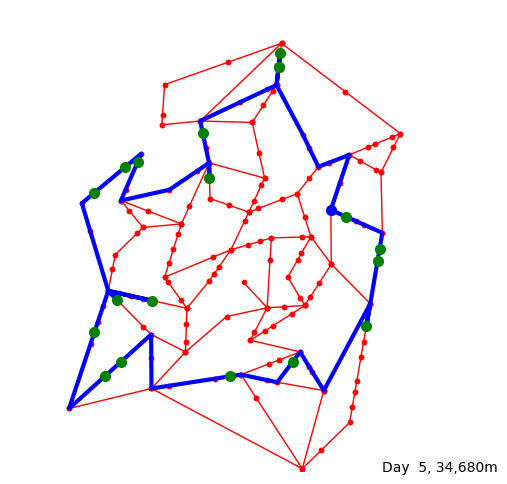

[ 5] 18:19:10.0 Driver leaves for delivery of 23 parcels
[ 5] 18:19:10.0 Driver drives to Customer: 19 (5778, 8751)
[ 5] 18:36:33.5 Driver arrived at Customer: 19 (5778, 8751)
[ 5] 18:36:45.2 Customer: 19 (5778, 8751) answers door
[ 5] 18:36:45.2 Customer: 19 (5778, 8751) accepts Parcel: 141
[ 5] 18:37:01.6 Customer: 19 (5778, 8751) signs off
[ 5] 18:37:14.7 Driver drives to Customer: 15 (5813, 9044)
[ 5] 18:38:25.5 Driver arrived at Customer: 15 (5813, 9044)
[ 5] 18:38:26.7 Customer: 15 (5813, 9044) answers door
[ 5] 18:38:26.7 Customer: 15 (5813, 9044) accepts Parcel: 126
[ 5] 18:38:53.6 Customer: 15 (5813, 9044) signs off
[ 5] 18:38:53.10 Driver drives to Customer: 19 (5778, 8751)
[ 5] 18:40:04.8 Driver arrived at Customer: 19 (5778, 8751)
[ 5] 18:40:08.5 Customer: 19 (5778, 8751) answers door
[ 5] 18:40:08.5 Customer: 19 (5778, 8751) accepts Parcel: 141
[ 5] 18:40:11.10 Customer: 19 (5778, 8751) signs off
[ 5] 18:40:13.6 Driver drives to Customer: 17 (4144, 7319)
[ 5] 18:50:07.9 Dr

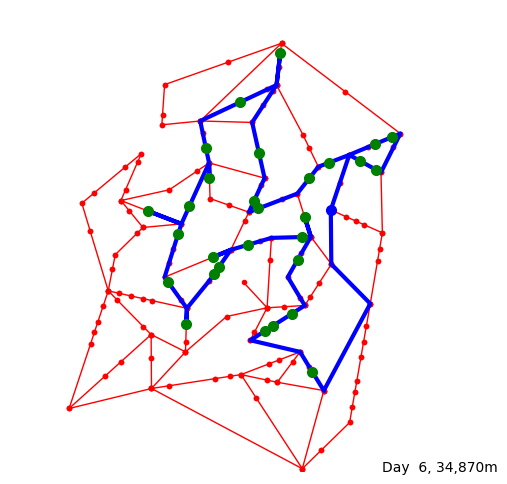

[ 6] 18:30:50.0 Driver leaves for delivery of 37 parcels
[ 6] 18:30:50.0 Driver drives to Customer: 22 (7528, 6712)
[ 6] 18:36:54.6 Driver arrived at Customer: 22 (7528, 6712)
[ 6] 18:37:55.6 Customer: 22 (7528, 6712) answers door
[ 6] 18:37:55.6 Customer: 22 (7528, 6712) accepts Parcel: 152
[ 6] 18:38:04.8 Customer: 22 (7528, 6712) signs off
[ 6] 18:38:48.6 Driver drives to Customer: 72 (7870, 6521)
[ 6] 18:40:22.5 Driver arrived at Customer: 72 (7870, 6521)
[ 6] 18:40:22.5 Customer: 72 (7870, 6521) answers door
[ 6] 18:40:22.5 Customer: 72 (7870, 6521) accepts Parcel: 144
[ 6] 18:40:24.0 Customer: 72 (7870, 6521) signs off
[ 6] 18:40:24.5 Driver drives to Customer: 53 (8211, 7227)
[ 6] 18:45:26.9 Driver arrived at Customer: 53 (8211, 7227)
[ 6] 18:45:32.2 Customer: 53 (8211, 7227) answers door
[ 6] 18:45:32.2 Customer: 53 (8211, 7227) accepts Parcel: 145
[ 6] 18:45:58.7 Customer: 53 (8211, 7227) signs off
[ 6] 18:46:28.4 Driver drives to Customer: 21 (7852, 7076)
[ 6] 18:48:01.8 Driv

[ 7] 08:45:18.8 Parcel: 193 arr at delivery centre
[ 7] 08:53:36.6 Parcel: 194 arr at delivery centre
[ 7] 09:01:35.3 Parcel: 195 arr at delivery centre
[ 7] 09:20:20.9 Parcel: 196 arr at delivery centre
[ 7] 09:28:44.8 Parcel: 197 arr at delivery centre
[ 7] 09:45:34.3 Parcel: 198 arr at delivery centre
[ 7] 09:46:18.9 Parcel: 199 arr at delivery centre
[ 7] 09:55:27.2 Parcel: 200 arr at delivery centre
[ 7] 10:00:06.3 Parcel: 201 arr at delivery centre
[ 7] 10:02:45.9 Parcel: 202 arr at delivery centre
[ 7] 10:14:23.4 Parcel: 203 arr at delivery centre
[ 7] 10:24:44.8 Parcel: 204 arr at delivery centre
[ 7] 10:37:31.5 Parcel: 205 arr at delivery centre
[ 7] 10:59:21.7 Parcel: 206 arr at delivery centre
[ 7] 11:32:44.5 Parcel: 207 arr at delivery centre
[ 7] 11:43:19.2 Parcel: 208 arr at delivery centre
[ 7] 11:49:07.1 Parcel: 209 arr at delivery centre
[ 7] 11:58:52.2 Parcel: 210 arr at delivery centre
[ 7] 12:24:32.4 Parcel: 211 arr at delivery centre
[ 7] 12:56:46.8 Parcel: 212 arr

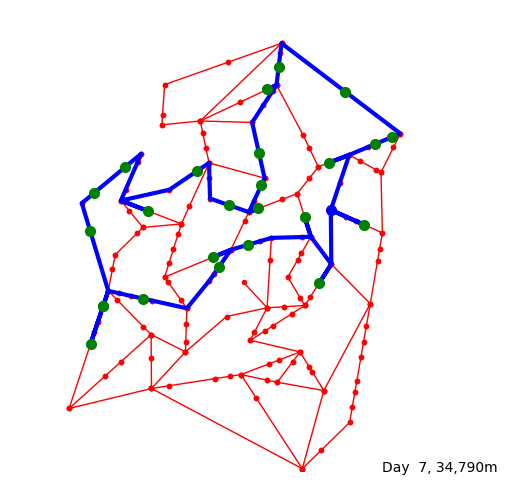

[ 7] 18:25:50.0 Driver leaves for delivery of 31 parcels
[ 7] 18:25:50.0 Driver drives to Customer: 16 (6857, 6672)
[ 7] 18:32:43.8 Driver arrived at Customer: 16 (6857, 6672)
[ 7] 18:32:49.2 Customer: 16 (6857, 6672) answers door
[ 7] 18:32:49.2 Customer: 16 (6857, 6672) accepts Parcel: 201
[ 7] 18:33:01.6 Customer: 16 (6857, 6672) accepts Parcel: 211
[ 7] 18:33:05.6 Customer: 16 (6857, 6672) accepts Parcel: 213
[ 7] 18:33:05.8 Customer: 16 (6857, 6672) signs off
[ 7] 18:33:12.2 Driver drives to Customer: 21 (7852, 7076)
[ 7] 18:37:29.5 Driver arrived at Customer: 21 (7852, 7076)
[ 7] 18:37:59.0 Customer: 21 (7852, 7076) answers door
[ 7] 18:37:59.0 Customer: 21 (7852, 7076) accepts Parcel: 210
[ 7] 18:37:59.4 Customer: 21 (7852, 7076) accepts Parcel: 219
[ 7] 18:38:07.8 Customer: 21 (7852, 7076) signs off
[ 7] 18:38:12.0 Driver drives to Customer: 53 (8211, 7227)
[ 7] 18:39:45.4 Driver arrived at Customer: 53 (8211, 7227)
[ 7] 18:39:45.6 Customer: 53 (8211, 7227) answers door
[ 7] 18

[ 8] 09:28:52.3 Parcel: 229 arr at delivery centre
[ 8] 09:45:06.9 Parcel: 230 arr at delivery centre
[ 8] 10:17:11.2 Parcel: 231 arr at delivery centre
[ 8] 10:22:16.8 Parcel: 232 arr at delivery centre
[ 8] 11:21:49.2 Parcel: 233 arr at delivery centre
[ 8] 11:23:27.4 Parcel: 234 arr at delivery centre
[ 8] 11:53:16.9 Parcel: 235 arr at delivery centre
[ 8] 12:01:06.10 Parcel: 236 arr at delivery centre
[ 8] 12:02:25.9 Parcel: 237 arr at delivery centre
[ 8] 12:07:24.7 Parcel: 238 arr at delivery centre
[ 8] 18:00:00.0 Driver arrives for work
[ 8] 18:00:00.0 Parcel: 234 out for delivery
[ 8] 18:00:00.0 Parcel: 203 out for delivery
[ 8] 18:00:00.0 Parcel: 199 out for delivery
[ 8] 18:00:00.0 Parcel: 229 out for delivery
[ 8] 18:00:00.0 Parcel: 212 out for delivery
[ 8] 18:00:00.0 Parcel: 229 out for delivery
[ 8] 18:00:00.0 Parcel: 230 out for delivery
[ 8] 18:00:00.0 Parcel: 232 out for delivery
[ 8] 18:00:00.0 Parcel: 223 out for delivery
[ 8] 18:00:00.0 Parcel: 232 out for delivery

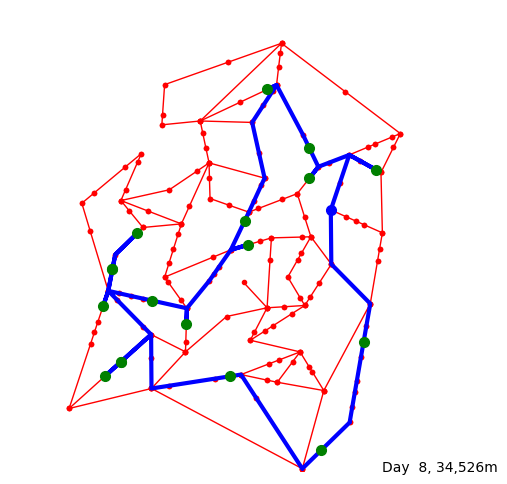

[ 8] 18:15:50.0 Driver leaves for delivery of 19 parcels
[ 8] 18:15:50.0 Driver drives to Customer:  8 (7603, 2787)
[ 8] 18:28:42.6 Driver arrived at Customer:  8 (7603, 2787)
[ 8] 18:30:01.6 Customer:  8 (7603, 2787) answers door
[ 8] 18:30:01.6 Customer:  8 (7603, 2787) accepts Parcel: 234
[ 8] 18:30:02.9 Customer:  8 (7603, 2787) signs off
[ 8] 18:30:06.7 Driver drives to Customer: 95 (6687, 444)
[ 8] 18:40:36.2 Driver arrived at Customer: 95 (6687, 444)
[ 8] 18:40:37.1 Customer: 95 (6687, 444) answers door
[ 8] 18:40:37.1 Customer: 95 (6687, 444) accepts Parcel: 203
[ 8] 18:40:50.4 Customer: 95 (6687, 444) signs off
[ 8] 18:40:50.6 Driver drives to Customer: 74 (4721, 2048)
[ 8] 18:53:47.4 Driver arrived at Customer: 74 (4721, 2048)
[ 8] 18:55:14.3 Customer: 74 (4721, 2048) answers door
[ 8] 18:55:14.3 Customer: 74 (4721, 2048) accepts Parcel: 199
[ 8] 18:55:16.4 Customer: 74 (4721, 2048) signs off
[ 8] 18:55:21.8 Driver drives to Customer: 18 (2383, 2362)
[ 8] 19:10:20.3 Driver ar

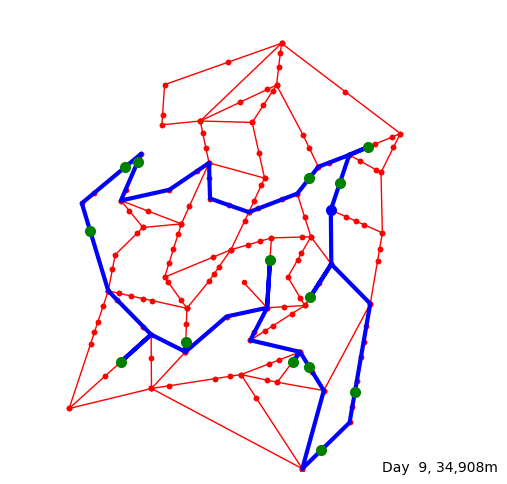

[ 9] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 9] 18:11:40.0 Driver drives to Customer: 36 (6453, 3761)
[ 9] 18:19:45.5 Driver arrived at Customer: 36 (6453, 3761)
[ 9] 18:20:24.8 Customer: 36 (6453, 3761) answers door
[ 9] 18:20:24.8 Customer: 36 (6453, 3761) accepts Parcel: 236
[ 9] 18:20:28.2 Customer: 36 (6453, 3761) signs off
[ 9] 18:20:28.6 Driver drives to Customer: 75 (7416, 1705)
[ 9] 18:36:25.7 Driver arrived at Customer: 75 (7416, 1705)
[ 9] 18:36:44.6 Customer: 75 (7416, 1705) answers door
[ 9] 18:36:44.6 Customer: 75 (7416, 1705) accepts Parcel: 242
[ 9] 18:36:46.3 Customer: 75 (7416, 1705) signs off
[ 9] 18:36:54.3 Driver drives to Customer: 95 (6687, 444)
[ 9] 18:43:00.7 Driver arrived at Customer: 95 (6687, 444)
[ 9] 18:43:07.1 Customer: 95 (6687, 444) answers door
[ 9] 18:43:07.1 Customer: 95 (6687, 444) accepts Parcel: 240
[ 9] 18:43:09.0 Customer: 95 (6687, 444) signs off
[ 9] 18:43:34.4 Driver drives to Customer: 39 (6430, 2261)
[ 9] 18:55:16.1 Driver ar

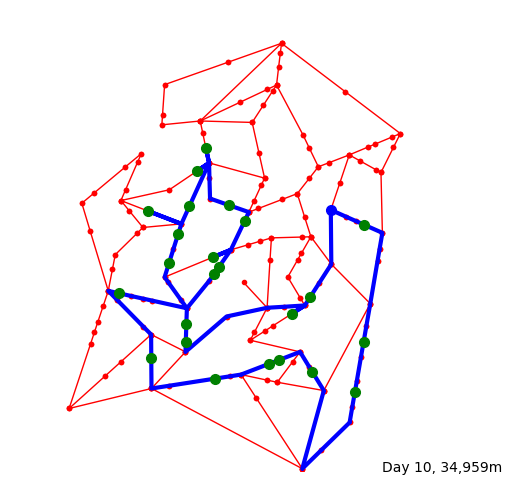

[10] 18:28:20.0 Driver leaves for delivery of 34 parcels
[10] 18:28:20.0 Driver drives to Customer: 93 (7622, 5327)
[10] 18:31:29.8 Driver arrived at Customer: 93 (7622, 5327)
[10] 18:32:14.6 Customer: 93 (7622, 5327) answers door
[10] 18:32:14.6 Customer: 93 (7622, 5327) accepts Parcel: 255
[10] 18:32:19.4 Customer: 93 (7622, 5327) signs off
[10] 18:32:19.7 Driver drives to Customer:  8 (7603, 2787)
[10] 18:43:37.2 Driver arrived at Customer:  8 (7603, 2787)
[10] 18:44:00.1 Customer:  8 (7603, 2787) answers door
[10] 18:44:00.1 Customer:  8 (7603, 2787) accepts Parcel: 270
[10] 18:44:24.6 Customer:  8 (7603, 2787) signs off
[10] 18:44:28.7 Driver drives to Customer: 75 (7416, 1705)
[10] 18:48:51.7 Driver arrived at Customer: 75 (7416, 1705)
[10] 18:49:03.1 Customer: 75 (7416, 1705) answers door
[10] 18:49:03.1 Customer: 75 (7416, 1705) accepts Parcel: 261
[10] 18:49:04.6 Customer: 75 (7416, 1705) accepts Parcel: 272
[10] 18:49:11.7 Customer: 75 (7416, 1705) accepts Parcel: 282
[10] 18

[11] 10:50:15.1 Parcel: 293 arr at delivery centre
[11] 10:56:46.8 Parcel: 294 arr at delivery centre
[11] 11:06:53.5 Parcel: 295 arr at delivery centre
[11] 11:25:32.2 Parcel: 296 arr at delivery centre
[11] 11:34:09.4 Parcel: 297 arr at delivery centre
[11] 11:39:43.7 Parcel: 298 arr at delivery centre
[11] 12:00:18.2 Parcel: 299 arr at delivery centre
[11] 12:35:09.4 Parcel: 300 arr at delivery centre
[11] 13:14:15.2 Parcel: 301 arr at delivery centre
[11] 13:29:31.9 Parcel: 302 arr at delivery centre
[11] 13:36:49.9 Parcel: 303 arr at delivery centre
[11] 14:33:45.1 Parcel: 304 arr at delivery centre
[11] 14:49:32.5 Parcel: 305 arr at delivery centre
[11] 14:50:35.8 Parcel: 306 arr at delivery centre
[11] 14:51:58.1 Parcel: 307 arr at delivery centre
[11] 15:13:27.1 Parcel: 308 arr at delivery centre
[11] 15:14:25.8 Parcel: 309 arr at delivery centre
[11] 15:14:33.1 Parcel: 310 arr at delivery centre
[11] 15:22:18.7 Parcel: 311 arr at delivery centre
[11] 15:33:39.5 Parcel: 312 arr

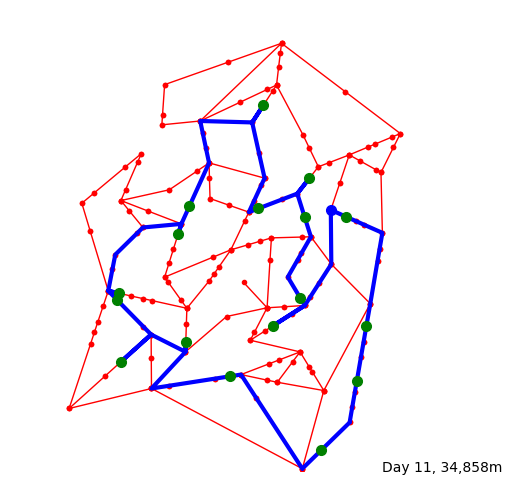

[11] 18:16:40.0 Driver leaves for delivery of 20 parcels
[11] 18:16:40.0 Driver drives to Customer: 29 (5661, 3147)
[11] 18:28:49.4 Driver arrived at Customer: 29 (5661, 3147)
[11] 18:28:58.7 Customer: 29 (5661, 3147) answers door
[11] 18:28:58.7 Customer: 29 (5661, 3147) accepts Parcel: 273
[11] 18:29:01.3 Customer: 29 (5661, 3147) signs off
[11] 18:29:08.7 Driver drives to Customer: 56 (6245, 3741)
[11] 18:33:06.3 Driver arrived at Customer: 56 (6245, 3741)
[11] 18:34:14.7 Customer: 56 (6245, 3741) answers door
[11] 18:34:14.7 Customer: 56 (6245, 3741) accepts Parcel: 291
[11] 18:34:19.1 Customer: 56 (6245, 3741) signs off
[11] 18:34:40.4 Driver drives to Customer: 27 (6339, 5488)
[11] 18:42:33.5 Driver arrived at Customer: 27 (6339, 5488)
[11] 18:43:26.7 Customer: 27 (6339, 5488) answers door
[11] 18:43:26.7 Customer: 27 (6339, 5488) accepts Parcel: 281
[11] 18:43:39.3 Customer: 27 (6339, 5488) signs off
[11] 18:43:43.4 Driver drives to Customer:  9 (6438, 6337)
[11] 18:47:34.3 Driv

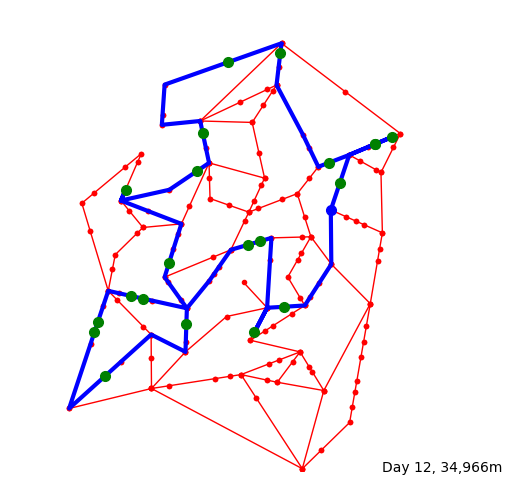

[12] 18:23:20.0 Driver leaves for delivery of 28 parcels
[12] 18:23:20.0 Driver drives to Customer: 55 (5897, 3555)
[12] 18:34:02.2 Driver arrived at Customer: 55 (5897, 3555)
[12] 18:34:37.3 Customer: 55 (5897, 3555) answers door
[12] 18:34:37.3 Customer: 55 (5897, 3555) accepts Parcel: 315
[12] 18:34:40.3 Customer: 55 (5897, 3555) signs off
[12] 18:34:46.9 Driver drives to Customer: 37 (5254, 2998)
[12] 18:38:39.5 Driver arrived at Customer: 37 (5254, 2998)
[12] 18:39:39.3 Customer: 37 (5254, 2998) answers door
[12] 18:39:39.3 Customer: 37 (5254, 2998) accepts Parcel: 303
[12] 18:40:04.9 Customer: 37 (5254, 2998) signs off
[12] 18:40:13.1 Driver drives to Customer: 35 (5376, 4973)
[12] 18:49:42.2 Driver arrived at Customer: 35 (5376, 4973)
[12] 18:50:52.4 Customer: 35 (5376, 4973) answers door
[12] 18:50:52.4 Customer: 35 (5376, 4973) accepts Parcel: 316
[12] 18:50:53.2 Customer: 35 (5376, 4973) accepts Parcel: 321
[12] 18:51:12.6 Customer: 35 (5376, 4973) signs off
[12] 18:51:37.10 

[13] 17:41:13.8 Parcel: 370 arr at delivery centre
[13] 18:00:00.0 Driver arrives for work
[13] 18:00:00.0 Parcel: 334 out for delivery
[13] 18:00:00.0 Parcel: 330 out for delivery
[13] 18:00:00.0 Parcel: 346 out for delivery
[13] 18:00:00.0 Parcel: 341 out for delivery
[13] 18:00:00.0 Parcel: 337 out for delivery
[13] 18:00:00.0 Parcel: 336 out for delivery
[13] 18:00:00.0 Parcel: 349 out for delivery
[13] 18:00:00.0 Parcel: 351 out for delivery
[13] 18:00:00.0 Parcel: 360 out for delivery
[13] 18:00:00.0 Parcel: 364 out for delivery
[13] 18:00:00.0 Parcel: 340 out for delivery
[13] 18:00:00.0 Parcel: 348 out for delivery
[13] 18:00:00.0 Parcel: 342 out for delivery
[13] 18:00:00.0 Parcel: 347 out for delivery
[13] 18:00:00.0 Parcel: 359 out for delivery
[13] 18:00:00.0 Parcel: 344 out for delivery
[13] 18:00:00.0 Parcel: 362 out for delivery
[13] 18:00:00.0 Parcel: 323 out for delivery
[13] 18:00:00.0 Parcel: 325 out for delivery
[13] 18:00:00.0 Parcel: 329 out for delivery
[13] 18:0

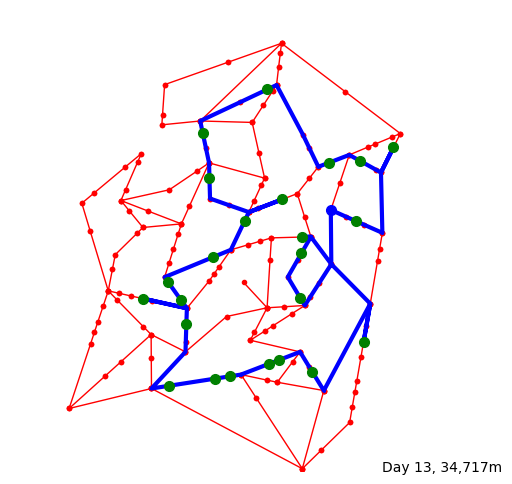

[13] 18:24:10.0 Driver leaves for delivery of 29 parcels
[13] 18:24:10.0 Driver drives to Customer: 56 (6245, 3741)
[13] 18:33:50.1 Driver arrived at Customer: 56 (6245, 3741)
[13] 18:34:00.4 Customer: 56 (6245, 3741) answers door
[13] 18:34:00.4 Customer: 56 (6245, 3741) accepts Parcel: 334
[13] 18:34:18.6 Customer: 56 (6245, 3741) signs off
[13] 18:34:22.3 Driver drives to Customer: 97 (6268, 4714)
[13] 18:38:52.1 Driver arrived at Customer: 97 (6268, 4714)
[13] 18:39:02.3 Customer: 97 (6268, 4714) answers door
[13] 18:39:02.3 Customer: 97 (6268, 4714) accepts Parcel: 330
[13] 18:39:09.1 Customer: 97 (6268, 4714) signs off
[13] 18:39:38.5 Driver drives to Customer: 61 (6282, 5064)
[13] 18:42:01.10 Driver arrived at Customer: 61 (6282, 5064)
[13] 18:42:30.4 Customer: 61 (6282, 5064) answers door
[13] 18:42:30.4 Customer: 61 (6282, 5064) accepts Parcel: 346
[13] 18:42:34.6 Customer: 61 (6282, 5064) signs off
[13] 18:42:35.4 Driver drives to Customer:  8 (7603, 2787)
[13] 18:54:28.2 Dri

[14] 11:49:39.10 Parcel: 386 arr at delivery centre
[14] 12:11:39.2 Parcel: 387 arr at delivery centre
[14] 13:23:53.8 Parcel: 388 arr at delivery centre
[14] 13:45:12.1 Parcel: 389 arr at delivery centre
[14] 14:21:49.4 Parcel: 390 arr at delivery centre
[14] 14:25:24.1 Parcel: 391 arr at delivery centre
[14] 14:37:17.2 Parcel: 392 arr at delivery centre
[14] 14:51:26.3 Parcel: 393 arr at delivery centre
[14] 15:18:31.3 Parcel: 394 arr at delivery centre
[14] 15:28:43.6 Parcel: 395 arr at delivery centre
[14] 15:52:59.9 Parcel: 396 arr at delivery centre
[14] 18:00:00.0 Driver arrives for work
[14] 18:00:00.0 Parcel: 386 out for delivery
[14] 18:00:00.0 Parcel: 357 out for delivery
[14] 18:00:00.0 Parcel: 363 out for delivery
[14] 18:00:00.0 Parcel: 353 out for delivery
[14] 18:00:00.0 Parcel: 358 out for delivery
[14] 18:00:00.0 Parcel: 355 out for delivery
[14] 18:00:00.0 Parcel: 366 out for delivery
[14] 18:00:00.0 Parcel: 378 out for delivery
[14] 18:00:00.0 Parcel: 368 out for de

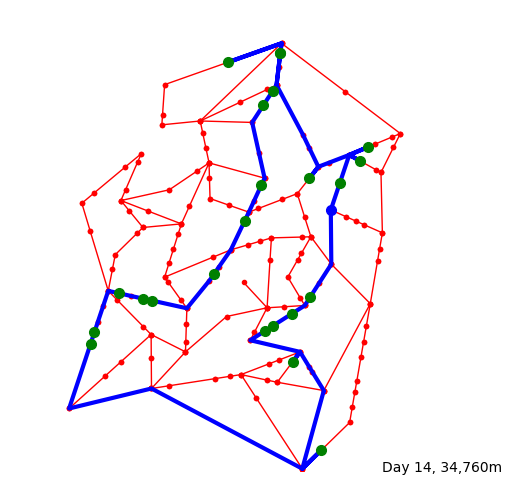

[14] 18:23:20.0 Driver leaves for delivery of 28 parcels
[14] 18:23:20.0 Driver drives to Customer: 36 (6453, 3761)
[14] 18:31:25.5 Driver arrived at Customer: 36 (6453, 3761)
[14] 18:31:34.4 Customer: 36 (6453, 3761) answers door
[14] 18:31:34.4 Customer: 36 (6453, 3761) accepts Parcel: 386
[14] 18:31:47.9 Customer: 36 (6453, 3761) signs off
[14] 18:31:50.1 Driver drives to Customer: 13 (6067, 3408)
[14] 18:33:58.3 Driver arrived at Customer: 13 (6067, 3408)
[14] 18:33:58.3 Customer: 13 (6067, 3408) answers door
[14] 18:33:58.3 Customer: 13 (6067, 3408) accepts Parcel: 357
[14] 18:34:21.0 Customer: 13 (6067, 3408) accepts Parcel: 363
[14] 18:34:39.7 Customer: 13 (6067, 3408) signs off
[14] 18:34:40.4 Driver drives to Customer: 29 (5661, 3147)
[14] 18:36:36.1 Driver arrived at Customer: 29 (5661, 3147)
[14] 18:36:43.9 Customer: 29 (5661, 3147) answers door
[14] 18:36:43.9 Customer: 29 (5661, 3147) accepts Parcel: 353
[14] 18:36:46.6 Customer: 29 (5661, 3147) accepts Parcel: 358
[14] 18

[15] 12:39:25.7 Parcel: 418 arr at delivery centre
[15] 12:47:49.0 Parcel: 419 arr at delivery centre
[15] 12:58:18.7 Parcel: 420 arr at delivery centre
[15] 13:29:09.9 Parcel: 421 arr at delivery centre
[15] 13:48:44.7 Parcel: 422 arr at delivery centre
[15] 14:06:06.0 Parcel: 423 arr at delivery centre
[15] 18:00:00.0 Driver arrives for work
[15] 18:00:00.0 Parcel: 399 out for delivery
[15] 18:00:00.0 Parcel: 385 out for delivery
[15] 18:00:00.0 Parcel: 394 out for delivery
[15] 18:00:00.0 Parcel: 381 out for delivery
[15] 18:00:00.0 Parcel: 409 out for delivery
[15] 18:00:00.0 Parcel: 400 out for delivery
[15] 18:00:00.0 Parcel: 403 out for delivery
[15] 18:00:00.0 Parcel: 419 out for delivery
[15] 18:00:00.0 Parcel: 415 out for delivery
[15] 18:00:00.0 Parcel: 397 out for delivery
[15] 18:00:00.0 Parcel: 391 out for delivery
[15] 18:00:00.0 Parcel: 398 out for delivery
[15] 18:00:00.0 Parcel: 416 out for delivery
[15] 18:00:00.0 Parcel: 376 out for delivery
[15] 18:00:00.0 Parcel: 

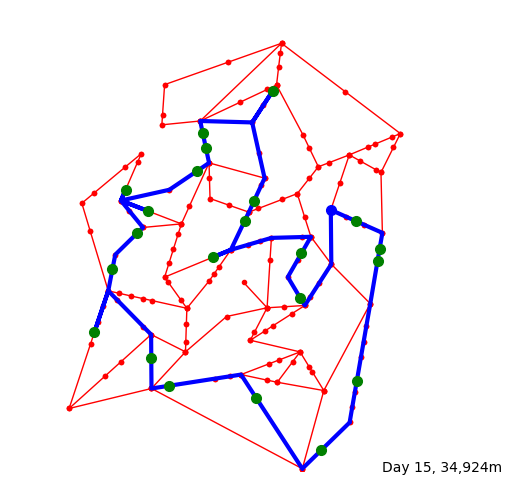

[15] 18:23:20.0 Driver leaves for delivery of 28 parcels
[15] 18:23:20.0 Driver drives to Customer: 73 (7436, 5411)
[15] 18:25:40.9 Driver arrived at Customer: 73 (7436, 5411)
[15] 18:25:42.4 Customer: 73 (7436, 5411) answers door
[15] 18:25:42.4 Customer: 73 (7436, 5411) accepts Parcel: 399
[15] 18:26:02.8 Customer: 73 (7436, 5411) signs off
[15] 18:26:19.1 Driver drives to Customer: 45 (7949, 4811)
[15] 18:30:13.1 Driver arrived at Customer: 45 (7949, 4811)
[15] 18:31:11.2 Customer: 45 (7949, 4811) answers door
[15] 18:31:11.2 Customer: 45 (7949, 4811) accepts Parcel: 385
[15] 18:31:17.5 Customer: 45 (7949, 4811) signs off
[15] 18:31:28.8 Driver drives to Customer: 20 (7904, 4546)
[15] 18:32:33.2 Driver arrived at Customer: 20 (7904, 4546)
[15] 18:32:54.4 Customer: 20 (7904, 4546) answers door
[15] 18:32:54.4 Customer: 20 (7904, 4546) accepts Parcel: 394
[15] 18:32:56.5 Customer: 20 (7904, 4546) signs off
[15] 18:33:01.5 Driver drives to Customer: 41 (7458, 1945)
[15] 18:43:34.3 Driv

[16] 13:44:07.9 Parcel: 449 arr at delivery centre
[16] 13:46:14.4 Parcel: 450 arr at delivery centre
[16] 14:23:52.9 Parcel: 451 arr at delivery centre
[16] 14:48:46.9 Parcel: 452 arr at delivery centre
[16] 18:00:00.0 Driver arrives for work
[16] 18:00:00.0 Parcel: 427 out for delivery
[16] 18:00:00.0 Parcel: 421 out for delivery
[16] 18:00:00.0 Parcel: 438 out for delivery
[16] 18:00:00.0 Parcel: 413 out for delivery
[16] 18:00:00.0 Parcel: 437 out for delivery
[16] 18:00:00.0 Parcel: 443 out for delivery
[16] 18:00:00.0 Parcel: 451 out for delivery
[16] 18:00:00.0 Parcel: 411 out for delivery
[16] 18:00:00.0 Parcel: 418 out for delivery
[16] 18:00:00.0 Parcel: 422 out for delivery
[16] 18:00:00.0 Parcel: 420 out for delivery
[16] 18:00:00.0 Parcel: 414 out for delivery
[16] 18:00:00.0 Parcel: 417 out for delivery
[16] 18:00:00.0 Parcel: 424 out for delivery
[16] 18:00:00.0 Parcel: 433 out for delivery
[16] 18:00:00.0 Parcel: 441 out for delivery
[16] 18:00:00.0 Parcel: 405 out for 

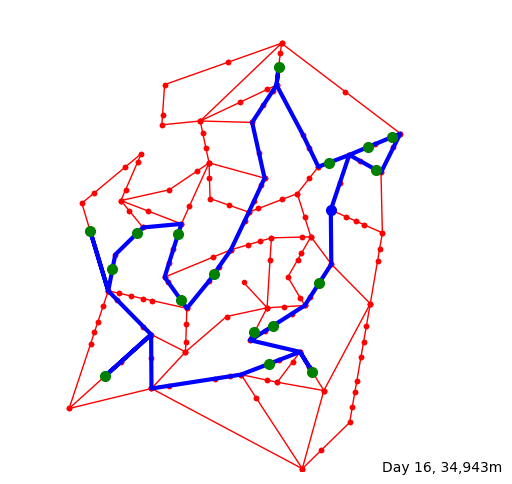

[16] 18:20:00.0 Driver leaves for delivery of 24 parcels
[16] 18:20:00.0 Driver drives to Customer: 58 (7707, 7015)
[16] 18:26:47.8 Driver arrived at Customer: 58 (7707, 7015)
[16] 18:26:53.6 Customer: 58 (7707, 7015) answers door
[16] 18:26:53.6 Customer: 58 (7707, 7015) accepts Parcel: 427
[16] 18:27:03.9 Customer: 58 (7707, 7015) signs off
[16] 18:27:10.7 Driver drives to Customer: 53 (8211, 7227)
[16] 18:29:21.7 Driver arrived at Customer: 53 (8211, 7227)
[16] 18:29:40.8 Customer: 53 (8211, 7227) answers door
[16] 18:29:40.8 Customer: 53 (8211, 7227) accepts Parcel: 421
[16] 18:29:48.5 Customer: 53 (8211, 7227) accepts Parcel: 438
[16] 18:29:49.3 Customer: 53 (8211, 7227) signs off
[16] 18:30:24.4 Driver drives to Customer: 72 (7870, 6521)
[16] 18:35:26.8 Driver arrived at Customer: 72 (7870, 6521)
[16] 18:35:53.10 Customer: 72 (7870, 6521) answers door
[16] 18:35:53.10 Customer: 72 (7870, 6521) accepts Parcel: 413
[16] 18:35:54.1 Customer: 72 (7870, 6521) accepts Parcel: 437
[16] 

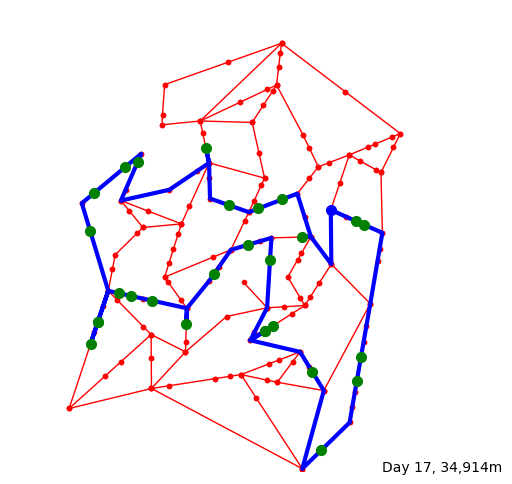

[17] 18:29:10.0 Driver leaves for delivery of 35 parcels
[17] 18:29:10.0 Driver drives to Customer: 61 (6282, 5064)
[17] 18:37:34.2 Driver arrived at Customer: 61 (6282, 5064)
[17] 18:37:41.3 Customer: 61 (6282, 5064) answers door
[17] 18:37:41.3 Customer: 61 (6282, 5064) accepts Parcel: 425
[17] 18:37:48.1 Customer: 61 (6282, 5064) accepts Parcel: 444
[17] 18:37:48.3 Customer: 61 (6282, 5064) signs off
[17] 18:38:08.2 Driver drives to Customer:  0 (5854, 5879)
[17] 18:44:11.6 Driver arrived at Customer:  0 (5854, 5879)
[17] 18:44:27.7 Customer:  0 (5854, 5879) answers door
[17] 18:44:27.7 Customer:  0 (5854, 5879) accepts Parcel: 453
[17] 18:44:31.9 Customer:  0 (5854, 5879) signs off
[17] 18:45:25.2 Driver drives to Customer:  2 (5342, 5682)
[17] 18:47:36.7 Driver arrived at Customer:  2 (5342, 5682)
[17] 18:48:14.7 Customer:  2 (5342, 5682) answers door
[17] 18:48:14.7 Customer:  2 (5342, 5682) accepts Parcel: 436
[17] 18:48:20.2 Customer:  2 (5342, 5682) signs off
[17] 18:48:35.8 D

[18] 08:16:07.3 Parcel: 482 arr at delivery centre
[18] 08:29:03.8 Parcel: 483 arr at delivery centre
[18] 09:08:47.3 Parcel: 484 arr at delivery centre
[18] 09:51:20.7 Parcel: 485 arr at delivery centre
[18] 09:59:40.4 Parcel: 486 arr at delivery centre
[18] 10:01:17.6 Parcel: 487 arr at delivery centre
[18] 10:24:20.3 Parcel: 488 arr at delivery centre
[18] 10:44:53.1 Parcel: 489 arr at delivery centre
[18] 10:45:22.1 Parcel: 490 arr at delivery centre
[18] 10:54:32.7 Parcel: 491 arr at delivery centre
[18] 11:12:31.4 Parcel: 492 arr at delivery centre
[18] 11:12:59.9 Parcel: 493 arr at delivery centre
[18] 11:52:00.10 Parcel: 494 arr at delivery centre
[18] 12:42:48.9 Parcel: 495 arr at delivery centre
[18] 13:02:41.5 Parcel: 496 arr at delivery centre
[18] 13:03:57.6 Parcel: 497 arr at delivery centre
[18] 13:05:05.4 Parcel: 498 arr at delivery centre
[18] 13:11:59.5 Parcel: 499 arr at delivery centre
[18] 13:12:27.2 Parcel: 500 arr at delivery centre
[18] 13:19:04.9 Parcel: 501 ar

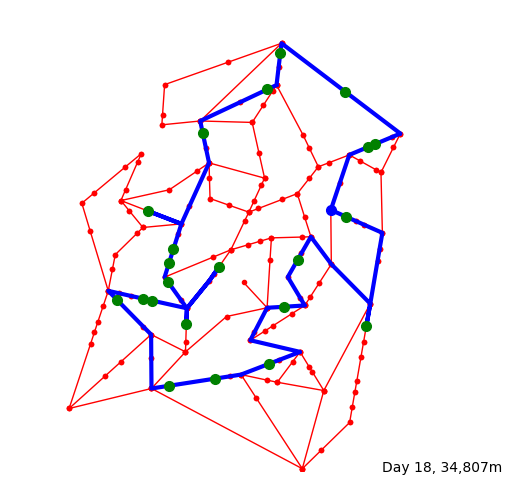

[18] 18:23:20.0 Driver leaves for delivery of 28 parcels
[18] 18:23:20.0 Driver drives to Customer: 79 (7227, 5504)
[18] 18:24:46.2 Driver arrived at Customer: 79 (7227, 5504)
[18] 18:25:05.5 Customer: 79 (7227, 5504) answers door
[18] 18:25:05.5 Customer: 79 (7227, 5504) accepts Parcel: 480
[18] 18:25:08.2 Customer: 79 (7227, 5504) signs off
[18] 18:25:11.9 Driver drives to Customer: 84 (7665, 3146)
[18] 18:36:45.8 Driver arrived at Customer: 84 (7665, 3146)
[18] 18:37:55.4 Customer: 84 (7665, 3146) answers door
[18] 18:37:55.4 Customer: 84 (7665, 3146) accepts Parcel: 482
[18] 18:38:18.8 Customer: 84 (7665, 3146) accepts Parcel: 502
[18] 18:38:51.1 Customer: 84 (7665, 3146) signs off
[18] 18:38:51.2 Driver drives to Customer: 62 (6189, 4576)
[18] 18:50:47.6 Driver arrived at Customer: 62 (6189, 4576)
[18] 18:51:43.7 Customer: 62 (6189, 4576) answers door
[18] 18:51:43.7 Customer: 62 (6189, 4576) accepts Parcel: 483
[18] 18:51:51.2 Customer: 62 (6189, 4576) signs off
[18] 18:51:52.5 D

[19] 17:00:09.10 Parcel: 541 arr at delivery centre
[19] 17:00:54.1 Parcel: 542 arr at delivery centre
[19] 17:03:05.10 Parcel: 543 arr at delivery centre
[19] 17:03:25.3 Parcel: 544 arr at delivery centre
[19] 17:04:40.8 Parcel: 545 arr at delivery centre
[19] 18:00:00.0 Driver arrives for work
[19] 18:00:00.0 Parcel: 515 out for delivery
[19] 18:00:00.0 Parcel: 526 out for delivery
[19] 18:00:00.0 Parcel: 496 out for delivery
[19] 18:00:00.0 Parcel: 528 out for delivery
[19] 18:00:00.0 Parcel: 509 out for delivery
[19] 18:00:00.0 Parcel: 519 out for delivery
[19] 18:00:00.0 Parcel: 532 out for delivery
[19] 18:00:00.0 Parcel: 489 out for delivery
[19] 18:00:00.0 Parcel: 517 out for delivery
[19] 18:00:00.0 Parcel: 536 out for delivery
[19] 18:00:00.0 Parcel: 487 out for delivery
[19] 18:00:00.0 Parcel: 498 out for delivery
[19] 18:00:00.0 Parcel: 537 out for delivery
[19] 18:00:00.0 Parcel: 513 out for delivery
[19] 18:00:00.0 Parcel: 543 out for delivery
[19] 18:00:00.0 Parcel: 511 

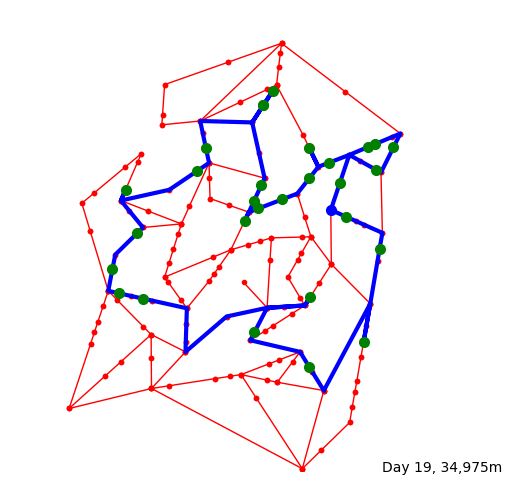

[19] 18:34:10.0 Driver leaves for delivery of 41 parcels
[19] 18:34:10.0 Driver drives to Customer: 79 (7227, 5504)
[19] 18:35:36.2 Driver arrived at Customer: 79 (7227, 5504)
[19] 18:35:38.9 Customer: 79 (7227, 5504) answers door
[19] 18:35:38.9 Customer: 79 (7227, 5504) accepts Parcel: 515
[19] 18:35:44.8 Customer: 79 (7227, 5504) signs off
[19] 18:35:50.8 Driver drives to Customer: 45 (7949, 4811)
[19] 18:40:39.6 Driver arrived at Customer: 45 (7949, 4811)
[19] 18:41:39.8 Customer: 45 (7949, 4811) answers door
[19] 18:41:39.8 Customer: 45 (7949, 4811) accepts Parcel: 526
[19] 18:41:54.1 Customer: 45 (7949, 4811) signs off
[19] 18:41:55.5 Driver drives to Customer:  8 (7603, 2787)
[19] 18:50:08.0 Driver arrived at Customer:  8 (7603, 2787)
[19] 18:50:47.4 Customer:  8 (7603, 2787) answers door
[19] 18:50:47.4 Customer:  8 (7603, 2787) accepts Parcel: 496
[19] 18:50:54.6 Customer:  8 (7603, 2787) accepts Parcel: 528
[19] 18:50:54.7 Customer:  8 (7603, 2787) signs off
[19] 18:50:56.3 D

[20] 08:42:58.3 Parcel: 549 arr at delivery centre
[20] 08:45:21.1 Parcel: 550 arr at delivery centre
[20] 08:53:51.3 Parcel: 551 arr at delivery centre
[20] 09:09:33.8 Parcel: 552 arr at delivery centre
[20] 09:10:55.10 Parcel: 553 arr at delivery centre
[20] 09:20:03.4 Parcel: 554 arr at delivery centre
[20] 09:27:12.1 Parcel: 555 arr at delivery centre
[20] 10:13:19.1 Parcel: 556 arr at delivery centre
[20] 10:14:14.5 Parcel: 557 arr at delivery centre
[20] 10:22:23.1 Parcel: 558 arr at delivery centre
[20] 10:30:45.4 Parcel: 559 arr at delivery centre
[20] 10:50:57.1 Parcel: 560 arr at delivery centre
[20] 10:56:56.8 Parcel: 561 arr at delivery centre
[20] 11:00:28.10 Parcel: 562 arr at delivery centre
[20] 11:05:51.9 Parcel: 563 arr at delivery centre
[20] 11:15:43.10 Parcel: 564 arr at delivery centre
[20] 12:02:15.6 Parcel: 565 arr at delivery centre
[20] 12:26:56.6 Parcel: 566 arr at delivery centre
[20] 12:31:58.3 Parcel: 567 arr at delivery centre
[20] 12:44:38.1 Parcel: 568 

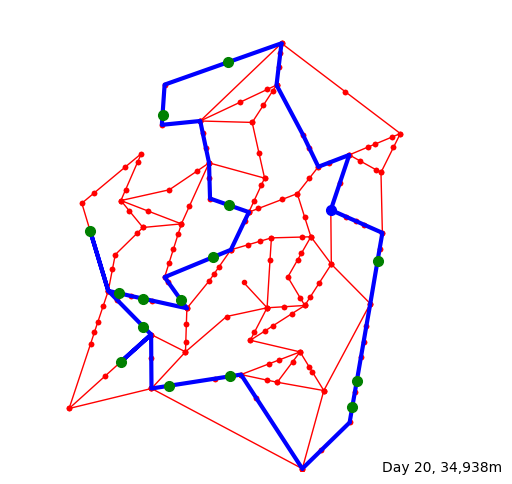

[20] 18:16:40.0 Driver leaves for delivery of 20 parcels
[20] 18:16:40.0 Driver drives to Customer: 24 (4686, 8847)
[20] 18:40:59.7 Driver arrived at Customer: 24 (4686, 8847)
[20] 18:41:01.9 Customer: 24 (4686, 8847) answers door
[20] 18:41:01.9 Customer: 24 (4686, 8847) accepts Parcel: 529
[20] 18:41:24.7 Customer: 24 (4686, 8847) signs off
[20] 18:41:24.10 Driver drives to Customer:  6 (3280, 7704)
[20] 18:49:49.10 Driver arrived at Customer:  6 (3280, 7704)
[20] 18:50:31.7 Customer:  6 (3280, 7704) answers door
[20] 18:50:31.7 Customer:  6 (3280, 7704) accepts Parcel: 525
[20] 18:50:58.4 Customer:  6 (3280, 7704) accepts Parcel: 551
[20] 18:51:05.4 Customer:  6 (3280, 7704) signs off
[20] 18:51:10.8 Driver drives to Customer: 66 (4715, 5751)
[20] 19:03:52.6 Driver arrived at Customer: 66 (4715, 5751)
[20] 19:04:08.7 Customer: 66 (4715, 5751) answers door
[20] 19:04:08.7 Customer: 66 (4715, 5751) accepts Parcel: 561
[20] 19:04:33.5 Customer: 66 (4715, 5751) signs off
[20] 19:04:59.5

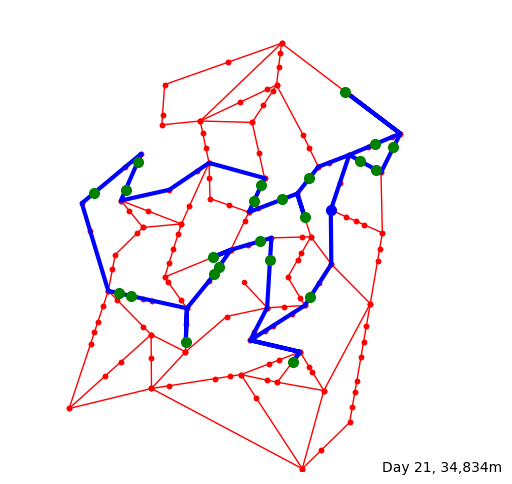

[21] 18:22:30.0 Driver leaves for delivery of 27 parcels
[21] 18:22:30.0 Driver drives to Customer: 36 (6453, 3761)
[21] 18:30:35.5 Driver arrived at Customer: 36 (6453, 3761)
[21] 18:30:36.1 Customer: 36 (6453, 3761) answers door
[21] 18:30:36.1 Customer: 36 (6453, 3761) accepts Parcel: 558
[21] 18:30:51.1 Customer: 36 (6453, 3761) signs off
[21] 18:30:52.5 Driver drives to Customer: 52 (6082, 2369)
[21] 18:42:42.9 Driver arrived at Customer: 52 (6082, 2369)
[21] 18:42:48.2 Customer: 52 (6082, 2369) answers door
[21] 18:42:48.2 Customer: 52 (6082, 2369) accepts Parcel: 571
[21] 18:42:53.1 Customer: 52 (6082, 2369) signs off
[21] 18:43:31.1 Driver drives to Customer: 68 (5592, 4573)
[21] 18:56:16.4 Driver arrived at Customer: 68 (5592, 4573)
[21] 18:57:43.3 Customer: 68 (5592, 4573) answers door
[21] 18:57:43.3 Customer: 68 (5592, 4573) accepts Parcel: 569
[21] 18:57:47.0 Customer: 68 (5592, 4573) signs off
[21] 18:58:04.2 Driver drives to Customer: 35 (5376, 4973)
[21] 19:00:59.1 Driv

In [131]:
random.seed(0)
recP6R35 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [132]:
standardMeasureConverter(recP6R35.daily)

### Simulation Records

In [133]:
recP6R35.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,75750,34.744,182.5,10,NaN
1,151200,162764,34.904,192.733333,18,1.41877
2,237600,248972,34.601,189.533333,9,1.38113
3,324000,335330,34.824,188.833333,6,1.543431
4,410400,421775,34.017,189.583333,7,1.220903
5,496800,508071,34.68,187.85,12,1.296357
6,583200,596388,34.87,219.8,6,1.356613
7,669600,681624,34.79,200.4,5,1.524502
8,756000,766820,34.526,180.333333,6,1.273806
9,842400,853054,34.908,177.566667,5,1.351152


### Time Plot

In [134]:
np.mean(recP6R35.daily['Working Time (in minutes)'])

194.54393939393938

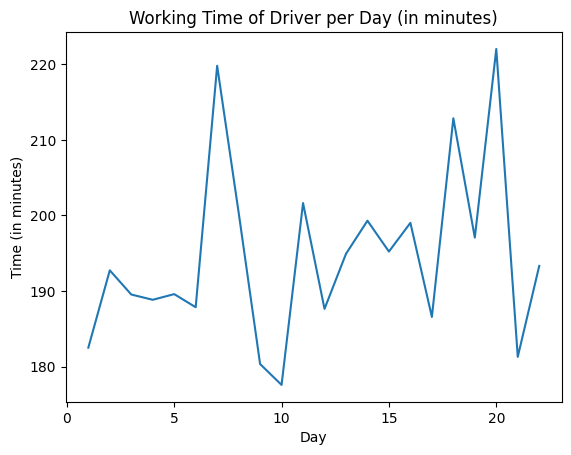

In [135]:
timePlot = plt.plot(recP6R35.daily.index +1 ,recP6R35.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [136]:
np.mean(recP6R35.daily['Delivery Route Distance(in km)'])

34.79359090909091

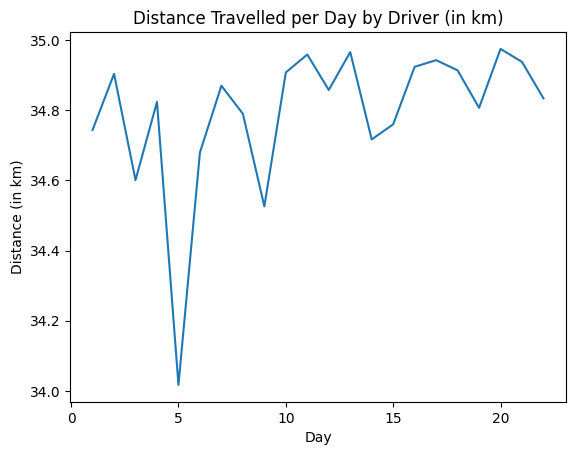

In [137]:
distancePlot = plt.plot(recP6R35.daily.index +1 ,recP6R35.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [138]:
np.mean(recP6R35.daily['Number of left over parcels'])

10.909090909090908

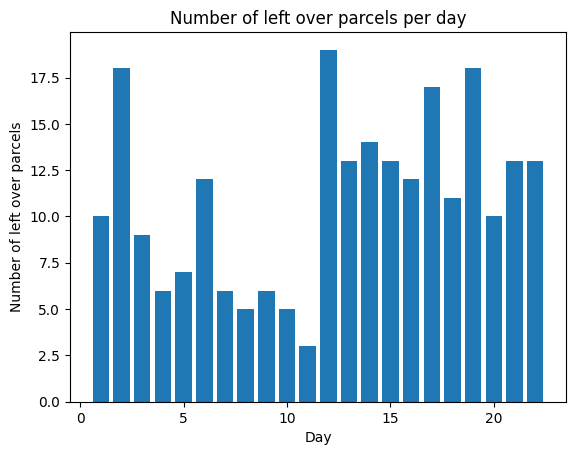

In [139]:
leftOverPlot = plt.bar(recP6R35.daily.index +1 ,recP6R35.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [140]:
np.mean(recP6R35.daily['Delay Time(in days)'])

1.3375560842097989

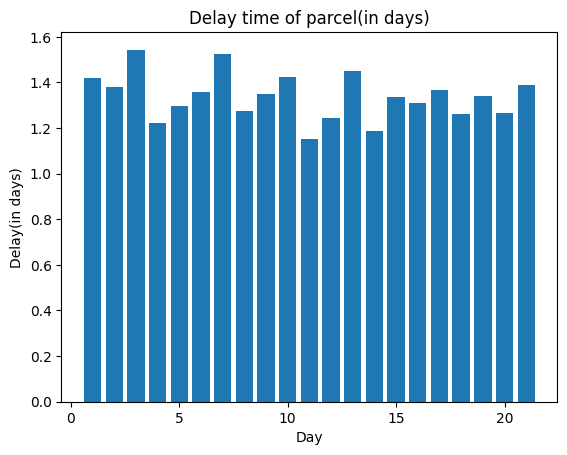

In [141]:
delayPlot = plt.bar(recP6R35.daily.index ,recP6R35.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

# Scenario 6

Range 40Km

In [142]:
RANGE = 40000

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 594 deliveries over 22 days.


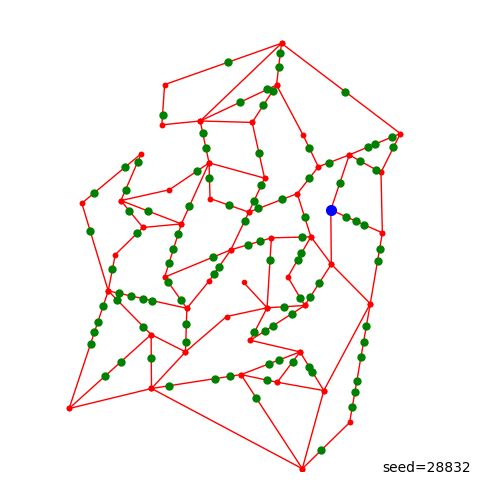

In [143]:
data = generateData(28832, p = 6, plot=True, log=True)

## Storing generated data into the pickle file

In [144]:
with open('dataSeed28832P6R40.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [145]:
with open('dataSeed28832P6R40.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 596 parcels over 22 days to 100 customers
[ 0] 08:28:50.7 Parcel:  0 arr at delivery centre
[ 0] 08:50:50.3 Parcel:  1 arr at delivery centre
[ 0] 08:59:17.9 Parcel:  2 arr at delivery centre
[ 0] 09:03:56.6 Parcel:  3 arr at delivery centre
[ 0] 09:15:02.6 Parcel:  4 arr at delivery centre
[ 0] 09:23:05.5 Parcel:  5 arr at delivery centre
[ 0] 09:46:50.1 Parcel:  6 arr at delivery centre
[ 0] 09:52:26.3 Parcel:  7 arr at delivery centre
[ 0] 10:02:28.5 Parcel:  8 arr at delivery centre
[ 0] 10:16:02.10 Parcel:  9 arr at delivery centre
[ 0] 10:53:03.6 Parcel: 10 arr at delivery centre
[ 0] 11:03:57.1 Parcel: 11 arr at delivery centre
[ 0] 11:09:05.1 Parcel: 12 arr at delivery centre
[ 0] 11:30:56.5 Parcel: 13 arr at delivery centre
[ 0] 11:45:52.6 Parcel: 14 arr at delivery centre
[ 0] 11:50:20.8 Parcel: 15 arr at delivery centre
[ 0] 12:27:38.1 Parcel: 16 arr at delivery centre
[ 0] 13:30:36.6 Parcel: 17 arr at delivery centre
[ 0] 13:56:22.5 Parcel: 18 arr at 

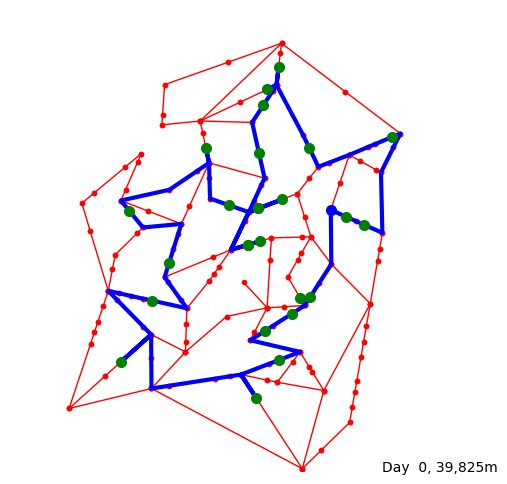

[ 0] 18:07:27.4 Parcel: 30 arr at delivery centre
[ 0] 18:25:00.0 Driver leaves for delivery of 30 parcels
[ 0] 18:25:00.0 Driver drives to Customer: 79 (7227, 5504)
[ 0] 18:26:26.2 Driver arrived at Customer: 79 (7227, 5504)
[ 0] 18:26:36.7 Customer: 79 (7227, 5504) answers door
[ 0] 18:26:36.7 Customer: 79 (7227, 5504) accepts Parcel: 17
[ 0] 18:26:51.1 Customer: 79 (7227, 5504) signs off
[ 0] 18:26:54.4 Driver drives to Customer: 93 (7622, 5327)
[ 0] 18:28:38.1 Driver arrived at Customer: 93 (7622, 5327)
[ 0] 18:31:23.5 Customer: 93 (7622, 5327) answers door
[ 0] 18:31:23.5 Customer: 93 (7622, 5327) accepts Parcel:  6
[ 0] 18:31:24.8 Customer: 93 (7622, 5327) signs off
[ 0] 18:31:46.3 Driver drives to Customer: 53 (8211, 7227)
[ 0] 18:43:14.1 Driver arrived at Customer: 53 (8211, 7227)
[ 0] 18:43:15.8 Customer: 53 (8211, 7227) answers door
[ 0] 18:43:15.8 Customer: 53 (8211, 7227) accepts Parcel:  2
[ 0] 18:43:18.8 Customer: 53 (8211, 7227) accepts Parcel: 11
[ 0] 18:43:26.2 Custome

[ 1] 09:13:39.6 Parcel: 35 arr at delivery centre
[ 1] 09:33:22.7 Parcel: 36 arr at delivery centre
[ 1] 09:41:16.0 Parcel: 37 arr at delivery centre
[ 1] 10:08:16.5 Parcel: 38 arr at delivery centre
[ 1] 10:25:22.6 Parcel: 39 arr at delivery centre
[ 1] 10:25:23.7 Parcel: 40 arr at delivery centre
[ 1] 10:35:56.6 Parcel: 41 arr at delivery centre
[ 1] 11:07:17.4 Parcel: 42 arr at delivery centre
[ 1] 11:11:37.5 Parcel: 43 arr at delivery centre
[ 1] 11:17:43.4 Parcel: 44 arr at delivery centre
[ 1] 11:49:24.6 Parcel: 45 arr at delivery centre
[ 1] 11:52:41.8 Parcel: 46 arr at delivery centre
[ 1] 12:05:41.5 Parcel: 47 arr at delivery centre
[ 1] 12:09:55.1 Parcel: 48 arr at delivery centre
[ 1] 13:03:03.6 Parcel: 49 arr at delivery centre
[ 1] 13:28:15.6 Parcel: 50 arr at delivery centre
[ 1] 13:37:28.3 Parcel: 51 arr at delivery centre
[ 1] 13:38:46.3 Parcel: 52 arr at delivery centre
[ 1] 13:44:45.1 Parcel: 53 arr at delivery centre
[ 1] 13:55:44.8 Parcel: 54 arr at delivery centre


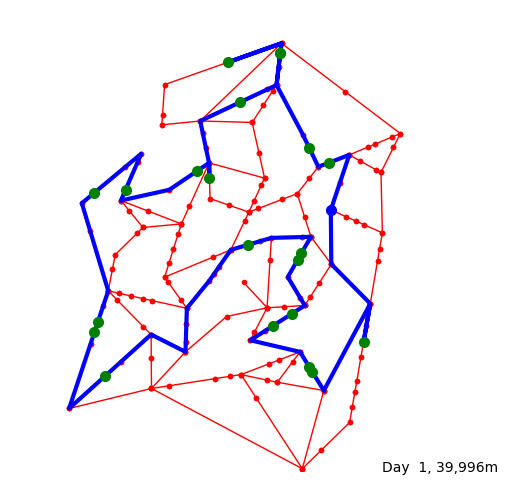

[ 1] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 1] 18:21:40.0 Driver drives to Customer: 16 (6857, 6672)
[ 1] 18:28:33.8 Driver arrived at Customer: 16 (6857, 6672)
[ 1] 18:30:04.8 Customer: 16 (6857, 6672) answers door
[ 1] 18:30:04.8 Customer: 16 (6857, 6672) accepts Parcel: 62
[ 1] 18:30:10.5 Customer: 16 (6857, 6672) signs off
[ 1] 18:30:16.4 Driver drives to Customer:  3 (6435, 6994)
[ 1] 18:33:03.2 Driver arrived at Customer:  3 (6435, 6994)
[ 1] 18:33:52.6 Customer:  3 (6435, 6994) answers door
[ 1] 18:33:52.6 Customer:  3 (6435, 6994) accepts Parcel: 54
[ 1] 18:33:59.10 Customer:  3 (6435, 6994) signs off
[ 1] 18:34:01.4 Driver drives to Customer: 15 (5813, 9044)
[ 1] 18:42:55.1 Driver arrived at Customer: 15 (5813, 9044)
[ 1] 18:44:31.6 Customer: 15 (5813, 9044) answers door
[ 1] 18:44:31.6 Customer: 15 (5813, 9044) accepts Parcel: 30
[ 1] 18:44:37.5 Customer: 15 (5813, 9044) signs off
[ 1] 18:44:53.1 Driver drives to Customer: 24 (4686, 8847)
[ 1] 18:50:38.4 Driver

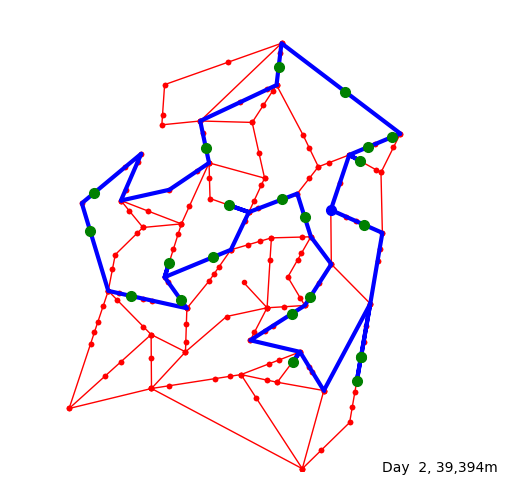

[ 2] 18:22:30.0 Driver leaves for delivery of 27 parcels
[ 2] 18:22:30.0 Driver drives to Customer: 22 (7528, 6712)
[ 2] 18:28:34.6 Driver arrived at Customer: 22 (7528, 6712)
[ 2] 18:29:19.2 Customer: 22 (7528, 6712) answers door
[ 2] 18:29:19.2 Customer: 22 (7528, 6712) accepts Parcel: 75
[ 2] 18:29:32.5 Customer: 22 (7528, 6712) signs off
[ 2] 18:29:36.3 Driver drives to Customer: 58 (7707, 7015)
[ 2] 18:32:26.7 Driver arrived at Customer: 58 (7707, 7015)
[ 2] 18:33:45.3 Customer: 58 (7707, 7015) answers door
[ 2] 18:33:45.3 Customer: 58 (7707, 7015) accepts Parcel: 56
[ 2] 18:33:48.3 Customer: 58 (7707, 7015) signs off
[ 2] 18:33:52.5 Driver drives to Customer: 53 (8211, 7227)
[ 2] 18:36:03.5 Driver arrived at Customer: 53 (8211, 7227)
[ 2] 18:36:53.4 Customer: 53 (8211, 7227) answers door
[ 2] 18:36:53.4 Customer: 53 (8211, 7227) accepts Parcel: 50
[ 2] 18:36:53.8 Customer: 53 (8211, 7227) signs off
[ 2] 18:37:21.0 Driver drives to Customer: 85 (7212, 8208)
[ 2] 18:44:05.9 Driver 

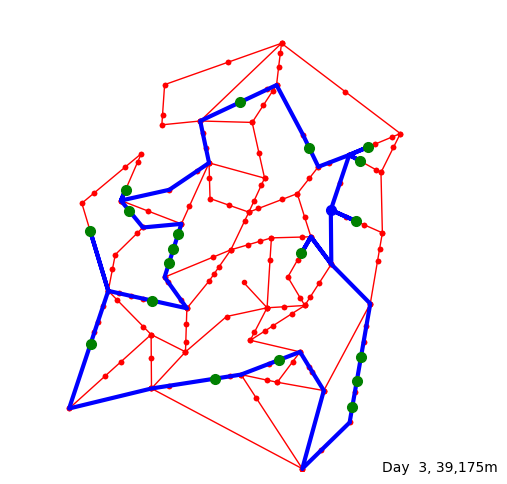

[ 3] 18:20:00.0 Driver leaves for delivery of 24 parcels
[ 3] 18:20:00.0 Driver drives to Customer: 73 (7436, 5411)
[ 3] 18:22:20.9 Driver arrived at Customer: 73 (7436, 5411)
[ 3] 18:22:34.4 Customer: 73 (7436, 5411) answers door
[ 3] 18:22:34.4 Customer: 73 (7436, 5411) accepts Parcel: 89
[ 3] 18:22:36.3 Customer: 73 (7436, 5411) signs off
[ 3] 18:22:52.9 Driver drives to Customer: 97 (6268, 4714)
[ 3] 18:34:30.8 Driver arrived at Customer: 97 (6268, 4714)
[ 3] 18:35:03.0 Customer: 97 (6268, 4714) answers door
[ 3] 18:35:03.0 Customer: 97 (6268, 4714) accepts Parcel: 97
[ 3] 18:35:06.10 Customer: 97 (6268, 4714) accepts Parcel: 99
[ 3] 18:35:15.8 Customer: 97 (6268, 4714) signs off
[ 3] 18:35:16.0 Driver drives to Customer: 77 (7546, 2458)
[ 3] 18:49:21.6 Driver arrived at Customer: 77 (7546, 2458)
[ 3] 18:49:27.1 Customer: 77 (7546, 2458) answers door
[ 3] 18:49:27.1 Customer: 77 (7546, 2458) accepts Parcel: 91
[ 3] 18:49:32.2 Customer: 77 (7546, 2458) accepts Parcel: 98
[ 3] 18:50:

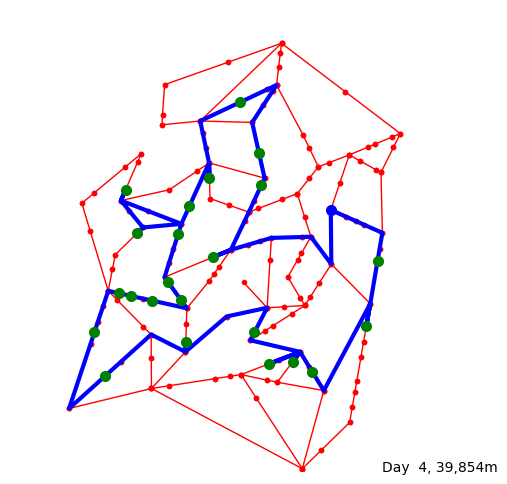

[ 4] 18:23:20.0 Driver leaves for delivery of 28 parcels
[ 4] 18:23:20.0 Driver drives to Customer: 30 (4374, 4632)
[ 4] 18:39:38.2 Driver arrived at Customer: 30 (4374, 4632)
[ 4] 18:39:39.2 Customer: 30 (4374, 4632) answers door
[ 4] 18:39:39.2 Customer: 30 (4374, 4632) accepts Parcel: 112
[ 4] 18:39:39.7 Customer: 30 (4374, 4632) accepts Parcel: 118
[ 4] 18:39:42.3 Customer: 30 (4374, 4632) signs off
[ 4] 18:39:52.9 Driver drives to Customer: 12 (5406, 6190)
[ 4] 18:47:41.8 Driver arrived at Customer: 12 (5406, 6190)
[ 4] 18:47:44.6 Customer: 12 (5406, 6190) answers door
[ 4] 18:47:44.6 Customer: 12 (5406, 6190) accepts Parcel: 124
[ 4] 18:47:45.2 Customer: 12 (5406, 6190) signs off
[ 4] 18:48:21.0 Driver drives to Customer:  5 (5352, 6892)
[ 4] 18:51:16.2 Driver arrived at Customer:  5 (5352, 6892)
[ 4] 18:51:38.2 Customer:  5 (5352, 6892) answers door
[ 4] 18:51:38.2 Customer:  5 (5352, 6892) accepts Parcel: 102
[ 4] 18:52:00.5 Customer:  5 (5352, 6892) signs off
[ 4] 18:52:02.9 D

[ 5] 13:42:40.2 Parcel: 155 arr at delivery centre
[ 5] 13:47:08.7 Parcel: 156 arr at delivery centre
[ 5] 14:01:13.6 Parcel: 157 arr at delivery centre
[ 5] 14:10:16.8 Parcel: 158 arr at delivery centre
[ 5] 14:13:15.5 Parcel: 159 arr at delivery centre
[ 5] 14:23:08.9 Parcel: 160 arr at delivery centre
[ 5] 18:00:00.0 Driver arrives for work
[ 5] 18:00:00.0 Parcel: 154 out for delivery
[ 5] 18:00:00.0 Parcel: 136 out for delivery
[ 5] 18:00:00.0 Parcel: 150 out for delivery
[ 5] 18:00:00.0 Parcel: 136 out for delivery
[ 5] 18:00:00.0 Parcel: 144 out for delivery
[ 5] 18:00:00.0 Parcel: 152 out for delivery
[ 5] 18:00:00.0 Parcel: 145 out for delivery
[ 5] 18:00:00.0 Parcel: 133 out for delivery
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 126 out for delivery
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 148 out for delivery
[ 5] 18:00:00.0 Parcel: 142 out for delivery
[ 5] 18:00:00.0 Parcel: 143 out for delivery
[ 5] 18:00:00.0 Parcel: 

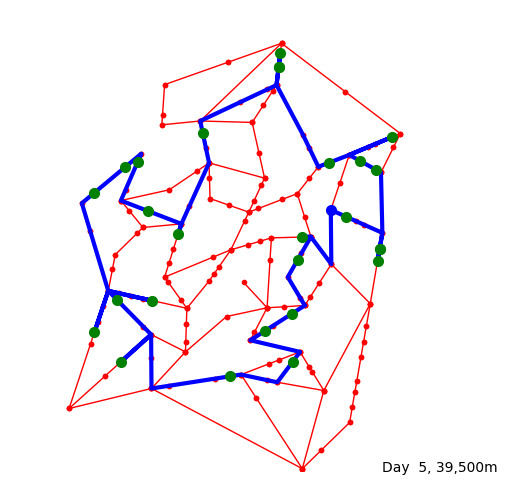

[ 5] 18:25:50.0 Driver leaves for delivery of 31 parcels
[ 5] 18:25:50.0 Driver drives to Customer: 79 (7227, 5504)
[ 5] 18:27:16.2 Driver arrived at Customer: 79 (7227, 5504)
[ 5] 18:27:40.5 Customer: 79 (7227, 5504) answers door
[ 5] 18:27:40.5 Customer: 79 (7227, 5504) accepts Parcel: 154
[ 5] 18:27:53.3 Customer: 79 (7227, 5504) signs off
[ 5] 18:27:58.5 Driver drives to Customer: 45 (7949, 4811)
[ 5] 18:32:47.2 Driver arrived at Customer: 45 (7949, 4811)
[ 5] 18:33:14.6 Customer: 45 (7949, 4811) answers door
[ 5] 18:33:14.6 Customer: 45 (7949, 4811) accepts Parcel: 136
[ 5] 18:33:14.8 Customer: 45 (7949, 4811) signs off
[ 5] 18:33:28.3 Driver drives to Customer: 20 (7904, 4546)
[ 5] 18:34:32.6 Driver arrived at Customer: 20 (7904, 4546)
[ 5] 18:34:33.10 Customer: 20 (7904, 4546) answers door
[ 5] 18:34:33.10 Customer: 20 (7904, 4546) accepts Parcel: 150
[ 5] 18:34:45.4 Customer: 20 (7904, 4546) signs off
[ 5] 18:34:54.1 Driver drives to Customer: 45 (7949, 4811)
[ 5] 18:35:58.4 Dr

[ 6] 09:13:04.2 Parcel: 166 arr at delivery centre
[ 6] 09:17:32.10 Parcel: 167 arr at delivery centre
[ 6] 09:30:17.9 Parcel: 168 arr at delivery centre
[ 6] 09:30:29.5 Parcel: 169 arr at delivery centre
[ 6] 09:51:28.2 Parcel: 170 arr at delivery centre
[ 6] 09:57:48.10 Parcel: 171 arr at delivery centre
[ 6] 09:58:32.5 Parcel: 172 arr at delivery centre
[ 6] 10:03:39.2 Parcel: 173 arr at delivery centre
[ 6] 10:07:54.6 Parcel: 174 arr at delivery centre
[ 6] 10:55:21.4 Parcel: 175 arr at delivery centre
[ 6] 11:02:05.3 Parcel: 176 arr at delivery centre
[ 6] 11:07:21.1 Parcel: 177 arr at delivery centre
[ 6] 11:14:15.1 Parcel: 178 arr at delivery centre
[ 6] 11:59:45.9 Parcel: 179 arr at delivery centre
[ 6] 12:15:20.2 Parcel: 180 arr at delivery centre
[ 6] 12:30:22.9 Parcel: 181 arr at delivery centre
[ 6] 12:49:52.6 Parcel: 182 arr at delivery centre
[ 6] 12:57:29.4 Parcel: 183 arr at delivery centre
[ 6] 13:05:47.2 Parcel: 184 arr at delivery centre
[ 6] 13:22:06.0 Parcel: 185 a

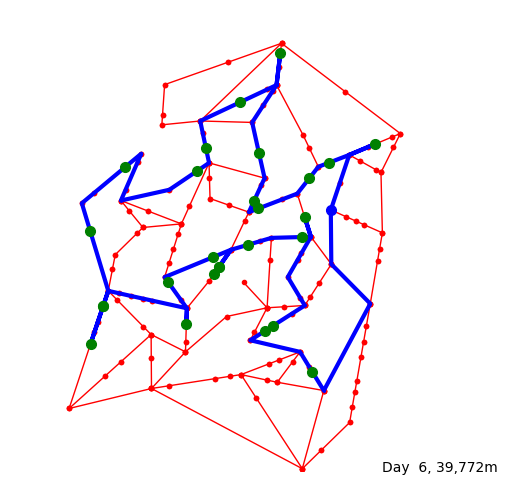

[ 6] 18:25:50.0 Driver leaves for delivery of 31 parcels
[ 6] 18:25:50.0 Driver drives to Customer: 14 (6502, 2145)
[ 6] 18:45:43.8 Driver arrived at Customer: 14 (6502, 2145)
[ 6] 18:46:04.10 Customer: 14 (6502, 2145) answers door
[ 6] 18:46:04.10 Customer: 14 (6502, 2145) accepts Parcel: 163
[ 6] 18:46:14.5 Customer: 14 (6502, 2145) signs off
[ 6] 18:46:30.8 Driver drives to Customer: 23 (5474, 3026)
[ 6] 18:54:23.1 Driver arrived at Customer: 23 (5474, 3026)
[ 6] 18:54:33.5 Customer: 23 (5474, 3026) answers door
[ 6] 18:54:33.5 Customer: 23 (5474, 3026) accepts Parcel: 178
[ 6] 18:54:33.6 Customer: 23 (5474, 3026) signs off
[ 6] 18:54:41.2 Driver drives to Customer: 29 (5661, 3147)
[ 6] 18:55:34.5 Driver arrived at Customer: 29 (5661, 3147)
[ 6] 18:57:27.9 Customer: 29 (5661, 3147) answers door
[ 6] 18:57:27.9 Customer: 29 (5661, 3147) accepts Parcel: 183
[ 6] 18:57:39.3 Customer: 29 (5661, 3147) signs off
[ 6] 18:57:49.3 Driver drives to Customer: 27 (6339, 5488)
[ 6] 19:09:39.9 Dr

[ 7] 08:53:36.6 Parcel: 194 arr at delivery centre
[ 7] 09:01:35.3 Parcel: 195 arr at delivery centre
[ 7] 09:20:20.9 Parcel: 196 arr at delivery centre
[ 7] 09:28:44.8 Parcel: 197 arr at delivery centre
[ 7] 09:45:34.3 Parcel: 198 arr at delivery centre
[ 7] 09:46:18.9 Parcel: 199 arr at delivery centre
[ 7] 09:55:27.2 Parcel: 200 arr at delivery centre
[ 7] 10:00:06.3 Parcel: 201 arr at delivery centre
[ 7] 10:02:45.9 Parcel: 202 arr at delivery centre
[ 7] 10:14:23.4 Parcel: 203 arr at delivery centre
[ 7] 10:24:44.8 Parcel: 204 arr at delivery centre
[ 7] 10:37:31.5 Parcel: 205 arr at delivery centre
[ 7] 10:59:21.7 Parcel: 206 arr at delivery centre
[ 7] 11:32:44.5 Parcel: 207 arr at delivery centre
[ 7] 11:43:19.2 Parcel: 208 arr at delivery centre
[ 7] 11:49:07.1 Parcel: 209 arr at delivery centre
[ 7] 11:58:52.2 Parcel: 210 arr at delivery centre
[ 7] 12:24:32.4 Parcel: 211 arr at delivery centre
[ 7] 12:56:46.8 Parcel: 212 arr at delivery centre
[ 7] 13:22:43.5 Parcel: 213 arr

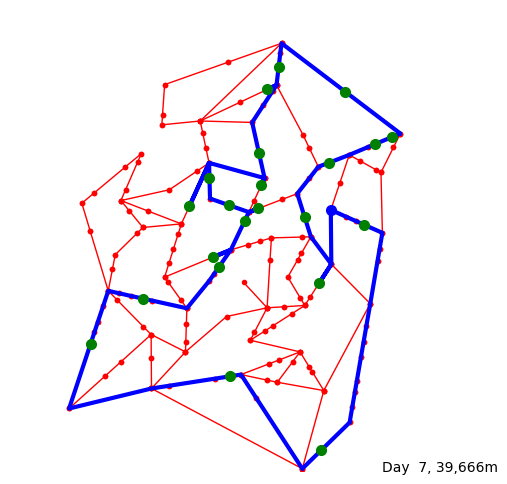

[ 7] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 7] 18:21:40.0 Driver drives to Customer: 28 (6650, 4070)
[ 7] 18:28:17.7 Driver arrived at Customer: 28 (6650, 4070)
[ 7] 18:30:17.3 Customer: 28 (6650, 4070) answers door
[ 7] 18:30:17.3 Customer: 28 (6650, 4070) accepts Parcel: 195
[ 7] 18:30:21.5 Customer: 28 (6650, 4070) signs off
[ 7] 18:30:30.3 Driver drives to Customer: 27 (6339, 5488)
[ 7] 18:37:07.10 Driver arrived at Customer: 27 (6339, 5488)
[ 7] 18:37:11.4 Customer: 27 (6339, 5488) answers door
[ 7] 18:37:11.4 Customer: 27 (6339, 5488) accepts Parcel: 200
[ 7] 18:37:19.6 Customer: 27 (6339, 5488) signs off
[ 7] 18:37:36.4 Driver drives to Customer: 16 (6857, 6672)
[ 7] 18:43:40.7 Driver arrived at Customer: 16 (6857, 6672)
[ 7] 18:43:49.7 Customer: 16 (6857, 6672) answers door
[ 7] 18:43:49.7 Customer: 16 (6857, 6672) accepts Parcel: 201
[ 7] 18:43:52.8 Customer: 16 (6857, 6672) accepts Parcel: 211
[ 7] 18:44:04.8 Customer: 16 (6857, 6672) accepts Parcel: 213
[ 7] 1

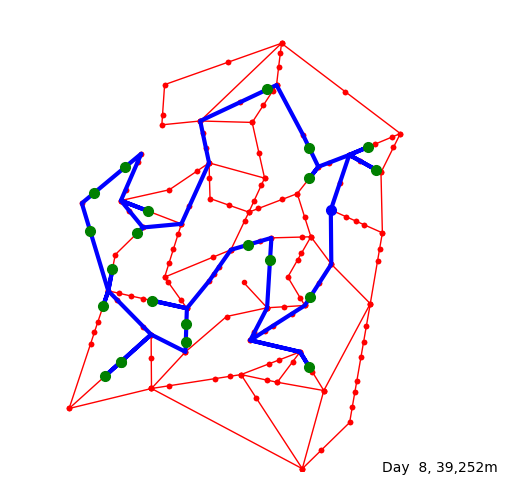

[ 8] 18:20:00.0 Driver leaves for delivery of 24 parcels
[ 8] 18:20:00.0 Driver drives to Customer: 72 (7870, 6521)
[ 8] 18:27:38.4 Driver arrived at Customer: 72 (7870, 6521)
[ 8] 18:28:43.3 Customer: 72 (7870, 6521) answers door
[ 8] 18:28:43.3 Customer: 72 (7870, 6521) accepts Parcel: 225
[ 8] 18:28:45.4 Customer: 72 (7870, 6521) accepts Parcel: 237
[ 8] 18:28:50.3 Customer: 72 (7870, 6521) signs off
[ 8] 18:28:54.7 Driver drives to Customer: 58 (7707, 7015)
[ 8] 18:33:18.9 Driver arrived at Customer: 58 (7707, 7015)
[ 8] 18:33:24.2 Customer: 58 (7707, 7015) answers door
[ 8] 18:33:24.2 Customer: 58 (7707, 7015) accepts Parcel: 233
[ 8] 18:33:28.5 Customer: 58 (7707, 7015) signs off
[ 8] 18:33:30.5 Driver drives to Customer:  9 (6438, 6337)
[ 8] 18:39:23.5 Driver arrived at Customer:  9 (6438, 6337)
[ 8] 18:40:01.8 Customer:  9 (6438, 6337) answers door
[ 8] 18:40:01.8 Customer:  9 (6438, 6337) accepts Parcel: 222
[ 8] 18:40:12.4 Customer:  9 (6438, 6337) signs off
[ 8] 18:40:12.5 D

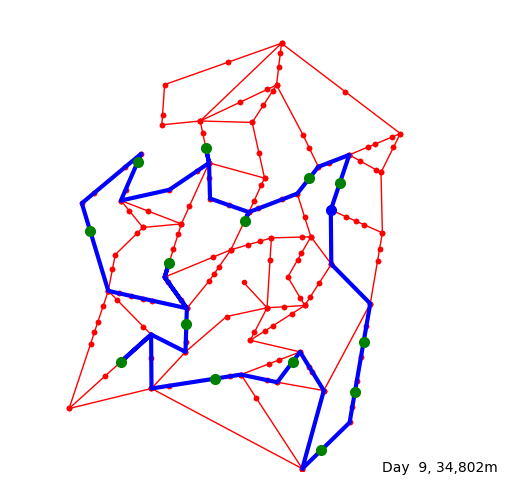

[ 9] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 9] 18:11:40.0 Driver drives to Customer:  8 (7603, 2787)
[ 9] 18:24:32.6 Driver arrived at Customer:  8 (7603, 2787)
[ 9] 18:25:10.4 Customer:  8 (7603, 2787) answers door
[ 9] 18:25:10.4 Customer:  8 (7603, 2787) accepts Parcel: 234
[ 9] 18:25:25.4 Customer:  8 (7603, 2787) signs off
[ 9] 18:25:36.6 Driver drives to Customer: 75 (7416, 1705)
[ 9] 18:29:59.7 Driver arrived at Customer: 75 (7416, 1705)
[ 9] 18:30:18.8 Customer: 75 (7416, 1705) answers door
[ 9] 18:30:18.8 Customer: 75 (7416, 1705) accepts Parcel: 242
[ 9] 18:30:19.1 Customer: 75 (7416, 1705) signs off
[ 9] 18:30:24.8 Driver drives to Customer: 95 (6687, 444)
[ 9] 18:36:31.3 Driver arrived at Customer: 95 (6687, 444)
[ 9] 18:38:09.3 Customer: 95 (6687, 444) answers door
[ 9] 18:38:09.3 Customer: 95 (6687, 444) accepts Parcel: 240
[ 9] 18:38:13.3 Customer: 95 (6687, 444) signs off
[ 9] 18:38:16.2 Driver drives to Customer: 52 (6082, 2369)
[ 9] 18:52:29.1 Driver ar

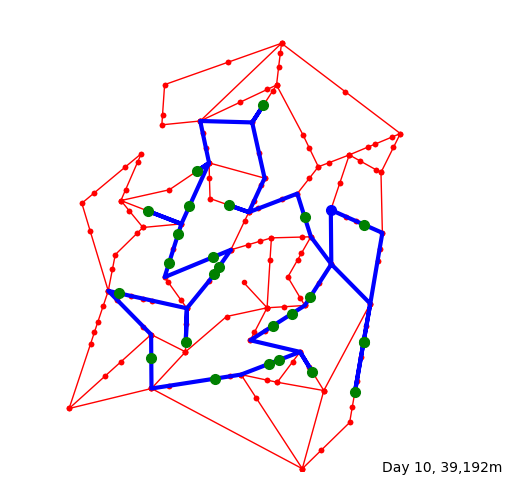

[10] 18:27:30.0 Driver leaves for delivery of 33 parcels
[10] 18:27:30.0 Driver drives to Customer: 93 (7622, 5327)
[10] 18:30:39.8 Driver arrived at Customer: 93 (7622, 5327)
[10] 18:32:01.5 Customer: 93 (7622, 5327) answers door
[10] 18:32:01.5 Customer: 93 (7622, 5327) accepts Parcel: 255
[10] 18:32:06.5 Customer: 93 (7622, 5327) signs off
[10] 18:32:32.4 Driver drives to Customer:  8 (7603, 2787)
[10] 18:43:49.9 Driver arrived at Customer:  8 (7603, 2787)
[10] 18:44:39.8 Customer:  8 (7603, 2787) answers door
[10] 18:44:39.8 Customer:  8 (7603, 2787) accepts Parcel: 270
[10] 18:44:49.1 Customer:  8 (7603, 2787) signs off
[10] 18:44:50.9 Driver drives to Customer: 75 (7416, 1705)
[10] 18:49:13.9 Driver arrived at Customer: 75 (7416, 1705)
[10] 18:49:30.6 Customer: 75 (7416, 1705) answers door
[10] 18:49:30.6 Customer: 75 (7416, 1705) accepts Parcel: 261
[10] 18:49:35.9 Customer: 75 (7416, 1705) accepts Parcel: 272
[10] 18:49:44.8 Customer: 75 (7416, 1705) accepts Parcel: 282
[10] 18

[11] 09:23:47.2 Parcel: 291 arr at delivery centre
[11] 09:52:16.8 Parcel: 292 arr at delivery centre
[11] 10:50:15.1 Parcel: 293 arr at delivery centre
[11] 10:56:46.8 Parcel: 294 arr at delivery centre
[11] 11:06:53.5 Parcel: 295 arr at delivery centre
[11] 11:25:32.2 Parcel: 296 arr at delivery centre
[11] 11:34:09.4 Parcel: 297 arr at delivery centre
[11] 11:39:43.7 Parcel: 298 arr at delivery centre
[11] 12:00:18.2 Parcel: 299 arr at delivery centre
[11] 12:35:09.4 Parcel: 300 arr at delivery centre
[11] 13:14:15.2 Parcel: 301 arr at delivery centre
[11] 13:29:31.9 Parcel: 302 arr at delivery centre
[11] 13:36:49.9 Parcel: 303 arr at delivery centre
[11] 14:33:45.1 Parcel: 304 arr at delivery centre
[11] 14:49:32.5 Parcel: 305 arr at delivery centre
[11] 14:50:35.8 Parcel: 306 arr at delivery centre
[11] 14:51:58.1 Parcel: 307 arr at delivery centre
[11] 15:13:27.1 Parcel: 308 arr at delivery centre
[11] 15:14:25.8 Parcel: 309 arr at delivery centre
[11] 15:14:33.1 Parcel: 310 arr

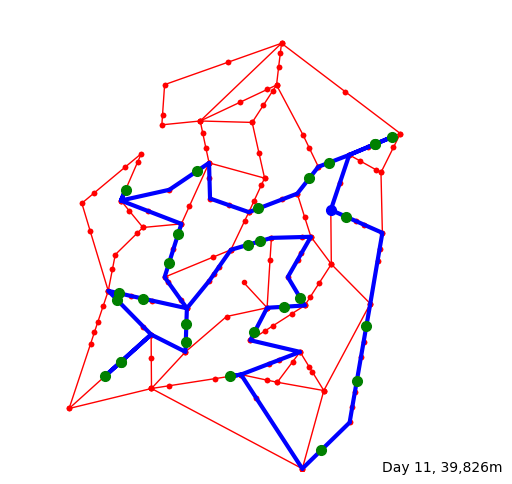

[11] 18:28:20.0 Driver leaves for delivery of 34 parcels
[11] 18:28:20.0 Driver drives to Customer: 21 (7852, 7076)
[11] 18:35:45.4 Driver arrived at Customer: 21 (7852, 7076)
[11] 18:36:26.8 Customer: 21 (7852, 7076) answers door
[11] 18:36:26.8 Customer: 21 (7852, 7076) accepts Parcel: 297
[11] 18:37:06.8 Customer: 21 (7852, 7076) signs off
[11] 18:37:07.10 Driver drives to Customer: 53 (8211, 7227)
[11] 18:38:41.3 Driver arrived at Customer: 53 (8211, 7227)
[11] 18:39:28.0 Customer: 53 (8211, 7227) answers door
[11] 18:39:28.0 Customer: 53 (8211, 7227) accepts Parcel: 314
[11] 18:39:37.5 Customer: 53 (8211, 7227) signs off
[11] 18:39:42.2 Driver drives to Customer: 21 (7852, 7076)
[11] 18:41:15.6 Driver arrived at Customer: 21 (7852, 7076)
[11] 18:42:18.7 Customer: 21 (7852, 7076) answers door
[11] 18:42:18.7 Customer: 21 (7852, 7076) accepts Parcel: 297
[11] 18:42:18.8 Customer: 21 (7852, 7076) signs off
[11] 18:42:41.1 Driver drives to Customer: 16 (6857, 6672)
[11] 18:46:58.4 Dri

[12] 08:36:42.4 Parcel: 322 arr at delivery centre
[12] 08:43:35.4 Parcel: 323 arr at delivery centre
[12] 08:44:36.8 Parcel: 324 arr at delivery centre
[12] 09:15:29.8 Parcel: 325 arr at delivery centre
[12] 09:34:15.10 Parcel: 326 arr at delivery centre
[12] 10:10:26.3 Parcel: 327 arr at delivery centre
[12] 10:19:45.1 Parcel: 328 arr at delivery centre
[12] 10:37:16.1 Parcel: 329 arr at delivery centre
[12] 10:39:13.9 Parcel: 330 arr at delivery centre
[12] 10:47:05.9 Parcel: 331 arr at delivery centre
[12] 10:50:41.9 Parcel: 332 arr at delivery centre
[12] 10:51:21.9 Parcel: 333 arr at delivery centre
[12] 11:37:11.4 Parcel: 334 arr at delivery centre
[12] 11:40:57.6 Parcel: 335 arr at delivery centre
[12] 11:43:24.8 Parcel: 336 arr at delivery centre
[12] 11:46:49.10 Parcel: 337 arr at delivery centre
[12] 11:54:11.7 Parcel: 338 arr at delivery centre
[12] 12:06:26.10 Parcel: 339 arr at delivery centre
[12] 12:08:59.6 Parcel: 340 arr at delivery centre
[12] 18:00:00.0 Driver arriv

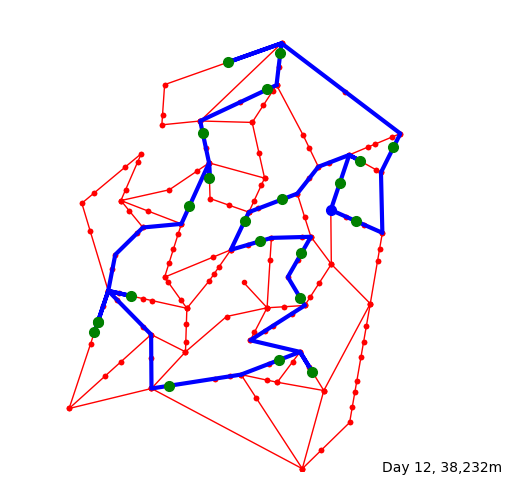

[12] 18:21:40.0 Driver leaves for delivery of 26 parcels
[12] 18:21:40.0 Driver drives to Customer:  7 (7092, 6231)
[12] 18:24:06.4 Driver arrived at Customer:  7 (7092, 6231)
[12] 18:24:23.1 Customer:  7 (7092, 6231) answers door
[12] 18:24:23.1 Customer:  7 (7092, 6231) accepts Parcel: 333
[12] 18:24:23.9 Customer:  7 (7092, 6231) signs off
[12] 18:24:32.4 Driver drives to Customer: 22 (7528, 6712)
[12] 18:28:10.6 Driver arrived at Customer: 22 (7528, 6712)
[12] 18:28:20.8 Customer: 22 (7528, 6712) answers door
[12] 18:28:20.8 Customer: 22 (7528, 6712) accepts Parcel: 318
[12] 18:28:25.4 Customer: 22 (7528, 6712) signs off
[12] 18:28:30.2 Driver drives to Customer:  0 (5854, 5879)
[12] 18:36:44.6 Driver arrived at Customer:  0 (5854, 5879)
[12] 18:37:41.4 Customer:  0 (5854, 5879) answers door
[12] 18:37:41.4 Customer:  0 (5854, 5879) accepts Parcel: 325
[12] 18:37:44.0 Customer:  0 (5854, 5879) accepts Parcel: 329
[12] 18:38:11.5 Customer:  0 (5854, 5879) signs off
[12] 18:38:25.1 D

[13] 17:08:21.6 Parcel: 368 arr at delivery centre
[13] 17:09:43.9 Parcel: 369 arr at delivery centre
[13] 17:41:13.8 Parcel: 370 arr at delivery centre
[13] 18:00:00.0 Driver arrives for work
[13] 18:00:00.0 Parcel: 343 out for delivery
[13] 18:00:00.0 Parcel: 341 out for delivery
[13] 18:00:00.0 Parcel: 346 out for delivery
[13] 18:00:00.0 Parcel: 357 out for delivery
[13] 18:00:00.0 Parcel: 363 out for delivery
[13] 18:00:00.0 Parcel: 353 out for delivery
[13] 18:00:00.0 Parcel: 358 out for delivery
[13] 18:00:00.0 Parcel: 355 out for delivery
[13] 18:00:00.0 Parcel: 366 out for delivery
[13] 18:00:00.0 Parcel: 349 out for delivery
[13] 18:00:00.0 Parcel: 351 out for delivery
[13] 18:00:00.0 Parcel: 360 out for delivery
[13] 18:00:00.0 Parcel: 364 out for delivery
[13] 18:00:00.0 Parcel: 350 out for delivery
[13] 18:00:00.0 Parcel: 369 out for delivery
[13] 18:00:00.0 Parcel: 370 out for delivery
[13] 18:00:00.0 Parcel: 342 out for delivery
[13] 18:00:00.0 Parcel: 348 out for delive

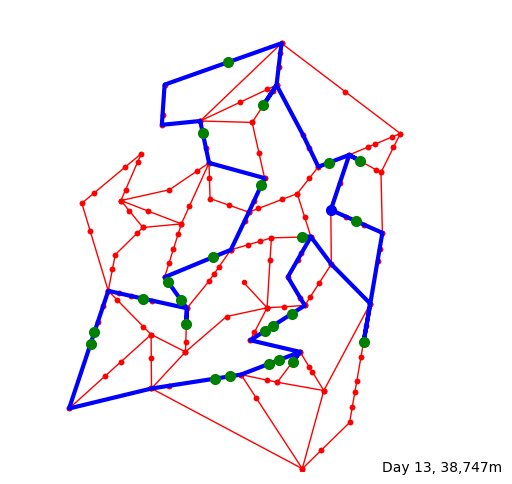

[13] 18:23:20.0 Driver leaves for delivery of 28 parcels
[13] 18:23:20.0 Driver drives to Customer: 73 (7436, 5411)
[13] 18:25:40.9 Driver arrived at Customer: 73 (7436, 5411)
[13] 18:25:49.8 Customer: 73 (7436, 5411) answers door
[13] 18:25:49.8 Customer: 73 (7436, 5411) accepts Parcel: 343
[13] 18:26:03.3 Customer: 73 (7436, 5411) signs off
[13] 18:26:05.5 Driver drives to Customer:  8 (7603, 2787)
[13] 18:38:11.10 Driver arrived at Customer:  8 (7603, 2787)
[13] 18:38:12.0 Customer:  8 (7603, 2787) answers door
[13] 18:38:12.0 Customer:  8 (7603, 2787) accepts Parcel: 341
[13] 18:38:34.7 Customer:  8 (7603, 2787) signs off
[13] 18:38:53.4 Driver drives to Customer: 61 (6282, 5064)
[13] 18:50:46.2 Driver arrived at Customer: 61 (6282, 5064)
[13] 18:50:48.10 Customer: 61 (6282, 5064) answers door
[13] 18:50:48.10 Customer: 61 (6282, 5064) accepts Parcel: 346
[13] 18:50:50.9 Customer: 61 (6282, 5064) signs off
[13] 18:50:53.6 Driver drives to Customer: 13 (6067, 3408)
[13] 18:59:48.8 D

[14] 12:11:39.2 Parcel: 387 arr at delivery centre
[14] 13:23:53.8 Parcel: 388 arr at delivery centre
[14] 13:45:12.1 Parcel: 389 arr at delivery centre
[14] 14:21:49.4 Parcel: 390 arr at delivery centre
[14] 14:25:24.1 Parcel: 391 arr at delivery centre
[14] 14:37:17.2 Parcel: 392 arr at delivery centre
[14] 14:51:26.3 Parcel: 393 arr at delivery centre
[14] 15:18:31.3 Parcel: 394 arr at delivery centre
[14] 15:28:43.6 Parcel: 395 arr at delivery centre
[14] 15:52:59.9 Parcel: 396 arr at delivery centre
[14] 18:00:00.0 Driver arrives for work
[14] 18:00:00.0 Parcel: 385 out for delivery
[14] 18:00:00.0 Parcel: 394 out for delivery
[14] 18:00:00.0 Parcel: 381 out for delivery
[14] 18:00:00.0 Parcel: 368 out for delivery
[14] 18:00:00.0 Parcel: 378 out for delivery
[14] 18:00:00.0 Parcel: 386 out for delivery
[14] 18:00:00.0 Parcel: 375 out for delivery
[14] 18:00:00.0 Parcel: 388 out for delivery
[14] 18:00:00.0 Parcel: 390 out for delivery
[14] 18:00:00.0 Parcel: 367 out for delivery


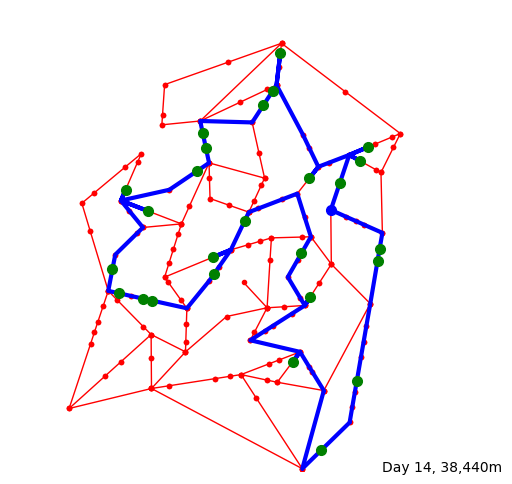

[14] 18:23:20.0 Driver leaves for delivery of 28 parcels
[14] 18:23:20.0 Driver drives to Customer: 45 (7949, 4811)
[14] 18:29:34.9 Driver arrived at Customer: 45 (7949, 4811)
[14] 18:30:40.3 Customer: 45 (7949, 4811) answers door
[14] 18:30:40.3 Customer: 45 (7949, 4811) accepts Parcel: 385
[14] 18:30:54.8 Customer: 45 (7949, 4811) signs off
[14] 18:31:01.1 Driver drives to Customer: 20 (7904, 4546)
[14] 18:32:05.5 Driver arrived at Customer: 20 (7904, 4546)
[14] 18:32:50.8 Customer: 20 (7904, 4546) answers door
[14] 18:32:50.8 Customer: 20 (7904, 4546) accepts Parcel: 394
[14] 18:32:56.1 Customer: 20 (7904, 4546) signs off
[14] 18:32:58.2 Driver drives to Customer: 41 (7458, 1945)
[14] 18:43:31.1 Driver arrived at Customer: 41 (7458, 1945)
[14] 18:43:50.9 Customer: 41 (7458, 1945) answers door
[14] 18:43:50.9 Customer: 41 (7458, 1945) accepts Parcel: 381
[14] 18:44:06.4 Customer: 41 (7458, 1945) signs off
[14] 18:44:22.6 Driver drives to Customer: 95 (6687, 444)
[14] 18:51:27.4 Drive

[15] 09:50:52.10 Parcel: 405 arr at delivery centre
[15] 09:51:56.1 Parcel: 406 arr at delivery centre
[15] 10:22:24.2 Parcel: 407 arr at delivery centre
[15] 11:06:48.1 Parcel: 408 arr at delivery centre
[15] 11:12:23.6 Parcel: 409 arr at delivery centre
[15] 11:20:31.4 Parcel: 410 arr at delivery centre
[15] 11:46:16.4 Parcel: 411 arr at delivery centre
[15] 11:47:16.2 Parcel: 412 arr at delivery centre
[15] 12:03:09.1 Parcel: 413 arr at delivery centre
[15] 12:05:15.8 Parcel: 414 arr at delivery centre
[15] 12:10:30.6 Parcel: 415 arr at delivery centre
[15] 12:37:58.6 Parcel: 416 arr at delivery centre
[15] 12:38:51.7 Parcel: 417 arr at delivery centre
[15] 12:39:25.7 Parcel: 418 arr at delivery centre
[15] 12:47:49.0 Parcel: 419 arr at delivery centre
[15] 12:58:18.7 Parcel: 420 arr at delivery centre
[15] 13:29:09.9 Parcel: 421 arr at delivery centre
[15] 13:48:44.7 Parcel: 422 arr at delivery centre
[15] 14:06:06.0 Parcel: 423 arr at delivery centre
[15] 18:00:00.0 Driver arrives

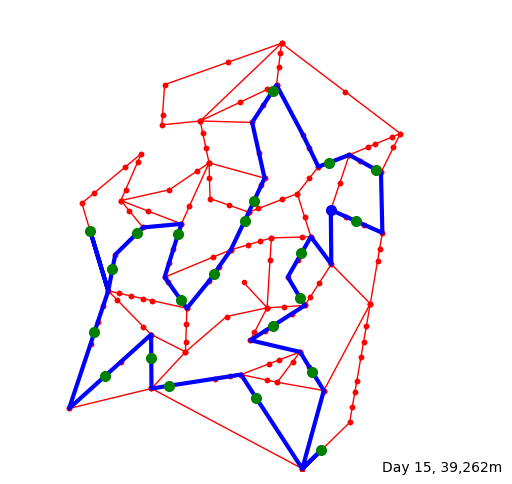

[15] 18:20:50.0 Driver leaves for delivery of 25 parcels
[15] 18:20:50.0 Driver drives to Customer: 97 (6268, 4714)
[15] 18:30:07.0 Driver arrived at Customer: 97 (6268, 4714)
[15] 18:31:03.7 Customer: 97 (6268, 4714) answers door
[15] 18:31:03.7 Customer: 97 (6268, 4714) accepts Parcel: 410
[15] 18:31:07.4 Customer: 97 (6268, 4714) signs off
[15] 18:31:21.1 Driver drives to Customer: 56 (6245, 3741)
[15] 18:35:50.8 Driver arrived at Customer: 56 (6245, 3741)
[15] 18:36:49.2 Customer: 56 (6245, 3741) answers door
[15] 18:36:49.2 Customer: 56 (6245, 3741) accepts Parcel: 401
[15] 18:36:51.9 Customer: 56 (6245, 3741) signs off
[15] 18:37:26.3 Driver drives to Customer: 29 (5661, 3147)
[15] 18:41:23.9 Driver arrived at Customer: 29 (5661, 3147)
[15] 18:41:25.0 Customer: 29 (5661, 3147) answers door
[15] 18:41:25.0 Customer: 29 (5661, 3147) accepts Parcel: 407
[15] 18:41:44.10 Customer: 29 (5661, 3147) signs off
[15] 18:41:52.1 Driver drives to Customer: 14 (6502, 2145)
[15] 18:50:37.7 Dri

[16] 18:00:00.0 Driver arrives for work
[16] 18:00:00.0 Parcel: 432 out for delivery
[16] 18:00:00.0 Parcel: 435 out for delivery
[16] 18:00:00.0 Parcel: 428 out for delivery
[16] 18:00:00.0 Parcel: 439 out for delivery
[16] 18:00:00.0 Parcel: 440 out for delivery
[16] 18:00:00.0 Parcel: 448 out for delivery
[16] 18:00:00.0 Parcel: 431 out for delivery
[16] 18:00:00.0 Parcel: 434 out for delivery
[16] 18:00:00.0 Parcel: 425 out for delivery
[16] 18:00:00.0 Parcel: 444 out for delivery
[16] 18:00:00.0 Parcel: 430 out for delivery
[16] 18:00:00.0 Parcel: 436 out for delivery
[16] 18:00:00.0 Parcel: 429 out for delivery
[16] 18:00:00.0 Parcel: 449 out for delivery
[16] 18:00:00.0 Parcel: 442 out for delivery
[16] 18:00:00.0 Parcel: 441 out for delivery
[16] 18:00:00.0 Parcel: 445 out for delivery
[16] 18:00:00.0 Parcel: 450 out for delivery
[16] 18:00:00.0 Parcel: 426 out for delivery
[16] 18:00:00.0 Parcel: 424 out for delivery
[16] 18:00:00.0 Parcel: 433 out for delivery
[16] 18:00:00.0

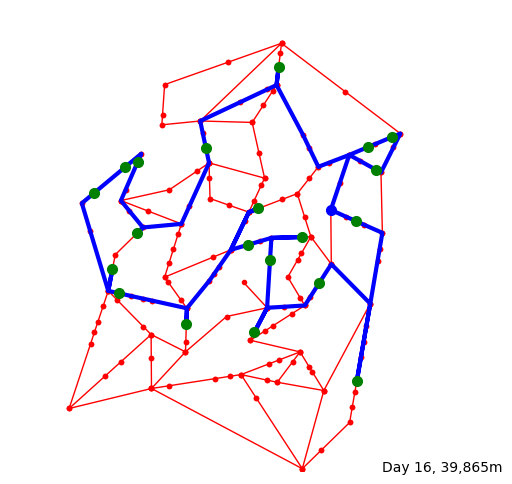

[16] 18:24:10.0 Driver leaves for delivery of 29 parcels
[16] 18:24:10.0 Driver drives to Customer: 73 (7436, 5411)
[16] 18:26:30.9 Driver arrived at Customer: 73 (7436, 5411)
[16] 18:30:07.5 Customer: 73 (7436, 5411) answers door
[16] 18:30:07.5 Customer: 73 (7436, 5411) accepts Parcel: 432
[16] 18:30:19.4 Customer: 73 (7436, 5411) accepts Parcel: 435
[16] 18:30:52.0 Customer: 73 (7436, 5411) signs off
[16] 18:30:57.1 Driver drives to Customer: 41 (7458, 1945)
[16] 18:46:28.3 Driver arrived at Customer: 41 (7458, 1945)
[16] 18:47:05.9 Customer: 41 (7458, 1945) answers door
[16] 18:47:05.9 Customer: 41 (7458, 1945) accepts Parcel: 428
[16] 18:47:19.5 Customer: 41 (7458, 1945) accepts Parcel: 439
[16] 18:47:23.8 Customer: 41 (7458, 1945) signs off
[16] 18:47:26.9 Driver drives to Customer: 28 (6650, 4070)
[16] 19:00:57.9 Driver arrived at Customer: 28 (6650, 4070)
[16] 19:03:22.1 Customer: 28 (6650, 4070) answers door
[16] 19:03:22.1 Customer: 28 (6650, 4070) accepts Parcel: 440
[16] 19

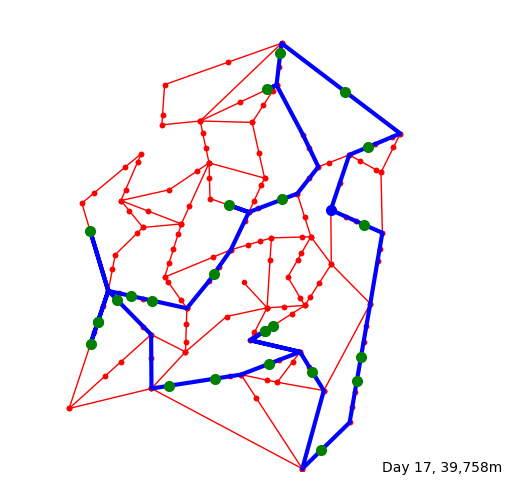

[17] 18:23:20.0 Driver leaves for delivery of 28 parcels
[17] 18:23:20.0 Driver drives to Customer: 58 (7707, 7015)
[17] 18:30:07.8 Driver arrived at Customer: 58 (7707, 7015)
[17] 18:31:13.8 Customer: 58 (7707, 7015) answers door
[17] 18:31:13.8 Customer: 58 (7707, 7015) accepts Parcel: 469
[17] 18:31:18.6 Customer: 58 (7707, 7015) signs off
[17] 18:31:21.3 Driver drives to Customer: 85 (7212, 8208)
[17] 18:40:17.2 Driver arrived at Customer: 85 (7212, 8208)
[17] 18:40:31.10 Customer: 85 (7212, 8208) answers door
[17] 18:40:31.10 Customer: 85 (7212, 8208) accepts Parcel: 466
[17] 18:40:49.4 Customer: 85 (7212, 8208) signs off
[17] 18:41:12.8 Driver drives to Customer: 15 (5813, 9044)
[17] 18:48:59.2 Driver arrived at Customer: 15 (5813, 9044)
[17] 18:51:08.2 Customer: 15 (5813, 9044) answers door
[17] 18:51:08.2 Customer: 15 (5813, 9044) accepts Parcel: 465
[17] 18:51:08.4 Customer: 15 (5813, 9044) signs off
[17] 18:51:22.4 Driver drives to Customer: 78 (5534, 8260)
[17] 18:55:01.5 Dr

[18] 11:12:31.4 Parcel: 492 arr at delivery centre
[18] 11:12:59.9 Parcel: 493 arr at delivery centre
[18] 11:52:00.10 Parcel: 494 arr at delivery centre
[18] 12:42:48.9 Parcel: 495 arr at delivery centre
[18] 13:02:41.5 Parcel: 496 arr at delivery centre
[18] 13:03:57.6 Parcel: 497 arr at delivery centre
[18] 13:05:05.4 Parcel: 498 arr at delivery centre
[18] 13:11:59.5 Parcel: 499 arr at delivery centre
[18] 13:12:27.2 Parcel: 500 arr at delivery centre
[18] 13:19:04.9 Parcel: 501 arr at delivery centre
[18] 13:19:14.2 Parcel: 502 arr at delivery centre
[18] 14:16:00.8 Parcel: 503 arr at delivery centre
[18] 14:42:30.8 Parcel: 504 arr at delivery centre
[18] 14:43:38.8 Parcel: 505 arr at delivery centre
[18] 15:18:21.5 Parcel: 506 arr at delivery centre
[18] 15:21:58.4 Parcel: 507 arr at delivery centre
[18] 15:25:31.6 Parcel: 508 arr at delivery centre
[18] 15:42:53.5 Parcel: 509 arr at delivery centre
[18] 16:26:03.10 Parcel: 510 arr at delivery centre
[18] 16:28:06.3 Parcel: 511 a

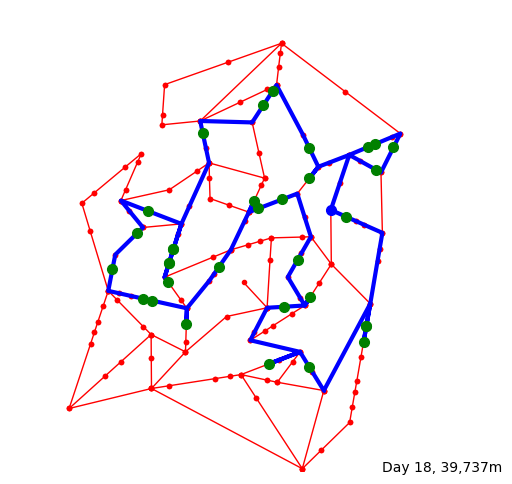

[18] 18:33:20.0 Driver leaves for delivery of 40 parcels
[18] 18:33:20.0 Driver drives to Customer: 58 (7707, 7015)
[18] 18:40:07.8 Driver arrived at Customer: 58 (7707, 7015)
[18] 18:40:13.5 Customer: 58 (7707, 7015) answers door
[18] 18:40:13.5 Customer: 58 (7707, 7015) accepts Parcel: 492
[18] 18:40:23.4 Customer: 58 (7707, 7015) signs off
[18] 18:40:30.5 Driver drives to Customer: 21 (7852, 7076)
[18] 18:41:08.2 Driver arrived at Customer: 21 (7852, 7076)
[18] 18:41:08.7 Customer: 21 (7852, 7076) answers door
[18] 18:41:08.7 Customer: 21 (7852, 7076) accepts Parcel: 506
[18] 18:41:10.3 Customer: 21 (7852, 7076) signs off
[18] 18:41:21.3 Driver drives to Customer: 63 (8247, 7006)
[18] 18:45:02.1 Driver arrived at Customer: 63 (8247, 7006)
[18] 18:45:20.4 Customer: 63 (8247, 7006) answers door
[18] 18:45:20.4 Customer: 63 (8247, 7006) accepts Parcel: 504
[18] 18:45:53.6 Customer: 63 (8247, 7006) accepts Parcel: 514
[18] 18:46:00.6 Customer: 63 (8247, 7006) signs off
[18] 18:46:12.2 D

[19] 08:56:23.4 Parcel: 519 arr at delivery centre
[19] 09:45:58.5 Parcel: 520 arr at delivery centre
[19] 09:48:08.2 Parcel: 521 arr at delivery centre
[19] 10:40:47.9 Parcel: 522 arr at delivery centre
[19] 10:47:46.3 Parcel: 523 arr at delivery centre
[19] 10:57:42.8 Parcel: 524 arr at delivery centre
[19] 11:03:04.8 Parcel: 525 arr at delivery centre
[19] 11:45:58.3 Parcel: 526 arr at delivery centre
[19] 12:35:10.4 Parcel: 527 arr at delivery centre
[19] 12:50:50.2 Parcel: 528 arr at delivery centre
[19] 12:53:59.4 Parcel: 529 arr at delivery centre
[19] 14:10:48.5 Parcel: 530 arr at delivery centre
[19] 14:12:29.2 Parcel: 531 arr at delivery centre
[19] 14:25:57.10 Parcel: 532 arr at delivery centre
[19] 14:28:36.2 Parcel: 533 arr at delivery centre
[19] 15:03:56.7 Parcel: 534 arr at delivery centre
[19] 15:49:06.2 Parcel: 535 arr at delivery centre
[19] 16:14:23.9 Parcel: 536 arr at delivery centre
[19] 16:20:16.10 Parcel: 537 arr at delivery centre
[19] 16:24:35.8 Parcel: 538 a

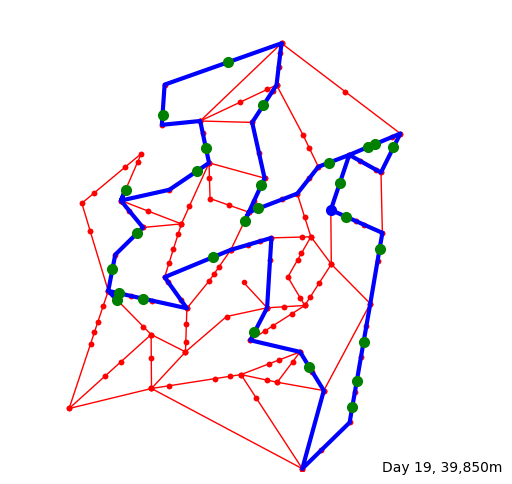

[19] 18:26:40.0 Driver leaves for delivery of 32 parcels
[19] 18:26:40.0 Driver drives to Customer: 79 (7227, 5504)
[19] 18:28:06.2 Driver arrived at Customer: 79 (7227, 5504)
[19] 18:28:22.7 Customer: 79 (7227, 5504) answers door
[19] 18:28:22.7 Customer: 79 (7227, 5504) accepts Parcel: 515
[19] 18:28:24.2 Customer: 79 (7227, 5504) signs off
[19] 18:29:02.8 Driver drives to Customer: 45 (7949, 4811)
[19] 18:33:51.6 Driver arrived at Customer: 45 (7949, 4811)
[19] 18:34:34.4 Customer: 45 (7949, 4811) answers door
[19] 18:34:34.4 Customer: 45 (7949, 4811) accepts Parcel: 526
[19] 18:34:37.6 Customer: 45 (7949, 4811) signs off
[19] 18:35:15.3 Driver drives to Customer:  8 (7603, 2787)
[19] 18:43:27.8 Driver arrived at Customer:  8 (7603, 2787)
[19] 18:44:05.4 Customer:  8 (7603, 2787) answers door
[19] 18:44:05.4 Customer:  8 (7603, 2787) accepts Parcel: 528
[19] 18:44:09.4 Customer:  8 (7603, 2787) signs off
[19] 18:44:32.0 Driver drives to Customer: 41 (7458, 1945)
[19] 18:47:56.7 Driv

[20] 08:22:02.1 Parcel: 548 arr at delivery centre
[20] 08:42:58.3 Parcel: 549 arr at delivery centre
[20] 08:45:21.1 Parcel: 550 arr at delivery centre
[20] 08:53:51.3 Parcel: 551 arr at delivery centre
[20] 09:09:33.8 Parcel: 552 arr at delivery centre
[20] 09:10:55.10 Parcel: 553 arr at delivery centre
[20] 09:20:03.4 Parcel: 554 arr at delivery centre
[20] 09:27:12.1 Parcel: 555 arr at delivery centre
[20] 10:13:19.1 Parcel: 556 arr at delivery centre
[20] 10:14:14.5 Parcel: 557 arr at delivery centre
[20] 10:22:23.1 Parcel: 558 arr at delivery centre
[20] 10:30:45.4 Parcel: 559 arr at delivery centre
[20] 10:50:57.1 Parcel: 560 arr at delivery centre
[20] 10:56:56.8 Parcel: 561 arr at delivery centre
[20] 11:00:28.10 Parcel: 562 arr at delivery centre
[20] 11:05:51.9 Parcel: 563 arr at delivery centre
[20] 11:15:43.10 Parcel: 564 arr at delivery centre
[20] 12:02:15.6 Parcel: 565 arr at delivery centre
[20] 12:26:56.6 Parcel: 566 arr at delivery centre
[20] 12:31:58.3 Parcel: 567 

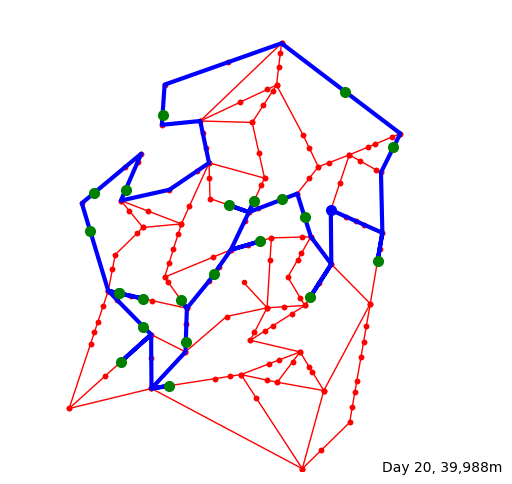

[20] 18:20:50.0 Driver leaves for delivery of 25 parcels
[20] 18:20:50.0 Driver drives to Customer: 20 (7904, 4546)
[20] 18:28:09.2 Driver arrived at Customer: 20 (7904, 4546)
[20] 18:30:00.6 Customer: 20 (7904, 4546) answers door
[20] 18:30:00.6 Customer: 20 (7904, 4546) accepts Parcel: 547
[20] 18:30:01.8 Customer: 20 (7904, 4546) accepts Parcel: 554
[20] 18:30:05.9 Customer: 20 (7904, 4546) signs off
[20] 18:30:19.4 Driver drives to Customer: 63 (8247, 7006)
[20] 18:40:26.6 Driver arrived at Customer: 63 (8247, 7006)
[20] 18:40:42.2 Customer: 63 (8247, 7006) answers door
[20] 18:40:42.2 Customer: 63 (8247, 7006) accepts Parcel: 552
[20] 18:40:43.7 Customer: 63 (8247, 7006) signs off
[20] 18:40:52.4 Driver drives to Customer: 85 (7212, 8208)
[20] 18:48:09.2 Driver arrived at Customer: 85 (7212, 8208)
[20] 18:48:11.8 Customer: 85 (7212, 8208) answers door
[20] 18:48:11.8 Customer: 85 (7212, 8208) accepts Parcel: 562
[20] 18:48:16.4 Customer: 85 (7212, 8208) signs off
[20] 18:48:19.4 D

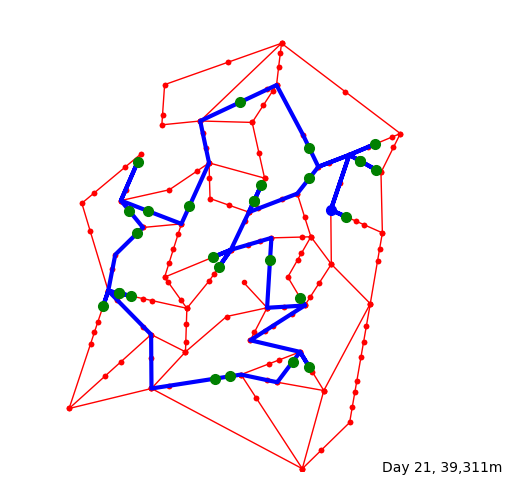

[21] 18:24:10.0 Driver leaves for delivery of 29 parcels
[21] 18:24:10.0 Driver drives to Customer: 22 (7528, 6712)
[21] 18:30:14.6 Driver arrived at Customer: 22 (7528, 6712)
[21] 18:31:00.6 Customer: 22 (7528, 6712) answers door
[21] 18:31:00.6 Customer: 22 (7528, 6712) accepts Parcel: 577
[21] 18:31:19.4 Customer: 22 (7528, 6712) signs off
[21] 18:31:34.7 Driver drives to Customer: 72 (7870, 6521)
[21] 18:33:08.5 Driver arrived at Customer: 72 (7870, 6521)
[21] 18:33:15.5 Customer: 72 (7870, 6521) answers door
[21] 18:33:15.5 Customer: 72 (7870, 6521) accepts Parcel: 583
[21] 18:33:15.10 Customer: 72 (7870, 6521) signs off
[21] 18:33:29.4 Driver drives to Customer: 22 (7528, 6712)
[21] 18:35:03.3 Driver arrived at Customer: 22 (7528, 6712)
[21] 18:35:33.1 Customer: 22 (7528, 6712) answers door
[21] 18:35:33.1 Customer: 22 (7528, 6712) accepts Parcel: 577
[21] 18:36:34.6 Customer: 22 (7528, 6712) signs off
[21] 18:36:36.4 Driver drives to Customer: 21 (7852, 7076)
[21] 18:40:04.5 Dri

In [146]:
random.seed(0)
recP6R40 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [147]:
standardMeasureConverter(recP6R40.daily)

### Simulation Records

In [148]:
recP6R40.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,78015,39.825,220.25,3,NaN
1,151200,163954,39.996,212.566667,10,1.470818
2,237600,250166,39.394,209.433333,3,1.25928
3,324000,336194,39.175,203.233333,1,1.35821
4,410400,423231,39.854,213.85,3,1.134583
5,496800,510556,39.5,229.266667,1,1.221211
6,583200,596438,39.772,220.633333,3,1.199502
7,669600,682371,39.666,212.85,6,1.28162
8,756000,768404,39.252,206.733333,1,1.281674
9,842400,852881,34.802,174.683333,0,1.293032


### Time Plot

In [149]:
np.mean(recP6R40.daily['Working Time (in minutes)'])

215.33636363636367

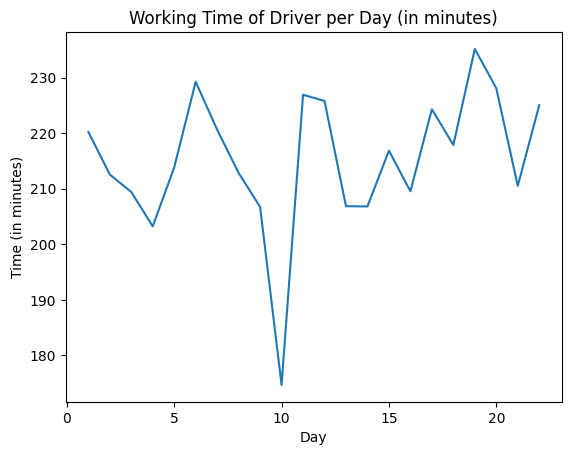

In [150]:
timePlot = plt.plot(recP6R40.daily.index +1 ,recP6R40.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [151]:
np.mean(recP6R40.daily['Delivery Route Distance(in km)'])

39.24745454545455

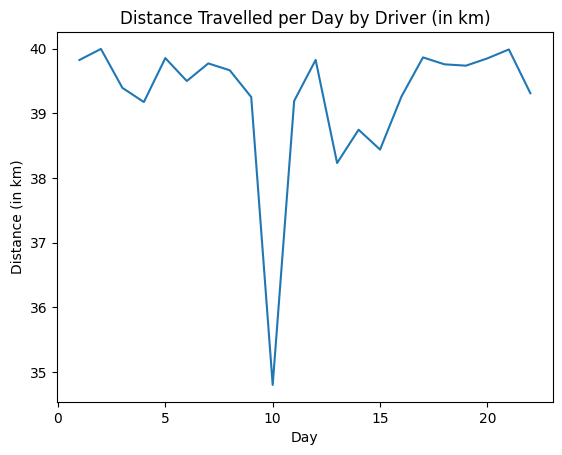

In [152]:
distancePlot = plt.plot(recP6R40.daily.index +1 ,recP6R40.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [153]:
np.mean(recP6R40.daily['Number of left over parcels'])

2.3636363636363638

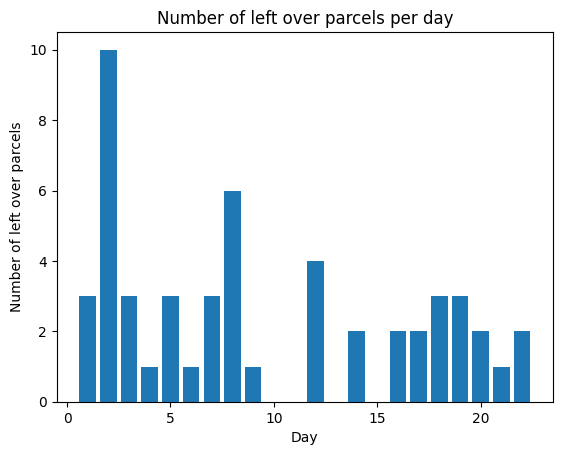

In [154]:
leftOverPlot = plt.bar(recP6R40.daily.index +1 ,recP6R40.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [155]:
np.mean(recP6R40.daily['Delay Time(in days)'])

1.2697699142156864

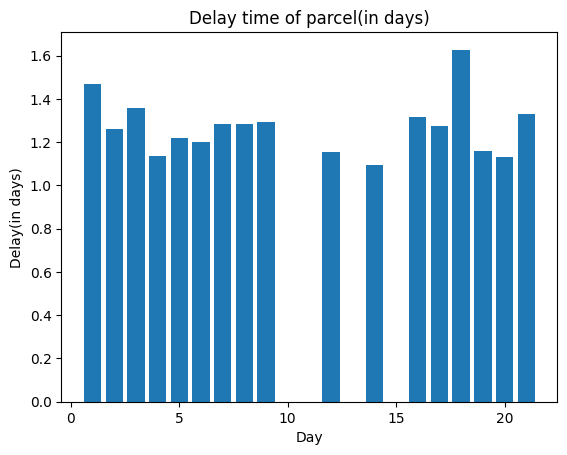

In [156]:
delayPlot = plt.bar(recP6R40.daily.index ,recP6R40.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

# Scenario 7

Suppose due to high demand in sales the average number of parcels per customer inclines to 6 and speed of 30Km/hr

In [157]:
AVERAGE_SPEED = 30/3.6

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 594 deliveries over 22 days.


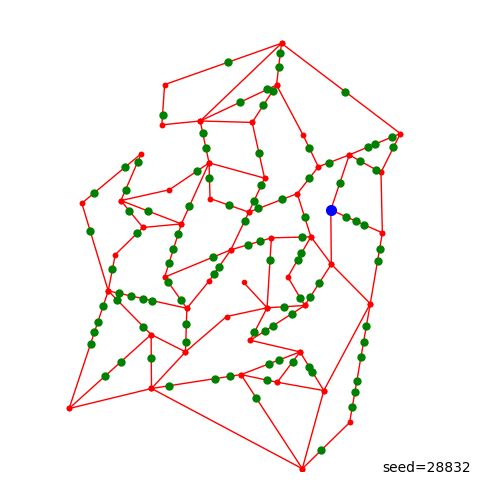

In [158]:
data = generateData(28832, p = 6, plot=True, log=True)

## Storing generated data into the pickle file

In [159]:
with open('dataSeed28832P6R40S30.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [160]:
with open('dataSeed28832P6R40S30.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 596 parcels over 22 days to 100 customers
[ 0] 08:28:50.7 Parcel:  0 arr at delivery centre
[ 0] 08:50:50.3 Parcel:  1 arr at delivery centre
[ 0] 08:59:17.9 Parcel:  2 arr at delivery centre
[ 0] 09:03:56.6 Parcel:  3 arr at delivery centre
[ 0] 09:15:02.6 Parcel:  4 arr at delivery centre
[ 0] 09:23:05.5 Parcel:  5 arr at delivery centre
[ 0] 09:46:50.1 Parcel:  6 arr at delivery centre
[ 0] 09:52:26.3 Parcel:  7 arr at delivery centre
[ 0] 10:02:28.5 Parcel:  8 arr at delivery centre
[ 0] 10:16:02.10 Parcel:  9 arr at delivery centre
[ 0] 10:53:03.6 Parcel: 10 arr at delivery centre
[ 0] 11:03:57.1 Parcel: 11 arr at delivery centre
[ 0] 11:09:05.1 Parcel: 12 arr at delivery centre
[ 0] 11:30:56.5 Parcel: 13 arr at delivery centre
[ 0] 11:45:52.6 Parcel: 14 arr at delivery centre
[ 0] 11:50:20.8 Parcel: 15 arr at delivery centre
[ 0] 12:27:38.1 Parcel: 16 arr at delivery centre
[ 0] 13:30:36.6 Parcel: 17 arr at delivery centre
[ 0] 13:56:22.5 Parcel: 18 arr at 

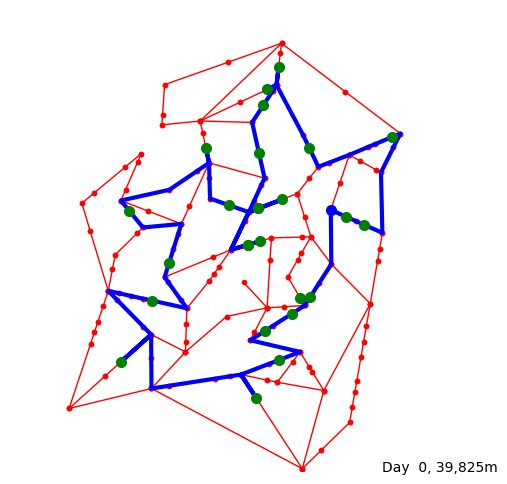

[ 0] 18:07:27.4 Parcel: 30 arr at delivery centre
[ 0] 18:25:00.0 Driver leaves for delivery of 30 parcels
[ 0] 18:25:00.0 Driver drives to Customer: 79 (7227, 5504)
[ 0] 18:25:43.1 Driver arrived at Customer: 79 (7227, 5504)
[ 0] 18:25:53.7 Customer: 79 (7227, 5504) answers door
[ 0] 18:25:53.7 Customer: 79 (7227, 5504) accepts Parcel: 17
[ 0] 18:26:08.0 Customer: 79 (7227, 5504) signs off
[ 0] 18:26:11.3 Driver drives to Customer: 93 (7622, 5327)
[ 0] 18:27:03.1 Driver arrived at Customer: 93 (7622, 5327)
[ 0] 18:29:48.6 Customer: 93 (7622, 5327) answers door
[ 0] 18:29:48.6 Customer: 93 (7622, 5327) accepts Parcel:  6
[ 0] 18:29:49.9 Customer: 93 (7622, 5327) signs off
[ 0] 18:30:11.4 Driver drives to Customer: 53 (8211, 7227)
[ 0] 18:35:55.3 Driver arrived at Customer: 53 (8211, 7227)
[ 0] 18:35:56.10 Customer: 53 (8211, 7227) answers door
[ 0] 18:35:56.10 Customer: 53 (8211, 7227) accepts Parcel:  2
[ 0] 18:35:59.9 Customer: 53 (8211, 7227) accepts Parcel: 11
[ 0] 18:36:07.4 Custo

[ 1] 09:33:22.7 Parcel: 36 arr at delivery centre
[ 1] 09:41:16.0 Parcel: 37 arr at delivery centre
[ 1] 10:08:16.5 Parcel: 38 arr at delivery centre
[ 1] 10:25:22.6 Parcel: 39 arr at delivery centre
[ 1] 10:25:23.7 Parcel: 40 arr at delivery centre
[ 1] 10:35:56.6 Parcel: 41 arr at delivery centre
[ 1] 11:07:17.4 Parcel: 42 arr at delivery centre
[ 1] 11:11:37.5 Parcel: 43 arr at delivery centre
[ 1] 11:17:43.4 Parcel: 44 arr at delivery centre
[ 1] 11:49:24.6 Parcel: 45 arr at delivery centre
[ 1] 11:52:41.8 Parcel: 46 arr at delivery centre
[ 1] 12:05:41.5 Parcel: 47 arr at delivery centre
[ 1] 12:09:55.1 Parcel: 48 arr at delivery centre
[ 1] 13:03:03.6 Parcel: 49 arr at delivery centre
[ 1] 13:28:15.6 Parcel: 50 arr at delivery centre
[ 1] 13:37:28.3 Parcel: 51 arr at delivery centre
[ 1] 13:38:46.3 Parcel: 52 arr at delivery centre
[ 1] 13:44:45.1 Parcel: 53 arr at delivery centre
[ 1] 13:55:44.8 Parcel: 54 arr at delivery centre
[ 1] 14:37:36.9 Parcel: 55 arr at delivery centre


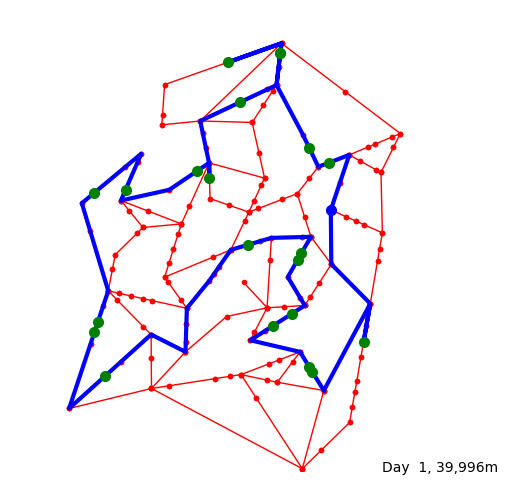

[ 1] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 1] 18:21:40.0 Driver drives to Customer: 16 (6857, 6672)
[ 1] 18:25:06.9 Driver arrived at Customer: 16 (6857, 6672)
[ 1] 18:26:37.9 Customer: 16 (6857, 6672) answers door
[ 1] 18:26:37.9 Customer: 16 (6857, 6672) accepts Parcel: 62
[ 1] 18:26:43.6 Customer: 16 (6857, 6672) signs off
[ 1] 18:26:49.5 Driver drives to Customer:  3 (6435, 6994)
[ 1] 18:28:12.9 Driver arrived at Customer:  3 (6435, 6994)
[ 1] 18:29:02.3 Customer:  3 (6435, 6994) answers door
[ 1] 18:29:02.3 Customer:  3 (6435, 6994) accepts Parcel: 54
[ 1] 18:29:09.7 Customer:  3 (6435, 6994) signs off
[ 1] 18:29:11.1 Driver drives to Customer: 15 (5813, 9044)
[ 1] 18:33:37.10 Driver arrived at Customer: 15 (5813, 9044)
[ 1] 18:35:14.5 Customer: 15 (5813, 9044) answers door
[ 1] 18:35:14.5 Customer: 15 (5813, 9044) accepts Parcel: 30
[ 1] 18:35:20.3 Customer: 15 (5813, 9044) signs off
[ 1] 18:35:35.9 Driver drives to Customer: 24 (4686, 8847)
[ 1] 18:38:28.6 Driver

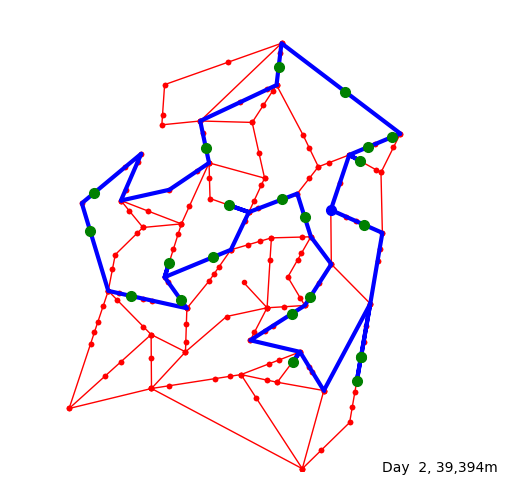

[ 2] 18:22:30.0 Driver leaves for delivery of 27 parcels
[ 2] 18:22:30.0 Driver drives to Customer: 22 (7528, 6712)
[ 2] 18:25:32.3 Driver arrived at Customer: 22 (7528, 6712)
[ 2] 18:26:16.10 Customer: 22 (7528, 6712) answers door
[ 2] 18:26:16.10 Customer: 22 (7528, 6712) accepts Parcel: 75
[ 2] 18:26:30.3 Customer: 22 (7528, 6712) signs off
[ 2] 18:26:33.10 Driver drives to Customer: 58 (7707, 7015)
[ 2] 18:27:59.2 Driver arrived at Customer: 58 (7707, 7015)
[ 2] 18:29:17.8 Customer: 58 (7707, 7015) answers door
[ 2] 18:29:17.8 Customer: 58 (7707, 7015) accepts Parcel: 56
[ 2] 18:29:20.8 Customer: 58 (7707, 7015) signs off
[ 2] 18:29:24.10 Driver drives to Customer: 53 (8211, 7227)
[ 2] 18:30:30.5 Driver arrived at Customer: 53 (8211, 7227)
[ 2] 18:31:20.4 Customer: 53 (8211, 7227) answers door
[ 2] 18:31:20.4 Customer: 53 (8211, 7227) accepts Parcel: 50
[ 2] 18:31:20.8 Customer: 53 (8211, 7227) signs off
[ 2] 18:31:48.0 Driver drives to Customer: 85 (7212, 8208)
[ 2] 18:35:10.5 Dri

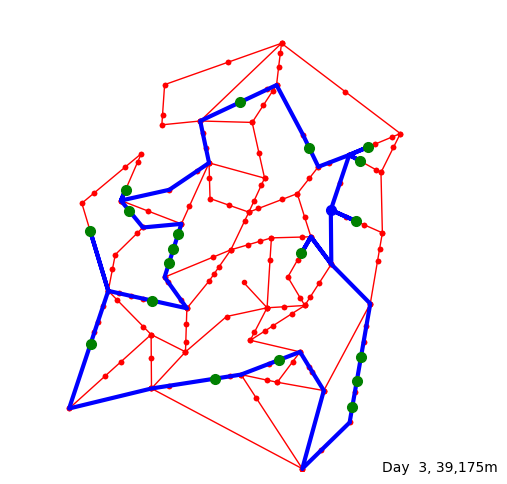

[ 3] 18:20:00.0 Driver leaves for delivery of 24 parcels
[ 3] 18:20:00.0 Driver drives to Customer: 73 (7436, 5411)
[ 3] 18:21:10.4 Driver arrived at Customer: 73 (7436, 5411)
[ 3] 18:21:23.10 Customer: 73 (7436, 5411) answers door
[ 3] 18:21:23.10 Customer: 73 (7436, 5411) accepts Parcel: 89
[ 3] 18:21:25.8 Customer: 73 (7436, 5411) signs off
[ 3] 18:21:42.4 Driver drives to Customer: 97 (6268, 4714)
[ 3] 18:27:31.4 Driver arrived at Customer: 97 (6268, 4714)
[ 3] 18:28:03.6 Customer: 97 (6268, 4714) answers door
[ 3] 18:28:03.6 Customer: 97 (6268, 4714) accepts Parcel: 97
[ 3] 18:28:07.6 Customer: 97 (6268, 4714) accepts Parcel: 99
[ 3] 18:28:16.4 Customer: 97 (6268, 4714) signs off
[ 3] 18:28:16.6 Driver drives to Customer: 77 (7546, 2458)
[ 3] 18:35:19.4 Driver arrived at Customer: 77 (7546, 2458)
[ 3] 18:35:24.10 Customer: 77 (7546, 2458) answers door
[ 3] 18:35:24.10 Customer: 77 (7546, 2458) accepts Parcel: 91
[ 3] 18:35:30.0 Customer: 77 (7546, 2458) accepts Parcel: 98
[ 3] 18:

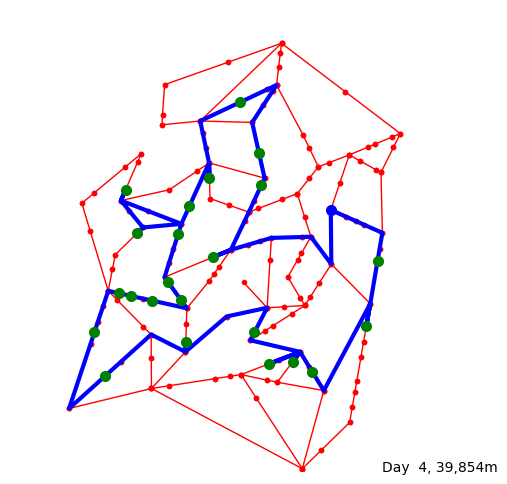

[ 4] 18:23:20.0 Driver leaves for delivery of 28 parcels
[ 4] 18:23:20.0 Driver drives to Customer: 30 (4374, 4632)
[ 4] 18:31:29.1 Driver arrived at Customer: 30 (4374, 4632)
[ 4] 18:31:30.1 Customer: 30 (4374, 4632) answers door
[ 4] 18:31:30.1 Customer: 30 (4374, 4632) accepts Parcel: 112
[ 4] 18:31:30.6 Customer: 30 (4374, 4632) accepts Parcel: 118
[ 4] 18:31:33.1 Customer: 30 (4374, 4632) signs off
[ 4] 18:31:43.7 Driver drives to Customer: 12 (5406, 6190)
[ 4] 18:35:38.2 Driver arrived at Customer: 12 (5406, 6190)
[ 4] 18:35:40.10 Customer: 12 (5406, 6190) answers door
[ 4] 18:35:40.10 Customer: 12 (5406, 6190) accepts Parcel: 124
[ 4] 18:35:41.6 Customer: 12 (5406, 6190) signs off
[ 4] 18:36:17.4 Driver drives to Customer:  5 (5352, 6892)
[ 4] 18:37:45.0 Driver arrived at Customer:  5 (5352, 6892)
[ 4] 18:38:06.10 Customer:  5 (5352, 6892) answers door
[ 4] 18:38:06.10 Customer:  5 (5352, 6892) accepts Parcel: 102
[ 4] 18:38:29.3 Customer:  5 (5352, 6892) signs off
[ 4] 18:38:31

[ 5] 13:42:40.2 Parcel: 155 arr at delivery centre
[ 5] 13:47:08.7 Parcel: 156 arr at delivery centre
[ 5] 14:01:13.6 Parcel: 157 arr at delivery centre
[ 5] 14:10:16.8 Parcel: 158 arr at delivery centre
[ 5] 14:13:15.5 Parcel: 159 arr at delivery centre
[ 5] 14:23:08.9 Parcel: 160 arr at delivery centre
[ 5] 18:00:00.0 Driver arrives for work
[ 5] 18:00:00.0 Parcel: 154 out for delivery
[ 5] 18:00:00.0 Parcel: 136 out for delivery
[ 5] 18:00:00.0 Parcel: 150 out for delivery
[ 5] 18:00:00.0 Parcel: 136 out for delivery
[ 5] 18:00:00.0 Parcel: 144 out for delivery
[ 5] 18:00:00.0 Parcel: 152 out for delivery
[ 5] 18:00:00.0 Parcel: 145 out for delivery
[ 5] 18:00:00.0 Parcel: 133 out for delivery
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 126 out for delivery
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 148 out for delivery
[ 5] 18:00:00.0 Parcel: 142 out for delivery
[ 5] 18:00:00.0 Parcel: 143 out for delivery
[ 5] 18:00:00.0 Parcel: 

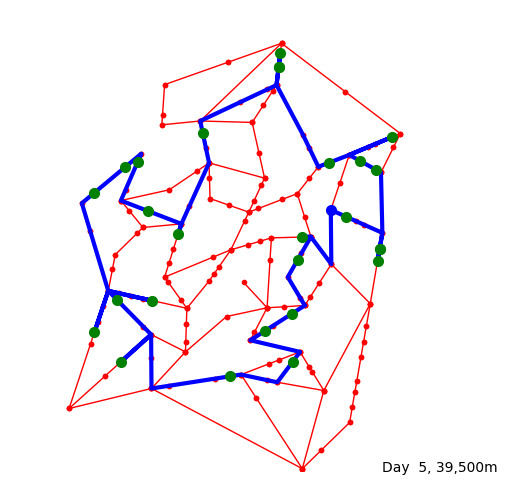

[ 5] 18:25:50.0 Driver leaves for delivery of 31 parcels
[ 5] 18:25:50.0 Driver drives to Customer: 79 (7227, 5504)
[ 5] 18:26:33.1 Driver arrived at Customer: 79 (7227, 5504)
[ 5] 18:26:57.4 Customer: 79 (7227, 5504) answers door
[ 5] 18:26:57.4 Customer: 79 (7227, 5504) accepts Parcel: 154
[ 5] 18:27:10.2 Customer: 79 (7227, 5504) signs off
[ 5] 18:27:15.4 Driver drives to Customer: 45 (7949, 4811)
[ 5] 18:29:39.7 Driver arrived at Customer: 45 (7949, 4811)
[ 5] 18:30:07.1 Customer: 45 (7949, 4811) answers door
[ 5] 18:30:07.1 Customer: 45 (7949, 4811) accepts Parcel: 136
[ 5] 18:30:07.4 Customer: 45 (7949, 4811) signs off
[ 5] 18:30:20.8 Driver drives to Customer: 20 (7904, 4546)
[ 5] 18:30:52.10 Driver arrived at Customer: 20 (7904, 4546)
[ 5] 18:30:54.4 Customer: 20 (7904, 4546) answers door
[ 5] 18:30:54.4 Customer: 20 (7904, 4546) accepts Parcel: 150
[ 5] 18:31:05.8 Customer: 20 (7904, 4546) signs off
[ 5] 18:31:14.5 Driver drives to Customer: 45 (7949, 4811)
[ 5] 18:31:46.7 Dri

[ 6] 08:38:01.10 Parcel: 164 arr at delivery centre
[ 6] 08:44:52.10 Parcel: 165 arr at delivery centre
[ 6] 09:13:04.2 Parcel: 166 arr at delivery centre
[ 6] 09:17:32.10 Parcel: 167 arr at delivery centre
[ 6] 09:30:17.9 Parcel: 168 arr at delivery centre
[ 6] 09:30:29.5 Parcel: 169 arr at delivery centre
[ 6] 09:51:28.2 Parcel: 170 arr at delivery centre
[ 6] 09:57:48.10 Parcel: 171 arr at delivery centre
[ 6] 09:58:32.5 Parcel: 172 arr at delivery centre
[ 6] 10:03:39.2 Parcel: 173 arr at delivery centre
[ 6] 10:07:54.6 Parcel: 174 arr at delivery centre
[ 6] 10:55:21.4 Parcel: 175 arr at delivery centre
[ 6] 11:02:05.3 Parcel: 176 arr at delivery centre
[ 6] 11:07:21.1 Parcel: 177 arr at delivery centre
[ 6] 11:14:15.1 Parcel: 178 arr at delivery centre
[ 6] 11:59:45.9 Parcel: 179 arr at delivery centre
[ 6] 12:15:20.2 Parcel: 180 arr at delivery centre
[ 6] 12:30:22.9 Parcel: 181 arr at delivery centre
[ 6] 12:49:52.6 Parcel: 182 arr at delivery centre
[ 6] 12:57:29.4 Parcel: 183

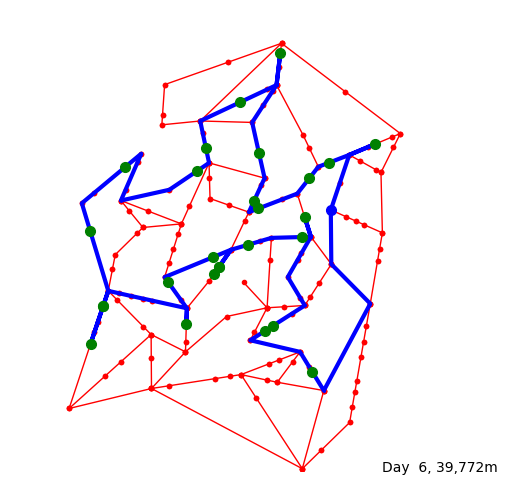

[ 6] 18:25:50.0 Driver leaves for delivery of 31 parcels
[ 6] 18:25:50.0 Driver drives to Customer: 14 (6502, 2145)
[ 6] 18:35:46.9 Driver arrived at Customer: 14 (6502, 2145)
[ 6] 18:36:08.1 Customer: 14 (6502, 2145) answers door
[ 6] 18:36:08.1 Customer: 14 (6502, 2145) accepts Parcel: 163
[ 6] 18:36:17.6 Customer: 14 (6502, 2145) signs off
[ 6] 18:36:33.9 Driver drives to Customer: 23 (5474, 3026)
[ 6] 18:40:30.1 Driver arrived at Customer: 23 (5474, 3026)
[ 6] 18:40:40.4 Customer: 23 (5474, 3026) answers door
[ 6] 18:40:40.4 Customer: 23 (5474, 3026) accepts Parcel: 178
[ 6] 18:40:40.6 Customer: 23 (5474, 3026) signs off
[ 6] 18:40:48.1 Driver drives to Customer: 29 (5661, 3147)
[ 6] 18:41:14.8 Driver arrived at Customer: 29 (5661, 3147)
[ 6] 18:43:08.2 Customer: 29 (5661, 3147) answers door
[ 6] 18:43:08.2 Customer: 29 (5661, 3147) accepts Parcel: 183
[ 6] 18:43:19.6 Customer: 29 (5661, 3147) signs off
[ 6] 18:43:29.6 Driver drives to Customer: 27 (6339, 5488)
[ 6] 18:49:24.9 Driv

[ 7] 09:01:35.3 Parcel: 195 arr at delivery centre
[ 7] 09:20:20.9 Parcel: 196 arr at delivery centre
[ 7] 09:28:44.8 Parcel: 197 arr at delivery centre
[ 7] 09:45:34.3 Parcel: 198 arr at delivery centre
[ 7] 09:46:18.9 Parcel: 199 arr at delivery centre
[ 7] 09:55:27.2 Parcel: 200 arr at delivery centre
[ 7] 10:00:06.3 Parcel: 201 arr at delivery centre
[ 7] 10:02:45.9 Parcel: 202 arr at delivery centre
[ 7] 10:14:23.4 Parcel: 203 arr at delivery centre
[ 7] 10:24:44.8 Parcel: 204 arr at delivery centre
[ 7] 10:37:31.5 Parcel: 205 arr at delivery centre
[ 7] 10:59:21.7 Parcel: 206 arr at delivery centre
[ 7] 11:32:44.5 Parcel: 207 arr at delivery centre
[ 7] 11:43:19.2 Parcel: 208 arr at delivery centre
[ 7] 11:49:07.1 Parcel: 209 arr at delivery centre
[ 7] 11:58:52.2 Parcel: 210 arr at delivery centre
[ 7] 12:24:32.4 Parcel: 211 arr at delivery centre
[ 7] 12:56:46.8 Parcel: 212 arr at delivery centre
[ 7] 13:22:43.5 Parcel: 213 arr at delivery centre
[ 7] 13:25:57.2 Parcel: 214 arr

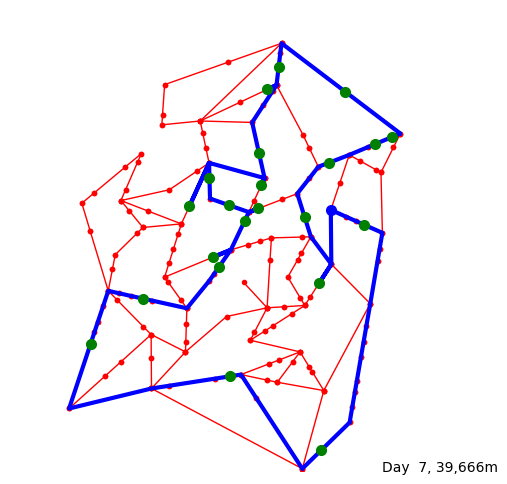

[ 7] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 7] 18:21:40.0 Driver drives to Customer: 28 (6650, 4070)
[ 7] 18:24:58.8 Driver arrived at Customer: 28 (6650, 4070)
[ 7] 18:26:58.4 Customer: 28 (6650, 4070) answers door
[ 7] 18:26:58.4 Customer: 28 (6650, 4070) accepts Parcel: 195
[ 7] 18:27:02.6 Customer: 28 (6650, 4070) signs off
[ 7] 18:27:11.5 Driver drives to Customer: 27 (6339, 5488)
[ 7] 18:30:30.3 Driver arrived at Customer: 27 (6339, 5488)
[ 7] 18:30:33.8 Customer: 27 (6339, 5488) answers door
[ 7] 18:30:33.8 Customer: 27 (6339, 5488) accepts Parcel: 200
[ 7] 18:30:41.10 Customer: 27 (6339, 5488) signs off
[ 7] 18:30:58.7 Driver drives to Customer: 16 (6857, 6672)
[ 7] 18:34:00.9 Driver arrived at Customer: 16 (6857, 6672)
[ 7] 18:34:09.9 Customer: 16 (6857, 6672) answers door
[ 7] 18:34:09.9 Customer: 16 (6857, 6672) accepts Parcel: 201
[ 7] 18:34:12.9 Customer: 16 (6857, 6672) accepts Parcel: 211
[ 7] 18:34:24.10 Customer: 16 (6857, 6672) accepts Parcel: 213
[ 7] 

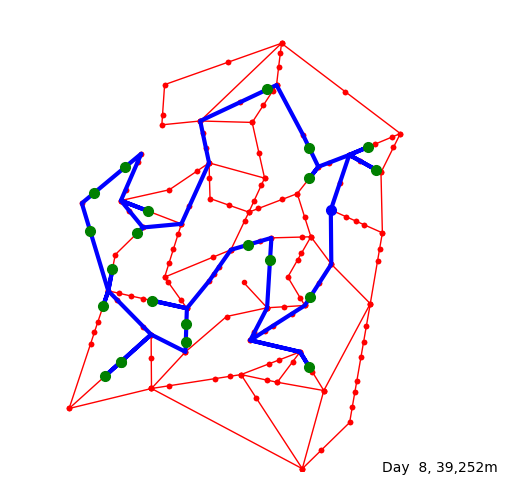

[ 8] 18:20:00.0 Driver leaves for delivery of 24 parcels
[ 8] 18:20:00.0 Driver drives to Customer: 72 (7870, 6521)
[ 8] 18:23:49.2 Driver arrived at Customer: 72 (7870, 6521)
[ 8] 18:24:54.1 Customer: 72 (7870, 6521) answers door
[ 8] 18:24:54.1 Customer: 72 (7870, 6521) accepts Parcel: 225
[ 8] 18:24:56.2 Customer: 72 (7870, 6521) accepts Parcel: 237
[ 8] 18:25:01.1 Customer: 72 (7870, 6521) signs off
[ 8] 18:25:05.5 Driver drives to Customer: 58 (7707, 7015)
[ 8] 18:27:17.6 Driver arrived at Customer: 58 (7707, 7015)
[ 8] 18:27:22.9 Customer: 58 (7707, 7015) answers door
[ 8] 18:27:22.9 Customer: 58 (7707, 7015) accepts Parcel: 233
[ 8] 18:27:27.2 Customer: 58 (7707, 7015) signs off
[ 8] 18:27:29.2 Driver drives to Customer:  9 (6438, 6337)
[ 8] 18:30:25.7 Driver arrived at Customer:  9 (6438, 6337)
[ 8] 18:31:03.10 Customer:  9 (6438, 6337) answers door
[ 8] 18:31:03.10 Customer:  9 (6438, 6337) accepts Parcel: 222
[ 8] 18:31:14.6 Customer:  9 (6438, 6337) signs off
[ 8] 18:31:14.7

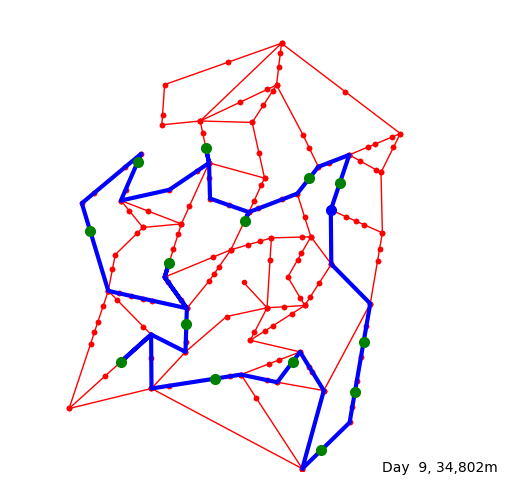

[ 9] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 9] 18:11:40.0 Driver drives to Customer:  8 (7603, 2787)
[ 9] 18:18:06.3 Driver arrived at Customer:  8 (7603, 2787)
[ 9] 18:18:44.1 Customer:  8 (7603, 2787) answers door
[ 9] 18:18:44.1 Customer:  8 (7603, 2787) accepts Parcel: 234
[ 9] 18:18:59.2 Customer:  8 (7603, 2787) signs off
[ 9] 18:19:10.4 Driver drives to Customer: 75 (7416, 1705)
[ 9] 18:21:21.9 Driver arrived at Customer: 75 (7416, 1705)
[ 9] 18:21:40.10 Customer: 75 (7416, 1705) answers door
[ 9] 18:21:40.10 Customer: 75 (7416, 1705) accepts Parcel: 242
[ 9] 18:21:41.3 Customer: 75 (7416, 1705) signs off
[ 9] 18:21:46.10 Driver drives to Customer: 95 (6687, 444)
[ 9] 18:24:50.2 Driver arrived at Customer: 95 (6687, 444)
[ 9] 18:26:28.2 Customer: 95 (6687, 444) answers door
[ 9] 18:26:28.2 Customer: 95 (6687, 444) accepts Parcel: 240
[ 9] 18:26:32.3 Customer: 95 (6687, 444) signs off
[ 9] 18:26:35.1 Driver drives to Customer: 52 (6082, 2369)
[ 9] 18:33:41.6 Driver

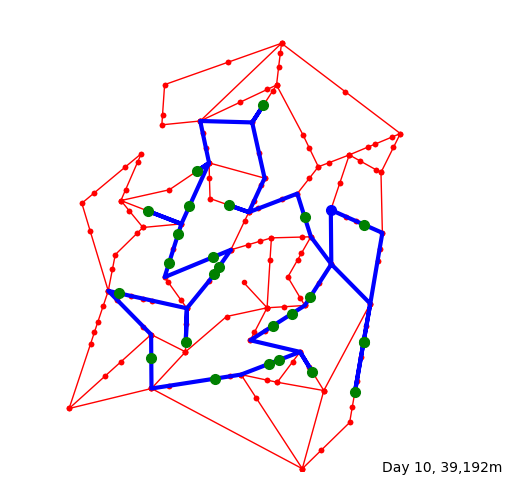

[10] 18:27:30.0 Driver leaves for delivery of 33 parcels
[10] 18:27:30.0 Driver drives to Customer: 93 (7622, 5327)
[10] 18:29:04.9 Driver arrived at Customer: 93 (7622, 5327)
[10] 18:30:26.6 Customer: 93 (7622, 5327) answers door
[10] 18:30:26.6 Customer: 93 (7622, 5327) accepts Parcel: 255
[10] 18:30:31.6 Customer: 93 (7622, 5327) signs off
[10] 18:30:57.4 Driver drives to Customer:  8 (7603, 2787)
[10] 18:36:36.2 Driver arrived at Customer:  8 (7603, 2787)
[10] 18:37:26.2 Customer:  8 (7603, 2787) answers door
[10] 18:37:26.2 Customer:  8 (7603, 2787) accepts Parcel: 270
[10] 18:37:35.4 Customer:  8 (7603, 2787) signs off
[10] 18:37:37.2 Driver drives to Customer: 75 (7416, 1705)
[10] 18:39:48.7 Driver arrived at Customer: 75 (7416, 1705)
[10] 18:40:05.4 Customer: 75 (7416, 1705) answers door
[10] 18:40:05.4 Customer: 75 (7416, 1705) accepts Parcel: 261
[10] 18:40:10.7 Customer: 75 (7416, 1705) accepts Parcel: 272
[10] 18:40:19.6 Customer: 75 (7416, 1705) accepts Parcel: 282
[10] 18

[11] 09:23:47.2 Parcel: 291 arr at delivery centre
[11] 09:52:16.8 Parcel: 292 arr at delivery centre
[11] 10:50:15.1 Parcel: 293 arr at delivery centre
[11] 10:56:46.8 Parcel: 294 arr at delivery centre
[11] 11:06:53.5 Parcel: 295 arr at delivery centre
[11] 11:25:32.2 Parcel: 296 arr at delivery centre
[11] 11:34:09.4 Parcel: 297 arr at delivery centre
[11] 11:39:43.7 Parcel: 298 arr at delivery centre
[11] 12:00:18.2 Parcel: 299 arr at delivery centre
[11] 12:35:09.4 Parcel: 300 arr at delivery centre
[11] 13:14:15.2 Parcel: 301 arr at delivery centre
[11] 13:29:31.9 Parcel: 302 arr at delivery centre
[11] 13:36:49.9 Parcel: 303 arr at delivery centre
[11] 14:33:45.1 Parcel: 304 arr at delivery centre
[11] 14:49:32.5 Parcel: 305 arr at delivery centre
[11] 14:50:35.8 Parcel: 306 arr at delivery centre
[11] 14:51:58.1 Parcel: 307 arr at delivery centre
[11] 15:13:27.1 Parcel: 308 arr at delivery centre
[11] 15:14:25.8 Parcel: 309 arr at delivery centre
[11] 15:14:33.1 Parcel: 310 arr

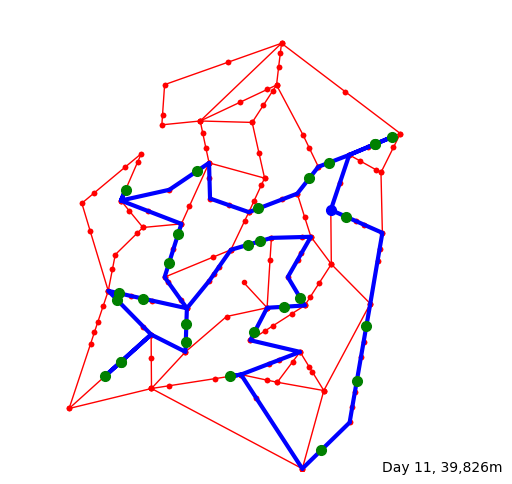

[11] 18:28:20.0 Driver leaves for delivery of 34 parcels
[11] 18:28:20.0 Driver drives to Customer: 21 (7852, 7076)
[11] 18:32:02.7 Driver arrived at Customer: 21 (7852, 7076)
[11] 18:32:44.1 Customer: 21 (7852, 7076) answers door
[11] 18:32:44.1 Customer: 21 (7852, 7076) accepts Parcel: 297
[11] 18:33:24.1 Customer: 21 (7852, 7076) signs off
[11] 18:33:25.3 Driver drives to Customer: 53 (8211, 7227)
[11] 18:34:11.9 Driver arrived at Customer: 53 (8211, 7227)
[11] 18:34:58.6 Customer: 53 (8211, 7227) answers door
[11] 18:34:58.6 Customer: 53 (8211, 7227) accepts Parcel: 314
[11] 18:35:08.1 Customer: 53 (8211, 7227) signs off
[11] 18:35:12.8 Driver drives to Customer: 21 (7852, 7076)
[11] 18:35:59.5 Driver arrived at Customer: 21 (7852, 7076)
[11] 18:37:02.6 Customer: 21 (7852, 7076) answers door
[11] 18:37:02.6 Customer: 21 (7852, 7076) accepts Parcel: 297
[11] 18:37:02.7 Customer: 21 (7852, 7076) signs off
[11] 18:37:24.10 Driver drives to Customer: 16 (6857, 6672)
[11] 18:39:33.6 Dri

[12] 08:43:35.4 Parcel: 323 arr at delivery centre
[12] 08:44:36.8 Parcel: 324 arr at delivery centre
[12] 09:15:29.8 Parcel: 325 arr at delivery centre
[12] 09:34:15.10 Parcel: 326 arr at delivery centre
[12] 10:10:26.3 Parcel: 327 arr at delivery centre
[12] 10:19:45.1 Parcel: 328 arr at delivery centre
[12] 10:37:16.1 Parcel: 329 arr at delivery centre
[12] 10:39:13.9 Parcel: 330 arr at delivery centre
[12] 10:47:05.9 Parcel: 331 arr at delivery centre
[12] 10:50:41.9 Parcel: 332 arr at delivery centre
[12] 10:51:21.9 Parcel: 333 arr at delivery centre
[12] 11:37:11.4 Parcel: 334 arr at delivery centre
[12] 11:40:57.6 Parcel: 335 arr at delivery centre
[12] 11:43:24.8 Parcel: 336 arr at delivery centre
[12] 11:46:49.10 Parcel: 337 arr at delivery centre
[12] 11:54:11.7 Parcel: 338 arr at delivery centre
[12] 12:06:26.10 Parcel: 339 arr at delivery centre
[12] 12:08:59.6 Parcel: 340 arr at delivery centre
[12] 18:00:00.0 Driver arrives for work
[12] 18:00:00.0 Parcel: 333 out for del

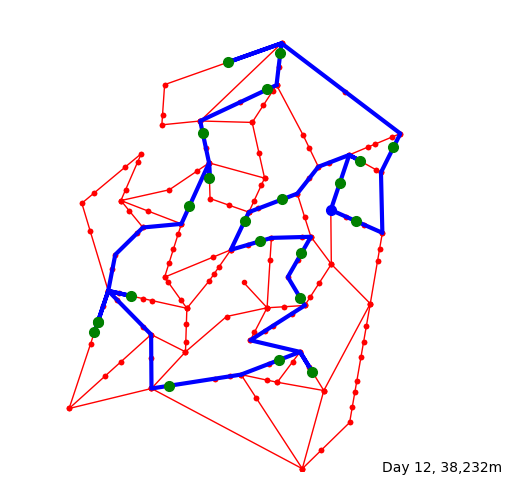

[12] 18:21:40.0 Driver leaves for delivery of 26 parcels
[12] 18:21:40.0 Driver drives to Customer:  7 (7092, 6231)
[12] 18:22:53.2 Driver arrived at Customer:  7 (7092, 6231)
[12] 18:23:09.9 Customer:  7 (7092, 6231) answers door
[12] 18:23:09.9 Customer:  7 (7092, 6231) accepts Parcel: 333
[12] 18:23:10.7 Customer:  7 (7092, 6231) signs off
[12] 18:23:19.2 Driver drives to Customer: 22 (7528, 6712)
[12] 18:25:08.3 Driver arrived at Customer: 22 (7528, 6712)
[12] 18:25:18.5 Customer: 22 (7528, 6712) answers door
[12] 18:25:18.5 Customer: 22 (7528, 6712) accepts Parcel: 318
[12] 18:25:23.1 Customer: 22 (7528, 6712) signs off
[12] 18:25:27.9 Driver drives to Customer:  0 (5854, 5879)
[12] 18:29:35.1 Driver arrived at Customer:  0 (5854, 5879)
[12] 18:30:31.9 Customer:  0 (5854, 5879) answers door
[12] 18:30:31.9 Customer:  0 (5854, 5879) accepts Parcel: 325
[12] 18:30:34.5 Customer:  0 (5854, 5879) accepts Parcel: 329
[12] 18:31:02.0 Customer:  0 (5854, 5879) signs off
[12] 18:31:15.6 D

[13] 17:08:21.6 Parcel: 368 arr at delivery centre
[13] 17:09:43.9 Parcel: 369 arr at delivery centre
[13] 17:41:13.8 Parcel: 370 arr at delivery centre
[13] 18:00:00.0 Driver arrives for work
[13] 18:00:00.0 Parcel: 343 out for delivery
[13] 18:00:00.0 Parcel: 341 out for delivery
[13] 18:00:00.0 Parcel: 346 out for delivery
[13] 18:00:00.0 Parcel: 357 out for delivery
[13] 18:00:00.0 Parcel: 363 out for delivery
[13] 18:00:00.0 Parcel: 353 out for delivery
[13] 18:00:00.0 Parcel: 358 out for delivery
[13] 18:00:00.0 Parcel: 355 out for delivery
[13] 18:00:00.0 Parcel: 366 out for delivery
[13] 18:00:00.0 Parcel: 349 out for delivery
[13] 18:00:00.0 Parcel: 351 out for delivery
[13] 18:00:00.0 Parcel: 360 out for delivery
[13] 18:00:00.0 Parcel: 364 out for delivery
[13] 18:00:00.0 Parcel: 350 out for delivery
[13] 18:00:00.0 Parcel: 369 out for delivery
[13] 18:00:00.0 Parcel: 370 out for delivery
[13] 18:00:00.0 Parcel: 342 out for delivery
[13] 18:00:00.0 Parcel: 348 out for delive

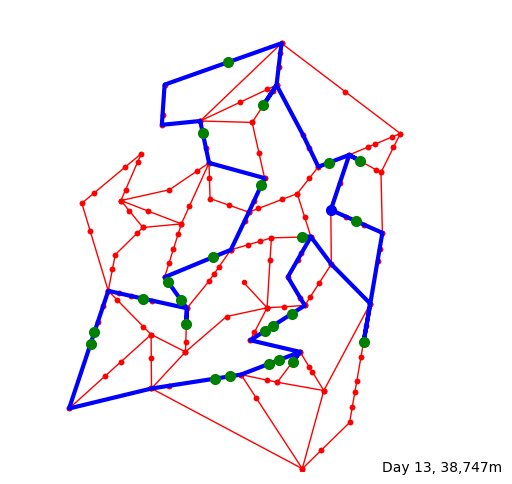

[13] 18:23:20.0 Driver leaves for delivery of 28 parcels
[13] 18:23:20.0 Driver drives to Customer: 73 (7436, 5411)
[13] 18:24:30.4 Driver arrived at Customer: 73 (7436, 5411)
[13] 18:24:39.3 Customer: 73 (7436, 5411) answers door
[13] 18:24:39.3 Customer: 73 (7436, 5411) accepts Parcel: 343
[13] 18:24:52.8 Customer: 73 (7436, 5411) signs off
[13] 18:24:55.0 Driver drives to Customer:  8 (7603, 2787)
[13] 18:30:58.3 Driver arrived at Customer:  8 (7603, 2787)
[13] 18:30:58.3 Customer:  8 (7603, 2787) answers door
[13] 18:30:58.3 Customer:  8 (7603, 2787) accepts Parcel: 341
[13] 18:31:21.0 Customer:  8 (7603, 2787) signs off
[13] 18:31:39.7 Driver drives to Customer: 61 (6282, 5064)
[13] 18:37:36.1 Driver arrived at Customer: 61 (6282, 5064)
[13] 18:37:38.9 Customer: 61 (6282, 5064) answers door
[13] 18:37:38.9 Customer: 61 (6282, 5064) accepts Parcel: 346
[13] 18:37:40.9 Customer: 61 (6282, 5064) signs off
[13] 18:37:43.5 Driver drives to Customer: 13 (6067, 3408)
[13] 18:42:11.1 Driv

[14] 12:11:39.2 Parcel: 387 arr at delivery centre
[14] 13:23:53.8 Parcel: 388 arr at delivery centre
[14] 13:45:12.1 Parcel: 389 arr at delivery centre
[14] 14:21:49.4 Parcel: 390 arr at delivery centre
[14] 14:25:24.1 Parcel: 391 arr at delivery centre
[14] 14:37:17.2 Parcel: 392 arr at delivery centre
[14] 14:51:26.3 Parcel: 393 arr at delivery centre
[14] 15:18:31.3 Parcel: 394 arr at delivery centre
[14] 15:28:43.6 Parcel: 395 arr at delivery centre
[14] 15:52:59.9 Parcel: 396 arr at delivery centre
[14] 18:00:00.0 Driver arrives for work
[14] 18:00:00.0 Parcel: 385 out for delivery
[14] 18:00:00.0 Parcel: 394 out for delivery
[14] 18:00:00.0 Parcel: 381 out for delivery
[14] 18:00:00.0 Parcel: 368 out for delivery
[14] 18:00:00.0 Parcel: 378 out for delivery
[14] 18:00:00.0 Parcel: 386 out for delivery
[14] 18:00:00.0 Parcel: 375 out for delivery
[14] 18:00:00.0 Parcel: 388 out for delivery
[14] 18:00:00.0 Parcel: 390 out for delivery
[14] 18:00:00.0 Parcel: 367 out for delivery


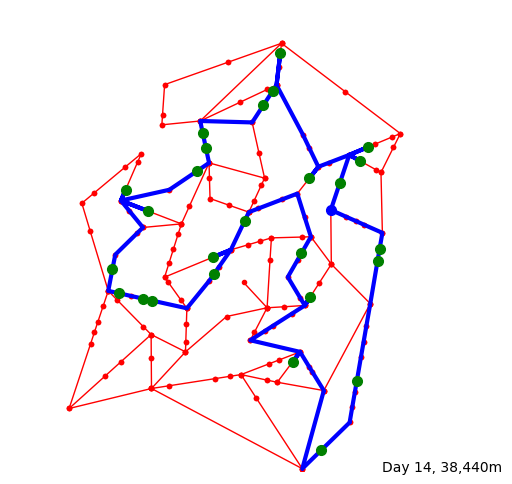

[14] 18:23:20.0 Driver leaves for delivery of 28 parcels
[14] 18:23:20.0 Driver drives to Customer: 45 (7949, 4811)
[14] 18:26:27.4 Driver arrived at Customer: 45 (7949, 4811)
[14] 18:27:32.9 Customer: 45 (7949, 4811) answers door
[14] 18:27:32.9 Customer: 45 (7949, 4811) accepts Parcel: 385
[14] 18:27:47.4 Customer: 45 (7949, 4811) signs off
[14] 18:27:53.7 Driver drives to Customer: 20 (7904, 4546)
[14] 18:28:25.9 Driver arrived at Customer: 20 (7904, 4546)
[14] 18:29:11.2 Customer: 20 (7904, 4546) answers door
[14] 18:29:11.2 Customer: 20 (7904, 4546) accepts Parcel: 394
[14] 18:29:16.5 Customer: 20 (7904, 4546) signs off
[14] 18:29:18.6 Driver drives to Customer: 41 (7458, 1945)
[14] 18:34:35.0 Driver arrived at Customer: 41 (7458, 1945)
[14] 18:34:54.9 Customer: 41 (7458, 1945) answers door
[14] 18:34:54.9 Customer: 41 (7458, 1945) accepts Parcel: 381
[14] 18:35:10.3 Customer: 41 (7458, 1945) signs off
[14] 18:35:26.5 Driver drives to Customer: 95 (6687, 444)
[14] 18:38:58.9 Drive

[15] 09:46:19.9 Parcel: 404 arr at delivery centre
[15] 09:50:52.10 Parcel: 405 arr at delivery centre
[15] 09:51:56.1 Parcel: 406 arr at delivery centre
[15] 10:22:24.2 Parcel: 407 arr at delivery centre
[15] 11:06:48.1 Parcel: 408 arr at delivery centre
[15] 11:12:23.6 Parcel: 409 arr at delivery centre
[15] 11:20:31.4 Parcel: 410 arr at delivery centre
[15] 11:46:16.4 Parcel: 411 arr at delivery centre
[15] 11:47:16.2 Parcel: 412 arr at delivery centre
[15] 12:03:09.1 Parcel: 413 arr at delivery centre
[15] 12:05:15.8 Parcel: 414 arr at delivery centre
[15] 12:10:30.6 Parcel: 415 arr at delivery centre
[15] 12:37:58.6 Parcel: 416 arr at delivery centre
[15] 12:38:51.7 Parcel: 417 arr at delivery centre
[15] 12:39:25.7 Parcel: 418 arr at delivery centre
[15] 12:47:49.0 Parcel: 419 arr at delivery centre
[15] 12:58:18.7 Parcel: 420 arr at delivery centre
[15] 13:29:09.9 Parcel: 421 arr at delivery centre
[15] 13:48:44.7 Parcel: 422 arr at delivery centre
[15] 14:06:06.0 Parcel: 423 ar

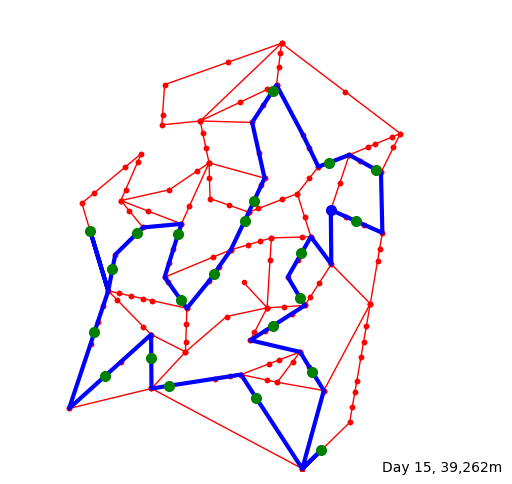

[15] 18:20:50.0 Driver leaves for delivery of 25 parcels
[15] 18:20:50.0 Driver drives to Customer: 97 (6268, 4714)
[15] 18:25:28.5 Driver arrived at Customer: 97 (6268, 4714)
[15] 18:26:25.1 Customer: 97 (6268, 4714) answers door
[15] 18:26:25.1 Customer: 97 (6268, 4714) accepts Parcel: 410
[15] 18:26:28.9 Customer: 97 (6268, 4714) signs off
[15] 18:26:42.5 Driver drives to Customer: 56 (6245, 3741)
[15] 18:28:57.4 Driver arrived at Customer: 56 (6245, 3741)
[15] 18:29:55.8 Customer: 56 (6245, 3741) answers door
[15] 18:29:55.8 Customer: 56 (6245, 3741) accepts Parcel: 401
[15] 18:29:58.5 Customer: 56 (6245, 3741) signs off
[15] 18:30:32.9 Driver drives to Customer: 29 (5661, 3147)
[15] 18:32:31.7 Driver arrived at Customer: 29 (5661, 3147)
[15] 18:32:32.8 Customer: 29 (5661, 3147) answers door
[15] 18:32:32.8 Customer: 29 (5661, 3147) accepts Parcel: 407
[15] 18:32:52.8 Customer: 29 (5661, 3147) signs off
[15] 18:32:59.9 Driver drives to Customer: 14 (6502, 2145)
[15] 18:37:22.7 Driv

[16] 18:00:00.0 Driver arrives for work
[16] 18:00:00.0 Parcel: 432 out for delivery
[16] 18:00:00.0 Parcel: 435 out for delivery
[16] 18:00:00.0 Parcel: 428 out for delivery
[16] 18:00:00.0 Parcel: 439 out for delivery
[16] 18:00:00.0 Parcel: 440 out for delivery
[16] 18:00:00.0 Parcel: 448 out for delivery
[16] 18:00:00.0 Parcel: 431 out for delivery
[16] 18:00:00.0 Parcel: 434 out for delivery
[16] 18:00:00.0 Parcel: 425 out for delivery
[16] 18:00:00.0 Parcel: 444 out for delivery
[16] 18:00:00.0 Parcel: 430 out for delivery
[16] 18:00:00.0 Parcel: 436 out for delivery
[16] 18:00:00.0 Parcel: 429 out for delivery
[16] 18:00:00.0 Parcel: 449 out for delivery
[16] 18:00:00.0 Parcel: 442 out for delivery
[16] 18:00:00.0 Parcel: 441 out for delivery
[16] 18:00:00.0 Parcel: 445 out for delivery
[16] 18:00:00.0 Parcel: 450 out for delivery
[16] 18:00:00.0 Parcel: 426 out for delivery
[16] 18:00:00.0 Parcel: 424 out for delivery
[16] 18:00:00.0 Parcel: 433 out for delivery
[16] 18:00:00.0

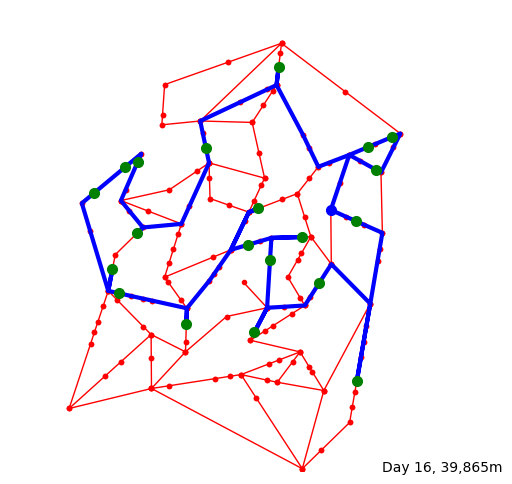

[16] 18:24:10.0 Driver leaves for delivery of 29 parcels
[16] 18:24:10.0 Driver drives to Customer: 73 (7436, 5411)
[16] 18:25:20.4 Driver arrived at Customer: 73 (7436, 5411)
[16] 18:28:57.1 Customer: 73 (7436, 5411) answers door
[16] 18:28:57.1 Customer: 73 (7436, 5411) accepts Parcel: 432
[16] 18:29:08.9 Customer: 73 (7436, 5411) accepts Parcel: 435
[16] 18:29:41.6 Customer: 73 (7436, 5411) signs off
[16] 18:29:46.7 Driver drives to Customer: 41 (7458, 1945)
[16] 18:37:32.3 Driver arrived at Customer: 41 (7458, 1945)
[16] 18:38:09.8 Customer: 41 (7458, 1945) answers door
[16] 18:38:09.8 Customer: 41 (7458, 1945) accepts Parcel: 428
[16] 18:38:23.5 Customer: 41 (7458, 1945) accepts Parcel: 439
[16] 18:38:27.8 Customer: 41 (7458, 1945) signs off
[16] 18:38:30.9 Driver drives to Customer: 28 (6650, 4070)
[16] 18:45:16.4 Driver arrived at Customer: 28 (6650, 4070)
[16] 18:47:40.6 Customer: 28 (6650, 4070) answers door
[16] 18:47:40.6 Customer: 28 (6650, 4070) accepts Parcel: 440
[16] 18

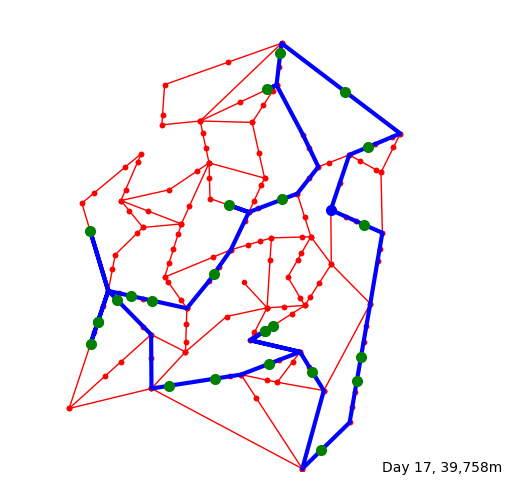

[17] 18:23:20.0 Driver leaves for delivery of 28 parcels
[17] 18:23:20.0 Driver drives to Customer: 58 (7707, 7015)
[17] 18:26:43.9 Driver arrived at Customer: 58 (7707, 7015)
[17] 18:27:49.9 Customer: 58 (7707, 7015) answers door
[17] 18:27:49.9 Customer: 58 (7707, 7015) accepts Parcel: 469
[17] 18:27:54.7 Customer: 58 (7707, 7015) signs off
[17] 18:27:57.4 Driver drives to Customer: 85 (7212, 8208)
[17] 18:32:25.4 Driver arrived at Customer: 85 (7212, 8208)
[17] 18:32:40.1 Customer: 85 (7212, 8208) answers door
[17] 18:32:40.1 Customer: 85 (7212, 8208) accepts Parcel: 466
[17] 18:32:57.5 Customer: 85 (7212, 8208) signs off
[17] 18:33:20.10 Driver drives to Customer: 15 (5813, 9044)
[17] 18:37:14.2 Driver arrived at Customer: 15 (5813, 9044)
[17] 18:39:23.2 Customer: 15 (5813, 9044) answers door
[17] 18:39:23.2 Customer: 15 (5813, 9044) accepts Parcel: 465
[17] 18:39:23.4 Customer: 15 (5813, 9044) signs off
[17] 18:39:37.4 Driver drives to Customer: 78 (5534, 8260)
[17] 18:41:26.9 Dri

[18] 11:12:31.4 Parcel: 492 arr at delivery centre
[18] 11:12:59.9 Parcel: 493 arr at delivery centre
[18] 11:52:00.10 Parcel: 494 arr at delivery centre
[18] 12:42:48.9 Parcel: 495 arr at delivery centre
[18] 13:02:41.5 Parcel: 496 arr at delivery centre
[18] 13:03:57.6 Parcel: 497 arr at delivery centre
[18] 13:05:05.4 Parcel: 498 arr at delivery centre
[18] 13:11:59.5 Parcel: 499 arr at delivery centre
[18] 13:12:27.2 Parcel: 500 arr at delivery centre
[18] 13:19:04.9 Parcel: 501 arr at delivery centre
[18] 13:19:14.2 Parcel: 502 arr at delivery centre
[18] 14:16:00.8 Parcel: 503 arr at delivery centre
[18] 14:42:30.8 Parcel: 504 arr at delivery centre
[18] 14:43:38.8 Parcel: 505 arr at delivery centre
[18] 15:18:21.5 Parcel: 506 arr at delivery centre
[18] 15:21:58.4 Parcel: 507 arr at delivery centre
[18] 15:25:31.6 Parcel: 508 arr at delivery centre
[18] 15:42:53.5 Parcel: 509 arr at delivery centre
[18] 16:26:03.10 Parcel: 510 arr at delivery centre
[18] 16:28:06.3 Parcel: 511 a

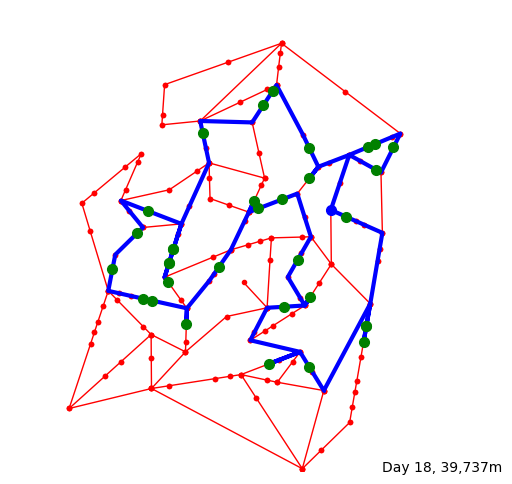

[18] 18:33:20.0 Driver leaves for delivery of 40 parcels
[18] 18:33:20.0 Driver drives to Customer: 58 (7707, 7015)
[18] 18:36:43.9 Driver arrived at Customer: 58 (7707, 7015)
[18] 18:36:49.7 Customer: 58 (7707, 7015) answers door
[18] 18:36:49.7 Customer: 58 (7707, 7015) accepts Parcel: 492
[18] 18:36:59.5 Customer: 58 (7707, 7015) signs off
[18] 18:37:06.6 Driver drives to Customer: 21 (7852, 7076)
[18] 18:37:25.5 Driver arrived at Customer: 21 (7852, 7076)
[18] 18:37:26.0 Customer: 21 (7852, 7076) answers door
[18] 18:37:26.0 Customer: 21 (7852, 7076) accepts Parcel: 506
[18] 18:37:27.6 Customer: 21 (7852, 7076) signs off
[18] 18:37:38.6 Driver drives to Customer: 63 (8247, 7006)
[18] 18:39:29.0 Driver arrived at Customer: 63 (8247, 7006)
[18] 18:39:47.3 Customer: 63 (8247, 7006) answers door
[18] 18:39:47.3 Customer: 63 (8247, 7006) accepts Parcel: 504
[18] 18:40:20.5 Customer: 63 (8247, 7006) accepts Parcel: 514
[18] 18:40:27.4 Customer: 63 (8247, 7006) signs off
[18] 18:40:39.1 D

[19] 08:56:23.4 Parcel: 519 arr at delivery centre
[19] 09:45:58.5 Parcel: 520 arr at delivery centre
[19] 09:48:08.2 Parcel: 521 arr at delivery centre
[19] 10:40:47.9 Parcel: 522 arr at delivery centre
[19] 10:47:46.3 Parcel: 523 arr at delivery centre
[19] 10:57:42.8 Parcel: 524 arr at delivery centre
[19] 11:03:04.8 Parcel: 525 arr at delivery centre
[19] 11:45:58.3 Parcel: 526 arr at delivery centre
[19] 12:35:10.4 Parcel: 527 arr at delivery centre
[19] 12:50:50.2 Parcel: 528 arr at delivery centre
[19] 12:53:59.4 Parcel: 529 arr at delivery centre
[19] 14:10:48.5 Parcel: 530 arr at delivery centre
[19] 14:12:29.2 Parcel: 531 arr at delivery centre
[19] 14:25:57.10 Parcel: 532 arr at delivery centre
[19] 14:28:36.2 Parcel: 533 arr at delivery centre
[19] 15:03:56.7 Parcel: 534 arr at delivery centre
[19] 15:49:06.2 Parcel: 535 arr at delivery centre
[19] 16:14:23.9 Parcel: 536 arr at delivery centre
[19] 16:20:16.10 Parcel: 537 arr at delivery centre
[19] 16:24:35.8 Parcel: 538 a

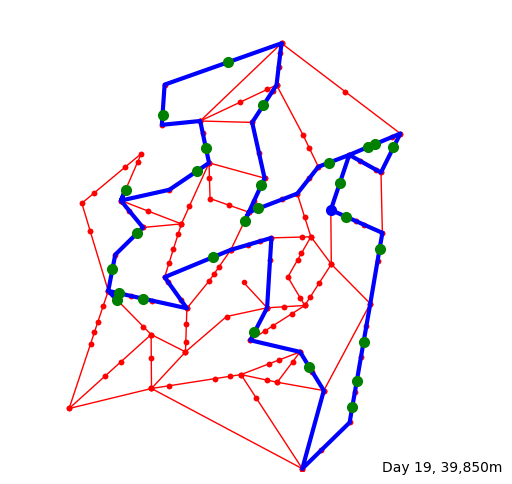

[19] 18:26:40.0 Driver leaves for delivery of 32 parcels
[19] 18:26:40.0 Driver drives to Customer: 79 (7227, 5504)
[19] 18:27:23.1 Driver arrived at Customer: 79 (7227, 5504)
[19] 18:27:39.6 Customer: 79 (7227, 5504) answers door
[19] 18:27:39.6 Customer: 79 (7227, 5504) accepts Parcel: 515
[19] 18:27:41.1 Customer: 79 (7227, 5504) signs off
[19] 18:28:19.8 Driver drives to Customer: 45 (7949, 4811)
[19] 18:30:44.1 Driver arrived at Customer: 45 (7949, 4811)
[19] 18:31:26.9 Customer: 45 (7949, 4811) answers door
[19] 18:31:26.9 Customer: 45 (7949, 4811) accepts Parcel: 526
[19] 18:31:30.1 Customer: 45 (7949, 4811) signs off
[19] 18:32:07.9 Driver drives to Customer:  8 (7603, 2787)
[19] 18:36:14.1 Driver arrived at Customer:  8 (7603, 2787)
[19] 18:36:51.7 Customer:  8 (7603, 2787) answers door
[19] 18:36:51.7 Customer:  8 (7603, 2787) accepts Parcel: 528
[19] 18:36:55.7 Customer:  8 (7603, 2787) signs off
[19] 18:37:18.3 Driver drives to Customer: 41 (7458, 1945)
[19] 18:39:00.7 Driv

[20] 08:42:58.3 Parcel: 549 arr at delivery centre
[20] 08:45:21.1 Parcel: 550 arr at delivery centre
[20] 08:53:51.3 Parcel: 551 arr at delivery centre
[20] 09:09:33.8 Parcel: 552 arr at delivery centre
[20] 09:10:55.10 Parcel: 553 arr at delivery centre
[20] 09:20:03.4 Parcel: 554 arr at delivery centre
[20] 09:27:12.1 Parcel: 555 arr at delivery centre
[20] 10:13:19.1 Parcel: 556 arr at delivery centre
[20] 10:14:14.5 Parcel: 557 arr at delivery centre
[20] 10:22:23.1 Parcel: 558 arr at delivery centre
[20] 10:30:45.4 Parcel: 559 arr at delivery centre
[20] 10:50:57.1 Parcel: 560 arr at delivery centre
[20] 10:56:56.8 Parcel: 561 arr at delivery centre
[20] 11:00:28.10 Parcel: 562 arr at delivery centre
[20] 11:05:51.9 Parcel: 563 arr at delivery centre
[20] 11:15:43.10 Parcel: 564 arr at delivery centre
[20] 12:02:15.6 Parcel: 565 arr at delivery centre
[20] 12:26:56.6 Parcel: 566 arr at delivery centre
[20] 12:31:58.3 Parcel: 567 arr at delivery centre
[20] 12:44:38.1 Parcel: 568 

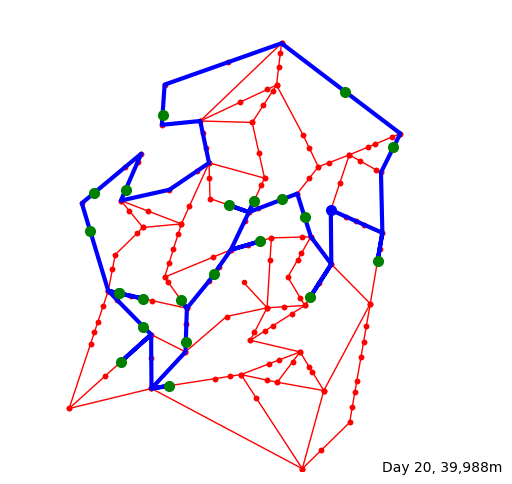

[20] 18:20:50.0 Driver leaves for delivery of 25 parcels
[20] 18:20:50.0 Driver drives to Customer: 20 (7904, 4546)
[20] 18:24:29.6 Driver arrived at Customer: 20 (7904, 4546)
[20] 18:26:21.0 Customer: 20 (7904, 4546) answers door
[20] 18:26:21.0 Customer: 20 (7904, 4546) accepts Parcel: 547
[20] 18:26:22.2 Customer: 20 (7904, 4546) accepts Parcel: 554
[20] 18:26:26.3 Customer: 20 (7904, 4546) signs off
[20] 18:26:39.8 Driver drives to Customer: 63 (8247, 7006)
[20] 18:31:43.4 Driver arrived at Customer: 63 (8247, 7006)
[20] 18:31:58.10 Customer: 63 (8247, 7006) answers door
[20] 18:31:58.10 Customer: 63 (8247, 7006) accepts Parcel: 552
[20] 18:32:00.5 Customer: 63 (8247, 7006) signs off
[20] 18:32:09.2 Driver drives to Customer: 85 (7212, 8208)
[20] 18:35:47.6 Driver arrived at Customer: 85 (7212, 8208)
[20] 18:35:50.2 Customer: 85 (7212, 8208) answers door
[20] 18:35:50.2 Customer: 85 (7212, 8208) accepts Parcel: 562
[20] 18:35:54.8 Customer: 85 (7212, 8208) signs off
[20] 18:35:57.8

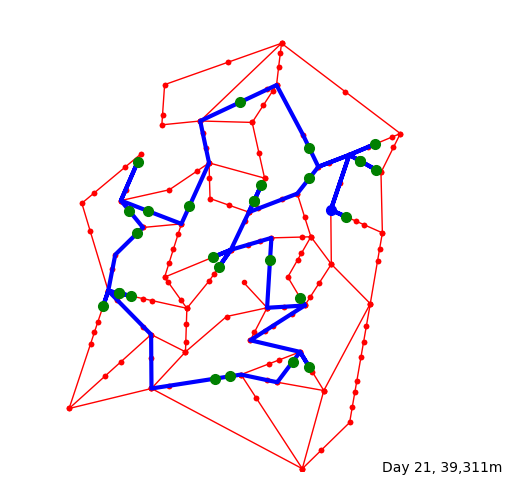

[21] 18:24:10.0 Driver leaves for delivery of 29 parcels
[21] 18:24:10.0 Driver drives to Customer: 22 (7528, 6712)
[21] 18:27:12.3 Driver arrived at Customer: 22 (7528, 6712)
[21] 18:27:58.3 Customer: 22 (7528, 6712) answers door
[21] 18:27:58.3 Customer: 22 (7528, 6712) accepts Parcel: 577
[21] 18:28:17.1 Customer: 22 (7528, 6712) signs off
[21] 18:28:32.4 Driver drives to Customer: 72 (7870, 6521)
[21] 18:29:19.3 Driver arrived at Customer: 72 (7870, 6521)
[21] 18:29:26.3 Customer: 72 (7870, 6521) answers door
[21] 18:29:26.3 Customer: 72 (7870, 6521) accepts Parcel: 583
[21] 18:29:26.8 Customer: 72 (7870, 6521) signs off
[21] 18:29:40.2 Driver drives to Customer: 22 (7528, 6712)
[21] 18:30:27.1 Driver arrived at Customer: 22 (7528, 6712)
[21] 18:30:56.10 Customer: 22 (7528, 6712) answers door
[21] 18:30:56.10 Customer: 22 (7528, 6712) accepts Parcel: 577
[21] 18:31:58.5 Customer: 22 (7528, 6712) signs off
[21] 18:32:00.3 Driver drives to Customer: 21 (7852, 7076)
[21] 18:33:44.3 Dr

In [161]:
random.seed(0)
recP6R40S30 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [162]:
standardMeasureConverter(recP6R40S30.daily)

### Simulation Records

In [163]:
recP6R40S30.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,73236,39.825,140.6,3,NaN
1,151200,159154,39.996,132.566667,10,1.454907
2,237600,245439,39.394,130.65,3,1.234388
3,324000,331493,39.175,124.883333,1,1.324796
4,410400,418448,39.854,134.133333,3,1.125197
5,496800,505816,39.5,150.266667,1,1.204969
6,583200,591665,39.772,141.083333,3,1.18544
7,669600,677611,39.666,133.516667,6,1.248326
8,756000,763694,39.252,128.233333,1,1.252324
9,842400,848705,34.802,105.083333,0,1.288565


### Time Plot

In [164]:
np.mean(recP6R40S30.daily['Working Time (in minutes)'])

136.84015151515155

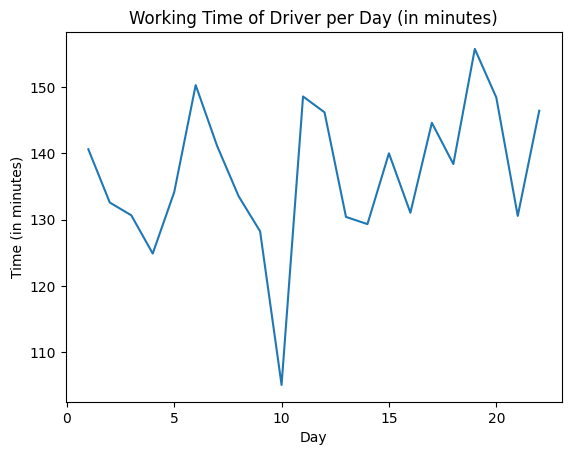

In [165]:
timePlot = plt.plot(recP6R40S30.daily.index +1 ,recP6R40S30.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [166]:
np.mean(recP6R40S30.daily['Delivery Route Distance(in km)'])

39.24745454545455

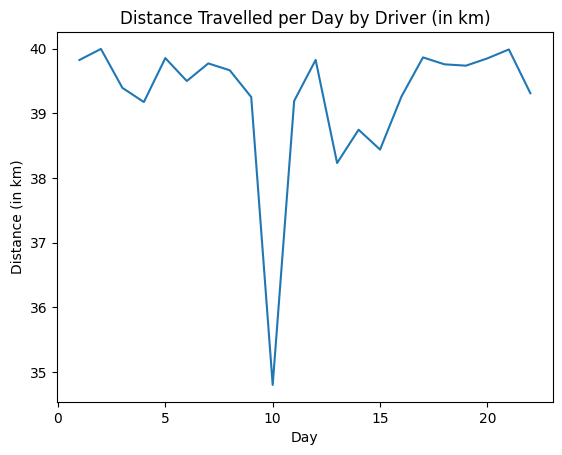

In [167]:
distancePlot = plt.plot(recP6R40S30.daily.index +1 ,recP6R40S30.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [168]:
np.mean(recP6R40S30.daily['Number of left over parcels'])

2.3636363636363638

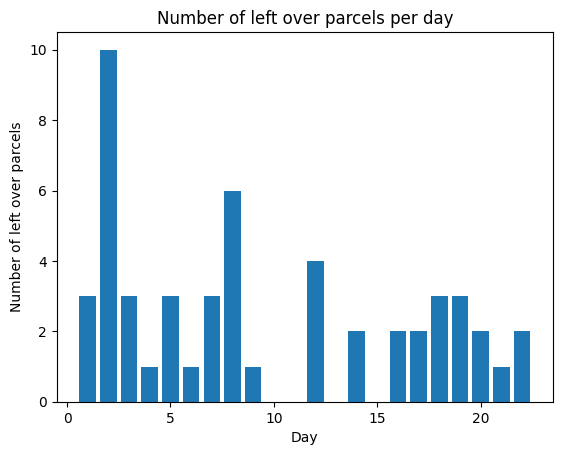

In [169]:
leftOverPlot = plt.bar(recP6R40S30.daily.index +1 ,recP6R40S30.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [170]:
np.mean(recP6R40S30.daily['Delay Time(in days)'])

1.2447052696078431

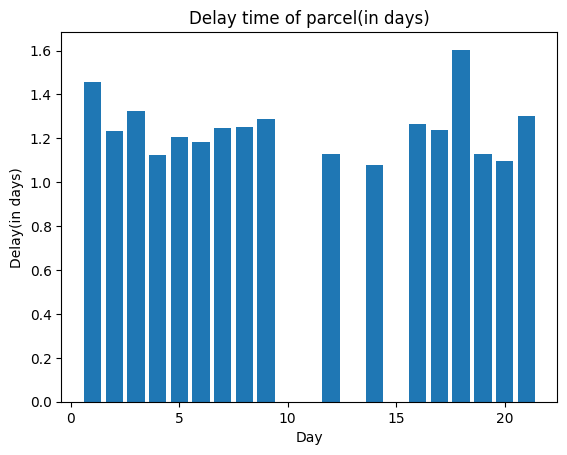

In [171]:
delayPlot = plt.bar(recP6R40S30.daily.index ,recP6R40S30.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()

# Scenario 8

Suppose due to high demand in sales the average number of parcels per customer inclines to 6 and speed of 45Km/hr

In [172]:
AVERAGE_SPEED = 45/3.6

## Generating Data for simulation

Generated map with 50 nodes, 100 customer locations, and
delivery data for 594 deliveries over 22 days.


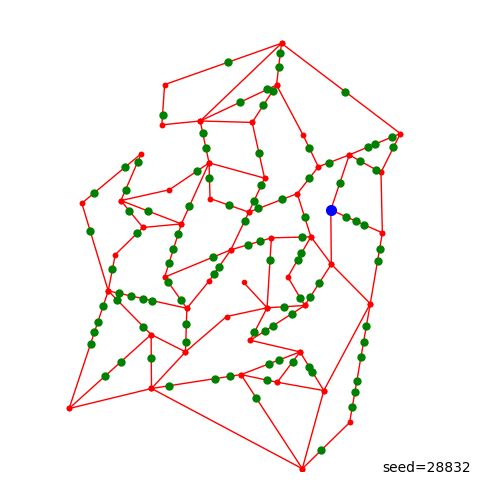

In [173]:
data = generateData(28832, p = 6, plot=True, log=True)

## Storing generated data into the pickle file

In [174]:
with open('dataSeed28832P6R40S45.pickled', 'wb') as f:
 pickle.dump(data, f)

## Loading data from the pickle file

In [175]:
with open('dataSeed28832P6R40S45.pickled', 'rb') as f:
    M, W, C, D = pickle.load(f)

## Simulation Outcome

Simulating delivery of 596 parcels over 22 days to 100 customers
[ 0] 08:28:50.7 Parcel:  0 arr at delivery centre
[ 0] 08:50:50.3 Parcel:  1 arr at delivery centre
[ 0] 08:59:17.9 Parcel:  2 arr at delivery centre
[ 0] 09:03:56.6 Parcel:  3 arr at delivery centre
[ 0] 09:15:02.6 Parcel:  4 arr at delivery centre
[ 0] 09:23:05.5 Parcel:  5 arr at delivery centre
[ 0] 09:46:50.1 Parcel:  6 arr at delivery centre
[ 0] 09:52:26.3 Parcel:  7 arr at delivery centre
[ 0] 10:02:28.5 Parcel:  8 arr at delivery centre
[ 0] 10:16:02.10 Parcel:  9 arr at delivery centre
[ 0] 10:53:03.6 Parcel: 10 arr at delivery centre
[ 0] 11:03:57.1 Parcel: 11 arr at delivery centre
[ 0] 11:09:05.1 Parcel: 12 arr at delivery centre
[ 0] 11:30:56.5 Parcel: 13 arr at delivery centre
[ 0] 11:45:52.6 Parcel: 14 arr at delivery centre
[ 0] 11:50:20.8 Parcel: 15 arr at delivery centre
[ 0] 12:27:38.1 Parcel: 16 arr at delivery centre
[ 0] 13:30:36.6 Parcel: 17 arr at delivery centre
[ 0] 13:56:22.5 Parcel: 18 arr at 

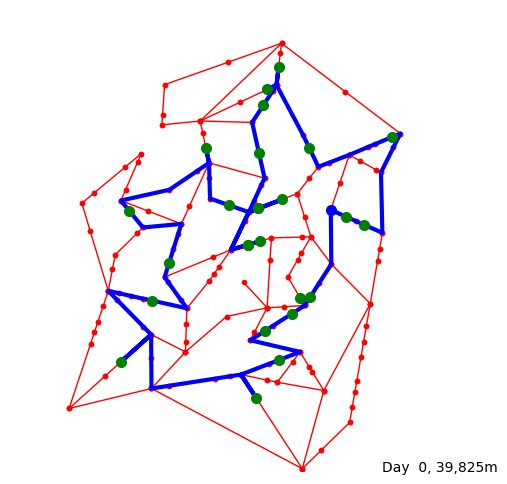

[ 0] 18:07:27.4 Parcel: 30 arr at delivery centre
[ 0] 18:25:00.0 Driver leaves for delivery of 30 parcels
[ 0] 18:25:00.0 Driver drives to Customer: 79 (7227, 5504)
[ 0] 18:25:28.7 Driver arrived at Customer: 79 (7227, 5504)
[ 0] 18:25:39.3 Customer: 79 (7227, 5504) answers door
[ 0] 18:25:39.3 Customer: 79 (7227, 5504) accepts Parcel: 17
[ 0] 18:25:53.7 Customer: 79 (7227, 5504) signs off
[ 0] 18:25:56.9 Driver drives to Customer: 93 (7622, 5327)
[ 0] 18:26:31.5 Driver arrived at Customer: 93 (7622, 5327)
[ 0] 18:29:16.9 Customer: 93 (7622, 5327) answers door
[ 0] 18:29:16.9 Customer: 93 (7622, 5327) accepts Parcel:  6
[ 0] 18:29:18.2 Customer: 93 (7622, 5327) signs off
[ 0] 18:29:39.7 Driver drives to Customer: 53 (8211, 7227)
[ 0] 18:33:29.0 Driver arrived at Customer: 53 (8211, 7227)
[ 0] 18:33:30.7 Customer: 53 (8211, 7227) answers door
[ 0] 18:33:30.7 Customer: 53 (8211, 7227) accepts Parcel:  2
[ 0] 18:33:33.6 Customer: 53 (8211, 7227) accepts Parcel: 11
[ 0] 18:33:41.1 Custome

[ 1] 09:41:16.0 Parcel: 37 arr at delivery centre
[ 1] 10:08:16.5 Parcel: 38 arr at delivery centre
[ 1] 10:25:22.6 Parcel: 39 arr at delivery centre
[ 1] 10:25:23.7 Parcel: 40 arr at delivery centre
[ 1] 10:35:56.6 Parcel: 41 arr at delivery centre
[ 1] 11:07:17.4 Parcel: 42 arr at delivery centre
[ 1] 11:11:37.5 Parcel: 43 arr at delivery centre
[ 1] 11:17:43.4 Parcel: 44 arr at delivery centre
[ 1] 11:49:24.6 Parcel: 45 arr at delivery centre
[ 1] 11:52:41.8 Parcel: 46 arr at delivery centre
[ 1] 12:05:41.5 Parcel: 47 arr at delivery centre
[ 1] 12:09:55.1 Parcel: 48 arr at delivery centre
[ 1] 13:03:03.6 Parcel: 49 arr at delivery centre
[ 1] 13:28:15.6 Parcel: 50 arr at delivery centre
[ 1] 13:37:28.3 Parcel: 51 arr at delivery centre
[ 1] 13:38:46.3 Parcel: 52 arr at delivery centre
[ 1] 13:44:45.1 Parcel: 53 arr at delivery centre
[ 1] 13:55:44.8 Parcel: 54 arr at delivery centre
[ 1] 14:37:36.9 Parcel: 55 arr at delivery centre
[ 1] 14:39:24.3 Parcel: 56 arr at delivery centre


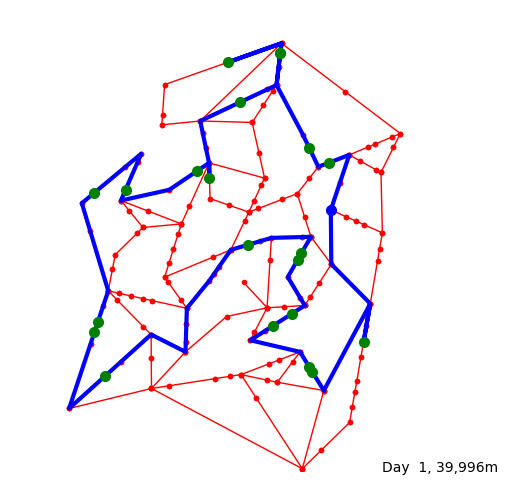

[ 1] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 1] 18:21:40.0 Driver drives to Customer: 16 (6857, 6672)
[ 1] 18:23:57.9 Driver arrived at Customer: 16 (6857, 6672)
[ 1] 18:25:28.9 Customer: 16 (6857, 6672) answers door
[ 1] 18:25:28.9 Customer: 16 (6857, 6672) accepts Parcel: 62
[ 1] 18:25:34.6 Customer: 16 (6857, 6672) signs off
[ 1] 18:25:40.6 Driver drives to Customer:  3 (6435, 6994)
[ 1] 18:26:36.2 Driver arrived at Customer:  3 (6435, 6994)
[ 1] 18:27:25.5 Customer:  3 (6435, 6994) answers door
[ 1] 18:27:25.5 Customer:  3 (6435, 6994) accepts Parcel: 54
[ 1] 18:27:32.9 Customer:  3 (6435, 6994) signs off
[ 1] 18:27:34.3 Driver drives to Customer: 15 (5813, 9044)
[ 1] 18:30:32.2 Driver arrived at Customer: 15 (5813, 9044)
[ 1] 18:32:08.7 Customer: 15 (5813, 9044) answers door
[ 1] 18:32:08.7 Customer: 15 (5813, 9044) accepts Parcel: 30
[ 1] 18:32:14.6 Customer: 15 (5813, 9044) signs off
[ 1] 18:32:30.2 Driver drives to Customer: 24 (4686, 8847)
[ 1] 18:34:25.3 Driver 

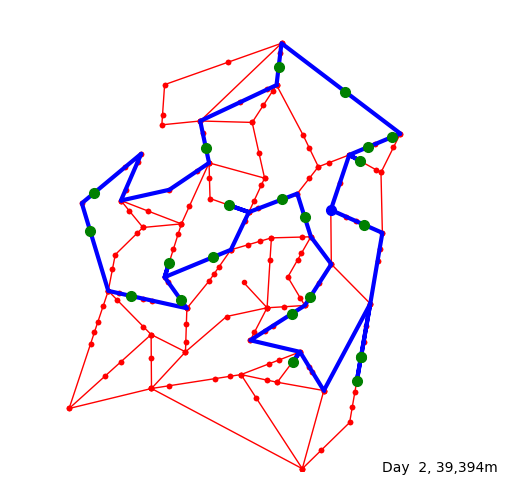

[ 2] 18:22:30.0 Driver leaves for delivery of 27 parcels
[ 2] 18:22:30.0 Driver drives to Customer: 22 (7528, 6712)
[ 2] 18:24:31.5 Driver arrived at Customer: 22 (7528, 6712)
[ 2] 18:25:16.2 Customer: 22 (7528, 6712) answers door
[ 2] 18:25:16.2 Customer: 22 (7528, 6712) accepts Parcel: 75
[ 2] 18:25:29.5 Customer: 22 (7528, 6712) signs off
[ 2] 18:25:33.2 Driver drives to Customer: 58 (7707, 7015)
[ 2] 18:26:30.0 Driver arrived at Customer: 58 (7707, 7015)
[ 2] 18:27:48.7 Customer: 58 (7707, 7015) answers door
[ 2] 18:27:48.7 Customer: 58 (7707, 7015) accepts Parcel: 56
[ 2] 18:27:51.6 Customer: 58 (7707, 7015) signs off
[ 2] 18:27:55.8 Driver drives to Customer: 53 (8211, 7227)
[ 2] 18:28:39.5 Driver arrived at Customer: 53 (8211, 7227)
[ 2] 18:29:29.4 Customer: 53 (8211, 7227) answers door
[ 2] 18:29:29.4 Customer: 53 (8211, 7227) accepts Parcel: 50
[ 2] 18:29:29.8 Customer: 53 (8211, 7227) signs off
[ 2] 18:29:57.0 Driver drives to Customer: 85 (7212, 8208)
[ 2] 18:32:11.10 Driver

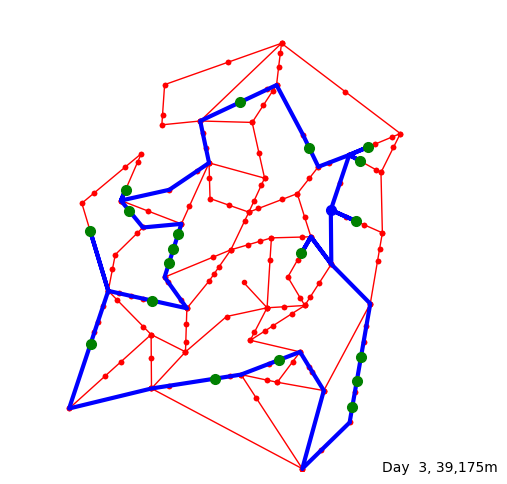

[ 3] 18:20:00.0 Driver leaves for delivery of 24 parcels
[ 3] 18:20:00.0 Driver drives to Customer: 73 (7436, 5411)
[ 3] 18:20:46.10 Driver arrived at Customer: 73 (7436, 5411)
[ 3] 18:21:00.5 Customer: 73 (7436, 5411) answers door
[ 3] 18:21:00.5 Customer: 73 (7436, 5411) accepts Parcel: 89
[ 3] 18:21:02.4 Customer: 73 (7436, 5411) signs off
[ 3] 18:21:18.10 Driver drives to Customer: 97 (6268, 4714)
[ 3] 18:25:11.6 Driver arrived at Customer: 97 (6268, 4714)
[ 3] 18:25:43.8 Customer: 97 (6268, 4714) answers door
[ 3] 18:25:43.8 Customer: 97 (6268, 4714) accepts Parcel: 97
[ 3] 18:25:47.8 Customer: 97 (6268, 4714) accepts Parcel: 99
[ 3] 18:25:56.6 Customer: 97 (6268, 4714) signs off
[ 3] 18:25:56.8 Driver drives to Customer: 77 (7546, 2458)
[ 3] 18:30:38.7 Driver arrived at Customer: 77 (7546, 2458)
[ 3] 18:30:44.3 Customer: 77 (7546, 2458) answers door
[ 3] 18:30:44.3 Customer: 77 (7546, 2458) accepts Parcel: 91
[ 3] 18:30:49.3 Customer: 77 (7546, 2458) accepts Parcel: 98
[ 3] 18:31

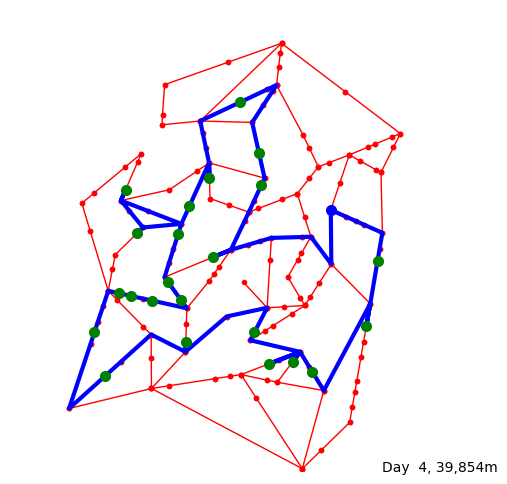

[ 4] 18:23:20.0 Driver leaves for delivery of 28 parcels
[ 4] 18:23:20.0 Driver drives to Customer: 30 (4374, 4632)
[ 4] 18:28:46.1 Driver arrived at Customer: 30 (4374, 4632)
[ 4] 18:28:47.1 Customer: 30 (4374, 4632) answers door
[ 4] 18:28:47.1 Customer: 30 (4374, 4632) accepts Parcel: 112
[ 4] 18:28:47.5 Customer: 30 (4374, 4632) accepts Parcel: 118
[ 4] 18:28:50.1 Customer: 30 (4374, 4632) signs off
[ 4] 18:29:00.7 Driver drives to Customer: 12 (5406, 6190)
[ 4] 18:31:37.0 Driver arrived at Customer: 12 (5406, 6190)
[ 4] 18:31:39.8 Customer: 12 (5406, 6190) answers door
[ 4] 18:31:39.8 Customer: 12 (5406, 6190) accepts Parcel: 124
[ 4] 18:31:40.4 Customer: 12 (5406, 6190) signs off
[ 4] 18:32:16.2 Driver drives to Customer:  5 (5352, 6892)
[ 4] 18:33:14.6 Driver arrived at Customer:  5 (5352, 6892)
[ 4] 18:33:36.6 Customer:  5 (5352, 6892) answers door
[ 4] 18:33:36.6 Customer:  5 (5352, 6892) accepts Parcel: 102
[ 4] 18:33:58.9 Customer:  5 (5352, 6892) signs off
[ 4] 18:34:01.3 D

[ 5] 13:42:40.2 Parcel: 155 arr at delivery centre
[ 5] 13:47:08.7 Parcel: 156 arr at delivery centre
[ 5] 14:01:13.6 Parcel: 157 arr at delivery centre
[ 5] 14:10:16.8 Parcel: 158 arr at delivery centre
[ 5] 14:13:15.5 Parcel: 159 arr at delivery centre
[ 5] 14:23:08.9 Parcel: 160 arr at delivery centre
[ 5] 18:00:00.0 Driver arrives for work
[ 5] 18:00:00.0 Parcel: 154 out for delivery
[ 5] 18:00:00.0 Parcel: 136 out for delivery
[ 5] 18:00:00.0 Parcel: 150 out for delivery
[ 5] 18:00:00.0 Parcel: 136 out for delivery
[ 5] 18:00:00.0 Parcel: 144 out for delivery
[ 5] 18:00:00.0 Parcel: 152 out for delivery
[ 5] 18:00:00.0 Parcel: 145 out for delivery
[ 5] 18:00:00.0 Parcel: 133 out for delivery
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 126 out for delivery
[ 5] 18:00:00.0 Parcel: 141 out for delivery
[ 5] 18:00:00.0 Parcel: 148 out for delivery
[ 5] 18:00:00.0 Parcel: 142 out for delivery
[ 5] 18:00:00.0 Parcel: 143 out for delivery
[ 5] 18:00:00.0 Parcel: 

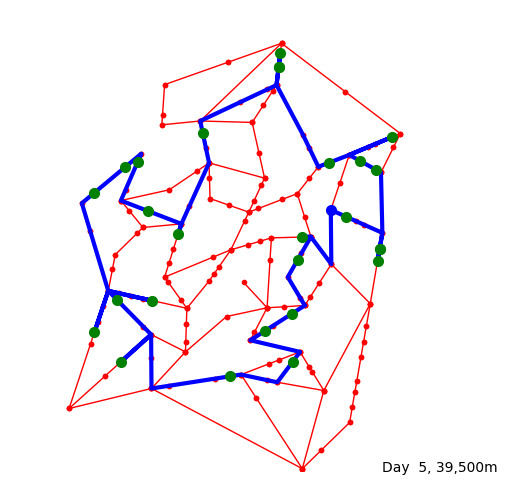

[ 5] 18:25:50.0 Driver leaves for delivery of 31 parcels
[ 5] 18:25:50.0 Driver drives to Customer: 79 (7227, 5504)
[ 5] 18:26:18.7 Driver arrived at Customer: 79 (7227, 5504)
[ 5] 18:26:43.1 Customer: 79 (7227, 5504) answers door
[ 5] 18:26:43.1 Customer: 79 (7227, 5504) accepts Parcel: 154
[ 5] 18:26:55.8 Customer: 79 (7227, 5504) signs off
[ 5] 18:27:01.0 Driver drives to Customer: 45 (7949, 4811)
[ 5] 18:28:37.3 Driver arrived at Customer: 45 (7949, 4811)
[ 5] 18:29:04.7 Customer: 45 (7949, 4811) answers door
[ 5] 18:29:04.7 Customer: 45 (7949, 4811) accepts Parcel: 136
[ 5] 18:29:04.9 Customer: 45 (7949, 4811) signs off
[ 5] 18:29:18.3 Driver drives to Customer: 20 (7904, 4546)
[ 5] 18:29:39.8 Driver arrived at Customer: 20 (7904, 4546)
[ 5] 18:29:41.2 Customer: 20 (7904, 4546) answers door
[ 5] 18:29:41.2 Customer: 20 (7904, 4546) accepts Parcel: 150
[ 5] 18:29:52.6 Customer: 20 (7904, 4546) signs off
[ 5] 18:30:01.3 Driver drives to Customer: 45 (7949, 4811)
[ 5] 18:30:22.8 Driv

[ 6] 09:13:04.2 Parcel: 166 arr at delivery centre
[ 6] 09:17:32.10 Parcel: 167 arr at delivery centre
[ 6] 09:30:17.9 Parcel: 168 arr at delivery centre
[ 6] 09:30:29.5 Parcel: 169 arr at delivery centre
[ 6] 09:51:28.2 Parcel: 170 arr at delivery centre
[ 6] 09:57:48.10 Parcel: 171 arr at delivery centre
[ 6] 09:58:32.5 Parcel: 172 arr at delivery centre
[ 6] 10:03:39.2 Parcel: 173 arr at delivery centre
[ 6] 10:07:54.6 Parcel: 174 arr at delivery centre
[ 6] 10:55:21.4 Parcel: 175 arr at delivery centre
[ 6] 11:02:05.3 Parcel: 176 arr at delivery centre
[ 6] 11:07:21.1 Parcel: 177 arr at delivery centre
[ 6] 11:14:15.1 Parcel: 178 arr at delivery centre
[ 6] 11:59:45.9 Parcel: 179 arr at delivery centre
[ 6] 12:15:20.2 Parcel: 180 arr at delivery centre
[ 6] 12:30:22.9 Parcel: 181 arr at delivery centre
[ 6] 12:49:52.6 Parcel: 182 arr at delivery centre
[ 6] 12:57:29.4 Parcel: 183 arr at delivery centre
[ 6] 13:05:47.2 Parcel: 184 arr at delivery centre
[ 6] 13:22:06.0 Parcel: 185 a

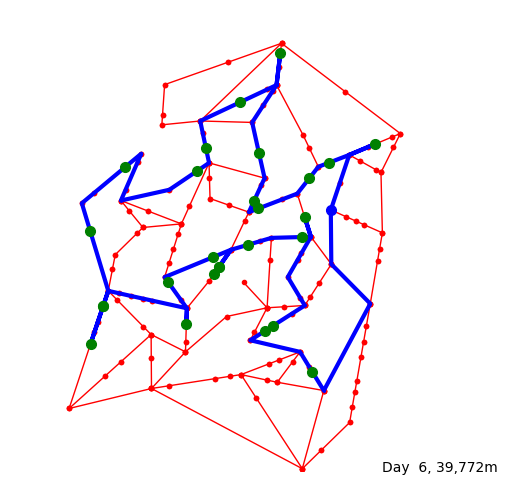

[ 6] 18:25:50.0 Driver leaves for delivery of 31 parcels
[ 6] 18:25:50.0 Driver drives to Customer: 14 (6502, 2145)
[ 6] 18:32:27.9 Driver arrived at Customer: 14 (6502, 2145)
[ 6] 18:32:49.1 Customer: 14 (6502, 2145) answers door
[ 6] 18:32:49.1 Customer: 14 (6502, 2145) accepts Parcel: 163
[ 6] 18:32:58.7 Customer: 14 (6502, 2145) signs off
[ 6] 18:33:14.10 Driver drives to Customer: 23 (5474, 3026)
[ 6] 18:35:52.4 Driver arrived at Customer: 23 (5474, 3026)
[ 6] 18:36:02.8 Customer: 23 (5474, 3026) answers door
[ 6] 18:36:02.8 Customer: 23 (5474, 3026) accepts Parcel: 178
[ 6] 18:36:02.9 Customer: 23 (5474, 3026) signs off
[ 6] 18:36:10.5 Driver drives to Customer: 29 (5661, 3147)
[ 6] 18:36:28.2 Driver arrived at Customer: 29 (5661, 3147)
[ 6] 18:38:21.7 Customer: 29 (5661, 3147) answers door
[ 6] 18:38:21.7 Customer: 29 (5661, 3147) accepts Parcel: 183
[ 6] 18:38:33.1 Customer: 29 (5661, 3147) signs off
[ 6] 18:38:43.0 Driver drives to Customer: 27 (6339, 5488)
[ 6] 18:42:39.9 Dri

[ 7] 08:53:36.6 Parcel: 194 arr at delivery centre
[ 7] 09:01:35.3 Parcel: 195 arr at delivery centre
[ 7] 09:20:20.9 Parcel: 196 arr at delivery centre
[ 7] 09:28:44.8 Parcel: 197 arr at delivery centre
[ 7] 09:45:34.3 Parcel: 198 arr at delivery centre
[ 7] 09:46:18.9 Parcel: 199 arr at delivery centre
[ 7] 09:55:27.2 Parcel: 200 arr at delivery centre
[ 7] 10:00:06.3 Parcel: 201 arr at delivery centre
[ 7] 10:02:45.9 Parcel: 202 arr at delivery centre
[ 7] 10:14:23.4 Parcel: 203 arr at delivery centre
[ 7] 10:24:44.8 Parcel: 204 arr at delivery centre
[ 7] 10:37:31.5 Parcel: 205 arr at delivery centre
[ 7] 10:59:21.7 Parcel: 206 arr at delivery centre
[ 7] 11:32:44.5 Parcel: 207 arr at delivery centre
[ 7] 11:43:19.2 Parcel: 208 arr at delivery centre
[ 7] 11:49:07.1 Parcel: 209 arr at delivery centre
[ 7] 11:58:52.2 Parcel: 210 arr at delivery centre
[ 7] 12:24:32.4 Parcel: 211 arr at delivery centre
[ 7] 12:56:46.8 Parcel: 212 arr at delivery centre
[ 7] 13:22:43.5 Parcel: 213 arr

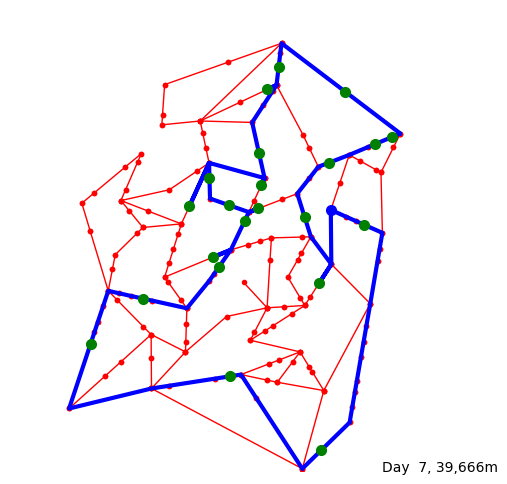

[ 7] 18:21:40.0 Driver leaves for delivery of 26 parcels
[ 7] 18:21:40.0 Driver drives to Customer: 28 (6650, 4070)
[ 7] 18:23:52.6 Driver arrived at Customer: 28 (6650, 4070)
[ 7] 18:25:52.1 Customer: 28 (6650, 4070) answers door
[ 7] 18:25:52.1 Customer: 28 (6650, 4070) accepts Parcel: 195
[ 7] 18:25:56.4 Customer: 28 (6650, 4070) signs off
[ 7] 18:26:05.2 Driver drives to Customer: 27 (6339, 5488)
[ 7] 18:28:17.7 Driver arrived at Customer: 27 (6339, 5488)
[ 7] 18:28:21.2 Customer: 27 (6339, 5488) answers door
[ 7] 18:28:21.2 Customer: 27 (6339, 5488) accepts Parcel: 200
[ 7] 18:28:29.4 Customer: 27 (6339, 5488) signs off
[ 7] 18:28:46.2 Driver drives to Customer: 16 (6857, 6672)
[ 7] 18:30:47.6 Driver arrived at Customer: 16 (6857, 6672)
[ 7] 18:30:56.6 Customer: 16 (6857, 6672) answers door
[ 7] 18:30:56.6 Customer: 16 (6857, 6672) accepts Parcel: 201
[ 7] 18:30:59.7 Customer: 16 (6857, 6672) accepts Parcel: 211
[ 7] 18:31:11.7 Customer: 16 (6857, 6672) accepts Parcel: 213
[ 7] 18

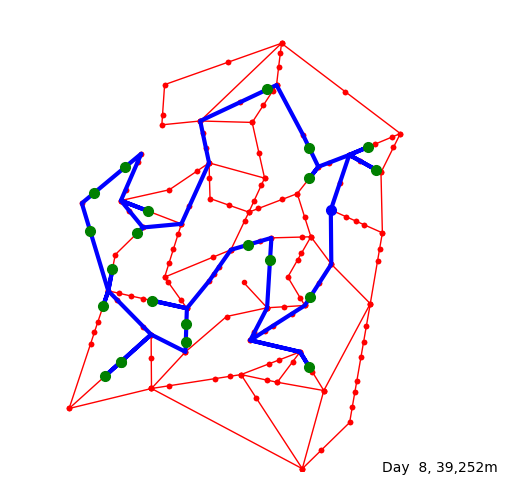

[ 8] 18:20:00.0 Driver leaves for delivery of 24 parcels
[ 8] 18:20:00.0 Driver drives to Customer: 72 (7870, 6521)
[ 8] 18:22:32.8 Driver arrived at Customer: 72 (7870, 6521)
[ 8] 18:23:37.7 Customer: 72 (7870, 6521) answers door
[ 8] 18:23:37.7 Customer: 72 (7870, 6521) accepts Parcel: 225
[ 8] 18:23:39.8 Customer: 72 (7870, 6521) accepts Parcel: 237
[ 8] 18:23:44.7 Customer: 72 (7870, 6521) signs off
[ 8] 18:23:49.1 Driver drives to Customer: 58 (7707, 7015)
[ 8] 18:25:17.2 Driver arrived at Customer: 58 (7707, 7015)
[ 8] 18:25:22.5 Customer: 58 (7707, 7015) answers door
[ 8] 18:25:22.5 Customer: 58 (7707, 7015) accepts Parcel: 233
[ 8] 18:25:26.8 Customer: 58 (7707, 7015) signs off
[ 8] 18:25:28.7 Driver drives to Customer:  9 (6438, 6337)
[ 8] 18:27:26.4 Driver arrived at Customer:  9 (6438, 6337)
[ 8] 18:28:04.7 Customer:  9 (6438, 6337) answers door
[ 8] 18:28:04.7 Customer:  9 (6438, 6337) accepts Parcel: 222
[ 8] 18:28:15.3 Customer:  9 (6438, 6337) signs off
[ 8] 18:28:15.4 D

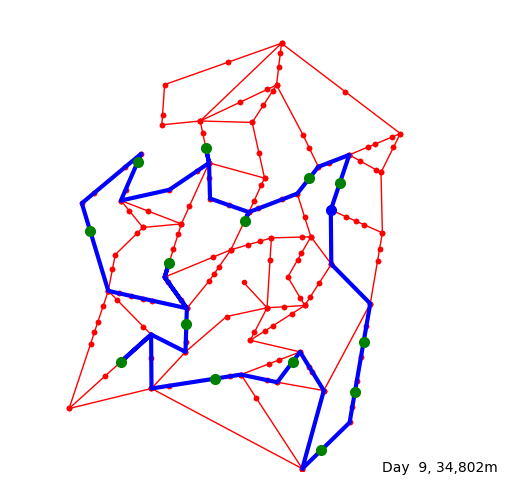

[ 9] 18:11:40.0 Driver leaves for delivery of 14 parcels
[ 9] 18:11:40.0 Driver drives to Customer:  8 (7603, 2787)
[ 9] 18:15:57.5 Driver arrived at Customer:  8 (7603, 2787)
[ 9] 18:16:35.3 Customer:  8 (7603, 2787) answers door
[ 9] 18:16:35.3 Customer:  8 (7603, 2787) accepts Parcel: 234
[ 9] 18:16:50.4 Customer:  8 (7603, 2787) signs off
[ 9] 18:17:01.6 Driver drives to Customer: 75 (7416, 1705)
[ 9] 18:18:29.3 Driver arrived at Customer: 75 (7416, 1705)
[ 9] 18:18:48.4 Customer: 75 (7416, 1705) answers door
[ 9] 18:18:48.4 Customer: 75 (7416, 1705) accepts Parcel: 242
[ 9] 18:18:48.7 Customer: 75 (7416, 1705) signs off
[ 9] 18:18:54.4 Driver drives to Customer: 95 (6687, 444)
[ 9] 18:20:56.6 Driver arrived at Customer: 95 (6687, 444)
[ 9] 18:22:34.5 Customer: 95 (6687, 444) answers door
[ 9] 18:22:34.5 Customer: 95 (6687, 444) accepts Parcel: 240
[ 9] 18:22:38.6 Customer: 95 (6687, 444) signs off
[ 9] 18:22:41.4 Driver drives to Customer: 52 (6082, 2369)
[ 9] 18:27:25.8 Driver ar

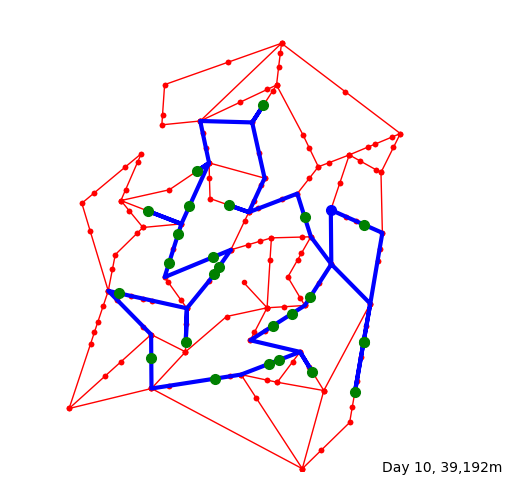

[10] 18:27:30.0 Driver leaves for delivery of 33 parcels
[10] 18:27:30.0 Driver drives to Customer: 93 (7622, 5327)
[10] 18:28:33.3 Driver arrived at Customer: 93 (7622, 5327)
[10] 18:29:54.10 Customer: 93 (7622, 5327) answers door
[10] 18:29:54.10 Customer: 93 (7622, 5327) accepts Parcel: 255
[10] 18:29:59.10 Customer: 93 (7622, 5327) signs off
[10] 18:30:25.8 Driver drives to Customer:  8 (7603, 2787)
[10] 18:34:11.6 Driver arrived at Customer:  8 (7603, 2787)
[10] 18:35:01.6 Customer:  8 (7603, 2787) answers door
[10] 18:35:01.6 Customer:  8 (7603, 2787) accepts Parcel: 270
[10] 18:35:10.9 Customer:  8 (7603, 2787) signs off
[10] 18:35:12.6 Driver drives to Customer: 75 (7416, 1705)
[10] 18:36:40.3 Driver arrived at Customer: 75 (7416, 1705)
[10] 18:36:56.10 Customer: 75 (7416, 1705) answers door
[10] 18:36:56.10 Customer: 75 (7416, 1705) accepts Parcel: 261
[10] 18:37:02.3 Customer: 75 (7416, 1705) accepts Parcel: 272
[10] 18:37:11.2 Customer: 75 (7416, 1705) accepts Parcel: 282
[1

[11] 08:36:43.5 Parcel: 289 arr at delivery centre
[11] 09:13:49.6 Parcel: 290 arr at delivery centre
[11] 09:23:47.2 Parcel: 291 arr at delivery centre
[11] 09:52:16.8 Parcel: 292 arr at delivery centre
[11] 10:50:15.1 Parcel: 293 arr at delivery centre
[11] 10:56:46.8 Parcel: 294 arr at delivery centre
[11] 11:06:53.5 Parcel: 295 arr at delivery centre
[11] 11:25:32.2 Parcel: 296 arr at delivery centre
[11] 11:34:09.4 Parcel: 297 arr at delivery centre
[11] 11:39:43.7 Parcel: 298 arr at delivery centre
[11] 12:00:18.2 Parcel: 299 arr at delivery centre
[11] 12:35:09.4 Parcel: 300 arr at delivery centre
[11] 13:14:15.2 Parcel: 301 arr at delivery centre
[11] 13:29:31.9 Parcel: 302 arr at delivery centre
[11] 13:36:49.9 Parcel: 303 arr at delivery centre
[11] 14:33:45.1 Parcel: 304 arr at delivery centre
[11] 14:49:32.5 Parcel: 305 arr at delivery centre
[11] 14:50:35.8 Parcel: 306 arr at delivery centre
[11] 14:51:58.1 Parcel: 307 arr at delivery centre
[11] 15:13:27.1 Parcel: 308 arr

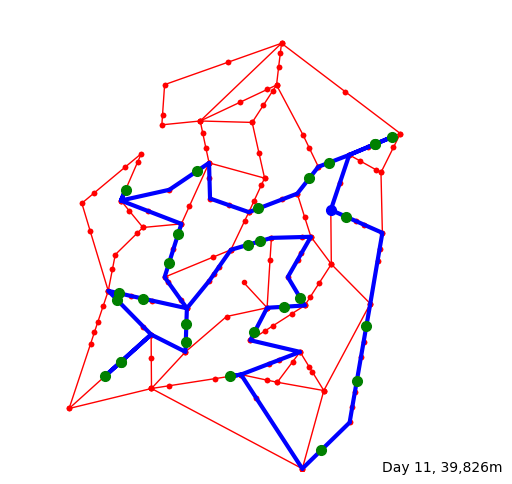

[11] 18:28:20.0 Driver leaves for delivery of 34 parcels
[11] 18:28:20.0 Driver drives to Customer: 21 (7852, 7076)
[11] 18:30:48.5 Driver arrived at Customer: 21 (7852, 7076)
[11] 18:31:29.8 Customer: 21 (7852, 7076) answers door
[11] 18:31:29.8 Customer: 21 (7852, 7076) accepts Parcel: 297
[11] 18:32:09.8 Customer: 21 (7852, 7076) signs off
[11] 18:32:11.0 Driver drives to Customer: 53 (8211, 7227)
[11] 18:32:42.1 Driver arrived at Customer: 53 (8211, 7227)
[11] 18:33:28.8 Customer: 53 (8211, 7227) answers door
[11] 18:33:28.8 Customer: 53 (8211, 7227) accepts Parcel: 314
[11] 18:33:38.3 Customer: 53 (8211, 7227) signs off
[11] 18:33:43.0 Driver drives to Customer: 21 (7852, 7076)
[11] 18:34:14.2 Driver arrived at Customer: 21 (7852, 7076)
[11] 18:35:17.2 Customer: 21 (7852, 7076) answers door
[11] 18:35:17.2 Customer: 21 (7852, 7076) accepts Parcel: 297
[11] 18:35:17.3 Customer: 21 (7852, 7076) signs off
[11] 18:35:39.6 Driver drives to Customer: 16 (6857, 6672)
[11] 18:37:05.4 Driv

[12] 08:44:36.8 Parcel: 324 arr at delivery centre
[12] 09:15:29.8 Parcel: 325 arr at delivery centre
[12] 09:34:15.10 Parcel: 326 arr at delivery centre
[12] 10:10:26.3 Parcel: 327 arr at delivery centre
[12] 10:19:45.1 Parcel: 328 arr at delivery centre
[12] 10:37:16.1 Parcel: 329 arr at delivery centre
[12] 10:39:13.9 Parcel: 330 arr at delivery centre
[12] 10:47:05.9 Parcel: 331 arr at delivery centre
[12] 10:50:41.9 Parcel: 332 arr at delivery centre
[12] 10:51:21.9 Parcel: 333 arr at delivery centre
[12] 11:37:11.4 Parcel: 334 arr at delivery centre
[12] 11:40:57.6 Parcel: 335 arr at delivery centre
[12] 11:43:24.8 Parcel: 336 arr at delivery centre
[12] 11:46:49.10 Parcel: 337 arr at delivery centre
[12] 11:54:11.7 Parcel: 338 arr at delivery centre
[12] 12:06:26.10 Parcel: 339 arr at delivery centre
[12] 12:08:59.6 Parcel: 340 arr at delivery centre
[12] 18:00:00.0 Driver arrives for work
[12] 18:00:00.0 Parcel: 333 out for delivery
[12] 18:00:00.0 Parcel: 318 out for delivery


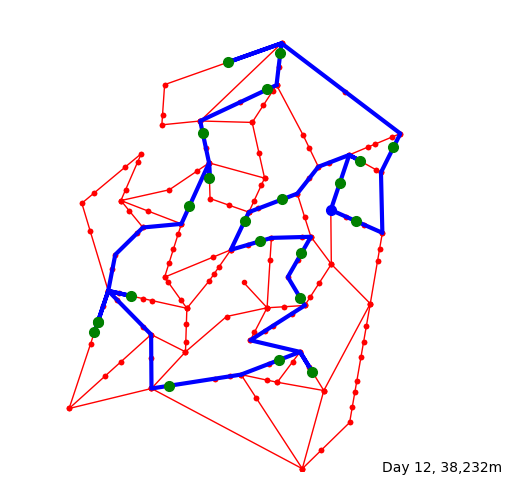

[12] 18:21:40.0 Driver leaves for delivery of 26 parcels
[12] 18:21:40.0 Driver drives to Customer:  7 (7092, 6231)
[12] 18:22:28.8 Driver arrived at Customer:  7 (7092, 6231)
[12] 18:22:45.5 Customer:  7 (7092, 6231) answers door
[12] 18:22:45.5 Customer:  7 (7092, 6231) accepts Parcel: 333
[12] 18:22:46.3 Customer:  7 (7092, 6231) signs off
[12] 18:22:54.8 Driver drives to Customer: 22 (7528, 6712)
[12] 18:24:07.5 Driver arrived at Customer: 22 (7528, 6712)
[12] 18:24:17.8 Customer: 22 (7528, 6712) answers door
[12] 18:24:17.8 Customer: 22 (7528, 6712) accepts Parcel: 318
[12] 18:24:22.4 Customer: 22 (7528, 6712) signs off
[12] 18:24:27.2 Driver drives to Customer:  0 (5854, 5879)
[12] 18:27:11.10 Driver arrived at Customer:  0 (5854, 5879)
[12] 18:28:08.7 Customer:  0 (5854, 5879) answers door
[12] 18:28:08.7 Customer:  0 (5854, 5879) accepts Parcel: 325
[12] 18:28:11.4 Customer:  0 (5854, 5879) accepts Parcel: 329
[12] 18:28:38.9 Customer:  0 (5854, 5879) signs off
[12] 18:28:52.4 

[13] 17:08:21.6 Parcel: 368 arr at delivery centre
[13] 17:09:43.9 Parcel: 369 arr at delivery centre
[13] 17:41:13.8 Parcel: 370 arr at delivery centre
[13] 18:00:00.0 Driver arrives for work
[13] 18:00:00.0 Parcel: 343 out for delivery
[13] 18:00:00.0 Parcel: 341 out for delivery
[13] 18:00:00.0 Parcel: 346 out for delivery
[13] 18:00:00.0 Parcel: 357 out for delivery
[13] 18:00:00.0 Parcel: 363 out for delivery
[13] 18:00:00.0 Parcel: 353 out for delivery
[13] 18:00:00.0 Parcel: 358 out for delivery
[13] 18:00:00.0 Parcel: 355 out for delivery
[13] 18:00:00.0 Parcel: 366 out for delivery
[13] 18:00:00.0 Parcel: 349 out for delivery
[13] 18:00:00.0 Parcel: 351 out for delivery
[13] 18:00:00.0 Parcel: 360 out for delivery
[13] 18:00:00.0 Parcel: 364 out for delivery
[13] 18:00:00.0 Parcel: 350 out for delivery
[13] 18:00:00.0 Parcel: 369 out for delivery
[13] 18:00:00.0 Parcel: 370 out for delivery
[13] 18:00:00.0 Parcel: 342 out for delivery
[13] 18:00:00.0 Parcel: 348 out for delive

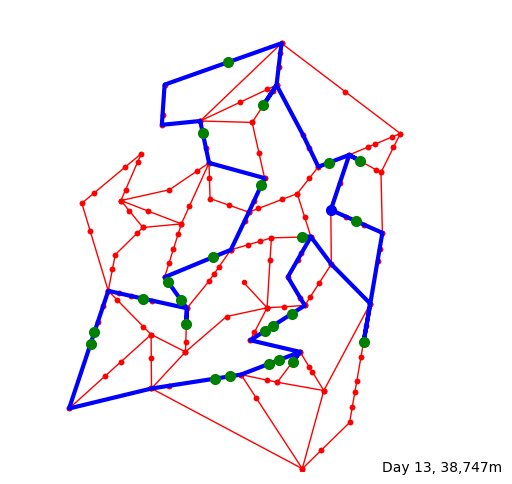

[13] 18:23:20.0 Driver leaves for delivery of 28 parcels
[13] 18:23:20.0 Driver drives to Customer: 73 (7436, 5411)
[13] 18:24:06.10 Driver arrived at Customer: 73 (7436, 5411)
[13] 18:24:15.9 Customer: 73 (7436, 5411) answers door
[13] 18:24:15.9 Customer: 73 (7436, 5411) accepts Parcel: 343
[13] 18:24:29.4 Customer: 73 (7436, 5411) signs off
[13] 18:24:31.6 Driver drives to Customer:  8 (7603, 2787)
[13] 18:28:33.7 Driver arrived at Customer:  8 (7603, 2787)
[13] 18:28:33.8 Customer:  8 (7603, 2787) answers door
[13] 18:28:33.8 Customer:  8 (7603, 2787) accepts Parcel: 341
[13] 18:28:56.5 Customer:  8 (7603, 2787) signs off
[13] 18:29:15.2 Driver drives to Customer: 61 (6282, 5064)
[13] 18:33:12.8 Driver arrived at Customer: 61 (6282, 5064)
[13] 18:33:15.6 Customer: 61 (6282, 5064) answers door
[13] 18:33:15.6 Customer: 61 (6282, 5064) accepts Parcel: 346
[13] 18:33:17.5 Customer: 61 (6282, 5064) signs off
[13] 18:33:20.2 Driver drives to Customer: 13 (6067, 3408)
[13] 18:36:18.6 Dri

[14] 12:11:39.2 Parcel: 387 arr at delivery centre
[14] 13:23:53.8 Parcel: 388 arr at delivery centre
[14] 13:45:12.1 Parcel: 389 arr at delivery centre
[14] 14:21:49.4 Parcel: 390 arr at delivery centre
[14] 14:25:24.1 Parcel: 391 arr at delivery centre
[14] 14:37:17.2 Parcel: 392 arr at delivery centre
[14] 14:51:26.3 Parcel: 393 arr at delivery centre
[14] 15:18:31.3 Parcel: 394 arr at delivery centre
[14] 15:28:43.6 Parcel: 395 arr at delivery centre
[14] 15:52:59.9 Parcel: 396 arr at delivery centre
[14] 18:00:00.0 Driver arrives for work
[14] 18:00:00.0 Parcel: 385 out for delivery
[14] 18:00:00.0 Parcel: 394 out for delivery
[14] 18:00:00.0 Parcel: 381 out for delivery
[14] 18:00:00.0 Parcel: 368 out for delivery
[14] 18:00:00.0 Parcel: 378 out for delivery
[14] 18:00:00.0 Parcel: 386 out for delivery
[14] 18:00:00.0 Parcel: 375 out for delivery
[14] 18:00:00.0 Parcel: 388 out for delivery
[14] 18:00:00.0 Parcel: 390 out for delivery
[14] 18:00:00.0 Parcel: 367 out for delivery


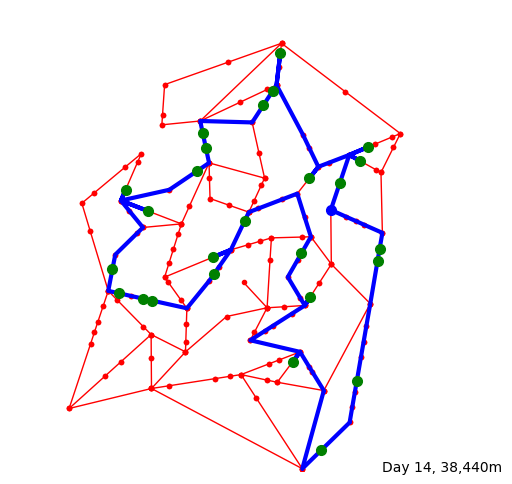

[14] 18:23:20.0 Driver leaves for delivery of 28 parcels
[14] 18:23:20.0 Driver drives to Customer: 45 (7949, 4811)
[14] 18:25:24.10 Driver arrived at Customer: 45 (7949, 4811)
[14] 18:26:30.4 Customer: 45 (7949, 4811) answers door
[14] 18:26:30.4 Customer: 45 (7949, 4811) accepts Parcel: 385
[14] 18:26:44.9 Customer: 45 (7949, 4811) signs off
[14] 18:26:51.2 Driver drives to Customer: 20 (7904, 4546)
[14] 18:27:12.7 Driver arrived at Customer: 20 (7904, 4546)
[14] 18:27:57.10 Customer: 20 (7904, 4546) answers door
[14] 18:27:57.10 Customer: 20 (7904, 4546) accepts Parcel: 394
[14] 18:28:03.3 Customer: 20 (7904, 4546) signs off
[14] 18:28:05.4 Driver drives to Customer: 41 (7458, 1945)
[14] 18:31:36.4 Driver arrived at Customer: 41 (7458, 1945)
[14] 18:31:56.2 Customer: 41 (7458, 1945) answers door
[14] 18:31:56.2 Customer: 41 (7458, 1945) accepts Parcel: 381
[14] 18:32:11.7 Customer: 41 (7458, 1945) signs off
[14] 18:32:27.8 Driver drives to Customer: 95 (6687, 444)
[14] 18:34:49.4 Dr

[15] 09:46:19.9 Parcel: 404 arr at delivery centre
[15] 09:50:52.10 Parcel: 405 arr at delivery centre
[15] 09:51:56.1 Parcel: 406 arr at delivery centre
[15] 10:22:24.2 Parcel: 407 arr at delivery centre
[15] 11:06:48.1 Parcel: 408 arr at delivery centre
[15] 11:12:23.6 Parcel: 409 arr at delivery centre
[15] 11:20:31.4 Parcel: 410 arr at delivery centre
[15] 11:46:16.4 Parcel: 411 arr at delivery centre
[15] 11:47:16.2 Parcel: 412 arr at delivery centre
[15] 12:03:09.1 Parcel: 413 arr at delivery centre
[15] 12:05:15.8 Parcel: 414 arr at delivery centre
[15] 12:10:30.6 Parcel: 415 arr at delivery centre
[15] 12:37:58.6 Parcel: 416 arr at delivery centre
[15] 12:38:51.7 Parcel: 417 arr at delivery centre
[15] 12:39:25.7 Parcel: 418 arr at delivery centre
[15] 12:47:49.0 Parcel: 419 arr at delivery centre
[15] 12:58:18.7 Parcel: 420 arr at delivery centre
[15] 13:29:09.9 Parcel: 421 arr at delivery centre
[15] 13:48:44.7 Parcel: 422 arr at delivery centre
[15] 14:06:06.0 Parcel: 423 ar

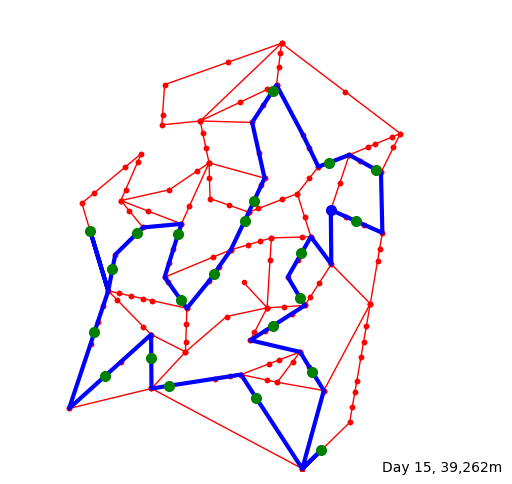

[15] 18:20:50.0 Driver leaves for delivery of 25 parcels
[15] 18:20:50.0 Driver drives to Customer: 97 (6268, 4714)
[15] 18:23:55.7 Driver arrived at Customer: 97 (6268, 4714)
[15] 18:24:52.3 Customer: 97 (6268, 4714) answers door
[15] 18:24:52.3 Customer: 97 (6268, 4714) accepts Parcel: 410
[15] 18:24:56.0 Customer: 97 (6268, 4714) signs off
[15] 18:25:09.7 Driver drives to Customer: 56 (6245, 3741)
[15] 18:26:39.6 Driver arrived at Customer: 56 (6245, 3741)
[15] 18:27:37.10 Customer: 56 (6245, 3741) answers door
[15] 18:27:37.10 Customer: 56 (6245, 3741) accepts Parcel: 401
[15] 18:27:40.7 Customer: 56 (6245, 3741) signs off
[15] 18:28:15.1 Driver drives to Customer: 29 (5661, 3147)
[15] 18:29:34.3 Driver arrived at Customer: 29 (5661, 3147)
[15] 18:29:35.4 Customer: 29 (5661, 3147) answers door
[15] 18:29:35.4 Customer: 29 (5661, 3147) accepts Parcel: 407
[15] 18:29:55.4 Customer: 29 (5661, 3147) signs off
[15] 18:30:02.5 Driver drives to Customer: 14 (6502, 2145)
[15] 18:32:57.7 Dr

[16] 18:00:00.0 Driver arrives for work
[16] 18:00:00.0 Parcel: 432 out for delivery
[16] 18:00:00.0 Parcel: 435 out for delivery
[16] 18:00:00.0 Parcel: 428 out for delivery
[16] 18:00:00.0 Parcel: 439 out for delivery
[16] 18:00:00.0 Parcel: 440 out for delivery
[16] 18:00:00.0 Parcel: 448 out for delivery
[16] 18:00:00.0 Parcel: 431 out for delivery
[16] 18:00:00.0 Parcel: 434 out for delivery
[16] 18:00:00.0 Parcel: 425 out for delivery
[16] 18:00:00.0 Parcel: 444 out for delivery
[16] 18:00:00.0 Parcel: 430 out for delivery
[16] 18:00:00.0 Parcel: 436 out for delivery
[16] 18:00:00.0 Parcel: 429 out for delivery
[16] 18:00:00.0 Parcel: 449 out for delivery
[16] 18:00:00.0 Parcel: 442 out for delivery
[16] 18:00:00.0 Parcel: 441 out for delivery
[16] 18:00:00.0 Parcel: 445 out for delivery
[16] 18:00:00.0 Parcel: 450 out for delivery
[16] 18:00:00.0 Parcel: 426 out for delivery
[16] 18:00:00.0 Parcel: 424 out for delivery
[16] 18:00:00.0 Parcel: 433 out for delivery
[16] 18:00:00.0

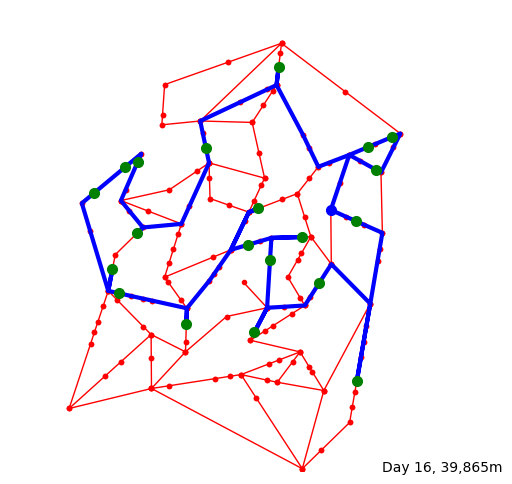

[16] 18:24:10.0 Driver leaves for delivery of 29 parcels
[16] 18:24:10.0 Driver drives to Customer: 73 (7436, 5411)
[16] 18:24:56.10 Driver arrived at Customer: 73 (7436, 5411)
[16] 18:28:33.6 Customer: 73 (7436, 5411) answers door
[16] 18:28:33.6 Customer: 73 (7436, 5411) accepts Parcel: 432
[16] 18:28:45.4 Customer: 73 (7436, 5411) accepts Parcel: 435
[16] 18:29:18.1 Customer: 73 (7436, 5411) signs off
[16] 18:29:23.2 Driver drives to Customer: 41 (7458, 1945)
[16] 18:34:33.6 Driver arrived at Customer: 41 (7458, 1945)
[16] 18:35:11.1 Customer: 41 (7458, 1945) answers door
[16] 18:35:11.1 Customer: 41 (7458, 1945) accepts Parcel: 428
[16] 18:35:24.8 Customer: 41 (7458, 1945) accepts Parcel: 439
[16] 18:35:29.1 Customer: 41 (7458, 1945) signs off
[16] 18:35:32.2 Driver drives to Customer: 28 (6650, 4070)
[16] 18:40:02.5 Driver arrived at Customer: 28 (6650, 4070)
[16] 18:42:26.8 Customer: 28 (6650, 4070) answers door
[16] 18:42:26.8 Customer: 28 (6650, 4070) accepts Parcel: 440
[16] 1

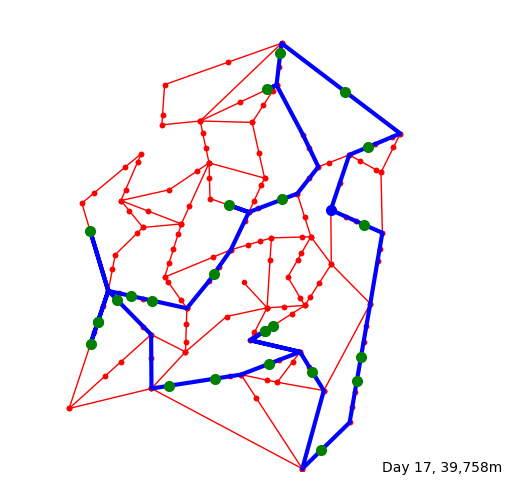

[17] 18:23:20.0 Driver leaves for delivery of 28 parcels
[17] 18:23:20.0 Driver drives to Customer: 58 (7707, 7015)
[17] 18:25:35.9 Driver arrived at Customer: 58 (7707, 7015)
[17] 18:26:41.9 Customer: 58 (7707, 7015) answers door
[17] 18:26:41.9 Customer: 58 (7707, 7015) accepts Parcel: 469
[17] 18:26:46.8 Customer: 58 (7707, 7015) signs off
[17] 18:26:49.5 Driver drives to Customer: 85 (7212, 8208)
[17] 18:29:48.1 Driver arrived at Customer: 85 (7212, 8208)
[17] 18:30:02.9 Customer: 85 (7212, 8208) answers door
[17] 18:30:02.9 Customer: 85 (7212, 8208) accepts Parcel: 466
[17] 18:30:20.3 Customer: 85 (7212, 8208) signs off
[17] 18:30:43.7 Driver drives to Customer: 15 (5813, 9044)
[17] 18:33:19.2 Driver arrived at Customer: 15 (5813, 9044)
[17] 18:35:28.2 Customer: 15 (5813, 9044) answers door
[17] 18:35:28.2 Customer: 15 (5813, 9044) accepts Parcel: 465
[17] 18:35:28.4 Customer: 15 (5813, 9044) signs off
[17] 18:35:42.4 Driver drives to Customer: 78 (5534, 8260)
[17] 18:36:55.4 Driv

[18] 11:12:31.4 Parcel: 492 arr at delivery centre
[18] 11:12:59.9 Parcel: 493 arr at delivery centre
[18] 11:52:00.10 Parcel: 494 arr at delivery centre
[18] 12:42:48.9 Parcel: 495 arr at delivery centre
[18] 13:02:41.5 Parcel: 496 arr at delivery centre
[18] 13:03:57.6 Parcel: 497 arr at delivery centre
[18] 13:05:05.4 Parcel: 498 arr at delivery centre
[18] 13:11:59.5 Parcel: 499 arr at delivery centre
[18] 13:12:27.2 Parcel: 500 arr at delivery centre
[18] 13:19:04.9 Parcel: 501 arr at delivery centre
[18] 13:19:14.2 Parcel: 502 arr at delivery centre
[18] 14:16:00.8 Parcel: 503 arr at delivery centre
[18] 14:42:30.8 Parcel: 504 arr at delivery centre
[18] 14:43:38.8 Parcel: 505 arr at delivery centre
[18] 15:18:21.5 Parcel: 506 arr at delivery centre
[18] 15:21:58.4 Parcel: 507 arr at delivery centre
[18] 15:25:31.6 Parcel: 508 arr at delivery centre
[18] 15:42:53.5 Parcel: 509 arr at delivery centre
[18] 16:26:03.10 Parcel: 510 arr at delivery centre
[18] 16:28:06.3 Parcel: 511 a

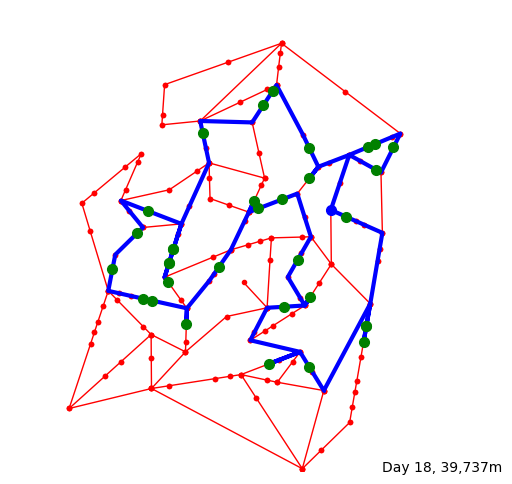

[18] 18:33:20.0 Driver leaves for delivery of 40 parcels
[18] 18:33:20.0 Driver drives to Customer: 58 (7707, 7015)
[18] 18:35:35.9 Driver arrived at Customer: 58 (7707, 7015)
[18] 18:35:41.7 Customer: 58 (7707, 7015) answers door
[18] 18:35:41.7 Customer: 58 (7707, 7015) accepts Parcel: 492
[18] 18:35:51.6 Customer: 58 (7707, 7015) signs off
[18] 18:35:58.7 Driver drives to Customer: 21 (7852, 7076)
[18] 18:36:11.2 Driver arrived at Customer: 21 (7852, 7076)
[18] 18:36:11.8 Customer: 21 (7852, 7076) answers door
[18] 18:36:11.8 Customer: 21 (7852, 7076) accepts Parcel: 506
[18] 18:36:13.4 Customer: 21 (7852, 7076) signs off
[18] 18:36:24.4 Driver drives to Customer: 63 (8247, 7006)
[18] 18:37:37.10 Driver arrived at Customer: 63 (8247, 7006)
[18] 18:37:56.3 Customer: 63 (8247, 7006) answers door
[18] 18:37:56.3 Customer: 63 (8247, 7006) accepts Parcel: 504
[18] 18:38:29.4 Customer: 63 (8247, 7006) accepts Parcel: 514
[18] 18:38:36.4 Customer: 63 (8247, 7006) signs off
[18] 18:38:48.0 

[19] 08:47:59.7 Parcel: 517 arr at delivery centre
[19] 08:49:50.6 Parcel: 518 arr at delivery centre
[19] 08:56:23.4 Parcel: 519 arr at delivery centre
[19] 09:45:58.5 Parcel: 520 arr at delivery centre
[19] 09:48:08.2 Parcel: 521 arr at delivery centre
[19] 10:40:47.9 Parcel: 522 arr at delivery centre
[19] 10:47:46.3 Parcel: 523 arr at delivery centre
[19] 10:57:42.8 Parcel: 524 arr at delivery centre
[19] 11:03:04.8 Parcel: 525 arr at delivery centre
[19] 11:45:58.3 Parcel: 526 arr at delivery centre
[19] 12:35:10.4 Parcel: 527 arr at delivery centre
[19] 12:50:50.2 Parcel: 528 arr at delivery centre
[19] 12:53:59.4 Parcel: 529 arr at delivery centre
[19] 14:10:48.5 Parcel: 530 arr at delivery centre
[19] 14:12:29.2 Parcel: 531 arr at delivery centre
[19] 14:25:57.10 Parcel: 532 arr at delivery centre
[19] 14:28:36.2 Parcel: 533 arr at delivery centre
[19] 15:03:56.7 Parcel: 534 arr at delivery centre
[19] 15:49:06.2 Parcel: 535 arr at delivery centre
[19] 16:14:23.9 Parcel: 536 ar

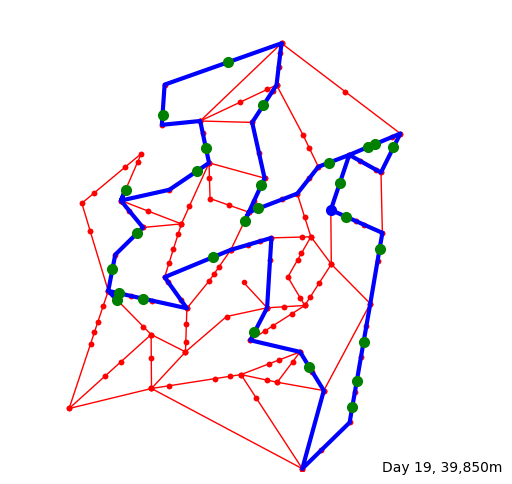

[19] 18:26:40.0 Driver leaves for delivery of 32 parcels
[19] 18:26:40.0 Driver drives to Customer: 79 (7227, 5504)
[19] 18:27:08.7 Driver arrived at Customer: 79 (7227, 5504)
[19] 18:27:25.3 Customer: 79 (7227, 5504) answers door
[19] 18:27:25.3 Customer: 79 (7227, 5504) accepts Parcel: 515
[19] 18:27:26.8 Customer: 79 (7227, 5504) signs off
[19] 18:28:05.4 Driver drives to Customer: 45 (7949, 4811)
[19] 18:29:41.6 Driver arrived at Customer: 45 (7949, 4811)
[19] 18:30:24.5 Customer: 45 (7949, 4811) answers door
[19] 18:30:24.5 Customer: 45 (7949, 4811) accepts Parcel: 526
[19] 18:30:27.7 Customer: 45 (7949, 4811) signs off
[19] 18:31:05.4 Driver drives to Customer:  8 (7603, 2787)
[19] 18:33:49.6 Driver arrived at Customer:  8 (7603, 2787)
[19] 18:34:27.1 Customer:  8 (7603, 2787) answers door
[19] 18:34:27.1 Customer:  8 (7603, 2787) accepts Parcel: 528
[19] 18:34:31.1 Customer:  8 (7603, 2787) signs off
[19] 18:34:53.8 Driver drives to Customer: 41 (7458, 1945)
[19] 18:36:02.0 Driv

[20] 08:22:02.1 Parcel: 548 arr at delivery centre
[20] 08:42:58.3 Parcel: 549 arr at delivery centre
[20] 08:45:21.1 Parcel: 550 arr at delivery centre
[20] 08:53:51.3 Parcel: 551 arr at delivery centre
[20] 09:09:33.8 Parcel: 552 arr at delivery centre
[20] 09:10:55.10 Parcel: 553 arr at delivery centre
[20] 09:20:03.4 Parcel: 554 arr at delivery centre
[20] 09:27:12.1 Parcel: 555 arr at delivery centre
[20] 10:13:19.1 Parcel: 556 arr at delivery centre
[20] 10:14:14.5 Parcel: 557 arr at delivery centre
[20] 10:22:23.1 Parcel: 558 arr at delivery centre
[20] 10:30:45.4 Parcel: 559 arr at delivery centre
[20] 10:50:57.1 Parcel: 560 arr at delivery centre
[20] 10:56:56.8 Parcel: 561 arr at delivery centre
[20] 11:00:28.10 Parcel: 562 arr at delivery centre
[20] 11:05:51.9 Parcel: 563 arr at delivery centre
[20] 11:15:43.10 Parcel: 564 arr at delivery centre
[20] 12:02:15.6 Parcel: 565 arr at delivery centre
[20] 12:26:56.6 Parcel: 566 arr at delivery centre
[20] 12:31:58.3 Parcel: 567 

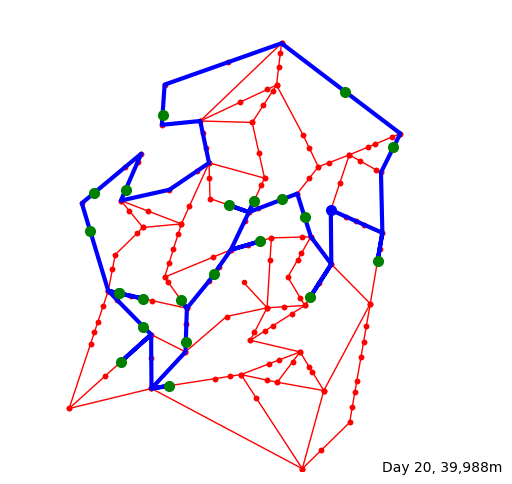

[20] 18:20:50.0 Driver leaves for delivery of 25 parcels
[20] 18:20:50.0 Driver drives to Customer: 20 (7904, 4546)
[20] 18:23:16.4 Driver arrived at Customer: 20 (7904, 4546)
[20] 18:25:07.8 Customer: 20 (7904, 4546) answers door
[20] 18:25:07.8 Customer: 20 (7904, 4546) accepts Parcel: 547
[20] 18:25:09.0 Customer: 20 (7904, 4546) accepts Parcel: 554
[20] 18:25:13.1 Customer: 20 (7904, 4546) signs off
[20] 18:25:26.6 Driver drives to Customer: 63 (8247, 7006)
[20] 18:28:48.10 Driver arrived at Customer: 63 (8247, 7006)
[20] 18:29:04.6 Customer: 63 (8247, 7006) answers door
[20] 18:29:04.6 Customer: 63 (8247, 7006) accepts Parcel: 552
[20] 18:29:06.1 Customer: 63 (8247, 7006) signs off
[20] 18:29:14.8 Driver drives to Customer: 85 (7212, 8208)
[20] 18:31:40.4 Driver arrived at Customer: 85 (7212, 8208)
[20] 18:31:42.10 Customer: 85 (7212, 8208) answers door
[20] 18:31:42.10 Customer: 85 (7212, 8208) accepts Parcel: 562
[20] 18:31:47.6 Customer: 85 (7212, 8208) signs off
[20] 18:31:50.

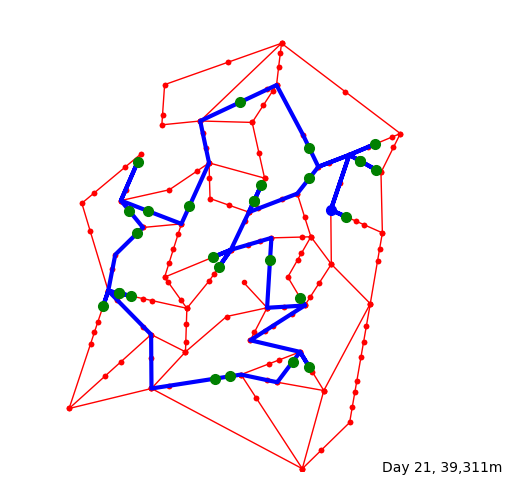

[21] 18:24:10.0 Driver leaves for delivery of 29 parcels
[21] 18:24:10.0 Driver drives to Customer: 22 (7528, 6712)
[21] 18:26:11.5 Driver arrived at Customer: 22 (7528, 6712)
[21] 18:26:57.5 Customer: 22 (7528, 6712) answers door
[21] 18:26:57.5 Customer: 22 (7528, 6712) accepts Parcel: 577
[21] 18:27:16.3 Customer: 22 (7528, 6712) signs off
[21] 18:27:31.7 Driver drives to Customer: 72 (7870, 6521)
[21] 18:28:02.9 Driver arrived at Customer: 72 (7870, 6521)
[21] 18:28:09.9 Customer: 72 (7870, 6521) answers door
[21] 18:28:09.9 Customer: 72 (7870, 6521) accepts Parcel: 583
[21] 18:28:10.4 Customer: 72 (7870, 6521) signs off
[21] 18:28:23.8 Driver drives to Customer: 22 (7528, 6712)
[21] 18:28:55.1 Driver arrived at Customer: 22 (7528, 6712)
[21] 18:29:24.10 Customer: 22 (7528, 6712) answers door
[21] 18:29:24.10 Customer: 22 (7528, 6712) accepts Parcel: 577
[21] 18:30:26.4 Customer: 22 (7528, 6712) signs off
[21] 18:30:28.3 Driver drives to Customer: 21 (7852, 7076)
[21] 18:31:37.6 Dr

In [176]:
random.seed(0)
recP6R40S45 = simulation(M, W, C, D, log=True, plot=True)

## Statistics and Visualisations

In [177]:
standardMeasureConverter(recP6R40S45.daily)

### Simulation Records

In [178]:
recP6R40S45.daily

,begin,end,Delivery Route Distance(in km),Working Time (in minutes),Number of left over parcels,Delay Time(in days)
0,64800,71643,39.825,114.05,3,NaN
1,151200,157555,39.996,105.916667,10,1.449603
2,237600,243863,39.394,104.383333,3,1.22609
3,324000,329926,39.175,98.766667,1,1.313657
4,410400,416854,39.854,107.566667,3,1.122072
5,496800,504236,39.5,123.933333,1,1.199552
6,583200,590074,39.772,114.566667,3,1.180752
7,669600,676024,39.666,107.066667,6,1.23723
8,756000,762124,39.252,102.066667,1,1.242542
9,842400,847312,34.802,81.866667,0,1.287072


### Time Plot

In [179]:
np.mean(recP6R40S45.daily['Working Time (in minutes)'])

110.67348484848482

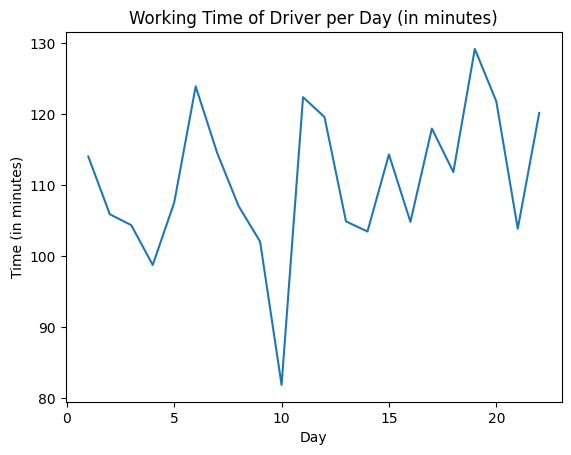

In [180]:
timePlot = plt.plot(recP6R40S45.daily.index +1 ,recP6R40S45.daily['Working Time (in minutes)'])
plt.title('Working Time of Driver per Day (in minutes)')
plt.xlabel('Day')
plt.ylabel('Time (in minutes)')
plt.show()

### Distance Plot

In [181]:
np.mean(recP6R40S45.daily['Delivery Route Distance(in km)'])

39.24745454545455

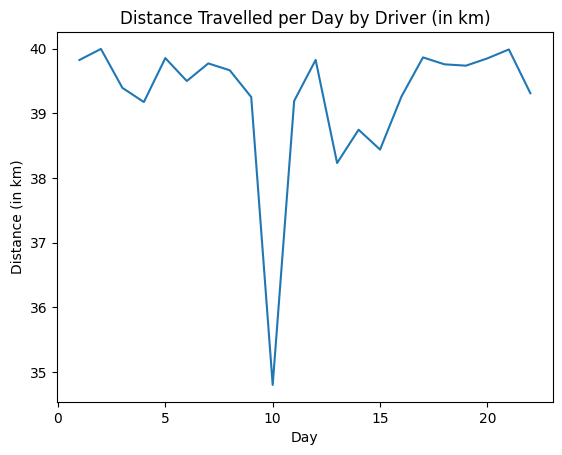

In [182]:
distancePlot = plt.plot(recP6R40S45.daily.index +1 ,recP6R40S45.daily['Delivery Route Distance(in km)'])
plt.title('Distance Travelled per Day by Driver (in km)')
plt.xlabel('Day')
plt.ylabel('Distance (in km)')
plt.show()

### Left Over Plot

In [183]:
np.mean(recP6R40S45.daily['Number of left over parcels'])

2.3636363636363638

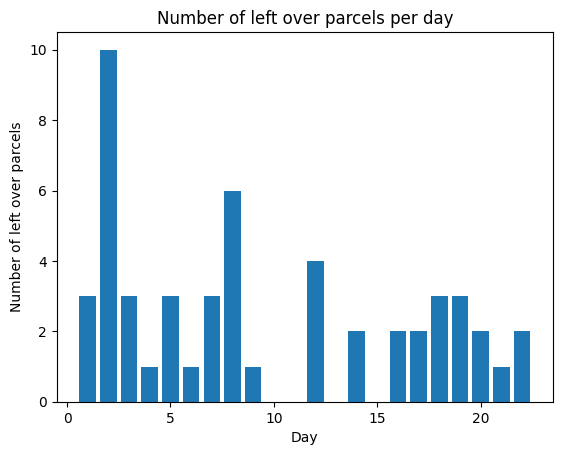

In [184]:
leftOverPlot = plt.bar(recP6R40S45.daily.index +1 ,recP6R40S45.daily['Number of left over parcels'])
plt.title('Number of left over parcels per day')
plt.xlabel('Day')
plt.ylabel('Number of left over parcels')
plt.show()

### Delay Plot

In [185]:
np.mean(recP6R40S45.daily['Delay Time(in days)'])

1.2363510121641248

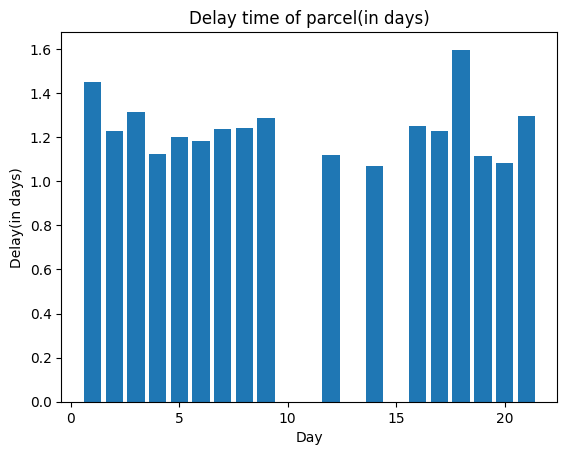

In [186]:
delayPlot = plt.bar(recP6R40S45.daily.index ,recP6R40S45.daily['Delay Time(in days)'])
plt.title('Delay time of parcel(in days)')
plt.xlabel('Day')
plt.ylabel('Delay(in days)')
plt.show()